# Inferring personal attributes from purchases data

Experiments 

This is a binary classification task.

The goal of this analysis is not to develop optimized models. It is instead to evaluate whether risks are present by using simple models and our dataset, which is small in comparison to the wealth of data the larger platforms have access to.

In [1]:
import datetime

from IPython.display import display
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Models etc
from sklearn.model_selection import cross_val_score, RepeatedStratifiedKFold, train_test_split
from sklearn.metrics import confusion_matrix,  ConfusionMatrixDisplay
from sklearn.pipeline import Pipeline
from sklearn.decomposition import TruncatedSVD
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression
from sklearn import svm


# For Amazon data, make easier to access col names by defining here
RESPONSE_ID = 'Survey ResponseID'
DATE = 'Order Date'
UNIT_PRICE = 'Purchase Price Per Unit'
QUANTITY = 'Quantity'
STATE = 'Shipping Address State'
TITLE = 'Title'
PRODUCT_CODE = 'ASIN/ISBN (Product Code)'
CATEGORY = 'Category'

# column names specific to this notebook are lowercase
TOTAL_SPEND = 'spend' # unit price x quantity
PURCHASES = 'purchases'
PURCHASERS = 'purchasers'

YYYY_MM = 'yyyy-mm'
YEAR = 'year'

# use a consistent random state to reproduce outputs in the models
RANDOM = 0

## Amazon data

Read in Amazon data.

In [3]:
amzn_data_fpath = '../../data/amazon-data/amazon-data-cleaned.csv'
amzn_data = pd.read_csv(amzn_data_fpath, parse_dates=['Order Date'])
# convert NaNs in string columns to strings to avoid losing data in groupby/merge operations
amzn_data[PRODUCT_CODE] = amzn_data[PRODUCT_CODE].astype(str)
amzn_data[CATEGORY] = amzn_data[CATEGORY].astype(str)
amzn_data[TITLE] = amzn_data[TITLE].astype(str)
# add date columns for analysis convenience
amzn_data[YEAR] = amzn_data[DATE].apply(lambda d: d.year)
amzn_data[YYYY_MM] = amzn_data[DATE].apply(lambda d: datetime.date.strftime(d, '%Y-%m'))
# add total spend
amzn_data[TOTAL_SPEND] = amzn_data.apply(lambda row: row[UNIT_PRICE]*row[QUANTITY], axis=1)
amzn_data.head(3)

,Order Date,Purchase Price Per Unit,Quantity,Shipping Address State,Title,ASIN/ISBN (Product Code),Category,Survey ResponseID,year,yyyy-mm,spend
0,2018-12-04,7.98,1.0,NJ,SanDisk Ultra 16GB Class 10 SDHC UHS-I Memory ...,B0143RTB1E,FLASH_MEMORY,R_01vNIayewjIIKMF,2018,2018-12,7.98
1,2018-12-22,13.99,1.0,NJ,Betron BS10 Earphones Wired Headphones in Ear ...,B01MA1MJ6H,HEADPHONES,R_01vNIayewjIIKMF,2018,2018-12,13.99
2,2018-12-24,8.99,1.0,NJ,nan,B078JZTFN3,nan,R_01vNIayewjIIKMF,2018,2018-12,8.99


In [4]:
def print_amazon_data_metrics(df):
    print('%s purchases' % len(df))
    print('%s response Ids' % df[RESPONSE_ID].nunique())
    
print_amazon_data_metrics(amzn_data)

1850717 purchases
5027 response Ids


## Preprocess purchases data


Since this analysis is about relationships between response ids, products, product categories, total purchases and spend, do preprocessing to more efficiently support this analysis.

0. Make a table mapping Product code (ASIN/ISBN) to product title, category

products_table:
```
ASIN/ISBN (Product Code), Category, Title, Purchasers
```

Some product IDs have multiple (different) titles and categories. Make this the canonical table. Choose the title/category as the most commonly occuring in the dataset.

Purchasers is the number of distinct Response IDs that purchased the product.

1. Make a table keyed by each each (Response id, product) pair to count the number of (distinct) purchases and spend for the product by the respondent.

pp_df (preprocessed purchases)
```
ResponseID, ASIN/ISBN (Product Code), Category, Title, Purchases, Total Spend
```

Where Purchase counts the distinct purchases rather than summing over quantity

In [5]:
def get_product_category(p):
    """Returns the most frequently occuring category for the given product code."""
    return (amzn_data[amzn_data[PRODUCT_CODE]==p][CATEGORY].astype(str)
     .apply(str.upper) # sometimes the categories are not uppercase
     .value_counts()
     .sort_values(ascending=False).index[0])

def get_product_title(p):
    """Returns the most frequently occuring title for the given product code."""
    return (amzn_data[amzn_data[PRODUCT_CODE]==p][TITLE].astype(str)
     .value_counts()
     .sort_values(ascending=False).index[0])

p = 'B000WHTWD2'
print(get_product_title(p))
print(get_product_category(p))

Mott's, Applesauce Unsweetened, 4 Oz, Pack of 6
GROCERY


Warning: This is a slow operation

I do this with groupby operations because it is much faster this way.

In [6]:
# 0. the products_table
products_table_fpath = './../preprocessed/products_table.csv'

recompute_products_table = False

if recompute_products_table:
    products_table = amzn_data.groupby(
        [PRODUCT_CODE]
    )[RESPONSE_ID].nunique().sort_values(ascending=False).rename(PURCHASERS).to_frame()
    product_cats = (
        amzn_data.groupby([PRODUCT_CODE])[CATEGORY].apply(list)
        .apply(lambda cats: pd.Series(cats).apply(str).apply(str.upper).mode()[0])
    )
    product_titles = amzn_data.groupby(
        [PRODUCT_CODE]
    )[TITLE].apply(list).apply(lambda ts: pd.Series(ts).apply(str).mode()[0])
    products_table[CATEGORY] = products_table.index.map(product_cats)
    products_table[TITLE] = products_table.index.map(product_titles)
    # Save the data
    print('saving products_table to %s...' % products_table_fpath)
    products_table.to_csv(products_table_fpath)
    print('...saved')

products_table = pd.read_csv(products_table_fpath, index_col=0)
products_table.head()

,purchasers,Category,Title
ASIN/ISBN (Product Code),,,
B00IX1I3G6,1157,GIFT_CARD,Amazon.com Gift Card Balance Reload
B086KKT3RX,875,ABIS_GIFT_CARD,Amazon Reload
B07PCMWTSG,543,GIFT_CARD,Amazon.com eGift Card
B004LLIKVU,467,GIFT_CARD,Amazon.com eGift Card
B07FZ8S74R,377,DIGITAL_DEVICE_3,"Echo Dot (3rd Gen, 2018 release) - Smart speak..."


### Category fixups

These were found by inspecting products with ISBNs but not categorized as books.

In [260]:
BOOK = 'BOOK' # manually reassigned. Not ABIS_BOOK

# maps ISBN to appropriate category
manual_cat_fixups = {
    '0374300216': BOOK,
    '1338323210': BOOK,
    '0761189602': BOOK,
    '1338236598': BOOK,
    '0062498533': BOOK,
    '0803736800': BOOK,
    '1572245379': BOOK,
    # Some of these books were categorized as Nan; likely purchased on non US Amazon
    '1728677572': BOOK,
    '1020310243': BOOK,
    
    '0840701055': BOOK,
    '0062270451': BOOK,
    '1973919095': BOOK,
    '0451474570': BOOK,
    '0786967226': BOOK,
    '0970267126': BOOK,
    '1608874478': BOOK,
    '1673455980': BOOK,
    '1593995520': BOOK,
    '0061128392': BOOK,
    '1250170990': BOOK, # not a leotard
    '374300216': BOOK,
    '1484757386': BOOK,

    '1091852979': BOOK, # nan

    '1933054395': 'GAMES'
}

In [261]:
# Before fixups
products_table.loc[manual_cat_fixups.keys()]

,purchasers,Category,Title
ASIN/ISBN (Product Code),,,
0374300216,34,SCREEN_PROTECTOR,If Animals Kissed Good Night
1338323210,28,HEADPHONES,Dog Man: Fetch-22: From the Creator of Captain Underpants (Dog Man #8)
0761189602,24,ELECTRONIC_ADAPTER,Paint by Sticker Kids: Zoo Animals: Create 10 Pictures One Sticker at a Time!
1338236598,21,BOOK_COVER,Dog Man: For Whom the Ball Rolls: From the Creator of Captain Underpants (Dog Man #7)
0062498533,16,SCREEN_PROTECTOR,The Hate U Give: A Printz Honor Winner
0803736800,13,HEADPHONES,Dragons Love Tacos
1572245379,12,BOOK_COVER,The Untethered Soul: The Journey Beyond Yourself
1728677572,10,NAN,NaN
1020310243,9,NAN,NaN


In [262]:
# Reassign cat fixups
code_cat = products_table[CATEGORY].to_dict()
code_cat.update(manual_cat_fixups)
products_table[CATEGORY] = products_table.index.map(code_cat)

In [263]:
products_table.loc[manual_cat_fixups.keys()]

,purchasers,Category,Title
ASIN/ISBN (Product Code),,,
0374300216,34,BOOK,If Animals Kissed Good Night
1338323210,28,BOOK,Dog Man: Fetch-22: From the Creator of Captain Underpants (Dog Man #8)
0761189602,24,BOOK,Paint by Sticker Kids: Zoo Animals: Create 10 Pictures One Sticker at a Time!
1338236598,21,BOOK,Dog Man: For Whom the Ball Rolls: From the Creator of Captain Underpants (Dog Man #7)
0062498533,16,BOOK,The Hate U Give: A Printz Honor Winner
0803736800,13,BOOK,Dragons Love Tacos
1572245379,12,BOOK,The Untethered Soul: The Journey Beyond Yourself
1728677572,10,BOOK,NaN
1020310243,9,BOOK,NaN


In [264]:
products_table[CATEGORY].nunique()

1857

In [265]:
amzn_data[CATEGORY].nunique()

1872

### Prefix categories with MEN/WOMEN

Update the amazon data df

In [266]:
import string

def for_men_title(title):
    t = str(title).translate(str.maketrans('', '', string.punctuation)).lower().split()
    if any([(w in t) for w in ["womens", "women"]]): return False
    if any([w in t for w in ["mens", "men"]]): return True
    return False

def for_women_title(title):
    t = str(title).translate(str.maketrans('', '', string.punctuation)).lower().split()
    if any([w in t for w in ["mens", "men"]]): return False
    if any([w in t for w in ["womens", "women"]]): return True
    return False

In [267]:
products_table['MEN'] = products_table[TITLE].apply(for_men_title)
products_table['WOMEN'] = products_table[TITLE].apply(for_women_title)

In [268]:
pd.set_option('display.max_colwidth', None)
products_table[products_table['WOMEN']==True].head()

,purchasers,Category,Title,MEN,WOMEN
ASIN/ISBN (Product Code),,,,,
B0787GLBMV,184,MANUAL_SHAVING_RAZOR,"Schick Hydro Silk Touch-Up Dermaplaning Tool, 3 Count | Eyebrow Razor, Face Razors for Women, Face Shaver, Dermaplane",False,True
B00DFSHD5O,67,HAIR_TIE,"Goody Ouchless Womens Elastic Hair Tie - 27 Count, Black - 4MM for Medium Hair- Hair Accessories for Women Perfect for Long Lasting Braids, Ponytails and More - Pain-Free (Packaging May Vary)",False,True
B007L0DPE0,66,VITAMIN,"Vitafusion Women's Multivitamin Gummies, Berry Flavored Womens Daily Multivitamins, 150 Count",False,True
B00314WHW6,55,HOME_BED_AND_BATH,"SlipX Solutions Bottomless Bath | Overflow Drain Cover for Tub | Best Gifts for Mom, Spa & Bath Accessories | Drain Block, Water Stopper Plug | Bath Essentials for Women | 4"" Diameter, Clear",False,True
B01ALAVIK4,48,SHAVING_AGENT,"Gillette Satin Care Ultra Sensitive Shave Gel for Women, Pack of 2, 7oz Each, Frangrance Free",False,True


In [326]:
GENDERED_CATEGORY = 'GENDERED CATEGORY'
RENAMED_CATEGORY = 'RENAMED CATEGORY'

def get_men_women_category(row):
    if row['WOMEN']: return 'WOMEN:%s'%row[CATEGORY]
    if row['MEN']: return 'MEN:%s'%row[CATEGORY]
    return  row[CATEGORY]

products_table[GENDERED_CATEGORY] = products_table.apply(get_men_women_category, axis=1)
products_table[RENAMED_CATEGORY] = products_table[GENDERED_CATEGORY]

In [327]:
amzn_data[CATEGORY] = amzn_data[PRODUCT_CODE].map(products_table[RENAMED_CATEGORY])

In [271]:
print('%s categories' % amzn_data[CATEGORY].nunique())

2886 categories


In [272]:
amzn_data.head(3)

,Order Date,Purchase Price Per Unit,Quantity,Shipping Address State,Title,ASIN/ISBN (Product Code),Category,Survey ResponseID,year,yyyy-mm,spend
0,2018-12-04,7.98,1.0,NJ,SanDisk Ultra 16GB Class 10 SDHC UHS-I Memory Card up to 80MB/s (SDSDUNC-016G-GN6IN),B0143RTB1E,FLASH_MEMORY,R_01vNIayewjIIKMF,2018,2018-12,7.98
1,2018-12-22,13.99,1.0,NJ,"Betron BS10 Earphones Wired Headphones in Ear Noise Isolating Earbuds with Microphone and Volume Control Powerful Bass Driven Sound, 12mm Large Drivers, Ergonomic Design",B01MA1MJ6H,HEADPHONES,R_01vNIayewjIIKMF,2018,2018-12,13.99
2,2018-12-24,8.99,1.0,NJ,nan,B078JZTFN3,NAN,R_01vNIayewjIIKMF,2018,2018-12,8.99


## Pull out product categories related to Amazon acquisitions


### Books

criteria:

have ISBNs: https://en.wikipedia.org/wiki/ISBN

There are some very badly categorized items.

In [273]:
def is_isbn(pcode):
    pcode = str(pcode)
    if (len(pcode) < 9) or (len(pcode) > 13):
        return False
    # Sometimes ISBNs end in X
    if pcode.upper().endswith('X'):
        pcode = pcode[:-1]
    try:
        int(pcode)
        return True
    except Exception as e:
        return False

In [328]:
books_table = products_table[products_table.index.map(is_isbn)==True][[PURCHASERS, CATEGORY, TITLE, RENAMED_CATEGORY]]
print('%s products in the books table' % len(books_table))

59113 products in the books table


In [275]:
print('TODO: assign categories to books')

TODO: assign categories to books


In [329]:
books_table.head()

,purchasers,Category,Title,RENAMED CATEGORY
ASIN/ISBN (Product Code),,,,
0143127748,65,ABIS_BOOK,"The Body Keeps the Score: Brain, Mind, and Body in the Healing of Trauma",ABIS_BOOK
1524763136,63,ABIS_BOOK,Becoming,ABIS_BOOK
0735211299,59,ABIS_BOOK,Atomic Habits: An Easy & Proven Way to Build Good Habits & Break Bad Ones,ABIS_BOOK
0786965606,52,TABLETOP_GAME,D&D Player’s Handbook (Dungeons & Dragons Core Rulebook),TABLETOP_GAME
1501110365,51,ABIS_BOOK,It Ends with Us: A Novel (1),ABIS_BOOK


In [277]:
books_categories = list(books_table[CATEGORY].unique())
print('%s books categories' % len(books_categories))
# sorted(books_categories)

177 books categories


### Footwear related categories

Amazon acquired Zappos in 2009. At the time this was their largest acquisition, worth about $900 million.

In our previous work: We collected footwear purchases as all purchases with Category matching any of: 

'SHOES', 'TECHNICAL_SPORT_SHOE', 'BOOT', 'SANDAL', 'SLIPPER'

In [278]:
footwear_categories = [
    # these were in our scidata paper
    'SHOES', 'TECHNICAL_SPORT_SHOE', 'BOOT', 'SANDAL', 'SLIPPER',
    # adding socks -- Zappos does sell socks
    'SOCKS', # Zappos.com does sell socks
    #'SHOELACE', Zappos.com does not sell shoelaces
]

In [279]:
footwear_table = products_table[products_table[CATEGORY].isin(footwear_categories)].copy()
print('%s products in the footwear table' % len(footwear_table))
print('%s categories without gender' % footwear_table[CATEGORY].nunique())
print('Using the gendered category for footwear')
footwear_table[CATEGORY] = footwear_table[GENDERED_CATEGORY]
footwear_table = footwear_table[[PURCHASERS, CATEGORY, TITLE]]
print('%s categories with gender' % footwear_table[CATEGORY].nunique())
footwear_table.head()

27361 products in the footwear table
6 categories without gender
Using the gendered category for footwear
18 categories with gender


,purchasers,Category,Title
ASIN/ISBN (Product Code),,,
B004QF0TFQ,42,MEN:SOCKS,Dickies Men's Dri-tech Moisture Control Crew Socks Multipack
B008M5S09S,24,MEN:SOCKS,Dickies Men's Dri-tech Moisture Control Crew Socks Multipack
B01MXIE9RT,21,MEN:SOCKS,Fruit of the Loom Mens Essential 6 Pack Casual Crew Socks | Arch Support | Black & White
B075P7R3VN,21,WOMEN:SOCKS,Jeasona Women's Cat Socks Cute Animal Socks Sunflower Owl Sloth Gifts for Women
B00AECT1ZE,20,MEN:SOCKS,Dickies Men's Dri-Tech Moisture Control Quarter Socks Multi-Pack


### Whole foods related categories

In 2017 Amazon purchased Whole Foods Market Inc. for $13.7 billion.

We pull Whole Foods categories as those that have 'whole foods' in the title.

There are gendered products, such as mens/womens vitamins.

In [280]:
wholefoods_kws = ['whole foods']
def has_wholefoods_title(title):
    t = str(title).lower()
    return any([w in t for w in wholefoods_kws])

In [281]:
# Other groceries that this title identification is missing? Nah.
# products_table[products_table[CATEGORY]=='GROCERY'].head(50)

In [282]:
wholefoods_table = products_table[products_table[TITLE].apply(has_wholefoods_title)==True].copy()
print('%s Whole foods products' % len(wholefoods_table))
print('%s categories without gender' % wholefoods_table[CATEGORY].nunique())
print('%s categories with gender' % wholefoods_table[GENDERED_CATEGORY].nunique())
wholefoods_table.head(3)

2353 Whole foods products
121 categories without gender
124 categories with gender


,purchasers,Category,Title,MEN,WOMEN,GENDERED CATEGORY,RENAMED CATEGORY
ASIN/ISBN (Product Code),,,,,,,
B074H4WRNG,80,VEGETABLE,"365 by Whole Foods Market, Organic Baby Spinach, 5 oz",False,False,VEGETABLE,VEGETABLE
B077L5RXJY,61,VEGETABLE,"365 by Whole Foods Market, Broccoli Florets, 12 Ounce",False,False,VEGETABLE,VEGETABLE
B074H5B5H7,48,VEGETABLE,"365 by Whole Foods Market, Broccoli Florets, 16 Ounce",False,False,VEGETABLE,VEGETABLE


In [283]:
print('How many gendered categories/products and what are they?')
display(wholefoods_table[wholefoods_table[CATEGORY]!=wholefoods_table[GENDERED_CATEGORY]][GENDERED_CATEGORY].value_counts().to_frame())

How many gendered categories/products and what are they?


,count
GENDERED CATEGORY,
MEN:VITAMIN,7
WOMEN:VITAMIN,2
WOMEN:NUTRITIONAL_SUPPLEMENT,2


In [284]:
print('Using the gendered whole foods categories')
wholefoods_table[CATEGORY] = wholefoods_table[GENDERED_CATEGORY]
wholefoods_table = wholefoods_table[[PURCHASERS, CATEGORY, TITLE]]
wholefoods_table.head()

Using the gendered whole foods categories


,purchasers,Category,Title
ASIN/ISBN (Product Code),,,
B074H4WRNG,80,VEGETABLE,"365 by Whole Foods Market, Organic Baby Spinach, 5 oz"
B077L5RXJY,61,VEGETABLE,"365 by Whole Foods Market, Broccoli Florets, 12 Ounce"
B074H5B5H7,48,VEGETABLE,"365 by Whole Foods Market, Broccoli Florets, 16 Ounce"
B074H5HJ32,47,EGG,"365 by Whole Foods Market, Cage-Free Large Brown Grade A Eggs, 12 Count (Pack of 1)"
B074J9RL65,40,EDIBLE_OIL_VEGETABLE,"365 by Whole Foods Market, Oil Olive Extra Virgin Mediterranean Blend, 33.8 Fl Oz"


---

In [285]:
amzn_data[CATEGORY].value_counts().head()

Category
NAN                       88633
ABIS_BOOK                 86749
PET_FOOD                  38368
GIFT_CARD                 27952
NUTRITIONAL_SUPPLEMENT    25117
Name: count, dtype: int64

In [286]:
# Make a table mapping for each (Response id, product pair) 
# representing the number of (distinct) purchases and spend for the product by the respondent.
# pp_df (preprocessed purchases)

# ResponseID, ASIN/ISBN (Product Code), Category, Title, Purchases, Total Spend

pp_df = (amzn_data.groupby([RESPONSE_ID, PRODUCT_CODE])
         [DATE].count().rename(PURCHASES).to_frame()
         .merge(amzn_data.groupby([RESPONSE_ID, PRODUCT_CODE])
                [TOTAL_SPEND].sum().rename(TOTAL_SPEND).to_frame(),
                left_index=True, right_index=True)
         .reset_index()
        )
pp_df[CATEGORY] = pp_df[PRODUCT_CODE].map(products_table[RENAMED_CATEGORY])
pp_df[TITLE] = pp_df[PRODUCT_CODE].map(products_table[TITLE])
pp_df = pp_df.sort_values([RESPONSE_ID, PURCHASES], ascending=False)
pp_df.head()

,Survey ResponseID,ASIN/ISBN (Product Code),purchases,spend,Category,Title
1551338,R_zfqnsBzlOAKibzb,B015ZRTHVA,3,62.91,TOOTH_CLEANING_AGENT,"Tanner's Tasty Paste Vanilla Bling - Anticavity Fluoride Children’s Toothpaste/Great Tasting, Safe, and Effective Vanilla Flavored Toothpaste for Kids (4.2 oz.)"
1551318,R_zfqnsBzlOAKibzb,B001TKOHMM,2,15.87,SUNSCREEN,Coppertone Limited Edition ULTRA GUARD SPF 70 Sunscreen Lotion (8 Fluid Ounce) (Packaging may vary)
1551328,R_zfqnsBzlOAKibzb,B00BDM0XZG,2,45.38,NAN,NaN
1551335,R_zfqnsBzlOAKibzb,B00S13POIQ,2,39.39,TRASH_CAN,WOODROW CAN BLACK
1551337,R_zfqnsBzlOAKibzb,B015O2V4ZS,2,39.97,SKIN_MOISTURIZER,"MIZON All In One Snail Repair Cream, Day and Night Face Moisturizer with Snail Mucin Extract, Recovery Cream, Korean Skincare, Wrinkle & Blemish Care (120ml, 4.06 fl oz)"


# Survey data setup

Load survey data and connect with purchases.


In [287]:
# only inspect the fields related to demographics of interest for this notebook
demo_fields = [
    'Survey ResponseID', 
    'Q-demos-gender',
    'Q-demos-age', 'Q-demos-hispanic', 'Q-demos-race',
    'Q-demos-education', 'Q-demos-income', 
    'Q-sexual-orientation', 
    'Q-demos-state', 
    'Q-amazon-use-howmany', 'Q-amazon-use-hh-size', 
    'Q-amazon-use-how-oft',
    'Q-substance-use-cigarettes', 'Q-substance-use-marijuana', 'Q-substance-use-alcohol', 
    'Q-personal-diabetes', 'Q-personal-wheelchair', 
    'Q-life-changes'
]
# Here are the fields
fields_df = pd.read_csv('../data/survey-data/fields.pub.csv', index_col=0).loc[demo_fields]
fields_df

,fields
Survey ResponseID,Response ID
Q-demos-gender,How do you describe yourself?
Q-demos-age,What is your age group?
Q-demos-hispanic,"Are you of Spanish, Hispanic, or Latino origin?"
Q-demos-race,Choose one or more races that you consider yourself to be
Q-demos-education,What is the highest level of education you have completed?
Q-demos-income,What was your total household income before taxes during the past 12 months?
Q-sexual-orientation,Which best describes your sexual orientation?
Q-demos-state,"50 States, D.C. and Puerto Rico"
Q-amazon-use-howmany,How many people do you share your Amazon account with? i.e. how many people log in and make orders using your account?


In [288]:
# Read in survey data and keep only the columns to be used below
# Want ResponseId, state, and demographic data used to compare purchase behaviors and stratify
survey_data_fpath = '../data/survey-data/survey.pub.csv'
survey_df = pd.read_csv(survey_data_fpath,  usecols=demo_fields).rename(
        columns={RESPONSE_ID: RESPONSE_ID}
).set_index(RESPONSE_ID)
display(survey_df.head(3))

,Q-demos-age,Q-demos-hispanic,Q-demos-race,Q-demos-education,Q-demos-income,Q-demos-gender,Q-sexual-orientation,Q-demos-state,Q-amazon-use-howmany,Q-amazon-use-hh-size,Q-amazon-use-how-oft,Q-substance-use-cigarettes,Q-substance-use-marijuana,Q-substance-use-alcohol,Q-personal-diabetes,Q-personal-wheelchair,Q-life-changes
Survey ResponseID,,,,,,,,,,,,,,,,,
R_1ou69fj4DQGsVcp,35 - 44 years,No,Black or African American,High school diploma or GED,"$25,000 - $49,999",Female,heterosexual (straight),Iowa,2,2,Less than 5 times per month,Yes,No,Yes,No,No,Lost a job
R_2UbJL30HRjK1sdD,45 - 54 years,No,White or Caucasian,High school diploma or GED,"$100,000 - $149,999",Male,heterosexual (straight),Ohio,2,4+,Less than 5 times per month,No,No,No,No,No,NaN
R_UPXamGKtmf4RVIZ,25 - 34 years,No,White or Caucasian,High school diploma or GED,"$25,000 - $49,999",Male,heterosexual (straight),Arkansas,1 (just me!),2,Less than 5 times per month,No,No,No,Yes,No,NaN


Set up use of collapsed income and age groups defined as below.

In [289]:
collapse_age_map = {
    '18 - 24 years': '18 - 34 years',
    '25 - 34 years': '18 - 34 years',
    '35 - 44 years': '35 - 54 years',
    '45 - 54 years': '35 - 54 years',
    '55 - 64 years': '55 and older',
    '65 and older': '55 and older',
}
collapse_income_map = {
    'Less than $25,000': 'Less than $50,000', 
    '$25,000 - $49,999': 'Less than $50,000', 
    '$50,000 - $74,999': '\$50,000 - \$99,999',
    '$75,000 - $99,999': '\$50,000 - \$99,999',
    '$100,000 - $149,999': '$100,000 or more',
    '$150,000 or more': '$100,000 or more',
}
survey_df['age-collapsed'] = survey_df['Q-demos-age'].map(collapse_age_map)
survey_df['income-collapsed'] = survey_df['Q-demos-income'].map(collapse_income_map)
survey_df.head(3)

,Q-demos-age,Q-demos-hispanic,Q-demos-race,Q-demos-education,Q-demos-income,Q-demos-gender,Q-sexual-orientation,Q-demos-state,Q-amazon-use-howmany,Q-amazon-use-hh-size,Q-amazon-use-how-oft,Q-substance-use-cigarettes,Q-substance-use-marijuana,Q-substance-use-alcohol,Q-personal-diabetes,Q-personal-wheelchair,Q-life-changes,age-collapsed,income-collapsed
Survey ResponseID,,,,,,,,,,,,,,,,,,,
R_1ou69fj4DQGsVcp,35 - 44 years,No,Black or African American,High school diploma or GED,"$25,000 - $49,999",Female,heterosexual (straight),Iowa,2,2,Less than 5 times per month,Yes,No,Yes,No,No,Lost a job,35 - 54 years,"Less than $50,000"
R_2UbJL30HRjK1sdD,45 - 54 years,No,White or Caucasian,High school diploma or GED,"$100,000 - $149,999",Male,heterosexual (straight),Ohio,2,4+,Less than 5 times per month,No,No,No,No,No,NaN,35 - 54 years,"$100,000 or more"
R_UPXamGKtmf4RVIZ,25 - 34 years,No,White or Caucasian,High school diploma or GED,"$25,000 - $49,999",Male,heterosexual (straight),Arkansas,1 (just me!),2,Less than 5 times per month,No,No,No,Yes,No,NaN,18 - 34 years,"Less than $50,000"


## Model data set up


## Data thresholds

1. purchases per user: How many users made sufficient number of purchases?


2. products per user: How many users purchased a sufficient number of distinct products

In [290]:
purchases_per_user = pp_df.groupby([RESPONSE_ID])[PURCHASES].sum()

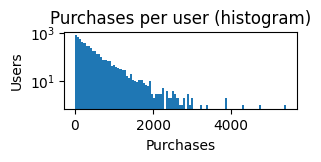

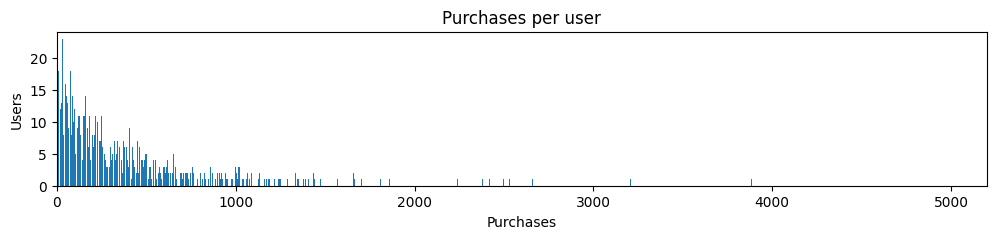

count    5027.000000
mean      368.155361
std       426.407538
min         1.000000
25%        92.000000
50%       232.000000
75%       489.000000
max      5415.000000
Name: purchases, dtype: float64

In [291]:
fig, ax = plt.subplots(1,1, figsize=(3, 1))
_ = ax.hist(purchases_per_user, bins=100, log=True)
ax.set_xlabel('Purchases')
ax.set_ylabel('Users')
_ = ax.set_title('Purchases per user (histogram)')

fig, ax = plt.subplots(1,1,figsize=(12,2))
ax.set_xlim(0, 5200)
purchases_per_user_valcounts = purchases_per_user.value_counts().sort_index()
ax.bar(purchases_per_user_valcounts.index, purchases_per_user_valcounts)
ax.set_ylabel('Users')
ax.set_xlabel('Purchases')
_ = ax.set_title('Purchases per user')
plt.show()
display(purchases_per_user.describe())

#### Products per user

In [292]:
products_per_user = pp_df.groupby([RESPONSE_ID])[PURCHASES].count()

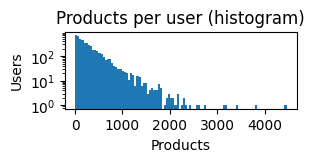

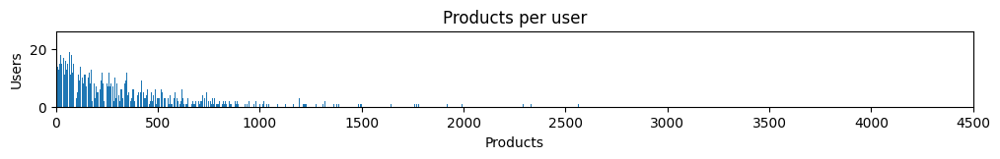

count    5027.000000
mean      308.605530
std       341.297719
min         1.000000
25%        83.000000
50%       205.000000
75%       415.000000
max      4461.000000
Name: purchases, dtype: float64

In [293]:
fig, ax = plt.subplots(1,1, figsize=(3, 1))
_ = ax.hist(products_per_user, bins=100, log=True)
ax.set_xlabel('Products')
ax.set_ylabel('Users')
_ = ax.set_title('Products per user (histogram)')

fig, ax = plt.subplots(1,1,figsize=(12,1))
ax.set_xlim(0, 4500)
products_per_user_valcounts = products_per_user.value_counts().sort_index()
ax.bar(products_per_user_valcounts.index, products_per_user_valcounts)
ax.set_ylabel('Users')
ax.set_xlabel('Products')
_ = ax.set_title('Products per user')
plt.show()
display(products_per_user.describe())

How many users and products if we required at least x distinct products purchased?

Make a table:
```
x, users, products
```
where x is the threshold number of distinct products per users

,users,products
x,,
10,4910,1550718
20,4738,1548225
30,4560,1543912
40,4411,1538774
50,4248,1531488
60,4110,1523938
70,3951,1513664
80,3817,1503707
90,3682,1492314


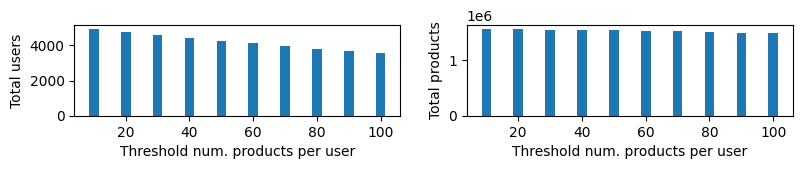

In [294]:
xs = list(range(10, 110, 10))
threshold_products_users_df = pd.DataFrame({
    'x': xs,
    'users': [len(products_per_user[products_per_user >= x]) for x in xs],
    'products': [products_per_user[products_per_user >= x].sum() for x in xs]
}).set_index('x')

fig, (ax1, ax2) = plt.subplots(1,2,figsize=(8,1.5))
plt.tight_layout()
ax1.bar(threshold_products_users_df.index, threshold_products_users_df['users'], 3)
ax2.bar(threshold_products_users_df.index, threshold_products_users_df['products'], 3)
ax1.set_xlabel('Threshold num. products per user')
ax2.set_xlabel('Threshold num. products per user')
ax1.set_ylabel('Total users')
ax1.set_ylabel('Total users')
ax2.set_ylabel('Total products')
threshold_products_users_df

Decision: Initially limit to users with x=50 distinct products purchased.

Get the response ids for these users.

In [295]:
p50_users = products_per_user[products_per_user >= 50].index.tolist()
pp50u_df = pp_df[pp_df[RESPONSE_ID].isin(p50_users)]
print('N=%s : restricting data to users who purchased 50 distinct products' % len(p50_users))

N=4248 : restricting data to users who purchased 50 distinct products


In [296]:
p50u_amzn_data = amzn_data[amzn_data[RESPONSE_ID].isin(p50_users)]

In [297]:
cats_valcounts = pp_df[CATEGORY].value_counts()
display(cats_valcounts.head(10))
cats_all = cats_valcounts.index.tolist() # default: use all the categories.
cats_valcounts.describe()

Category
ABIS_BOOK                 83852
NAN                       81777
ELECTRONIC_CABLE          17098
PET_FOOD                  15336
NUTRITIONAL_SUPPLEMENT    14342
CELLULAR_PHONE_CASE       13961
HEALTH_PERSONAL_CARE      11934
TOYS_AND_GAMES            11082
TOY_FIGURE                11012
MEDICATION                10652
Name: count, dtype: int64

count     2886.000000
mean       537.545045
std       2494.296649
min          1.000000
25%          6.000000
50%         81.500000
75%        399.000000
max      83852.000000
Name: count, dtype: float64

Use categories filtered to those purchased by threshold n=50 distinct users

In [298]:
cats_users = pp50u_df.groupby(CATEGORY)[RESPONSE_ID].nunique().sort_values(ascending=False)
display(cats_users.head(20))
display(cats_users.describe())

Category
NAN                                 4203
ABIS_BOOK                           3843
ELECTRONIC_CABLE                    3296
CELLULAR_PHONE_CASE                 3211
HEALTH_PERSONAL_CARE                3132
HEADPHONES                          3102
CHARGING_ADAPTER                    2732
NUTRITIONAL_SUPPLEMENT              2608
SKIN_MOISTURIZER                    2576
BATTERY                             2532
HOME                                2486
BEAUTY                              2476
GIFT_CARD                           2455
SCREEN_PROTECTOR                    2412
TOYS_AND_GAMES                      2386
CLEANING_AGENT                      2378
MEDICATION                          2364
PORTABLE_ELECTRONIC_DEVICE_COVER    2354
DRINKING_CUP                        2337
WRITING_INSTRUMENT                  2289
Name: Survey ResponseID, dtype: int64

count    2873.000000
mean      238.841281
std       410.651490
min         1.000000
25%         6.000000
50%        69.000000
75%       290.000000
max      4203.000000
Name: Survey ResponseID, dtype: float64

In [299]:
# use categories that have been purchased by at least 50 users in dataset
cats_u50 = cats_users[cats_users>= 50].index.tolist()
print('%s categories purchased by at least 50 users' % len(cats_u50))
# cats_u50

1562 categories purchased by at least 50 users


### Sort the categories by number of users making purchases and create a table


```
Category, Users, Products, Purchases, avg (median) cost per item
```

In [300]:
top_cats_u50_df = (p50u_amzn_data.groupby([CATEGORY]).agg({
    RESPONSE_ID: 'nunique',
    PRODUCT_CODE: 'nunique',
    QUANTITY: 'count', # Could sum this if want total products purchased
    UNIT_PRICE: 'median',
}).rename(columns={
    RESPONSE_ID: 'Users',
    PRODUCT_CODE: 'Products',
    QUANTITY: 'Purchases',
    UNIT_PRICE: 'Avg (median) item cost'
}).loc[cats_u50]).sort_values('Users', ascending=False)
top_cats_u50_df.round(2)

,Users,Products,Purchases,Avg (median) item cost
Category,,,,
NAN,4203,62142,87427,15.98
ABIS_BOOK,3843,57599,85137,11.86
ELECTRONIC_CABLE,3296,7406,17917,9.99
CELLULAR_PHONE_CASE,3211,10614,14127,12.99
HEALTH_PERSONAL_CARE,3132,5347,16049,11.99
...,...,...,...,...
BATHTUB,50,33,54,29.99
GUILD_BEAUTY_GROOMING,50,48,65,13.95
ROOM_DIVIDER,50,43,52,92.00


In [301]:
top_cats_u50_df.round(2).head(10)

,Users,Products,Purchases,Avg (median) item cost
Category,,,,
NAN,4203,62142,87427,15.98
ABIS_BOOK,3843,57599,85137,11.86
ELECTRONIC_CABLE,3296,7406,17917,9.99
CELLULAR_PHONE_CASE,3211,10614,14127,12.99
HEALTH_PERSONAL_CARE,3132,5347,16049,11.99
HEADPHONES,3102,4058,10962,24.99
CHARGING_ADAPTER,2732,3997,8017,14.99
NUTRITIONAL_SUPPLEMENT,2608,6424,24884,19.00
SKIN_MOISTURIZER,2576,3915,13015,12.95


## Data and labels set up


Want to run models for many labels to test predictive power for each label.


Race
- Black
- White
- Asian

Gender (binary)
- Male
- Female

Age group (collapsed)
- 18 - 34 years
- 35 - 54 years
- 55 and older

Income group (collapsed)


Health / lifestyle (data further restricted to yes/no response)
- diabetes
- smoke
- alcohol
- marijuana

### Set up the data

In [302]:
# Helper for analysis below
# Income group: Sorted and exclude 'Prefer not to say'
income_groups = ['Less than $50,000', '\$50,000 - \$99,999', '$100,000 or more']
age_groups = ['18 - 34 years', '35 - 54 years', '55 and older'] # sorted(survey_df['age-collapsed'].unique())
health_lifestyle_labels = ['Diabetes', 'Cigarettes', 'Marijuana', 'Alcohol']

In [303]:
socio_groups = {
    'Gender': ['Male', 'Female'],
    'Age': age_groups,
    'Race': ['White','Asian','Black'], #,'Hispanic'],
    #'Race and ethnicity': ['White','Asian','Black','Hispanic'],
    #'Income': income_groups,
    'Health / lifestyle': health_lifestyle_labels,
}

### Labels set up


Set up a dictionary:

```
label: {
    'y': pd.Series([boolean representing y value for label], index=ResponseId),
    'train_test_split': (X_train, X_test, y_train, y_test)
    }
```

In [304]:
# set up labels

# For the labels we're interested in, simply create a mapping
# labeled_y = {label_name: Series([boolean representing y for label], index=ResponseId)}
labeled_y = dict()
# Add gender (binary)
for l in ['Male','Female']:
    labeled_y[l] = survey_df['Q-demos-gender'].apply(lambda r: l in str(r)).astype(int).rename(l)
# Add age group
for l in age_groups:
    labeled_y[l] = survey_df['age-collapsed'].apply(lambda r: l in str(r)).astype(int).rename(l)
# Add race and ethnicity
for l in ['White', 'Black', 'Asian']:
    labeled_y[l] = survey_df['Q-demos-race'].apply(lambda r: l in str(r)).astype(int).rename(l)
labeled_y['Hispanic'] = survey_df['Q-demos-hispanic'].apply(lambda h: h=='Yes').astype(int).rename('Hispanic')
# Add income group
for l in income_groups:
    labeled_y[l] = survey_df['income-collapsed'].apply(lambda r: l in str(r)).astype(int).rename(l)

Add personal health/lifestyle

These are treated differently:
- Only include responses of Yes/No. Exclude 
    - 'Prefer not to say'
    - 'I stopped in the recent past'
- This means n is smaller

In [305]:
for l, Q in [('Diabetes', 'Q-personal-diabetes'),('Cigarettes', 'Q-substance-use-cigarettes'),('Marijuana', 'Q-substance-use-marijuana'),('Alcohol', 'Q-substance-use-alcohol')]:
    sdf = survey_df[survey_df[Q].isin(['Yes', 'No'])]
    labeled_y[l] = sdf[Q].apply(lambda r: r=='Yes').astype(int).rename(l)

## Descriptive statistics for users and purchases


Set of boxplots -- one plot for each socio-demographic category 

Plot: Boxplots show # of purchases per user -- separated by demographic

Plot: Boxplots show # distinct categories per user -- separated by demographic

Scatter plot with computed correlation: compare # purchases to # distinct categories 

Histogram for categories in analysis: number of purchases per category


To do this, make a table:
```
ResponseID, purchases, products, categories, Male, Female, ...each demo label
```
Where
- purchases: purchases per user
- products: products per user
- categories: categories per user

Limited to the users in the analysis. i.e. those with at least 50 distinct products purchased

In [306]:
p50u_per_user_stats = pd.DataFrame({
    PURCHASES: pp50u_df.groupby([RESPONSE_ID])[PURCHASES].sum(),
    'products': pp50u_df.groupby([RESPONSE_ID])[PURCHASES].count(),
    'categories': pp50u_df.groupby(RESPONSE_ID)[CATEGORY].nunique()
})
# add demographic data
for socio, labels in socio_groups.items():
    for l in labels:
        p50u_per_user_stats[l] = p50u_per_user_stats.index.map(labeled_y[l])
p50u_per_user_stats.head()

,purchases,products,categories,Male,Female,18 - 34 years,35 - 54 years,55 and older,White,Asian,Black,Diabetes,Cigarettes,Marijuana,Alcohol
Survey ResponseID,,,,,,,,,,,,,,,
R_01vNIayewjIIKMF,140,102,51,1,0,0,1,0,0,0,1,0.0,0.0,0.0,0.0
R_037XK72IZBJyF69,1213,1000,389,0,1,0,0,1,1,0,0,0.0,0.0,0.0,1.0
R_038ZU6kfQ5f89fH,69,62,38,1,0,1,0,0,1,0,0,0.0,0.0,0.0,0.0
R_03aEbghUILs9NxD,173,135,83,1,0,0,1,0,1,0,0,0.0,0.0,0.0,0.0
R_06RZP9pS7kONINr,430,385,184,0,1,0,0,1,1,0,0,1.0,0.0,0.0,0.0


In [307]:
# get the discriptive statistics
p50u_per_user_stats[[PURCHASES, 'products', 'categories']].describe().round(2)

,purchases,products,categories
count,4248.00,4248.00,4248.00
mean,430.23,360.52,161.53
std,436.11,347.02,107.21
min,50.00,50.00,7.00
25%,148.00,132.00,80.00
50%,291.00,255.50,137.00
75%,551.25,461.25,218.00
max,5415.00,4461.00,780.00


Purchases, products, categories per user (limited to users with at least 50 products purchased)


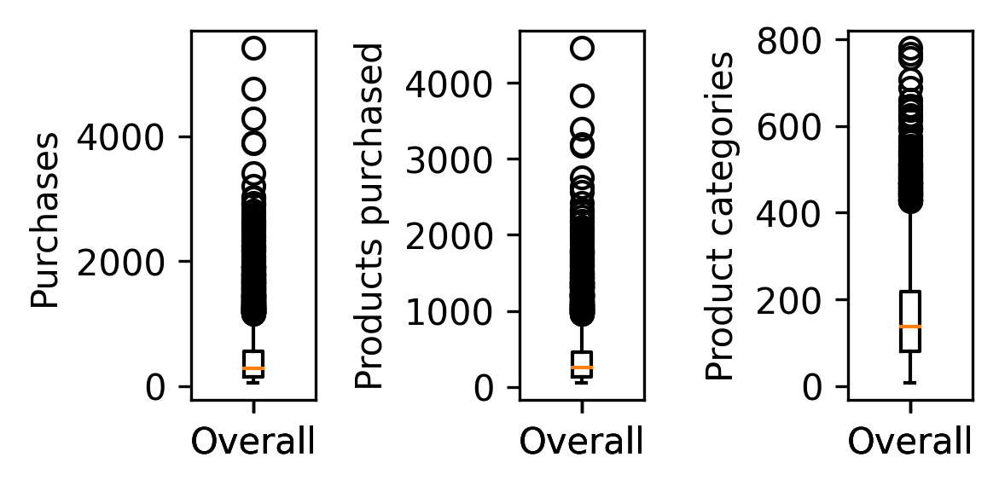

In [308]:
fig, axes = plt.subplots(1,3,figsize=(4,2), sharex=True, dpi=300)
_ = axes[0].boxplot(p50u_per_user_stats[PURCHASES], labels=['Overall'])
axes[0].set_ylabel('Purchases')
_ = axes[1].boxplot(p50u_per_user_stats['products'], labels=['Overall'])
axes[1].set_ylabel('Products purchased')
_ = axes[2].boxplot(p50u_per_user_stats['categories'], labels=['Overall'])
axes[2].set_ylabel('Product categories')
plt.tight_layout()
print('Purchases, products, categories per user (limited to users with at least 50 products purchased)')

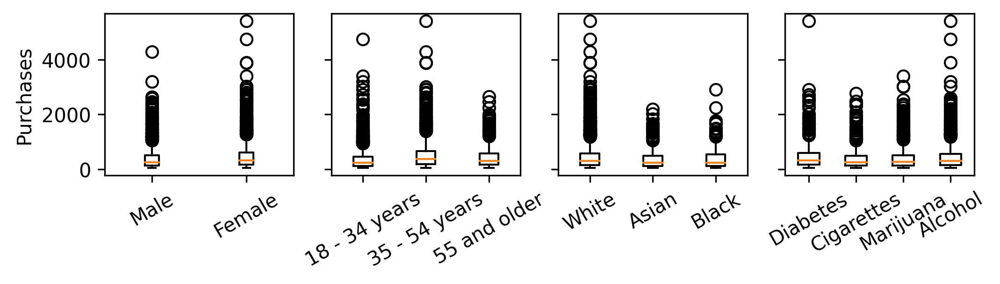

In [309]:
fig, axes = plt.subplots(1, len(socio_groups), figsize=(8, 1.5), sharey=True, dpi=300)
for a, (socio, labels) in enumerate(socio_groups.items()):
    ax = axes[a]
    labels_purchases = [p50u_per_user_stats[p50u_per_user_stats[l]==1][PURCHASES] for l in labels]
    ax.boxplot(labels_purchases, labels=labels)
    if a == 0: ax.set_ylabel('Purchases')
    ax.tick_params(axis='x', labelrotation=30)
    #plt.tight_layout()

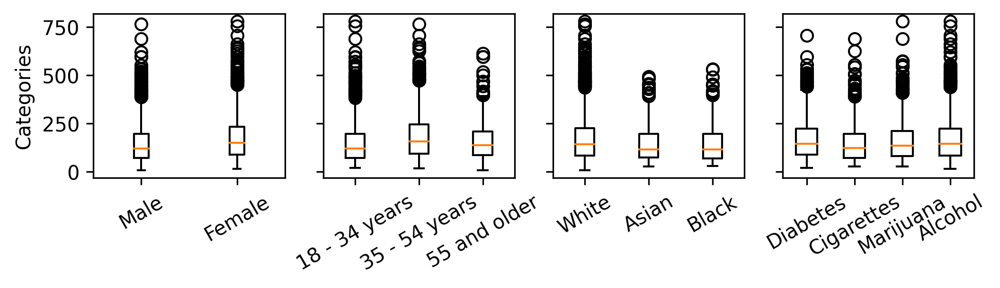

In [310]:
fig, axes = plt.subplots(1, len(socio_groups), figsize=(8, 1.5), sharey=True, dpi=300)
for a, (socio, labels) in enumerate(socio_groups.items()):
    ax = axes[a]
    labels_categories = [p50u_per_user_stats[p50u_per_user_stats[l]==1]['categories'] for l in labels]
    ax.boxplot(labels_categories, labels=labels)
    if a == 0: ax.set_ylabel('Categories')
    ax.tick_params(axis='x', labelrotation=30)
    #plt.tight_layout()

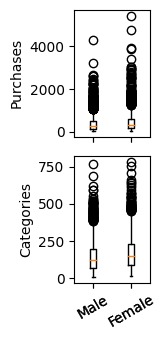

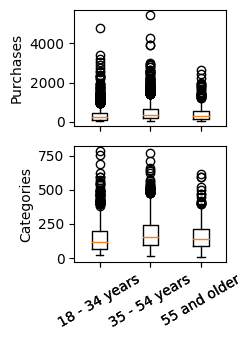

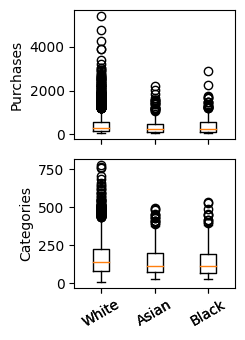

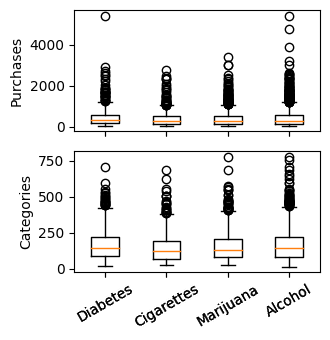

In [311]:
for socio, labels in socio_groups.items():
    fig, axes = plt.subplots(2,1,figsize=(0.85*len(labels),3.5), sharex=True)
    labels_purchases = [p50u_per_user_stats[p50u_per_user_stats[l]==1][PURCHASES] for l in labels]
    labels_categories = [p50u_per_user_stats[p50u_per_user_stats[l]==1]['categories'] for l in labels]
    ax = axes[0]
    ax.boxplot(labels_purchases, labels=labels)
    ax.set_ylabel('Purchases')
    ax = axes[1]
    ax.boxplot(labels_categories, labels=labels)
    ax.set_ylabel('Categories')
    ax.tick_params(axis='x', labelrotation=30)
    plt.tight_layout()

In [312]:
from scipy.stats import pearsonr

# compare purchases to products
# plot, get correlation
print('r=%0.3f (p=%0.3f): Pearson correlation between number of purchases and categories per user' % (
pearsonr(p50u_per_user_stats[PURCHASES], p50u_per_user_stats['categories'])))

print('r=%0.3f (p=%0.3f): Pearson correlation between number of products and categories per user' % (
pearsonr(p50u_per_user_stats['products'], p50u_per_user_stats['categories'])))


r=0.894 (p=0.000): Pearson correlation between number of purchases and categories per user
r=0.935 (p=0.000): Pearson correlation between number of products and categories per user


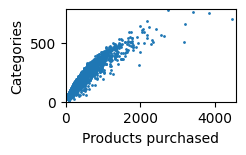

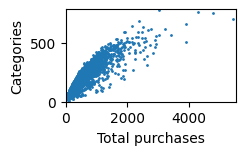

In [313]:
fig, ax = plt.subplots(1,1,figsize=(2.2,1.2))#, dpi=300)
ax.scatter(p50u_per_user_stats['products'], p50u_per_user_stats['categories'], 
           s=1)
ax.set_xlim(0, p50u_per_user_stats['products'].max() + 100)
ax.set_ylim(0, p50u_per_user_stats['categories'].max() + 10)
ax.set_xlabel('Products purchased')
ax.set_ylabel('Categories')
# similarly for total purchases
fig, ax = plt.subplots(1,1,figsize=(2.2,1.2))#, dpi=300)
ax.scatter(p50u_per_user_stats['purchases'], p50u_per_user_stats['categories'], 
           s=1)
ax.set_xlim(0, p50u_per_user_stats['purchases'].max() + 100)
ax.set_ylim(0, p50u_per_user_stats['categories'].max() + 10)
ax.set_xlabel('Total purchases')
_ = ax.set_ylabel('Categories')

### Descriptive statistics for participant attributes / labels


In [314]:
labels = ['Male', 'Female'] + age_groups + socio_groups['Race']
pd.DataFrame({
    'Attribute': labels,
    'n': [p50u_per_user_stats[l].sum() for l in labels],
}).set_index('Attribute')

,n
Attribute,
Male,1847
Female,2301
18 - 34 years,2084
35 - 54 years,1694
55 and older,470
White,3555
Asian,376
Black,354


In [315]:
# health_lifestyle_labels = ['Diabetes', 'Cigarettes', 'Marijuana', 'Alcohol']

# Some of the values in the p50u_per_user_stats are nan 
# if they were excluded from labels because they weren't yes/no
pd.DataFrame({
    'Question': health_lifestyle_labels,
    'Yes': [sum(p50u_per_user_stats[l].dropna().astype(int)) for l in health_lifestyle_labels],
    'No': [sum(p50u_per_user_stats[l]==0) for l in health_lifestyle_labels]
}).set_index('Question')

,Yes,No
Question,,
Diabetes,516,3720
Cigarettes,600,3506
Marijuana,892,3215
Alcohol,1874,2229


### Make feature vectors with categories

Assume n categories for creating features

x_i = [x1, x2, ...,xn] for the n categories

Multiple ways we define feature vectors:

a. One-hot-encode (was the item ever purchased)

b. By relative purchases: Each element x_i is a fraction representing how many times item ever purchased by user, divided by total number of purchases

c. By relative spend: Each element x_i is a fraction representing spend on item relative to total spend

c. Dropped after testing found this did not work well.


In [316]:
def get_category_one_hot_encoding(amzn_df, category, rids):
    """
    Returns vector representing all response IDs in preprocessed df. 
    1/0 indicates whether ResponseId ever purchased category.
    """
    return ((amzn_df[amzn_df[CATEGORY]==category]
             .groupby(RESPONSE_ID)[QUANTITY].sum() > 0)
            .reindex(rids).fillna(0).astype(int))

def get_X_one_hot_encoding_for_categories(amzn_df, cats, rids=None):
    rids = amzn_df[RESPONSE_ID].unique() if rids is None else rids
    X_dict = {c: get_category_one_hot_encoding(amzn_df, c, rids) for c in cats}
    X_dict[RESPONSE_ID] = rids
    return pd.DataFrame(X_dict).set_index(RESPONSE_ID)

In [317]:
def get_category_relative_products(ppdf, category):
    """
    Returns relative purchases (by distinct products) for category 
    for each ResponseId in preprocessed df.
    ie this is how many different products the ResponseId buys for the category.
    """
    return ((ppdf[ppdf[CATEGORY]==category].groupby([RESPONSE_ID])[PURCHASES].count()\
            /ppdf.groupby([RESPONSE_ID])[PURCHASES].count()).fillna(0)
            .reindex(ppdf[RESPONSE_ID].unique())).to_list()

def get_X_relative_products_for_categories(ppdf, cats):
    pdf = ppdf[ppdf[CATEGORY].isin(cats)]
    X_dict = {cat: get_category_relative_products(pdf, cat) for cat in cats}
    X_dict[RESPONSE_ID] = pdf[RESPONSE_ID].unique()
    return pd.DataFrame(X_dict).set_index(RESPONSE_ID)


def get_category_relative_purchases(ppdf, category):
    """
    Returns relative purchases (by distinct orders) for category 
    for each ResponseId in preprocessed df.
    ie this is how many different products the ResponseId buys for the category.
    """
    return ((ppdf[ppdf[CATEGORY]==category].groupby([RESPONSE_ID])[QUANTITY].sum()\
            /ppdf.groupby([RESPONSE_ID])[QUANTITY].sum()).fillna(0)
            .reindex(ppdf[RESPONSE_ID].unique())).to_list()


def get_X_relative_purchases_for_categories(ppdf, cats):
    pdf = ppdf[ppdf[CATEGORY].isin(cats)]
    X_dict = {cat: get_category_relative_purchases(pdf, cat) for cat in cats}
    X_dict[RESPONSE_ID] = pdf[RESPONSE_ID].unique()
    return pd.DataFrame(X_dict).set_index(RESPONSE_ID)

def get_catetory_relative_spend(ppdf, category):
    """Returns relative orders for category for each ResponseId in preprocessed df."""
    return (ppdf[ppdf[CATEGORY]==category].groupby([RESPONSE_ID])[TOTAL_SPEND].sum()
            .reindex(ppdf[RESPONSE_ID].unique()).fillna(0)\
            /ppdf.groupby([RESPONSE_ID])[TOTAL_SPEND].sum())

def get_X_relative_spend_for_categories(ppdf, cats):
    X_dict = {cat: get_catetory_relative_spend(ppdf, cat) for cat in cats}
    X_dict[RESPONSE_ID] = ppdf[RESPONSE_ID].unique()
    return pd.DataFrame(X_dict).set_index(RESPONSE_ID)

In [318]:
# Important to maintain the order of the rids!
def get_y(df, Ycol, rids):
    return df.loc[rids][Ycol].astype(int)

In [319]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

def get_auc_plot_roc(clf, X_test, y_test, ylabel, ax=None):
    if ax is None:
        fig, ax = plt.subplots(1,1,figsize=(3,3))
    # generate a no skill prediction (majority class)
    ns_probs = [0 for _ in range(len(y_test))]
    probs = clf.predict_proba(X_test)
    # keep probabilities for positive outcomes only
    probs = probs[:, 1]
    # calculate auc
    auc = roc_auc_score(y_test, probs)
    # calculate roc curves
    ns_fpr, ns_tpr, _ = roc_curve(y_test, ns_probs)
    fpr, tpr, _ = roc_curve(y_test, probs)
    # plot the roc curve for the model
    ax.plot(ns_fpr, ns_tpr, linestyle='--')
    ax.plot(fpr, tpr, marker='.', label='%s; AUC=%.3f'%(ylabel, auc))
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.legend()
    print('ROC AUC=%.3f' % (auc))
    return auc

In [320]:
def setup_labeled_X_y_data(X, labeled_y):
    """
    Args:
        X is encoded data, indexed by ResponseId
        labeled_y is a dictionary: {label: Series([boolean y for label], index=ResponseId)}
    Assumes use of survey data
    
    Returns dictionary for each label in Ds:
    label: {
        'y': Series([boolean representing y value for label], index=ResponseId),
        'train_test_split': (X_train, X_test, y_train, y_test)
    }
    """
    X_y_data = {label: {} for label in labeled_y.keys()} 
    for label, ys in labeled_y.items():
        Xl = X[X.index.isin(ys.index)] # some ys (health/lifestyle) restricted to subset
        rids = Xl.index # use consistent order for ResponseIds
        y = ys.loc[rids]
        X_y_data[label]['y'] = y
        X_y_data[label]['train_test_split'] = train_test_split(Xl, y, test_size=0.2, stratify=y, random_state=RANDOM)
    return X_y_data

In [321]:
def get_auc(clf, X_test, y_test):
    probs = clf.predict_proba(X_test)
    # keep probabilities for positive outcomes only
    probs = probs[:, 1]
    return roc_auc_score(y_test, probs)

def get_auc_and_plot(clf, X_test, y_test, plot=True, axes=None):
    if not plot:
        return get_auc(clf, X_test, y_test)
    # plotting
    print('Mean accuracy: %0.4f' % clf.score(X_test, y_test))
    if axes is None:
        fig, axes = plt.subplots(1,2,figsize=(6,3))
    plt.tight_layout(pad=3)
    ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test, ax=axes[0], display_labels=['non-%s'%label, label])
    axes[0].set_title('Confusion matrix')
    auc = get_auc_plot_roc(clf, X_test, y_test.values, label, ax=axes[1])
    assert (auc == get_auc(clf, X_test, y_test))
    return auc

### Run the models

X: one-hot-encoded

Limit data to:
- users who purchased at least p=50 distinct products
- categories purchased by at least n=50 distinct users

In [322]:
print(datetime.datetime.now())
X = get_X_one_hot_encoding_for_categories(p50u_amzn_data, cats_u50)
print(datetime.datetime.now())

2024-06-25 09:47:23.098654
2024-06-25 09:48:39.314570


In [323]:
X_y_data = setup_labeled_X_y_data(X, labeled_y)


2024-06-21 13:31:25.470554
1/16: SVM for Male
Mean accuracy: 0.8247
ROC AUC=0.894

2024-06-21 13:32:05.814549
2/16: SVM for Female
Mean accuracy: 0.8341
ROC AUC=0.911

2024-06-21 13:32:46.887694
3/16: SVM for 18 - 34 years
Mean accuracy: 0.7282
ROC AUC=0.804

2024-06-21 13:33:38.264822
4/16: SVM for 35 - 54 years
Mean accuracy: 0.6635
ROC AUC=0.707

2024-06-21 13:34:34.473496
5/16: SVM for 55 and older
Mean accuracy: 0.8976
ROC AUC=0.869

2024-06-21 13:35:13.979261
6/16: SVM for White
Mean accuracy: 0.8024
ROC AUC=0.780

2024-06-21 13:36:01.091371
7/16: SVM for Black
Mean accuracy: 0.9047
ROC AUC=0.812

2024-06-21 13:36:36.302964
8/16: SVM for Asian
Mean accuracy: 0.8976
ROC AUC=0.759

2024-06-21 13:37:15.352346
9/16: SVM for Hispanic
Mean accuracy: 0.8412
ROC AUC=0.589

2024-06-21 13:38:02.281901
10/16: SVM for Less than $50,000
Mean accuracy: 0.6753
ROC AUC=0.734

2024-06-21 13:38:57.954944
11/16: SVM for \$50,000 - \$99,999
Mean accuracy: 0.5471
ROC AUC=0.502

2024-06-21 13:39:56.7

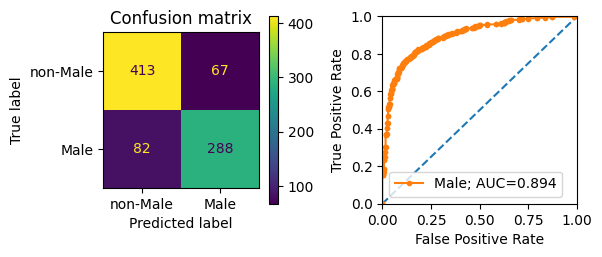

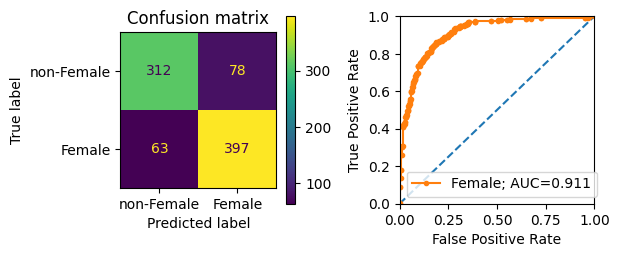

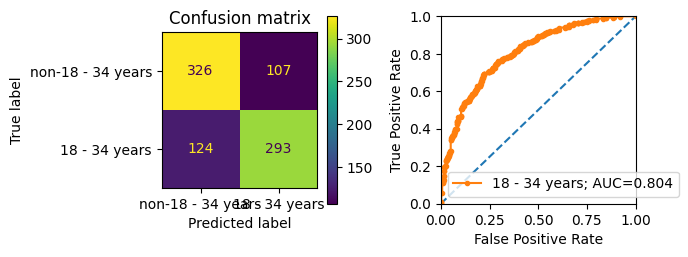

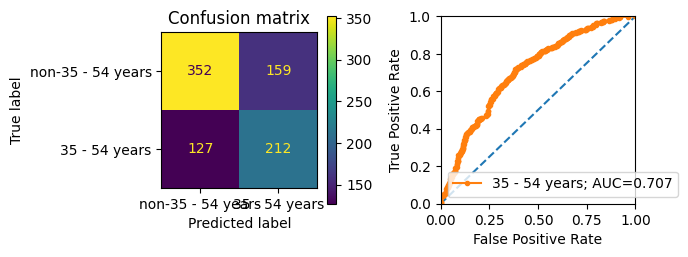

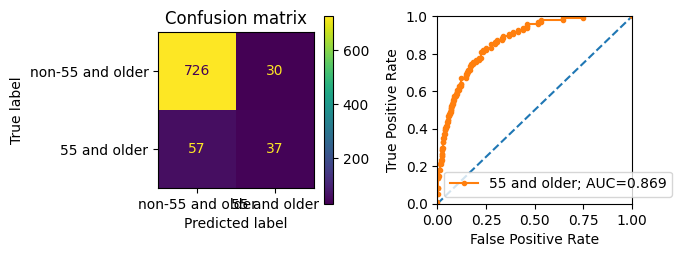

...

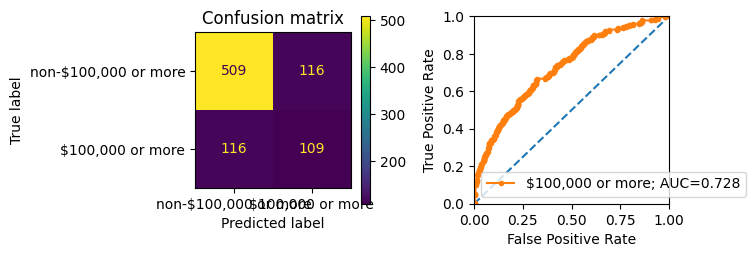

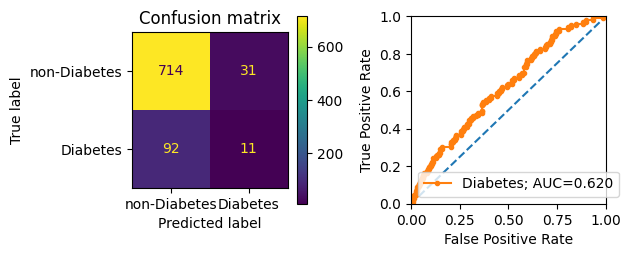

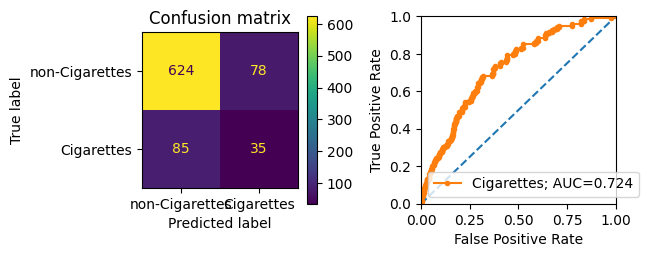

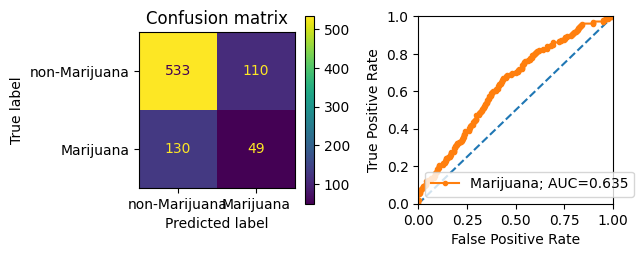

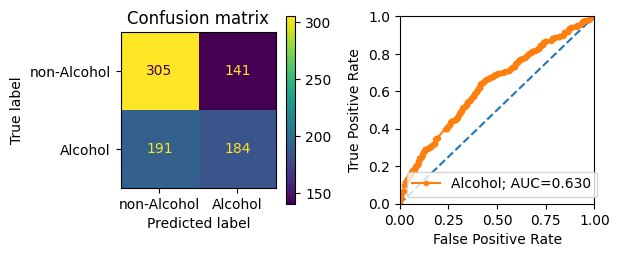

In [171]:
# results dict: map label to svm results
onehot_svm_results = dict()
onehot_svm_models = dict() # keep around the trained models
use_labels = X_y_data.keys()
for i, label in enumerate(use_labels):
    print('\n%s\n%s/%s: SVM for %s' % (datetime.datetime.now(), i+1, len(use_labels), label))
    X_train, X_test, y_train, y_test = X_y_data[label]['train_test_split']
    clf = svm.SVC(probability=True, class_weight='balanced', random_state=RANDOM)
    clf.fit(X_train, y_train)
    onehot_svm_models[label] = clf
    auc = get_auc_and_plot(clf, X_test, y_test)
    onehot_svm_results[label] = auc

In [172]:
# show a table with the AUROC scores
onehot_svm_results_df = pd.DataFrame({
    'AUROC': onehot_svm_results.values(),
}, index=list(onehot_svm_results.keys())).round(3)
onehot_svm_results_df

,AUROC
Male,0.894
Female,0.911
18 - 34 years,0.804
35 - 54 years,0.707
55 and older,0.869
White,0.780
Black,0.812
Asian,0.759
Hispanic,0.589
"Less than $50,000",0.734


### Comparison with linear kernal

(Would be convenient for interpretability)


2024-05-30 11:28:46.573495
1/16: SVM for Male
Mean accuracy: 0.7094
ROC AUC=0.773

2024-05-30 11:29:10.467358
2/16: SVM for Female
Mean accuracy: 0.7306
ROC AUC=0.794

2024-05-30 11:29:33.900117
3/16: SVM for 18 - 34 years
Mean accuracy: 0.6518
ROC AUC=0.703

2024-05-30 11:30:02.654328
4/16: SVM for 35 - 54 years
Mean accuracy: 0.6141
ROC AUC=0.633

2024-05-30 11:30:48.608603
5/16: SVM for 55 and older
Mean accuracy: 0.8635
ROC AUC=0.808

2024-05-30 11:31:01.298536
6/16: SVM for White
Mean accuracy: 0.7718
ROC AUC=0.720

2024-05-30 11:31:19.779435
7/16: SVM for Black
Mean accuracy: 0.8706
ROC AUC=0.733

2024-05-30 11:31:33.063153
8/16: SVM for Asian
Mean accuracy: 0.8635
ROC AUC=0.722

2024-05-30 11:31:46.006738
9/16: SVM for Hispanic
Mean accuracy: 0.7824
ROC AUC=0.558

2024-05-30 11:32:03.183017
10/16: SVM for Less than $50,000
Mean accuracy: 0.6424
ROC AUC=0.669

2024-05-30 11:32:40.128060
11/16: SVM for \$50,000 - \$99,999
Mean accuracy: 0.4941
ROC AUC=0.470

2024-05-30 11:33:29.1

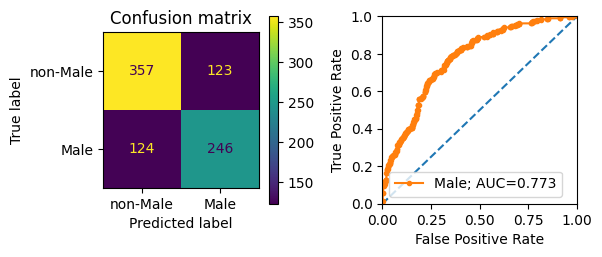

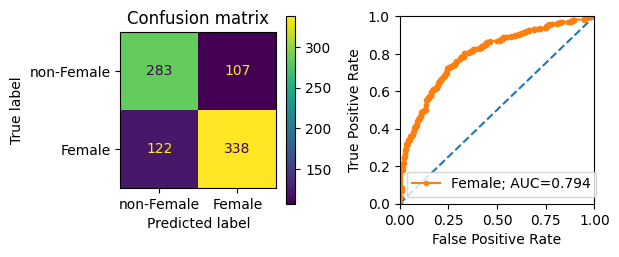

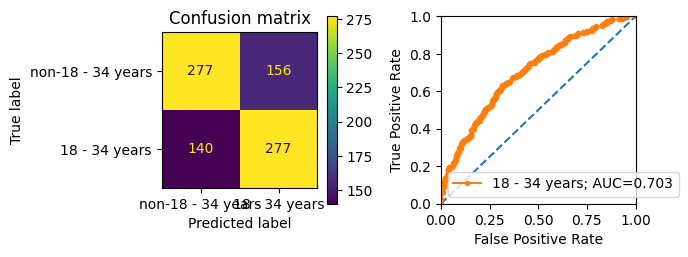

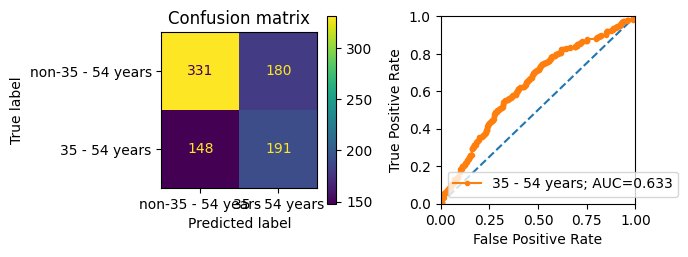

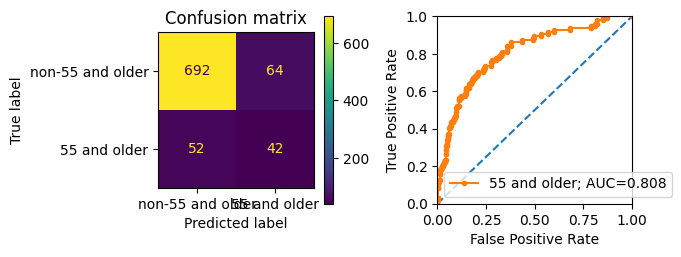

...

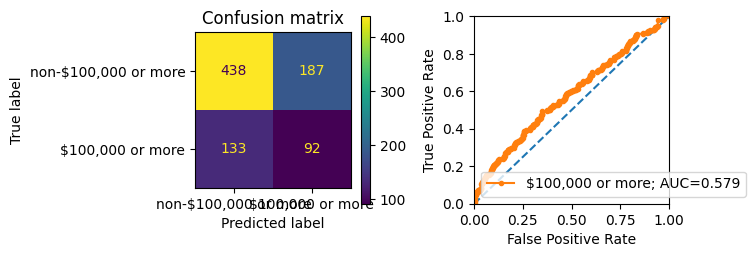

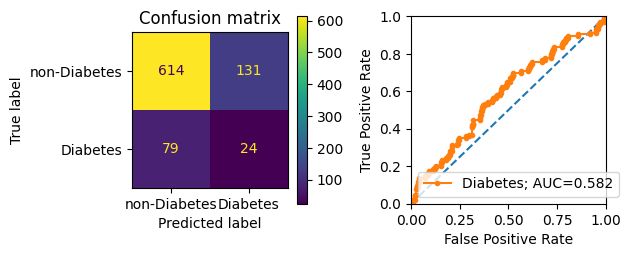

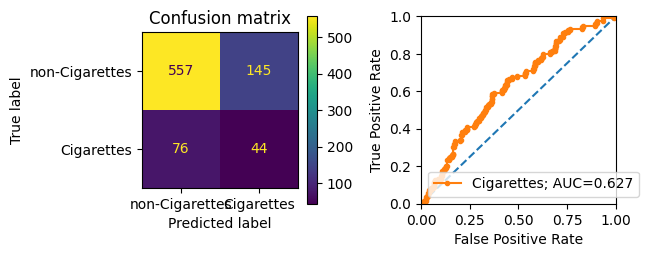

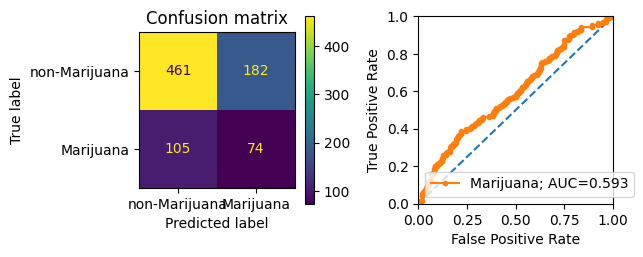

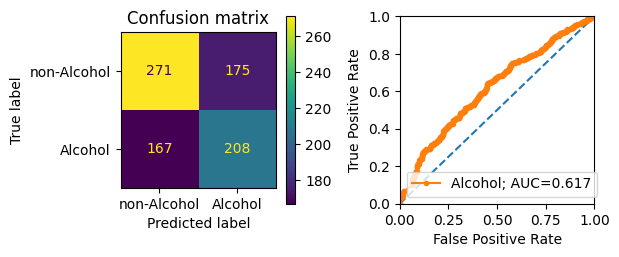

In [1597]:
# results dict: map label to svm results
onehot_svm_linear_results = dict()
onehot_svm_linear_models = dict() # keep around the trained models
use_labels = X_y_data.keys()
for i, label in enumerate(use_labels):
    print('\n%s\n%s/%s: SVM for %s' % (datetime.datetime.now(), i+1, len(use_labels), label))
    X_train, X_test, y_train, y_test = X_y_data[label]['train_test_split']
    clf = svm.SVC(kernel='linear', probability=True, class_weight='balanced', random_state=RANDOM)
    clf.fit(X_train, y_train)
    onehot_svm_linear_models[label] = clf
    auc = get_auc_and_plot(clf, X_test, y_test)
    onehot_svm_linear_results[label] = auc

In [1598]:
# show a table with the AUROC scores
onehot_svm_linear_results_df = pd.DataFrame({
    'AUROC': onehot_svm_linear_results.values(),
}, index=list(onehot_svm_linear_results.keys())).round(3)
onehot_svm_linear_results_df

,AUROC
Male,0.773
Female,0.794
18 - 34 years,0.703
35 - 54 years,0.633
55 and older,0.808
White,0.720
Black,0.733
Asian,0.722
Hispanic,0.558
"Less than $50,000",0.669


### Comparison check with Logistic regression

Do this again with Logistic regression

Using same feature vectors, same train/test split.


2024-05-30 11:35:51.191353
1/16: Logistic regression for Male
Mean accuracy: 0.7247
ROC AUC=0.799

2024-05-30 11:35:51.548759
2/16: Logistic regression for Female
Mean accuracy: 0.7529
ROC AUC=0.820

2024-05-30 11:35:51.906688
3/16: Logistic regression for 18 - 34 years
Mean accuracy: 0.6671
ROC AUC=0.723

2024-05-30 11:35:52.349106
4/16: Logistic regression for 35 - 54 years


/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Mean accuracy: 0.6388
ROC AUC=0.650

2024-05-30 11:35:52.823881
5/16: Logistic regression for 55 and older
Mean accuracy: 0.8718
ROC AUC=0.828

2024-05-30 11:35:53.113464
6/16: Logistic regression for White
Mean accuracy: 0.7706
ROC AUC=0.743

2024-05-30 11:35:53.490427
7/16: Logistic regression for Black
Mean accuracy: 0.8706
ROC AUC=0.767

2024-05-30 11:35:53.756581
8/16: Logistic regression for Asian
Mean accuracy: 0.8529
ROC AUC=0.733

2024-05-30 11:35:54.095817
9/16: Logistic regression for Hispanic
Mean accuracy: 0.7788
ROC AUC=0.571

2024-05-30 11:35:54.475479
10/16: Logistic regression for Less than $50,000
Mean accuracy: 0.6412
ROC AUC=0.679

2024-05-30 11:35:54.868988
11/16: Logistic regression for \$50,000 - \$99,999


/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Mean accuracy: 0.5012
ROC AUC=0.472

2024-05-30 11:35:55.346458
12/16: Logistic regression for $100,000 or more


/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Mean accuracy: 0.6247
ROC AUC=0.590

2024-05-30 11:35:55.777897
13/16: Logistic regression for Diabetes
Mean accuracy: 0.7465
ROC AUC=0.582

2024-05-30 11:35:56.110702
14/16: Logistic regression for Cigarettes
Mean accuracy: 0.7214
ROC AUC=0.662

2024-05-30 11:35:56.415760
15/16: Logistic regression for Marijuana
Mean accuracy: 0.6509
ROC AUC=0.602

2024-05-30 11:35:56.803596
16/16: Logistic regression for Alcohol


/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Mean accuracy: 0.6005
ROC AUC=0.623


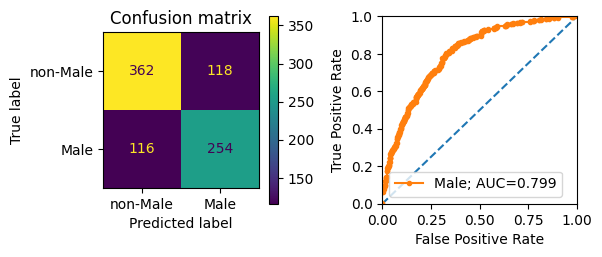

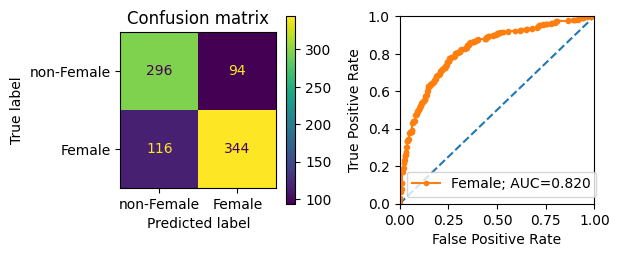

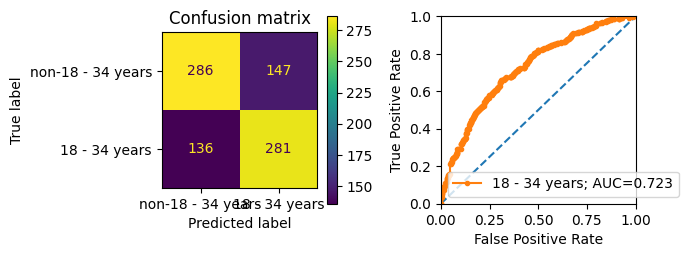

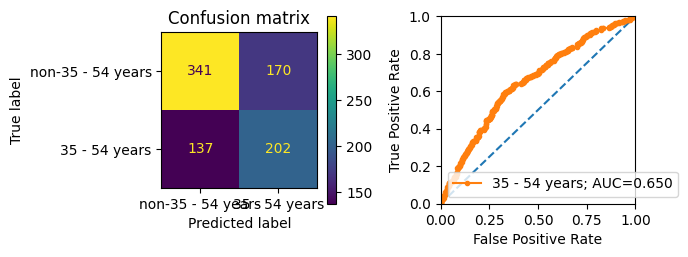

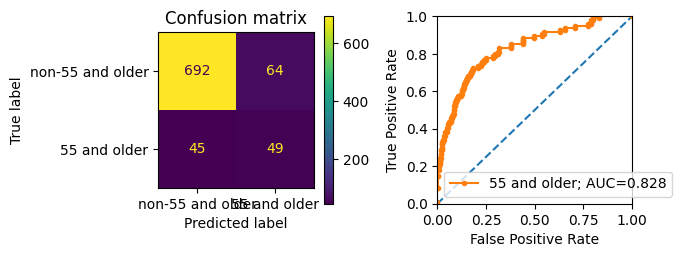

...

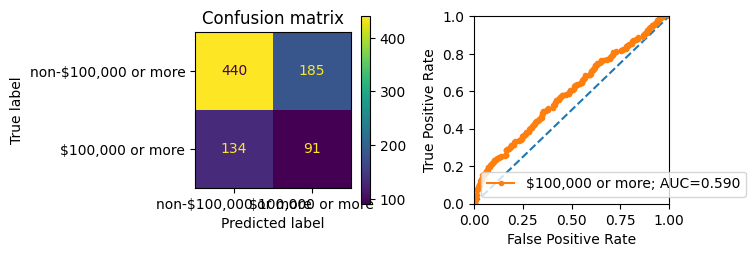

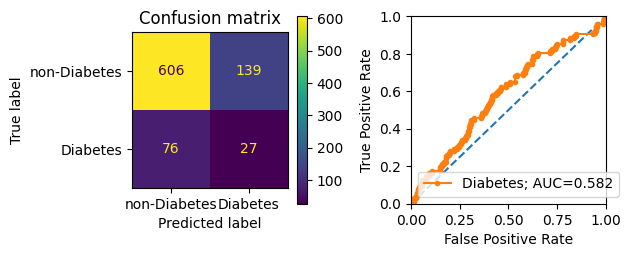

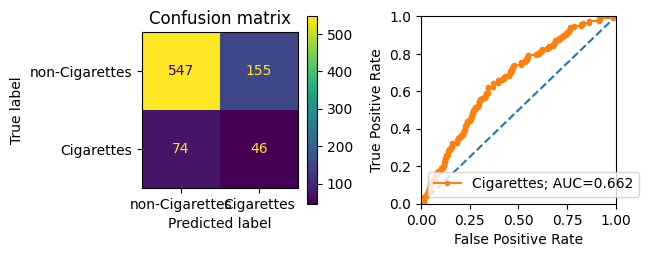

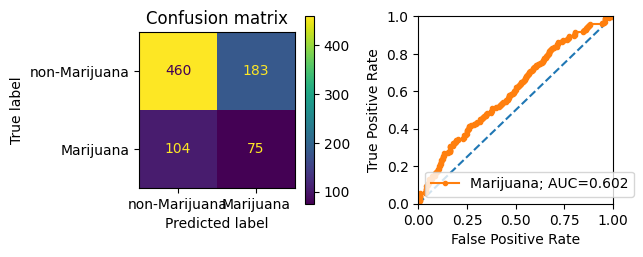

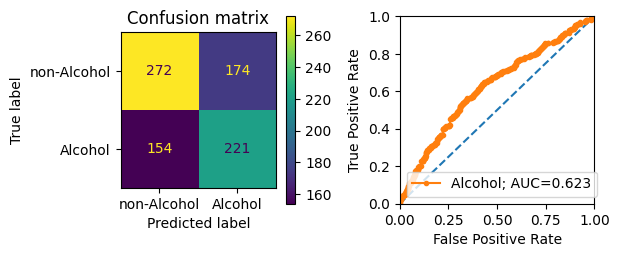

In [1599]:
# results dict: map label to svm results
onehot_lr_results = dict()
onehot_lr_models = dict() # keep around the trained models
use_labels = X_y_data.keys()
# use_labels = ['White','Black','Asian','Female','Male']
for i, label in enumerate(use_labels):
    print('\n%s\n%s/%s: Logistic regression for %s' % (datetime.datetime.now(), i+1, len(use_labels), label))
    X_train, X_test, y_train, y_test = X_y_data[label]['train_test_split']
    clf = LogisticRegression(class_weight='balanced', random_state=RANDOM)
    clf.fit(X_train, y_train)
    onehot_lr_models[label] = clf
    auc = get_auc_and_plot(clf, X_test, y_test)
    onehot_lr_results[label] = auc

In [1600]:
# show a table with the AUROC scores
onehot_lr_results_df = pd.DataFrame({
    'AUROC': onehot_lr_results.values(),
}, index=list(onehot_lr_results.keys())).round(3)
onehot_lr_results_df

,AUROC
Male,0.799
Female,0.820
18 - 34 years,0.723
35 - 54 years,0.650
55 and older,0.828
White,0.743
Black,0.767
Asian,0.733
Hispanic,0.571
"Less than $50,000",0.679


### Personal risk: By amount of purchases

Are users who purchase more often, or a larger number of *different* products more at risk?


Make a df showing participants' purchasing behavior numbers
- ResponseId
- purchases (total purchases)
- products (distinct products)
- categories (distinct categories)

In [45]:
purchase_behavior_df = pp_df.groupby(
    [RESPONSE_ID]
)[PURCHASES].sum().rename('total purchases').to_frame()
purchase_behavior_df['products'] = pp_df.groupby([RESPONSE_ID])[PURCHASES].count()
purchase_behavior_df['categories'] = pp_df.groupby([RESPONSE_ID])[CATEGORY].nunique()
purchase_behavior_df.head()

,total purchases,products,categories
Survey ResponseID,,,
R_01vNIayewjIIKMF,140,102,50
R_037XK72IZBJyF69,1213,1000,365
R_038ZU6kfQ5f89fH,69,62,35
R_03aEbghUILs9NxD,173,135,79
R_06RZP9pS7kONINr,430,385,176


For each label, take our trained models and collect the prediction probabilities for the test users where the label does apply (label=1).



In [46]:
# {label: <<df with a row for each rid s.t. label=1>>}
l1_probabilities_v_behavior = dict()
# maybe combine this with the routine above if this is useful (TODO)

use_labels = X_y_data.keys()
for i, label in enumerate(use_labels):
    print('\n%s\n%s/%s: SVM for %s' % (datetime.datetime.now(), i+1, len(use_labels), label))
    X_train, X_test, y_train, y_test = X_y_data[label]['train_test_split']
    clf = svm.SVC(probability=True, class_weight='balanced')
    clf.fit(X_train, y_train)
    # Get the test users s.t. label=1
    l1_y_test_rids = y_test[y_test == 1].index.tolist()
    l1_probabilities_v_behavior[label] = pd.DataFrame({
        RESPONSE_ID: l1_y_test_rids,
        'Pred. Prob': clf.predict_proba(X_test.loc[l1_y_test_rids])[:, 1],
    }).set_index(RESPONSE_ID).merge(
        purchase_behavior_df, left_index=True, right_index=True, how='inner'
    )


2024-06-04 10:40:41.292186
1/16: SVM for Male

2024-06-04 10:41:12.648097
2/16: SVM for Female

2024-06-04 10:41:44.839339
3/16: SVM for 18 - 34 years

2024-06-04 10:42:22.257770
4/16: SVM for 35 - 54 years

2024-06-04 10:43:02.284947
5/16: SVM for 55 and older

2024-06-04 10:43:29.268005
6/16: SVM for White

2024-06-04 10:44:03.693933
7/16: SVM for Black

2024-06-04 10:44:28.528996
8/16: SVM for Asian

2024-06-04 10:44:55.615968
9/16: SVM for Hispanic

2024-06-04 10:45:29.093520
10/16: SVM for Less than $50,000

2024-06-04 10:46:09.004465
11/16: SVM for \$50,000 - \$99,999

2024-06-04 10:46:52.201154
12/16: SVM for $100,000 or more

2024-06-04 10:47:29.837052
13/16: SVM for Diabetes

2024-06-04 10:48:04.560026
14/16: SVM for Cigarettes

2024-06-04 10:48:38.633018
15/16: SVM for Marijuana

2024-06-04 10:49:15.544249
16/16: SVM for Alcohol


#### Plot the results 

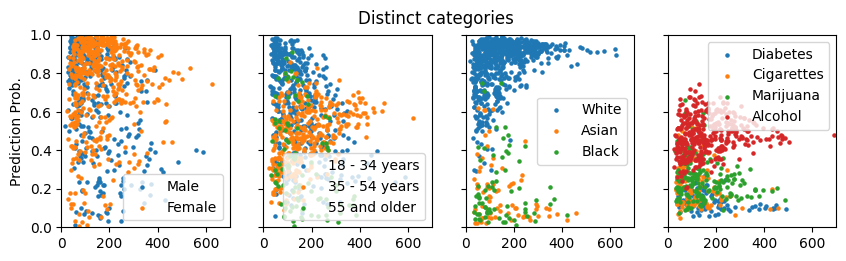

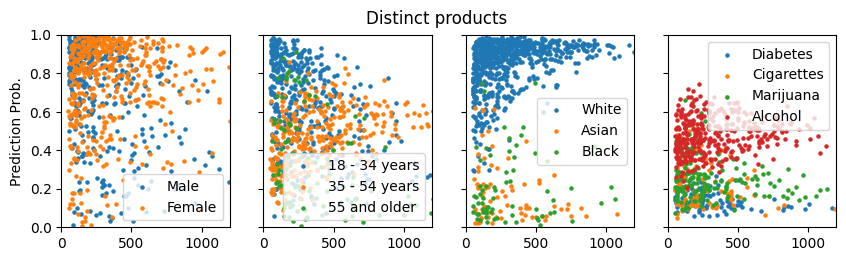

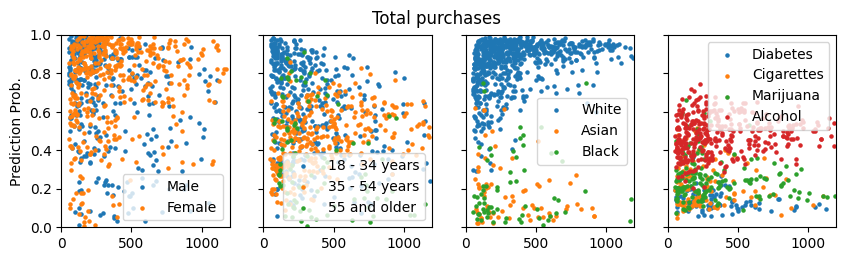

In [47]:
# Total purchases

cols = len(socio_groups)
fig, axes = plt.subplots(1,cols, figsize=(2.5*cols,2.5), sharey=True, sharex=True)
for i, (socio, labels) in enumerate(socio_groups.items()):
    ax = axes[i]
    if i == 0:
        ax.set_ylabel('Prediction Prob.')
        ax.set_xlim(0, 700)
        ax.set_ylim(0, 1)
    for label in labels:
        df = l1_probabilities_v_behavior[label]
        ax.scatter(df['categories'], df['Pred. Prob'], label=label, s=5)
    ax.legend()
fig.suptitle('Distinct categories')
plt.show()

fig, axes = plt.subplots(1,cols, figsize=(2.5*cols,2.5), sharey=True, sharex=True)
for i, (socio, labels) in enumerate(socio_groups.items()):
    ax = axes[i]
    if i == 0:
        ax.set_ylabel('Prediction Prob.')
        ax.set_xlim(0, 1200)
        ax.set_ylim(0, 1)
    for label in labels:
        df = l1_probabilities_v_behavior[label]
        ax.scatter(df['products'], df['Pred. Prob'], label=label, s=5)
    ax.legend()
fig.suptitle('Distinct products')
plt.show()

fig, axes = plt.subplots(1,cols, figsize=(2.5*cols,2.5), sharey=True, sharex=True)
for i, (socio, labels) in enumerate(socio_groups.items()):
    ax = axes[i]
    if i == 0:
        ax.set_ylabel('Prediction Prob.')
        ax.set_xlim(0, 1200)
        ax.set_ylim(0, 1)
    for label in labels:
        df = l1_probabilities_v_behavior[label]
        ax.scatter(df['total purchases'], df['Pred. Prob'], label=label, s=5)
    ax.legend()
fig.suptitle('Total purchases')
plt.show()

### Single purchasers

How does this change when the data are limited to users who are single households and do not share their amazon account with anyone?

single_pp50u_df: single person in household and using account (after other data restrictions)

i.e. 
- Q-amazon-use-howmany = 1
- Q-amazon-use-hh-size = 1

How many people do you share your Amazon account with? i.e. how many people log in and make orders using your account?
How many people are in your "household"?


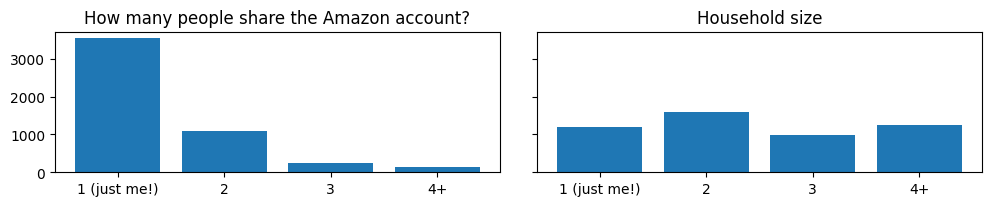

In [798]:
fig, axes = plt.subplots(1, 2, figsize=(10,2), sharey=True)
plt.tight_layout()
Q1 = 'Q-amazon-use-howmany'
print(fields_df.loc[Q1][0])
Q1_valcounts = survey_df[Q1].value_counts().sort_index()
# display(Q1_valcounts)
ax = axes[0]
ax.set_title('How many people share the Amazon account?')
ax.bar(Q1_valcounts.index, Q1_valcounts)
Q2 = 'Q-amazon-use-hh-size'
print(fields_df.loc[Q2][0])
Q2_valcounts = survey_df[Q2].value_counts().sort_index()
# display(Q2_valcounts)
ax = axes[1]
ax.set_title('Household size')
_ = ax.bar(Q2_valcounts.index, Q2_valcounts)

In [799]:
# add a flag to the survey df indicating if someone is a single purchaser
SINGLE_PURCHASER = 'Single purchaser'
def is_single_purchaser(row):
    return ((row['Q-amazon-use-howmany']=='1 (just me!)') and (row['Q-amazon-use-hh-size']=='1 (just me!)'))

survey_df[SINGLE_PURCHASER] = survey_df.apply(is_single_purchaser, axis=1)
single_purchaser_rids = survey_df[survey_df[SINGLE_PURCHASER]==True].index.tolist()
print('%0.3f = %s/%s of users are single purchasers' % (len(single_purchaser_rids)/len(survey_df), len(single_purchaser_rids), len(survey_df)))

0.216 = 1086/5027 of users are single purchasers


In [800]:
X_single_purchaser = X.loc[list(set.intersection(set(single_purchaser_rids), set(p50_users)))]
print('%s/%s of the users who purchased at least 50 products are single purchasers' % (
len(X_single_purchaser), len(X)))
# X_single_purchaser.head(3)

898/4248 of the users who purchased at least 50 products are single purchasers


In [811]:
print('TODO: get rid of this')
print('For the participants restricted to at least 50 unique products purchased:')
for l in new_child_labels:
    print('%s: n=%s' % (l, labeled_y[l].loc[single_purchaser_rids].sum()))

TODO: get rid of this
For the participants restricted to at least 50 unique products purchased:
Became pregnant: n=5
Had a child: n=7
New child: n=9


In [801]:
nonsingle_purchaser_rids = survey_df[survey_df[SINGLE_PURCHASER]==False].index.tolist()
X_nonsingle_purchaser = X.loc[list(set.intersection(set(nonsingle_purchaser_rids), set(p50_users)))]
print('%s/%s of the users who purchased at least 50 products are NON-single purchasers' % (
len(X_nonsingle_purchaser), len(X)))
# X_single_purchaser.head(3)

3350/4248 of the users who purchased at least 50 products are NON-single purchasers


#### Single purchasers vs non-single purchasers

Compare the probability scores for single vs non-single purchasers

In [802]:
single_purchaser_rids = survey_df[survey_df[SINGLE_PURCHASER]==True].index.tolist()
nonsingle_purchaser_rids = survey_df[survey_df[SINGLE_PURCHASER]==False].index.tolist()

Make an accuracy score results table:

```
label, Single purchaser, Non-single purchaser
```

In [820]:
"""
Make a dict:
accuracy_results_single_vs_non
{label: {'Single purchaser': AUC, 'Non-single purchaser': AUC}
where the test sample is limited to either single purchasers or non-single purchasers
"""
use_labels = X_y_data.keys()
score_single_vs_non = dict()
for i, label in enumerate(use_labels):
    if label == 'Became pregnant': continue
    print('%s: %s: %s' % (datetime.datetime.now(), i, label))
    score_single_vs_non[label] = dict()
    clf = onehot_svm_models[label]
    # get the test data
    _X_train, X_test, _y_train, y_test = X_y_data[label]['train_test_split']
    # single purchasers
    sp_X_test = X_test[X_test.index.isin(single_purchaser_rids)]
    sp_y_test = y_test[y_test.index.isin(single_purchaser_rids)]
    # non single purchasers
    nsp_X_test = X_test[X_test.index.isin(nonsingle_purchaser_rids)]
    nsp_y_test = y_test[y_test.index.isin(nonsingle_purchaser_rids)]
    score_single_vs_non[label]['Single purchaser'] = get_auc_and_plot(clf, sp_X_test, sp_y_test, plot=False)
    score_single_vs_non[label]['Non-single purchaser'] = get_auc_and_plot(clf, nsp_X_test, nsp_y_test, plot=False)

2024-06-12 16:08:34.918022: 0: Male
2024-06-12 16:08:37.114093: 1: Female
2024-06-12 16:08:39.319349: 2: 18 - 34 years
2024-06-12 16:08:42.155875: 3: 35 - 54 years
2024-06-12 16:08:45.150936: 4: 55 and older
2024-06-12 16:08:47.292594: 5: White
2024-06-12 16:08:49.828794: 6: Black
2024-06-12 16:08:51.883634: 7: Asian
2024-06-12 16:08:54.009843: 8: Hispanic
2024-06-12 16:08:56.637920: 9: Less than $50,000
2024-06-12 16:08:59.667142: 10: \$50,000 - \$99,999
2024-06-12 16:09:02.850726: 11: $100,000 or more
2024-06-12 16:09:05.689211: 12: Diabetes
2024-06-12 16:09:08.353993: 13: Cigarettes
2024-06-12 16:09:11.008469: 14: Marijuana
2024-06-12 16:09:13.850970: 15: Alcohol
2024-06-12 16:09:16.816325: 17: Had a child
2024-06-12 16:09:18.112229: 18: New child


In [821]:
# make the table
score_single_vs_non_df = pd.DataFrame({
    'label': score_single_vs_non.keys(),
    'Single purchaser': [score_single_vs_non[l]['Single purchaser'] for l in score_single_vs_non.keys()],
    'Non-single purchaser': [score_single_vs_non[l]['Non-single purchaser'] for l in score_single_vs_non.keys()],
}).set_index('label')
score_single_vs_non_df.round(3)

,Single purchaser,Non-single purchaser
label,,
Male,0.963,0.869
Female,0.968,0.892
18 - 34 years,0.822,0.800
35 - 54 years,0.653,0.718
55 and older,0.886,0.855
White,0.757,0.786
Black,0.822,0.810
Asian,0.715,0.770
Hispanic,0.580,0.594


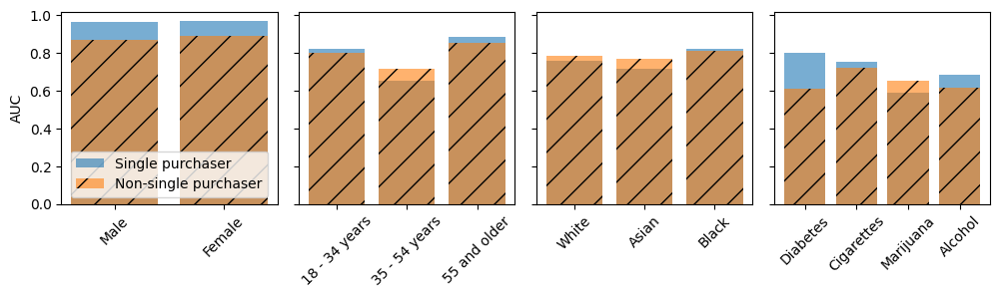

In [822]:
# Plot results
c_sp = 'tab:blue'
c_nsp = 'tab:orange'

cols = len(socio_groups)
fig, axes = plt.subplots(1,cols, figsize=(3*cols, 2.5), sharey=True)
plt.subplots_adjust(wspace=0.1)
for i, (socio, labels) in enumerate(socio_groups.items()):
    ax = axes[i]
    if i == 0:
        ax.set_ylabel('AUC')
    sp_data = score_single_vs_non_df.loc[labels]['Single purchaser']
    nsp_data = score_single_vs_non_df.loc[labels]['Non-single purchaser']
    ax.bar(sp_data.index, sp_data, color=c_sp, alpha=0.6, hatch=None, label='Single purchaser')
    ax.bar(nsp_data.index, nsp_data, color=c_nsp, alpha=0.6, hatch='/', label='Non-single purchaser')
    if i==0: 
        ax.set_ylabel('AUC')
        ax.legend(loc='lower center')
    ax.tick_params(axis='x', labelrotation=45)

In [59]:
import scipy.stats as st

def get_CI_colname(label):
    return '%s 95 CI'%label

### How does more information about consumers' purchases contribute to risk?

We assess this in multiple ways.



#### Subsampling categories


Subsample categories from the list of total categories used in the main models and use this subsample to trian and test the models. 

##### Groups of categories related to acquisitions

- 0: Starting with books
- 1: Footwear products (Zappos)
- 2: Whole foods products (Whole foods market acquisition)
- 3: Everything else

0. Books only

Use only products in the books table (have ISBNs)

In [324]:
books_table.head(3)

,purchasers,Category,Title
ASIN/ISBN (Product Code),,,
0143127748,65,ABIS_BOOK,"The Body Keeps the Score: Brain, Mind, and Body in the Healing of Trauma"
1524763136,63,ABIS_BOOK,Becoming
0735211299,59,ABIS_BOOK,Atomic Habits: An Easy & Proven Way to Build Good Habits & Break Bad Ones


In [330]:
books_cats = set(books_table[RENAMED_CATEGORY].unique()).intersection(set(cats_u50))
print('%s books categories' % len(list(books_table[RENAMED_CATEGORY].unique())))
print('%s books categories purchased by at least 50 users' % len(books_cats))

190 books categories
172 books categories purchased by at least 50 users


In [331]:
books_amzn_data = p50u_amzn_data[p50u_amzn_data[PRODUCT_CODE].isin(books_table.index)]
print('%s purchases in data limited to books' % len(books_amzn_data))
books_amzn_data[[DATE,TOTAL_SPEND,QUANTITY,TITLE,PRODUCT_CODE,CATEGORY,RESPONSE_ID]].head(3)

86976 purchases in data limited to books


,Order Date,spend,Quantity,Title,ASIN/ISBN (Product Code),Category,Survey ResponseID
163,2018-02-11,14.02,1.0,"TASC Strategies, Practice & Review 2017-2018 with 2 Practice Tests: Online + Book (Kaplan Test Prep)",1625233000,ABIS_BOOK,R_037XK72IZBJyF69
164,2018-02-14,19.36,1.0,GED Test Prep Plus 2018: 2 Practice Tests + Proven Strategies + Online (Kaplan Test Prep),1506223605,ABIS_BOOK,R_037XK72IZBJyF69
185,2018-04-19,7.95,1.0,"Awakening at Midlife: A Guide to Reviving Your Spirit, Recreating Your Life, and Returning to Your Truest Self",1573226327,ABIS_BOOK,R_037XK72IZBJyF69


In [333]:
print('Getting feature vectors from books data')
print(datetime.datetime.now())
X_books = get_X_one_hot_encoding_for_categories(books_amzn_data, books_categories)
print(datetime.datetime.now())

Getting feature vectors from books data
2024-06-25 09:51:23.164942
2024-06-25 09:51:23.822839


In [334]:
X_y_data_books = setup_labeled_X_y_data(X_books, labeled_y)


2024-06-25 09:52:01.464036
1/4: books SVM for socio Gender: ['Male', 'Female']

2024-06-25 09:52:01.464194
0/2: SVM for Male
Mean accuracy: 0.5299
ROC AUC=0.559

2024-06-25 09:52:06.282898
1/2: SVM for Female
Mean accuracy: 0.5247
ROC AUC=0.552

2024-06-25 09:52:11.098532
2/4: books SVM for socio Age: ['18 - 34 years', '35 - 54 years', '55 and older']

2024-06-25 09:52:11.098626
0/3: SVM for 18 - 34 years
Mean accuracy: 0.5703
ROC AUC=0.587

2024-06-25 09:52:16.011969
1/3: SVM for 35 - 54 years
Mean accuracy: 0.5898
ROC AUC=0.560

2024-06-25 09:52:20.942331
2/3: SVM for 55 and older
Mean accuracy: 0.3359
ROC AUC=0.532

2024-06-25 09:52:26.159776
3/4: books SVM for socio Race: ['White', 'Asian', 'Black']

2024-06-25 09:52:26.160368
0/3: SVM for White
Mean accuracy: 0.4661
ROC AUC=0.600

2024-06-25 09:52:30.869057
1/3: SVM for Asian
Mean accuracy: 0.4583
ROC AUC=0.586

2024-06-25 09:52:35.363313
2/3: SVM for Black
Mean accuracy: 0.3984
ROC AUC=0.619

2024-06-25 09:52:39.779582
4/4: book

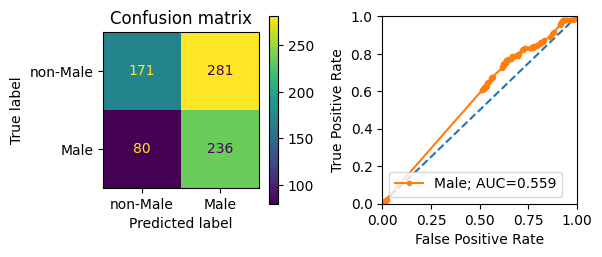

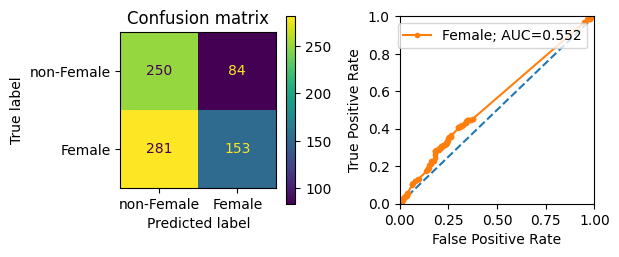

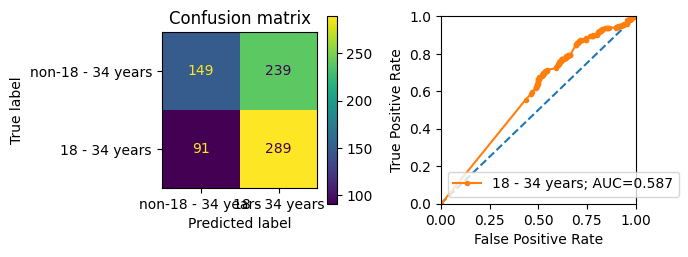

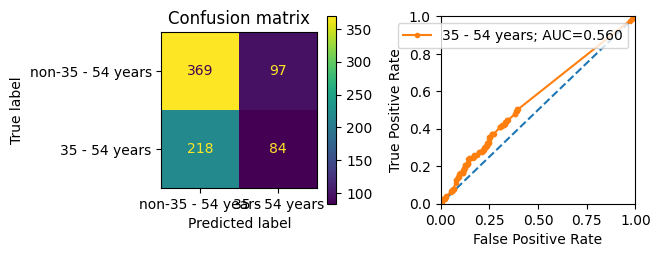

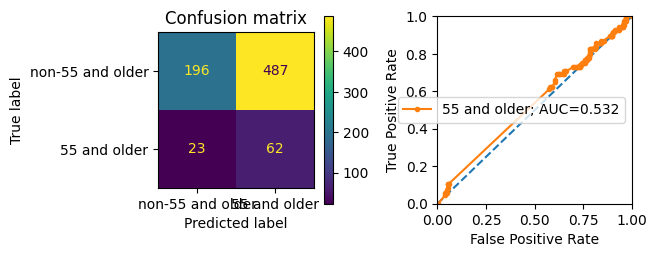

...

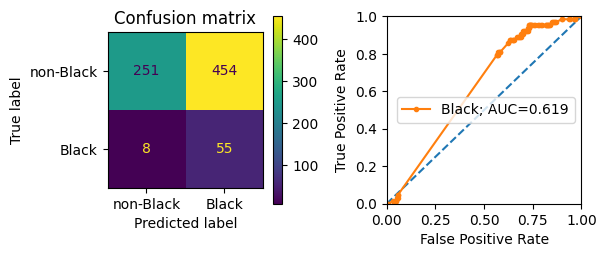

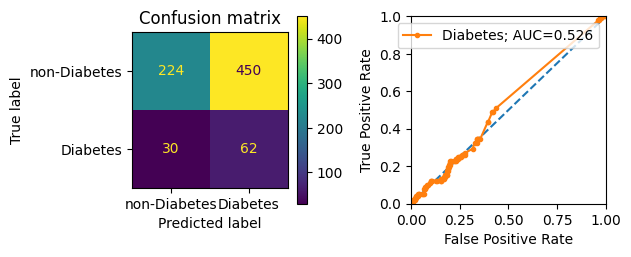

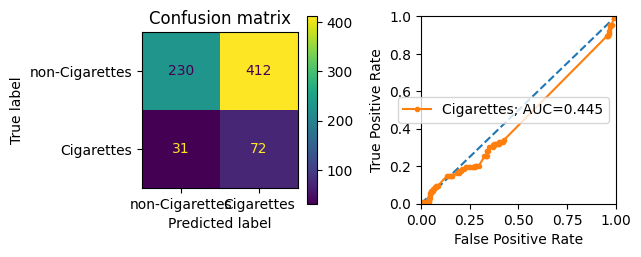

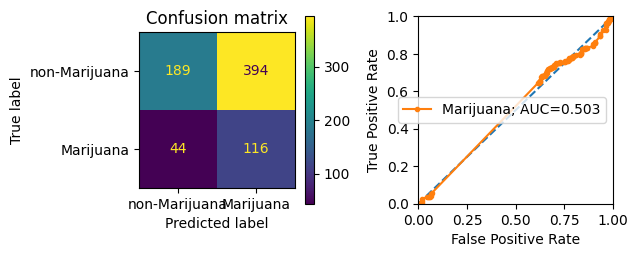

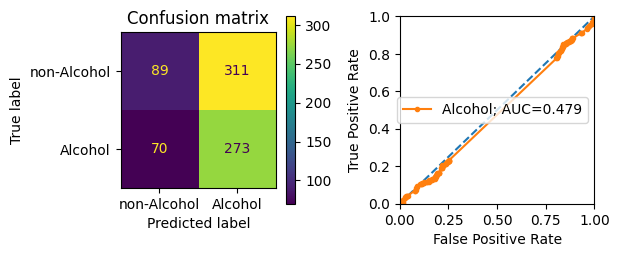

In [335]:
# results dict: map label to svm results
books_svm_results = dict()
for i, (socio, labels) in enumerate(socio_groups.items()):
    print('\n%s\n%s/%s: books SVM for socio %s: %s' % (
        datetime.datetime.now(), i+1, len(socio_groups), socio, labels))
    for l, label in enumerate(labels):    
        print('\n%s\n%s/%s: SVM for %s' % (datetime.datetime.now(), l, len(labels), label))
        X_train, X_test, y_train, y_test = X_y_data_books[label]['train_test_split']
        clf = svm.SVC(probability=True, class_weight='balanced', random_state=RANDOM)
        clf.fit(X_train, y_train)
        auc = get_auc_and_plot(clf, X_test, y_test)
        books_svm_results[label] = auc

In [336]:
# show a table with the AUROC scores
pd.DataFrame({
    'AUROC': books_svm_results.values(),
}, index=list(books_svm_results.keys())).round(3)

,AUROC
Male,0.559
Female,0.552
18 - 34 years,0.587
35 - 54 years,0.560
55 and older,0.532
White,0.600
Asian,0.586
Black,0.619
Diabetes,0.526
Cigarettes,0.445


1. Footwear 

With books

In [337]:
footwear_cats = list(footwear_table[CATEGORY].unique())
print('%s footwear categories' % len(footwear_cats))
footwear_table.head()

18 footwear categories


,purchasers,Category,Title
ASIN/ISBN (Product Code),,,
B004QF0TFQ,42,MEN:SOCKS,Dickies Men's Dri-tech Moisture Control Crew Socks Multipack
B008M5S09S,24,MEN:SOCKS,Dickies Men's Dri-tech Moisture Control Crew Socks Multipack
B01MXIE9RT,21,MEN:SOCKS,Fruit of the Loom Mens Essential 6 Pack Casual Crew Socks | Arch Support | Black & White
B075P7R3VN,21,WOMEN:SOCKS,Jeasona Women's Cat Socks Cute Animal Socks Sunflower Owl Sloth Gifts for Women
B00AECT1ZE,20,MEN:SOCKS,Dickies Men's Dri-Tech Moisture Control Quarter Socks Multi-Pack


In [338]:
books_footwear_cats = list(books_cats) + list(footwear_cats)
print('%s books + footwear categories' % len(books_footwear_cats))

190 books + footwear categories


In [339]:
print('Getting feature vectors from books + footwear data')
print(datetime.datetime.now())
X_books_footwear = get_X_one_hot_encoding_for_categories(
    p50u_amzn_data[
        (p50u_amzn_data[PRODUCT_CODE].isin(books_table.index)) |\
        (p50u_amzn_data[CATEGORY].isin(footwear_cats))
    ], books_footwear_cats)
print(datetime.datetime.now())
X_y_data_books_footwear = setup_labeled_X_y_data(X_books_footwear, labeled_y)

Getting feature vectors from books + footwear data
2024-06-25 09:55:50.498340
2024-06-25 09:55:51.588374



2024-06-25 09:55:59.208476
1/4: Books + Footwear SVM for socio Gender: ['Male', 'Female']

2024-06-25 09:55:59.208724
1/2: SVM for Male
Mean accuracy: 0.6634
ROC AUC=0.746

2024-06-25 09:56:03.826351
2/2: SVM for Female
Mean accuracy: 0.6938
ROC AUC=0.761

2024-06-25 09:56:08.332322
2/4: Books + Footwear SVM for socio Age: ['18 - 34 years', '35 - 54 years', '55 and older']

2024-06-25 09:56:08.332386
1/3: SVM for 18 - 34 years
Mean accuracy: 0.5893
ROC AUC=0.610

2024-06-25 09:56:14.104527
2/3: SVM for 35 - 54 years
Mean accuracy: 0.5978
ROC AUC=0.595

2024-06-25 09:56:19.926672
3/3: SVM for 55 and older
Mean accuracy: 0.7084
ROC AUC=0.475

2024-06-25 09:56:25.235630
3/4: Books + Footwear SVM for socio Race: ['White', 'Asian', 'Black']

2024-06-25 09:56:25.235707
1/3: SVM for White
Mean accuracy: 0.5431
ROC AUC=0.623

2024-06-25 09:56:30.734060
2/3: SVM for Asian
Mean accuracy: 0.6221
ROC AUC=0.643

2024-06-25 09:56:35.930490
3/3: SVM for Black
Mean accuracy: 0.6015
ROC AUC=0.570

202

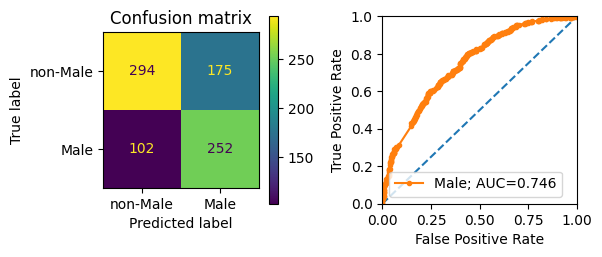

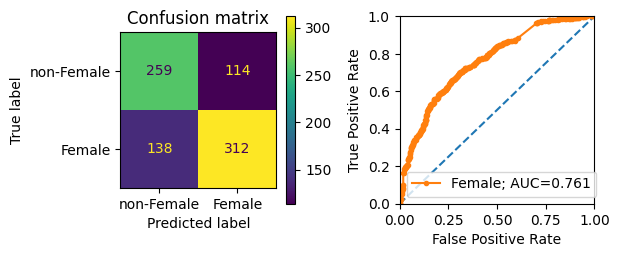

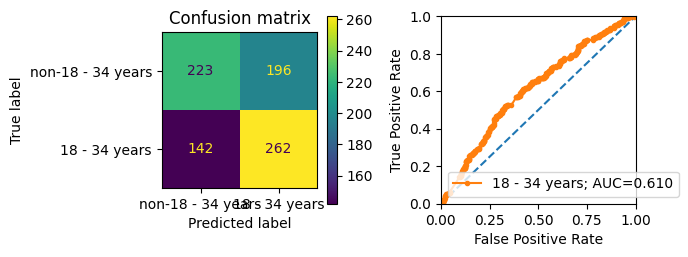

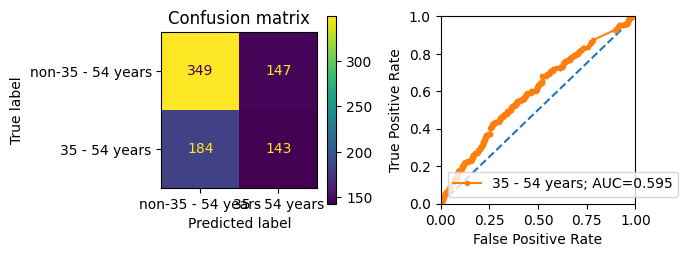

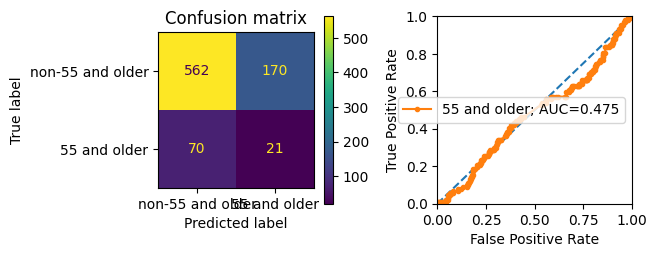

...

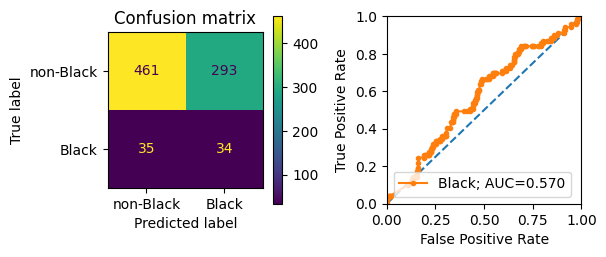

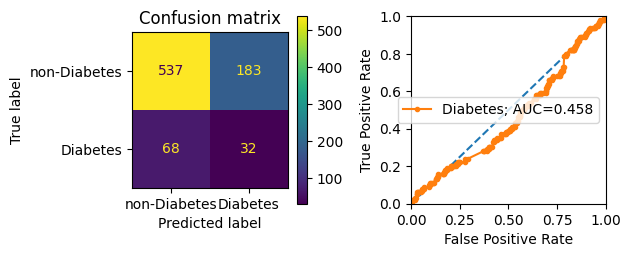

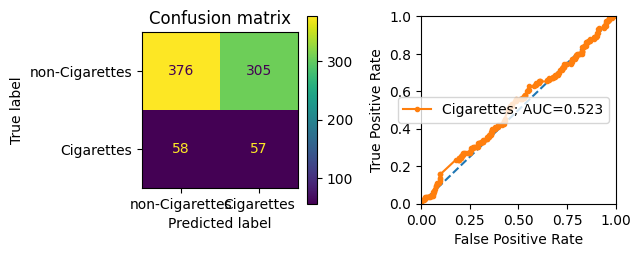

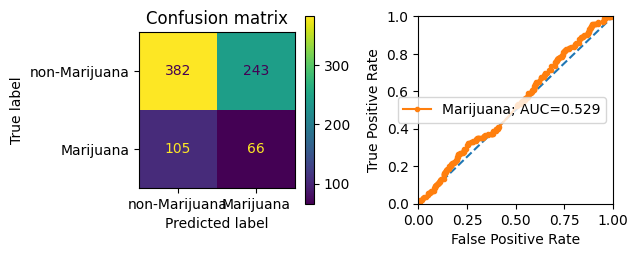

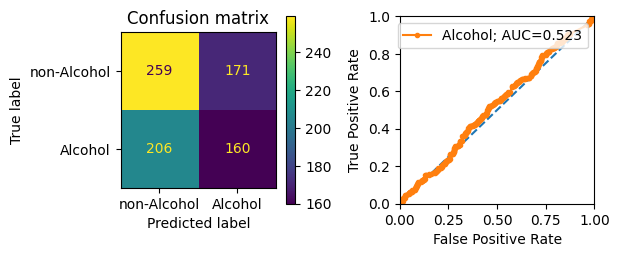

In [340]:
# results dict: map label to svm results
books_footwear_svm_results = dict()
for i, (socio, labels) in enumerate(socio_groups.items()):
    print('\n%s\n%s/%s: Books + Footwear SVM for socio %s: %s' % (
        datetime.datetime.now(), i+1, len(socio_groups), socio, labels))
    for l, label in enumerate(labels):    
        print('\n%s\n%s/%s: SVM for %s' % (datetime.datetime.now(), l+1, len(labels), label))
        X_train, X_test, y_train, y_test = X_y_data_books_footwear[label]['train_test_split']
        clf = svm.SVC(probability=True, class_weight='balanced', random_state=RANDOM)
        clf.fit(X_train, y_train)
        auc = get_auc_and_plot(clf, X_test, y_test)
        books_footwear_svm_results[label] = auc

3. Whole Foods products

With books and footwear

In [341]:
wholefoods_cats = set(wholefoods_table[CATEGORY].unique()).intersection(cats_u50)
wholefoods_table.head()

,purchasers,Category,Title
ASIN/ISBN (Product Code),,,
B074H4WRNG,80,VEGETABLE,"365 by Whole Foods Market, Organic Baby Spinach, 5 oz"
B077L5RXJY,61,VEGETABLE,"365 by Whole Foods Market, Broccoli Florets, 12 Ounce"
B074H5B5H7,48,VEGETABLE,"365 by Whole Foods Market, Broccoli Florets, 16 Ounce"
B074H5HJ32,47,EGG,"365 by Whole Foods Market, Cage-Free Large Brown Grade A Eggs, 12 Count (Pack of 1)"
B074J9RL65,40,EDIBLE_OIL_VEGETABLE,"365 by Whole Foods Market, Oil Olive Extra Virgin Mediterranean Blend, 33.8 Fl Oz"


In [342]:
print('%s Whole Foods categories' % len(wholefoods_cats))
books_footwear_wf_cats = list(books_cats) + list(footwear_cats) + list(wholefoods_cats)
print('%s books + footwear + Whole Foods categories' % len(books_footwear_wf_cats))

119 Whole Foods categories
309 books + footwear + Whole Foods categories


In [343]:
print('Getting feature vectors from books + footwear + WF data')
print(datetime.datetime.now())
X_books_footwear_wf = get_X_one_hot_encoding_for_categories(
    p50u_amzn_data[
        (p50u_amzn_data[PRODUCT_CODE].isin(books_table.index)) |\
        (p50u_amzn_data[CATEGORY].isin(footwear_cats)) |\
        (p50u_amzn_data[CATEGORY].isin(wholefoods_cats))
    ], books_footwear_wf_cats)
print(datetime.datetime.now())
X_y_data_books_footwear_wf = setup_labeled_X_y_data(X_books_footwear_wf, labeled_y)

Getting feature vectors from books + footwear + WF data
2024-06-25 09:57:11.430831
2024-06-25 09:57:16.878328



2024-06-25 09:57:23.519240
1/4: Books + Footwear SVM for socio Gender: ['Male', 'Female']

2024-06-25 09:57:23.519520
1/2: SVM for Male
Mean accuracy: 0.7188
ROC AUC=0.795

2024-06-25 09:57:31.281710
2/2: SVM for Female
Mean accuracy: 0.7365
ROC AUC=0.808

2024-06-25 09:57:39.102857
2/4: Books + Footwear SVM for socio Age: ['18 - 34 years', '35 - 54 years', '55 and older']

2024-06-25 09:57:39.102940
1/3: SVM for 18 - 34 years
Mean accuracy: 0.6329
ROC AUC=0.685

2024-06-25 09:57:48.229974
2/3: SVM for 35 - 54 years
Mean accuracy: 0.5918
ROC AUC=0.621

2024-06-25 09:57:57.831204
3/3: SVM for 55 and older
Mean accuracy: 0.8294
ROC AUC=0.661

2024-06-25 09:58:05.665499
3/4: Books + Footwear SVM for socio Race: ['White', 'Asian', 'Black']

2024-06-25 09:58:05.665587
1/3: SVM for White
Mean accuracy: 0.6894
ROC AUC=0.682

2024-06-25 09:58:14.028975
2/3: SVM for Asian
Mean accuracy: 0.8129
ROC AUC=0.665

2024-06-25 09:58:21.410893
3/3: SVM for Black
Mean accuracy: 0.8482
ROC AUC=0.696

202

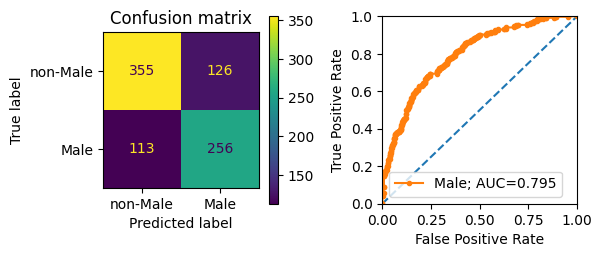

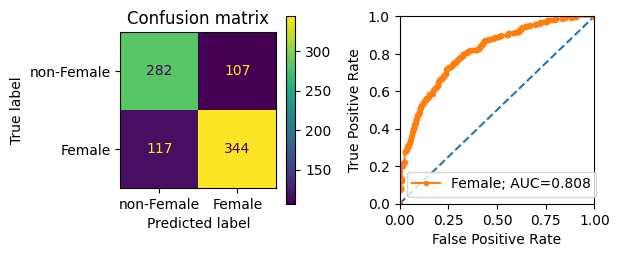

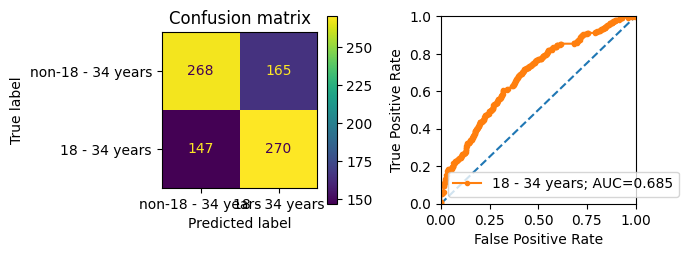

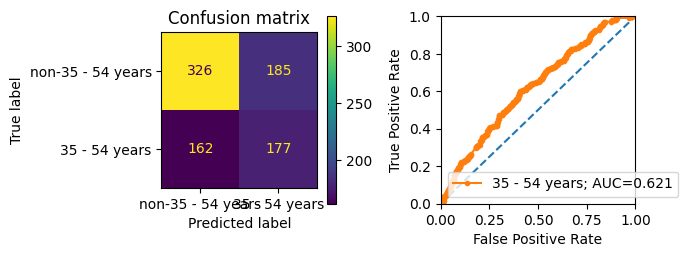

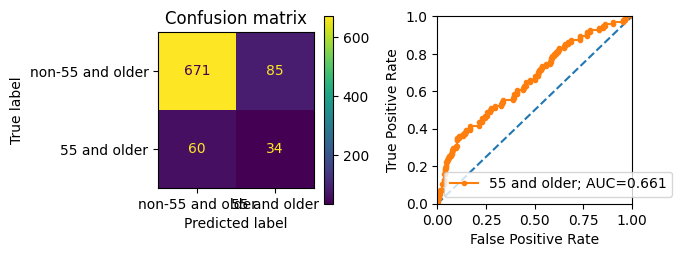

...

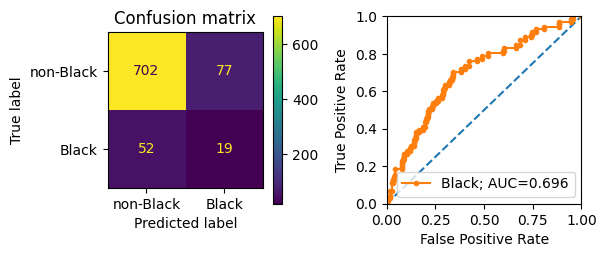

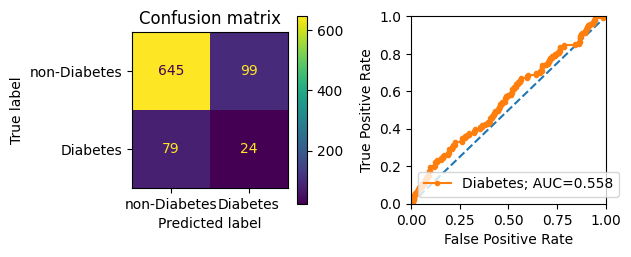

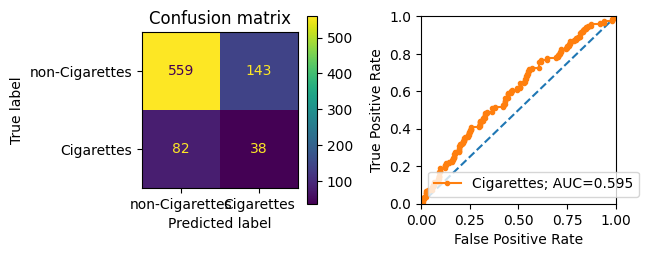

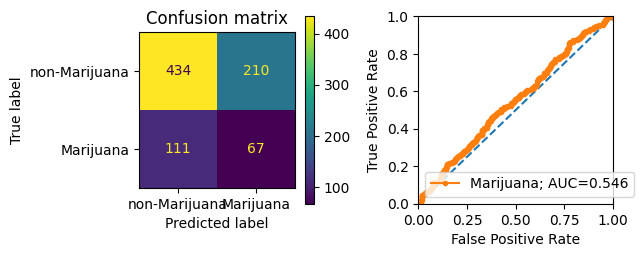

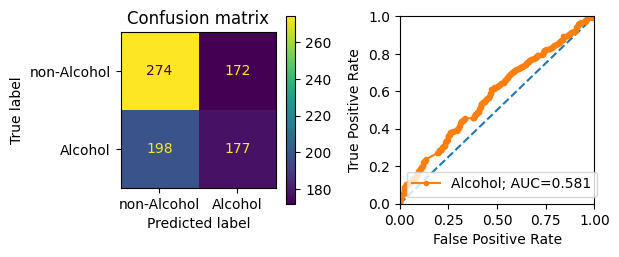

In [344]:
# results dict: map label to svm results
books_footwear_wf_svm_results = dict()
for i, (socio, labels) in enumerate(socio_groups.items()):
    print('\n%s\n%s/%s: Books + Footwear SVM for socio %s: %s' % (
        datetime.datetime.now(), i+1, len(socio_groups), socio, labels))
    for l, label in enumerate(labels):    
        print('\n%s\n%s/%s: SVM for %s' % (datetime.datetime.now(), l+1, len(labels), label))
        X_train, X_test, y_train, y_test = X_y_data_books_footwear_wf[label]['train_test_split']
        clf = svm.SVC(probability=True, class_weight='balanced', random_state=RANDOM)
        clf.fit(X_train, y_train)
        auc = get_auc_and_plot(clf, X_test, y_test)
        books_footwear_wf_svm_results[label] = auc

In [345]:
# how many total categories for each set of models?
print('Categories for models')
print('%s categories for books models' % X_books.shape[1])
print('%s categories for books + footwear models' % X_books_footwear.shape[1])
print('%s categories for books + footwear + whole foods models' % 
      X_books_footwear_wf.shape[1])
print('%s categories for all products models' % X.shape[1])
# show a table with the AUROC scores
print('\nAUROC')
acquisition_cats_results_df = pd.DataFrame({
    'Books': books_svm_results.values(),
    'With Footwear': books_footwear_svm_results.values(),
    'With Whole Foods': books_footwear_wf_svm_results.values(),
    'All Products': [onehot_svm_results[k] for k in books_svm_results.keys()],
}, index=list(books_svm_results.keys()))
acquisition_cats_results_df.round(3)

Categories for models
177 categories for books models
188 categories for books + footwear models
290 categories for books + footwear + whole foods models
1562 categories for all products models

AUROC


,Books,With Footwear,With Whole Foods,All Products
Male,0.559,0.746,0.795,0.894
Female,0.552,0.761,0.808,0.911
18 - 34 years,0.587,0.610,0.685,0.804
35 - 54 years,0.560,0.595,0.621,0.707
55 and older,0.532,0.475,0.661,0.869
White,0.600,0.623,0.682,0.780
Asian,0.586,0.643,0.665,0.759
Black,0.619,0.570,0.696,0.812
Diabetes,0.526,0.458,0.558,0.620
Cigarettes,0.445,0.523,0.595,0.724


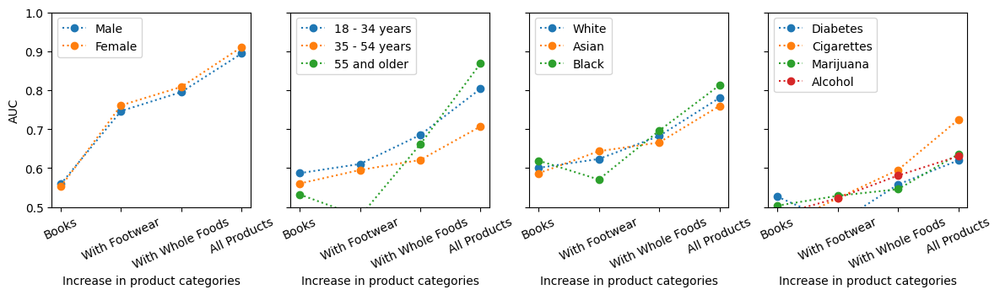

In [346]:
xticks = list(range(4))
xlabels = ['Books', 'With\nFootwear','With\nWhole Foods', 'All\nProducts']
xlabels = ['Books', 'With Footwear','With Whole Foods', 'All Products']

cols = len(socio_groups)
fig, axes = plt.subplots(1,cols, figsize=(3.5*cols,3), sharey=True, sharex=True)
plt.subplots_adjust(wspace=0.2)
for i, (socio, labels) in enumerate(socio_groups.items()):
    ax = axes[i]
    if i == 0:
        ax.set_ylabel('AUC')
        ax.set_ylim(0.5, 1)
    for label in labels:
        ax.plot(xticks, acquisition_cats_results_df.loc[label], label=label, 
                linestyle=':', marker="o", markersize=6, markerfacecolor=None)
    ax.set_xticks(xticks, labels=xlabels)
    _ = ax.tick_params(axis='x', labelrotation=25)
    ax.set_xlabel('Increase in product categories')
    _ = ax.legend(loc='upper left')



##### Random fraction of categories


For p in [%, ... ]:
- Randomly sample p categories from the categories list.
- Limit the train and test feature vectors to these categories
- Train and test model
- With repeated sampling to create means and confidence intervals (except for 100%)


In [60]:
"""
Make a dict
{p: {label: [auc results]} for p in [, ...100%]}
"""
import random

ps = [p/100 for p in [1, 2, 3, 4, 5, 10, 15, 20, 30, 40, 50, 60, 70, 80, 90, 100]]
print(ps)

USE_CATS = cats_u50

def get_svm_results_varying_p_categories(X_y_data, use_labels, repeated_samples=10, verbose=True):
    print('getting SVM results for varying categories with %s repeated samples for labels: %s\np: %s' % (
            repeated_samples, use_labels, ps))
    p_svm_results = {p: {label: [] for label in use_labels} for p in ps}
    for l, label in enumerate(use_labels):
        print('\n%s\n%s/%s: SVM for %s' % (datetime.datetime.now(), l+1, len(use_labels), label))
        X_train, X_test, y_train, y_test = X_y_data[label]['train_test_split']
        for p in ps:
            for i in range(repeated_samples):
                random.seed(RANDOM+i)
                p_i_cats = random.sample(USE_CATS, k=int(p*len(USE_CATS)))
                p_i_X_train = X_train[p_i_cats]
                p_i_X_test = X_test[p_i_cats]
                if (i==0): print('%s: train with p=%0.2f --> %s categories' % (datetime.datetime.now(), p, len(p_i_cats)))
                clf = svm.SVC(probability=True, class_weight='balanced')
                clf.fit(p_i_X_train, y_train)
                auc = get_auc_and_plot(clf, p_i_X_test, y_test, plot=False)
                p_svm_results[p][label] += [auc]
                if p==1: 
                    if verbose: print('n==100')
                    break
    return p_svm_results

[0.01, 0.02, 0.03, 0.04, 0.05, 0.1, 0.15, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]


In [61]:
socio_recompute = {
    'Gender': False, #True,
    'Age': False, #True,
    'Race': False, #True,
    'Health / lifestyle': False, #True,
}

def get_fpath(socio):
    return './preprocessed/varying_p_cats_AUC_%s.csv' % socio[:4]

# get dictionary of dataframes. Can merge into one dataframe
p_svm_results_dfs = dict() # {socio: dataframe}

r = 10

for i, (socio, recompute) in enumerate(socio_recompute.items()):
    fpath = get_fpath(socio)
    print('%s/%s: %s: %s' % (i, len(socio_recompute), socio, fpath))
    if recompute:
        labels = socio_groups[socio]
        print(labels)
        p_svm_results = get_svm_results_varying_p_categories(X_y_data, labels, repeated_samples=r)
        p_svm_results_df = pd.DataFrame({
            'p':ps,
        }).set_index('p')
        for label in labels:
            means = []
            CIs = []
            for p in ps:
                data = p_svm_results[p][label]
                means += [np.mean(data).round(3)]
                if len(data) > 1:
                    (CI_l, CI_u) = st.t.interval(0.95, len(data)-1, loc=np.mean(data), scale=st.sem(data))
                    CIs += [(CI_l.round(3), CI_u.round(3))]
                else:
                    CIs += [np.nan]
            p_svm_results_df[label] = means
            p_svm_results_df[get_CI_colname(label)] = CIs
        # Save the data
        print('saving table to %s...' % fpath)
        p_svm_results_df.to_csv(fpath)
        print('...saved')
    p_svm_results_dfs[socio] = pd.read_csv(fpath, index_col=0)


0/4: Gender: ./preprocessed/varying_p_cats_AUC_Gend.csv
1/4: Age: ./preprocessed/varying_p_cats_AUC_Age.csv
2/4: Race: ./preprocessed/varying_p_cats_AUC_Race.csv
3/4: Health / lifestyle: ./preprocessed/varying_p_cats_AUC_Heal.csv


In [62]:
# merge
from functools import reduce

pct_cats_svm_results_df = reduce(lambda  left,right: pd.merge(left,right, left_index=True, right_index=True), p_svm_results_dfs.values())
pct_cats_svm_results_df

,Male,Male 95 CI,Female,Female 95 CI,18 - 34 years,18 - 34 years 95 CI,35 - 54 years,35 - 54 years 95 CI,55 and older,55 and older 95 CI,...,Black,Black 95 CI,Diabetes,Diabetes 95 CI,Cigarettes,Cigarettes 95 CI,Marijuana,Marijuana 95 CI,Alcohol,Alcohol 95 CI
p,,,,,,,,,,,,,,,,,,,,,
0.01,0.593,"(0.562, 0.624)",0.569,"(0.557, 0.58)",0.544,"(0.532, 0.556)",0.539,"(0.522, 0.556)",0.551,"(0.527, 0.575)",...,0.535,"(0.505, 0.564)",0.508,"(0.481, 0.535)",0.528,"(0.508, 0.549)",0.515,"(0.498, 0.533)",0.523,"(0.512, 0.534)"
0.02,0.634,"(0.619, 0.649)",0.654,"(0.622, 0.686)",0.585,"(0.571, 0.599)",0.547,"(0.531, 0.563)",0.574,"(0.548, 0.6)",...,0.574,"(0.535, 0.613)",0.488,"(0.464, 0.512)",0.535,"(0.515, 0.554)",0.523,"(0.511, 0.536)",0.534,"(0.517, 0.551)"
0.03,0.667,"(0.646, 0.688)",0.679,"(0.659, 0.7)",0.610,"(0.593, 0.627)",0.561,"(0.546, 0.576)",0.584,"(0.56, 0.607)",...,0.599,"(0.566, 0.632)",0.509,"(0.491, 0.526)",0.562,"(0.545, 0.579)",0.524,"(0.499, 0.55)",0.536,"(0.521, 0.551)"
0.04,0.709,"(0.687, 0.732)",0.708,"(0.681, 0.735)",0.636,"(0.618, 0.654)",0.564,"(0.553, 0.576)",0.604,"(0.572, 0.636)",...,0.616,"(0.602, 0.63)",0.513,"(0.497, 0.53)",0.568,"(0.551, 0.586)",0.540,"(0.528, 0.552)",0.534,"(0.524, 0.544)"
0.05,0.722,"(0.706, 0.737)",0.725,"(0.704, 0.745)",0.636,"(0.621, 0.652)",0.581,"(0.571, 0.592)",0.600,"(0.574, 0.626)",...,0.631,"(0.602, 0.66)",0.526,"(0.515, 0.538)",0.574,"(0.551, 0.596)",0.543,"(0.527, 0.558)",0.558,"(0.542, 0.574)"
0.10,0.780,"(0.767, 0.793)",0.778,"(0.761, 0.795)",0.687,"(0.674, 0.699)",0.599,"(0.589, 0.61)",0.665,"(0.643, 0.687)",...,0.676,"(0.646, 0.706)",0.553,"(0.536, 0.57)",0.607,"(0.592, 0.621)",0.566,"(0.55, 0.582)",0.559,"(0.539, 0.578)"
0.15,0.799,"(0.793, 0.806)",0.815,"(0.802, 0.828)",0.705,"(0.692, 0.718)",0.617,"(0.604, 0.629)",0.692,"(0.669, 0.715)",...,0.709,"(0.682, 0.736)",0.542,"(0.528, 0.556)",0.629,"(0.614, 0.643)",0.572,"(0.556, 0.589)",0.584,"(0.575, 0.594)"
0.20,0.827,"(0.823, 0.831)",0.831,"(0.818, 0.843)",0.730,"(0.72, 0.741)",0.635,"(0.627, 0.643)",0.707,"(0.687, 0.727)",...,0.744,"(0.727, 0.761)",0.567,"(0.553, 0.581)",0.624,"(0.614, 0.634)",0.585,"(0.57, 0.6)",0.582,"(0.573, 0.59)"
0.30,0.839,"(0.833, 0.845)",0.849,"(0.845, 0.854)",0.751,"(0.744, 0.758)",0.648,"(0.641, 0.656)",0.758,"(0.741, 0.776)",...,0.761,"(0.744, 0.778)",0.574,"(0.557, 0.592)",0.652,"(0.644, 0.66)",0.601,"(0.585, 0.617)",0.588,"(0.573, 0.602)"


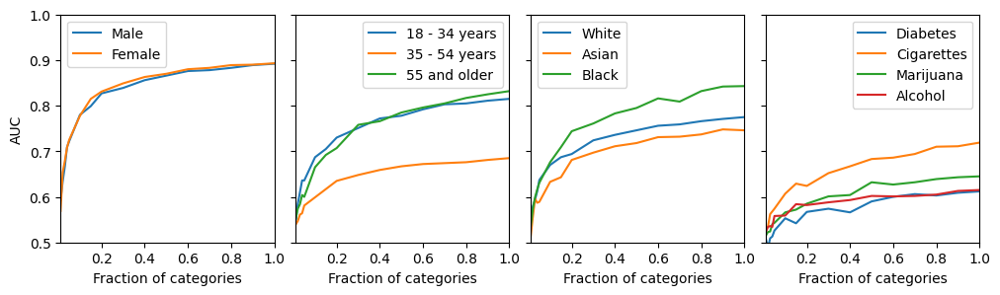

In [63]:
cols = len(socio_groups)
fig, axes = plt.subplots(1,cols, figsize=(3*cols,3), sharey=True, sharex=True)
plt.subplots_adjust(wspace=0.1)
for i, (socio, labels) in enumerate(socio_groups.items()):
    ax = axes[i]
    if i == 0:
        ax.set_ylabel('AUC')
        ax.set_xlim(0.01, 1)
        ax.set_ylim(0.5, 1)
    for label in labels:
        if label not in use_labels: continue
        ax.plot(pct_cats_svm_results_df[label], label=label)
    ax.set_xlabel('Fraction of categories')
    ax.legend()

##### Absolute numbers

subsample categories used from the total categories used in the main model.

For c in [1,2,3,4,5, 10, ..., 100]:
- Randomly sample c categories from the categories list.
- Limit the train and test feature vectors to these categories
- Train and test model
- With repeated sampling to create means and confidence intervals


In [64]:
"""
Make a dict
{c: {label: [auc results]} for c in [5, 10, 15, 200]}
"""

# cs = list(range(5,205,5))
cs = [1, 2, 3, 4, 5, 10, 15, 20, 30, 40, 50, 60, 70, 80, 90, 100]
# cs = list(range(20,120,20))
print(cs)

USE_CATS = cats_u50

def get_svm_results_varying_c_categories(X_y_data, use_labels, repeated_samples=10, verbose=True):
    print('getting SVM results for varying C categories with %s repeated samples for labels: %s\np: %s' % (
            repeated_samples, use_labels, cs))
    c_svm_results = {c: {label: [] for label in use_labels} for c in cs}
    for l, label in enumerate(use_labels):
        print('\n%s\n%s/%s: SVM for %s' % (datetime.datetime.now(), l+1, len(use_labels), label))
        X_train, X_test, y_train, y_test = X_y_data[label]['train_test_split']
        for c in cs:
            if (c%10==0): print('%s: C=%s' % (datetime.datetime.now(), c))
            for i in range(repeated_samples):
                random.seed(RANDOM+i)
                c_i_cats = random.sample(USE_CATS, c)
                c_i_X_train = X_train[c_i_cats]
                c_i_X_test = X_test[c_i_cats]
                clf = svm.SVC(probability=True, class_weight='balanced')
                clf.fit(c_i_X_train, y_train)
                auc = get_auc_and_plot(clf, c_i_X_test, y_test, plot=False)
                c_svm_results[c][label] += [auc]
    return c_svm_results

[1, 2, 3, 4, 5, 10, 15, 20, 30, 40, 50, 60, 70, 80, 90, 100]


In [65]:
socio_recompute = {
    'Gender': False, #True,
    'Age': False, #True,
    'Race': False, #True,
    'Health / lifestyle': False, #True,
}

def get_fpath(socio):
    return './preprocessed/varying_C_cats_AUC_%s.csv' % socio[:4]

# get dictionary of dataframes. Can merge into one dataframe
c_svm_results_dfs = dict() # {socio: dataframe}

r = 10 # repeated samples

for i, (socio, recompute) in enumerate(socio_recompute.items()):
    fpath = get_fpath(socio)
    print('%s/%s: %s: %s' % (i, len(socio_recompute), socio, fpath))
    if recompute:
        labels = socio_groups[socio]
        print(labels)
        c_svm_results = get_svm_results_varying_c_categories(X_y_data, labels, repeated_samples=r)
        c_svm_results_df = pd.DataFrame({
            'c':cs,
        }).set_index('c')
        for label in labels:
            means = []
            CIs = []
            for c in cs:
                data = c_svm_results[c][label]
                means += [np.mean(data).round(3)]
                (CI_l, CI_u) = st.t.interval(0.95, len(data)-1, loc=np.mean(data), scale=st.sem(data))
                CIs += [(CI_l.round(3), CI_u.round(3))]
            c_svm_results_df[label] = means
            c_svm_results_df[get_CI_colname(label)] = CIs
        # Save the data
        print('saving table to %s...' % fpath)
        c_svm_results_df.to_csv(fpath)
        print('...saved')
    c_svm_results_dfs[socio] = pd.read_csv(fpath, index_col=0)


0/4: Gender: ./preprocessed/varying_C_cats_AUC_Gend.csv
1/4: Age: ./preprocessed/varying_C_cats_AUC_Age.csv
2/4: Race: ./preprocessed/varying_C_cats_AUC_Race.csv
3/4: Health / lifestyle: ./preprocessed/varying_C_cats_AUC_Heal.csv


In [66]:
# merge
abs_c_svm_results_df = reduce(lambda  left,right: pd.merge(left,right, left_index=True, right_index=True), c_svm_results_dfs.values())
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(abs_c_svm_results_df)

,Male,Male 95 CI,Female,Female 95 CI,18 - 34 years,18 - 34 years 95 CI,35 - 54 years,35 - 54 years 95 CI,55 and older,55 and older 95 CI,White,White 95 CI,Asian,Asian 95 CI,Black,Black 95 CI,Diabetes,Diabetes 95 CI,Cigarettes,Cigarettes 95 CI,Marijuana,Marijuana 95 CI,Alcohol,Alcohol 95 CI
c,,,,,,,,,,,,,,,,,,,,,,,,
1,0.500,"(0.487, 0.513)",0.510,"(0.491, 0.53)",0.505,"(0.489, 0.52)",0.500,"(0.489, 0.512)",0.503,"(0.494, 0.511)",0.505,"(0.492, 0.518)",0.493,"(0.477, 0.509)",0.497,"(0.493, 0.5)",0.498,"(0.491, 0.505)",0.495,"(0.483, 0.506)",0.501,"(0.49, 0.512)",0.497,"(0.489, 0.504)"
2,0.510,"(0.492, 0.528)",0.522,"(0.489, 0.554)",0.515,"(0.505, 0.525)",0.513,"(0.5, 0.527)",0.511,"(0.493, 0.528)",0.509,"(0.501, 0.517)",0.505,"(0.489, 0.521)",0.521,"(0.504, 0.539)",0.502,"(0.487, 0.516)",0.513,"(0.503, 0.522)",0.494,"(0.483, 0.505)",0.501,"(0.49, 0.512)"
3,0.538,"(0.521, 0.556)",0.544,"(0.511, 0.578)",0.515,"(0.503, 0.528)",0.514,"(0.497, 0.531)",0.513,"(0.493, 0.532)",0.517,"(0.487, 0.548)",0.523,"(0.5, 0.547)",0.505,"(0.487, 0.523)",0.504,"(0.486, 0.522)",0.502,"(0.489, 0.515)",0.506,"(0.494, 0.518)",0.504,"(0.496, 0.513)"
4,0.557,"(0.532, 0.582)",0.540,"(0.518, 0.562)",0.530,"(0.515, 0.544)",0.526,"(0.507, 0.545)",0.496,"(0.485, 0.508)",0.529,"(0.511, 0.547)",0.522,"(0.498, 0.545)",0.519,"(0.501, 0.537)",0.499,"(0.477, 0.521)",0.520,"(0.507, 0.533)",0.513,"(0.496, 0.53)",0.496,"(0.485, 0.506)"
5,0.548,"(0.52, 0.577)",0.548,"(0.534, 0.563)",0.525,"(0.517, 0.533)",0.522,"(0.513, 0.53)",0.506,"(0.491, 0.521)",0.525,"(0.512, 0.538)",0.517,"(0.492, 0.542)",0.513,"(0.489, 0.537)",0.525,"(0.494, 0.557)",0.499,"(0.48, 0.518)",0.510,"(0.494, 0.527)",0.519,"(0.507, 0.531)"
10,0.582,"(0.564, 0.6)",0.598,"(0.572, 0.623)",0.537,"(0.519, 0.556)",0.530,"(0.514, 0.546)",0.534,"(0.501, 0.566)",0.547,"(0.523, 0.571)",0.533,"(0.503, 0.564)",0.555,"(0.512, 0.598)",0.501,"(0.479, 0.523)",0.523,"(0.501, 0.545)",0.494,"(0.479, 0.509)",0.500,"(0.487, 0.514)"
15,0.599,"(0.582, 0.615)",0.610,"(0.587, 0.632)",0.562,"(0.534, 0.589)",0.530,"(0.52, 0.539)",0.521,"(0.488, 0.554)",0.564,"(0.537, 0.591)",0.549,"(0.51, 0.587)",0.567,"(0.542, 0.592)",0.496,"(0.481, 0.511)",0.524,"(0.498, 0.55)",0.519,"(0.494, 0.544)",0.515,"(0.503, 0.527)"
20,0.618,"(0.587, 0.649)",0.612,"(0.591, 0.633)",0.565,"(0.547, 0.584)",0.546,"(0.532, 0.56)",0.542,"(0.517, 0.566)",0.584,"(0.564, 0.603)",0.548,"(0.519, 0.577)",0.570,"(0.555, 0.584)",0.517,"(0.488, 0.547)",0.545,"(0.519, 0.571)",0.501,"(0.478, 0.524)",0.510,"(0.487, 0.532)"
30,0.656,"(0.633, 0.679)",0.657,"(0.639, 0.675)",0.583,"(0.572, 0.594)",0.550,"(0.535, 0.565)",0.540,"(0.506, 0.574)",0.580,"(0.564, 0.596)",0.569,"(0.544, 0.594)",0.585,"(0.561, 0.609)",0.504,"(0.476, 0.533)",0.544,"(0.527, 0.562)",0.523,"(0.504, 0.543)",0.534,"(0.514, 0.554)"


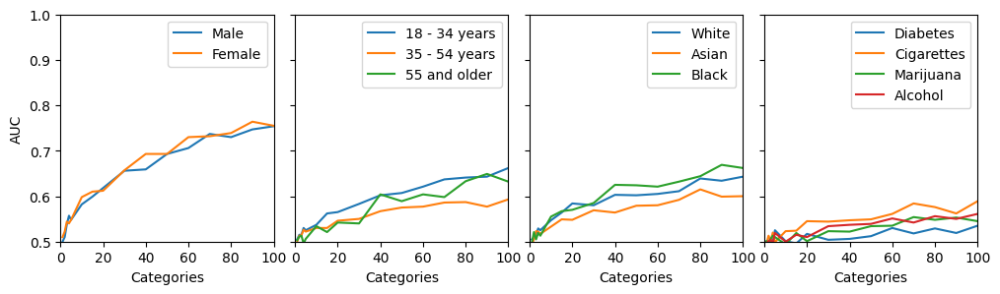

In [67]:
cols = len(socio_groups)
fig, axes = plt.subplots(1,cols, figsize=(3*cols,3), sharey=True, sharex=True)
plt.subplots_adjust(wspace=0.1)
for i, (socio, labels) in enumerate(socio_groups.items()):
    ax = axes[i]
    if i == 0:
        ax.set_ylabel('AUC')
        ax.set_xlim(0, 100)
        ax.set_ylim(0.5, 1)
    for label in labels:
        mean_aucs = abs_c_svm_results_df[label]
        ax.plot(mean_aucs, label=label)
    ax.set_xlabel('Categories')
    ax.legend()

### Demonstration of how this is plausible

To illustrate what is happening, we take a random C=20 Categories and train logistic regression models on both the Male and Female labels to then show the extent to which these randomly selected categories are important. 

We use the Male and Female labels (only) for the simplest demonstration-- the models trained on these labels have the highest is predictive power with the fewest categories.


In [1389]:
## Helper functions to format tables
def get_stars(row):
    if row['p-value'] < 0.001:
        return '***'
    if row['p-value'] < 0.01:
        return '**'
    if row['p-value'] < 0.05:
        return '*'
    return ''

def get_formatted_logit_res_table(model):
    table = pd.DataFrame({
        'Odds Ratio': np.exp(model.params).apply(round, args=([3])),
        'B (log odds)': model.params.apply(round, args=([3])), 
        '95% CI for Odds Ratio': (
            np.exp(model.conf_int())
            .apply(lambda r: '[%0.3f, %0.3f]'%(r[0], r[1]), axis=1)
        ),
        'p-value': model.pvalues.apply(round, args=([3]))
    }).rename_axis('Predictor')
    # add stars
    table['Odds Ratio'] = table.apply(lambda r: '%s%s' % (r['Odds Ratio'], get_stars(r)), axis=1)
    # add in the Pseudo R-squared
    table.loc['Pseudo R-squared'] = [round(model.prsquared, 3), '','','']
    return table

In [1402]:
C = 20

# random.seed(RANDOM)
# random.seed(RANDOM + 1) # good one
# random.seed(RANDOM + 2) # good one
random.seed(RANDOM + 4) # documented one
# random.seed(RANDOM + 5) 
random_c_cats = sorted(random.sample(USE_CATS, k=C))
X_c = X[random_c_cats]
print('C=%s' % C)
# print(c_cats[:10])

C=20


In [1403]:
import statsmodels.api as sm

use_labels = ['Male', 'Female'] + age_groups + socio_groups['Race']
random_c_cats_lr_results = dict()

for label in use_labels:
    print(label)
    ys = labeled_y[label].loc[X.index]
    lr_model = sm.Logit(ys, sm.add_constant(X_c))
    lr_res = lr_model.fit() 
    random_c_cats_lr_results[label] = get_formatted_logit_res_table(lr_res)

Male
Optimization terminated successfully.
         Current function value: 0.650610
         Iterations 6
Female
Optimization terminated successfully.
         Current function value: 0.657764
         Iterations 6
18 - 34 years
Optimization terminated successfully.
         Current function value: 0.675315
         Iterations 5
35 - 54 years
Optimization terminated successfully.
         Current function value: 0.650738
         Iterations 5
55 and older
Optimization terminated successfully.
         Current function value: 0.335893
         Iterations 7
White
Optimization terminated successfully.
         Current function value: 0.428421
         Iterations 6
Asian
Optimization terminated successfully.
         Current function value: 0.291872
         Iterations 7
Black
Optimization terminated successfully.
         Current function value: 0.268340
         Iterations 7


In [1404]:
for label in use_labels:
    print(label)
    display(random_c_cats_lr_results[label])

Male


,Odds Ratio,B (log odds),95% CI for Odds Ratio,p-value
Predictor,,,,
const,0.97,-0.03,"[0.878, 1.073]",0.556
APPAREL_PIN,0.688**,-0.374,"[0.530, 0.893]",0.005
BAR_TOOL_SET,1.012,0.012,"[0.751, 1.364]",0.938
BENCH,1.291,0.255,"[0.950, 1.753]",0.102
BOOKMARK,0.673**,-0.396,"[0.502, 0.901]",0.008
CARD_STOCK,0.778*,-0.251,"[0.626, 0.967]",0.024
COSTUME_OUTFIT,0.682***,-0.382,"[0.582, 0.800]",0.0
DISHWARE_BOWL,0.87,-0.139,"[0.738, 1.026]",0.097
EYELASH_CURLER,0.3***,-1.204,"[0.192, 0.469]",0.0


Female


,Odds Ratio,B (log odds),95% CI for Odds Ratio,p-value
Predictor,,,,
const,0.913,-0.091,"[0.827, 1.009]",0.075
APPAREL_PIN,1.332*,0.286,"[1.032, 1.718]",0.028
BAR_TOOL_SET,1.005,0.005,"[0.747, 1.350]",0.976
BENCH,0.793,-0.231,"[0.585, 1.076]",0.136
BOOKMARK,1.406*,0.34,"[1.056, 1.870]",0.02
CARD_STOCK,1.251*,0.224,"[1.009, 1.549]",0.041
COSTUME_OUTFIT,1.422***,0.352,"[1.216, 1.663]",0.0
DISHWARE_BOWL,1.126,0.119,"[0.957, 1.325]",0.154
EYELASH_CURLER,3.512***,1.256,"[2.264, 5.448]",0.0


18 - 34 years


,Odds Ratio,B (log odds),95% CI for Odds Ratio,p-value
Predictor,,,,
const,1.262***,0.233,"[1.144, 1.393]",0.0
APPAREL_PIN,1.333*,0.287,"[1.048, 1.695]",0.019
BAR_TOOL_SET,1.428*,0.356,"[1.070, 1.904]",0.015
BENCH,0.945,-0.057,"[0.703, 1.270]",0.706
BOOKMARK,0.921,-0.083,"[0.702, 1.207]",0.549
CARD_STOCK,0.833,-0.183,"[0.677, 1.025]",0.084
COSTUME_OUTFIT,1.062,0.06,"[0.912, 1.238]",0.439
DISHWARE_BOWL,0.831*,-0.185,"[0.708, 0.974]",0.022
EYELASH_CURLER,0.985,-0.015,"[0.703, 1.380]",0.929


35 - 54 years


,Odds Ratio,B (log odds),95% CI for Odds Ratio,p-value
Predictor,,,,
const,0.456***,-0.786,"[0.411, 0.505]",0.0
APPAREL_PIN,0.732*,-0.312,"[0.570, 0.939]",0.014
BAR_TOOL_SET,0.706*,-0.348,"[0.523, 0.953]",0.023
BENCH,1.218,0.197,"[0.907, 1.636]",0.189
BOOKMARK,1.296,0.259,"[0.990, 1.697]",0.059
CARD_STOCK,1.121,0.114,"[0.912, 1.379]",0.279
COSTUME_OUTFIT,1.272**,0.241,"[1.091, 1.483]",0.002
DISHWARE_BOWL,1.197*,0.18,"[1.020, 1.406]",0.028
EYELASH_CURLER,0.984,-0.016,"[0.699, 1.384]",0.925


55 and older


,Odds Ratio,B (log odds),95% CI for Odds Ratio,p-value
Predictor,,,,
const,0.15***,-1.895,"[0.129, 0.175]",0.0
APPAREL_PIN,1.012,0.012,"[0.681, 1.505]",0.951
BAR_TOOL_SET,0.943,-0.059,"[0.581, 1.531]",0.812
BENCH,0.657,-0.419,"[0.379, 1.140]",0.135
BOOKMARK,0.543*,-0.61,"[0.311, 0.951]",0.033
CARD_STOCK,1.183,0.168,"[0.856, 1.635]",0.309
COSTUME_OUTFIT,0.392***,-0.938,"[0.289, 0.531]",0.0
DISHWARE_BOWL,1.027,0.027,"[0.796, 1.325]",0.837
EYELASH_CURLER,1.117,0.11,"[0.638, 1.955]",0.7


White


,Odds Ratio,B (log odds),95% CI for Odds Ratio,p-value
Predictor,,,,
const,4.163***,1.426,"[3.656, 4.740]",0.0
APPAREL_PIN,1.303,0.265,"[0.913, 1.859]",0.145
BAR_TOOL_SET,1.26,0.231,"[0.818, 1.941]",0.295
BENCH,0.853,-0.159,"[0.564, 1.291]",0.452
BOOKMARK,1.15,0.139,"[0.766, 1.725]",0.501
CARD_STOCK,1.259,0.23,"[0.919, 1.723]",0.151
COSTUME_OUTFIT,1.628***,0.487,"[1.299, 2.040]",0.0
DISHWARE_BOWL,1.081,0.078,"[0.865, 1.351]",0.494
EYELASH_CURLER,0.724,-0.323,"[0.469, 1.118]",0.145


Asian


,Odds Ratio,B (log odds),95% CI for Odds Ratio,p-value
Predictor,,,,
const,0.105***,-2.25,"[0.089, 0.125]",0.0
APPAREL_PIN,0.865,-0.145,"[0.551, 1.357]",0.527
BAR_TOOL_SET,0.902,-0.103,"[0.530, 1.538]",0.706
BENCH,1.167,0.155,"[0.698, 1.950]",0.555
BOOKMARK,0.967,-0.034,"[0.583, 1.603]",0.897
CARD_STOCK,0.784,-0.244,"[0.525, 1.170]",0.233
COSTUME_OUTFIT,0.5***,-0.692,"[0.367, 0.683]",0.0
DISHWARE_BOWL,1.065,0.063,"[0.806, 1.405]",0.659
EYELASH_CURLER,1.801*,0.589,"[1.082, 3.000]",0.024


Black


,Odds Ratio,B (log odds),95% CI for Odds Ratio,p-value
Predictor,,,,
const,0.104***,-2.26,"[0.088, 0.124]",0.0
APPAREL_PIN,0.985,-0.015,"[0.635, 1.527]",0.946
BAR_TOOL_SET,0.863,-0.148,"[0.493, 1.510]",0.605
BENCH,1.313,0.273,"[0.765, 2.255]",0.323
BOOKMARK,0.878,-0.13,"[0.510, 1.511]",0.639
CARD_STOCK,0.764,-0.269,"[0.493, 1.186]",0.231
COSTUME_OUTFIT,0.762,-0.272,"[0.570, 1.018]",0.066
DISHWARE_BOWL,0.959,-0.042,"[0.713, 1.290]",0.781
EYELASH_CURLER,0.779,-0.249,"[0.406, 1.495]",0.454


In [1405]:
pd.DataFrame(
    {l: res['Odds Ratio'] for (l, res) in random_c_cats_lr_results.items()}
)

,Male,Female,18 - 34 years,35 - 54 years,55 and older,White,Asian,Black
Predictor,,,,,,,,
const,0.97,0.913,1.262***,0.456***,0.15***,4.163***,0.105***,0.104***
APPAREL_PIN,0.688**,1.332*,1.333*,0.732*,1.012,1.303,0.865,0.985
BAR_TOOL_SET,1.012,1.005,1.428*,0.706*,0.943,1.26,0.902,0.863
BENCH,1.291,0.793,0.945,1.218,0.657,0.853,1.167,1.313
BOOKMARK,0.673**,1.406*,0.921,1.296,0.543*,1.15,0.967,0.878
CARD_STOCK,0.778*,1.251*,0.833,1.121,1.183,1.259,0.784,0.764
COSTUME_OUTFIT,0.682***,1.422***,1.062,1.272**,0.392***,1.628***,0.5***,0.762
DISHWARE_BOWL,0.87,1.126,0.831*,1.197*,1.027,1.081,1.065,0.959
EYELASH_CURLER,0.3***,3.512***,0.985,0.984,1.117,0.724,1.801*,0.779


##### Fraction of categories from most to least purchased

Hypothesis: Niche categories, that may be purchased by fewer consumers, are more informative w.r.t. Customer profiles. 
However the gains from increasing category breadth to a marginally lower number of consumers may contrast with increase in revenue.

Analysis: Sort categories by the number of distinct users purchasing from them
Iteratively sample categories, from (cumulative) top 5%, 10%, … 100%
For each set of categories, retrain and test the models, compute AUC scores


Top Plot: Predictive performance with increase in breadth of categories, from most purchased to least purchased
- X-axis: Fraction of categories
- Y-axis: AUC

Bottom Plot: cumulative spend with increase in breadth of categories, from most purchased to least purchased
- X-axis: Fraction of categories
- Y-axis: cumulative spend by in dataset


Update: Doesn't seem fruitful -- no interesting changes in AUC

In [1498]:
def get_top_cats(frac, top_cats_df=top_cats_u50_df):
    """Returns the names of the top (frac) categories."""
    n_ret = int(frac*len(top_cats_df))
    return top_cats_df.sort_values('Users', ascending=False).index.tolist()[:n_ret]

def get_cat_total_spend(cats, amzn_df=p50u_amzn_data):
    return amzn_df[amzn_df[CATEGORY].isin(cats)][TOTAL_SPEND].sum()

In [1518]:
"""
Make a dict
{p: {label: AUC} for p in ps}
"""
import random

ps = [p/100 for p in [1, 2, 3, 4, 5, 10, 15, 20, 30, 40, 50, 60, 70, 80, 90, 100]]
print(ps)


def get_svm_results_top_categories(X_y_data, use_labels, verbose=True):
    print('getting SVM results for top categories for labels: %s\np: %s' % (
            use_labels, ps))
    p_svm_results = {p: {label: [] for label in use_labels} for p in ps}
    for l, label in enumerate(use_labels):
        print('\n%s\n%s/%s: SVM for %s' % (datetime.datetime.now(), l+1, len(use_labels), label))
        X_train, X_test, y_train, y_test = X_y_data[label]['train_test_split']
        for p in ps:
            p_cats = get_top_cats(p)            
            p_X_train = X_train[p_cats]
            p_X_test = X_test[p_cats]
            if verbose: print('%s: train with p=%0.2f --> %s categories' % (datetime.datetime.now(), p, len(p_cats)))
            clf = svm.SVC(probability=True, class_weight='balanced')
            clf.fit(p_X_train, y_train)
            auc = get_auc_and_plot(clf, p_X_test, y_test, plot=False)
            p_svm_results[p][label] = auc
    return p_svm_results

[0.01, 0.02, 0.03, 0.04, 0.05, 0.1, 0.15, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]


In [1519]:
# use_labels = ['Female','Male','Black','Diabetes']
use_labels = ['Male', 'Female'] + age_groups + socio_groups['Race'] + health_lifestyle_labels
p_svm_results = get_svm_results_top_categories(X_y_data, use_labels)

getting SVM results for top categories for labels: ['Male', 'Female', '18 - 34 years', '35 - 54 years', '55 and older', 'White', 'Asian', 'Black']
p: [0.01, 0.02, 0.03, 0.04, 0.05, 0.1, 0.15, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]

2024-06-18 12:14:09.169669
1/8: SVM for Male
2024-06-18 12:14:09.191827: train with p=0.01 --> 15 categories
2024-06-18 12:14:10.263811: train with p=0.02 --> 31 categories
2024-06-18 12:14:11.526541: train with p=0.03 --> 46 categories
2024-06-18 12:14:13.063965: train with p=0.04 --> 62 categories
2024-06-18 12:14:14.885354: train with p=0.05 --> 78 categories
2024-06-18 12:14:16.974435: train with p=0.10 --> 156 categories
2024-06-18 12:14:20.043205: train with p=0.15 --> 234 categories
2024-06-18 12:14:24.456198: train with p=0.20 --> 312 categories
2024-06-18 12:14:30.471844: train with p=0.30 --> 468 categories
2024-06-18 12:14:39.788703: train with p=0.40 --> 624 categories
2024-06-18 12:14:52.384739: train with p=0.50 --> 780 categories
2024-06

2024-06-18 12:39:51.489255: train with p=0.10 --> 156 categories
2024-06-18 12:39:54.302862: train with p=0.15 --> 234 categories
2024-06-18 12:39:58.467957: train with p=0.20 --> 312 categories
2024-06-18 12:40:03.895377: train with p=0.30 --> 468 categories
2024-06-18 12:40:12.317201: train with p=0.40 --> 624 categories
2024-06-18 12:40:23.404847: train with p=0.50 --> 780 categories
2024-06-18 12:40:37.678126: train with p=0.60 --> 936 categories
2024-06-18 12:40:56.251716: train with p=0.70 --> 1092 categories
2024-06-18 12:41:17.705314: train with p=0.80 --> 1248 categories
2024-06-18 12:41:44.007999: train with p=0.90 --> 1404 categories
2024-06-18 12:42:13.915586: train with p=1.00 --> 1561 categories


In [1520]:
p_svm_results_df = pd.DataFrame(
    {'p':ps, **{l: [p_svm_results[p][l] for p in ps] for l in use_labels}}
).set_index('p')
p_svm_results_df

,Male,Female,18 - 34 years,35 - 54 years,55 and older,White,Asian,Black
p,,,,,,,,
0.01,0.626571,0.700064,0.623814,0.620632,0.649295,0.626092,0.489213,0.593466
0.02,0.700563,0.743682,0.640285,0.620759,0.712921,0.611420,0.560594,0.594225
0.03,0.775358,0.807770,0.670056,0.640187,0.701579,0.648990,0.614916,0.661737
0.04,0.790000,0.830429,0.683154,0.649002,0.693656,0.666434,0.663742,0.654252
0.05,0.820622,0.840920,0.707600,0.656726,0.733086,0.673942,0.657101,0.658681
0.10,0.860735,0.882035,0.749508,0.673911,0.804036,0.734997,0.693609,0.747491
0.15,0.873637,0.890229,0.762241,0.681142,0.807118,0.733681,0.702280,0.761702
0.20,0.877100,0.892592,0.776286,0.686207,0.810101,0.735978,0.724645,0.768880
0.30,0.882477,0.902046,0.781392,0.689400,0.838258,0.743476,0.738856,0.774449


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


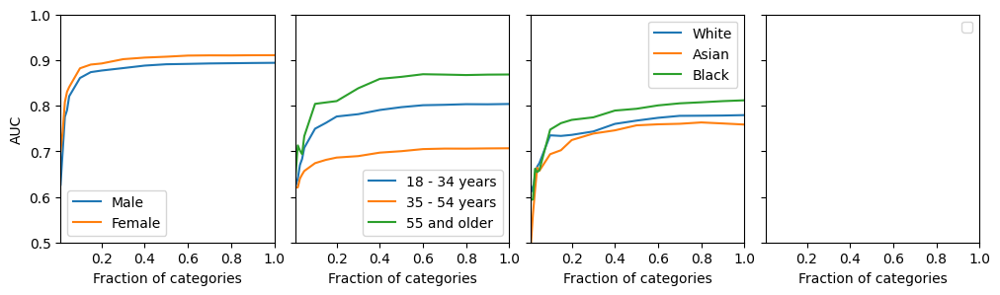

In [1521]:
cols = len(socio_groups)
fig, axes = plt.subplots(1,cols, figsize=(3*cols,3), sharey=True, sharex=True)
plt.subplots_adjust(wspace=0.1)
for i, (socio, labels) in enumerate(socio_groups.items()):
    ax = axes[i]
    if i == 0:
        ax.set_ylabel('AUC')
        ax.set_xlim(0.01, 1)
        ax.set_ylim(0.5, 1)
    for label in labels:
        if label not in use_labels: continue
        ax.plot(p_svm_results_df[label], label=label)
    ax.set_xlabel('Fraction of categories')
    ax.legend()

### Subsampling purchases to assess: How do more purchases impact the models' predictive power?

Consider that large companies and data brokers have even greater access to information about which products consumers purchased than what is represented in this dataset (e.g. via credit card transactions or web tracking).

In this analysis we keep the train/test split the same as above analyses.


##### Subsample purchases: Absolute purchases: Subsample only the test sample.

We use the sample training sample as above, and train on the full training sample.
We modify the data for users in the *test* sample.

All of the users in our dataset have at least P=50 distinct purchases, so we sample up to P.

For p in [1,2,3,4,5,10,15,20,30,40,50]:
- Randomly sample p purchases from each user and create their feature vectors from these purchases
- Test model
- with repeated random sampling to create means and CIs


In [1609]:
"""
Make a dict
{p: {label: [auc]} for p in [1,2,3,4,5, 10, ...50]}

Use the already trained models.
"""
ps = [1,2,3,4,5,10,15,20,30,40,50]

def get_svm_results_varying_test_abs_p(X_y_data, use_labels, repeated_samples=10, verbose=True):
    print('getting SVM results with %s repeated samples for varying test p: %s for labels: %s' % (
            repeated_samples, ps, use_labels))
    p_svm_results = {p: {label: [] for label in use_labels} for p in ps}
    for l, label in enumerate(use_labels):
        print('\n%s\n%s/%s: SVM for %s' % (datetime.datetime.now(), l+1, len(use_labels), label))
        _X_train, X_test, _y_train, y_test = X_y_data[label]['train_test_split']
        clf = onehot_svm_models[label] # already trained
        test_rids = X_test.index.tolist()
        for p in ps:
            if verbose and (p%10 in [1,3,5,10]): print('%s: p=%s' % (datetime.datetime.now(), p))
            for i in range(repeated_samples):
                # Get p X_test: feature vectors from p purchases for each test user
                test_amzn_df = p50u_amzn_data[p50u_amzn_data[RESPONSE_ID].isin(test_rids)]
                p_test_df = test_amzn_df.groupby(RESPONSE_ID).sample(n=p, replace=False, random_state=RANDOM+i)
                p_X_test = get_X_one_hot_encoding_for_categories(p_test_df, cats_u50).loc[test_rids]
                auc = get_auc_and_plot(clf, p_X_test, y_test, plot=False)
                p_svm_results[p][label] += [auc]
    return p_svm_results

In [68]:
socio_recompute = {
    'Gender': False,#True,
    'Age': False,#True,
    'Race': False,#True,
    'Health / lifestyle': False,#True,
}

def get_fpath(socio):
    return './preprocessed/varying_test_abs_p_AUC_%s.csv' % socio[:4]

# get dictionary of dataframes. Can merge into one dataframe
p_svm_results_dfs = dict() # {socio: dataframe}

r = 10 # repeated samples

for i, (socio, recompute) in enumerate(socio_recompute.items()):
    fpath = get_fpath(socio)
    print('%s/%s: %s: %s' % (i, len(socio_recompute), socio, fpath))
    if recompute:
        labels = socio_groups[socio]
        print(labels)
        p_svm_results = get_svm_results_varying_test_abs_p(X_y_data, labels, repeated_samples=r)
        p_svm_results_df = pd.DataFrame({
            'p':ps,
        }).set_index('p')
        for label in labels:
            means = []
            CIs = []
            for p in ps:
                data = p_svm_results[p][label]
                means += [np.mean(data).round(3)]
                (CI_l, CI_u) = st.t.interval(0.95, len(data)-1, loc=np.mean(data), scale=st.sem(data))
                CIs += [(CI_l.round(3), CI_u.round(3))]
            p_svm_results_df[label] = means
            p_svm_results_df[get_CI_colname(label)] = CIs
        # Save the data
        print('saving table to %s...' % fpath)
        p_svm_results_df.to_csv(fpath)
        print('...saved')
    p_svm_results_dfs[socio] = pd.read_csv(fpath, index_col=0)

0/4: Gender: ./preprocessed/varying_test_abs_p_AUC_Gend.csv
1/4: Age: ./preprocessed/varying_test_abs_p_AUC_Age.csv
2/4: Race: ./preprocessed/varying_test_abs_p_AUC_Race.csv
3/4: Health / lifestyle: ./preprocessed/varying_test_abs_p_AUC_Heal.csv


In [69]:
abs_p_purchases_svm_results_df = reduce(lambda  left,right: pd.merge(left,right, left_index=True, right_index=True), p_svm_results_dfs.values())
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(abs_p_purchases_svm_results_df)

,Male,Male 95 CI,Female,Female 95 CI,18 - 34 years,18 - 34 years 95 CI,35 - 54 years,35 - 54 years 95 CI,55 and older,55 and older 95 CI,White,White 95 CI,Asian,Asian 95 CI,Black,Black 95 CI,Diabetes,Diabetes 95 CI,Cigarettes,Cigarettes 95 CI,Marijuana,Marijuana 95 CI,Alcohol,Alcohol 95 CI
p,,,,,,,,,,,,,,,,,,,,,,,,
1,0.584,"(0.564, 0.604)",0.582,"(0.57, 0.595)",0.556,"(0.539, 0.573)",0.527,"(0.511, 0.544)",0.558,"(0.54, 0.576)",0.551,"(0.533, 0.57)",0.548,"(0.524, 0.572)",0.530,"(0.505, 0.554)",0.520,"(0.494, 0.545)",0.520,"(0.504, 0.536)",0.500,"(0.473, 0.527)",0.508,"(0.491, 0.526)"
2,0.615,"(0.598, 0.632)",0.614,"(0.603, 0.626)",0.575,"(0.557, 0.593)",0.540,"(0.524, 0.556)",0.576,"(0.555, 0.597)",0.558,"(0.542, 0.574)",0.561,"(0.539, 0.584)",0.546,"(0.525, 0.566)",0.524,"(0.506, 0.541)",0.526,"(0.514, 0.539)",0.513,"(0.489, 0.536)",0.517,"(0.501, 0.532)"
3,0.635,"(0.623, 0.648)",0.640,"(0.628, 0.651)",0.597,"(0.583, 0.61)",0.551,"(0.533, 0.57)",0.592,"(0.577, 0.607)",0.571,"(0.553, 0.588)",0.571,"(0.551, 0.591)",0.569,"(0.55, 0.589)",0.541,"(0.523, 0.559)",0.530,"(0.516, 0.543)",0.517,"(0.499, 0.534)",0.524,"(0.51, 0.538)"
4,0.654,"(0.642, 0.666)",0.659,"(0.649, 0.669)",0.611,"(0.597, 0.626)",0.559,"(0.543, 0.576)",0.607,"(0.593, 0.621)",0.583,"(0.568, 0.598)",0.582,"(0.557, 0.606)",0.575,"(0.553, 0.597)",0.537,"(0.52, 0.554)",0.528,"(0.513, 0.543)",0.523,"(0.505, 0.541)",0.529,"(0.518, 0.539)"
5,0.667,"(0.655, 0.679)",0.671,"(0.665, 0.677)",0.622,"(0.606, 0.639)",0.567,"(0.552, 0.583)",0.616,"(0.602, 0.629)",0.592,"(0.576, 0.608)",0.589,"(0.567, 0.61)",0.589,"(0.564, 0.613)",0.537,"(0.518, 0.556)",0.541,"(0.526, 0.556)",0.526,"(0.51, 0.542)",0.530,"(0.519, 0.541)"
10,0.723,"(0.715, 0.731)",0.715,"(0.709, 0.722)",0.651,"(0.638, 0.665)",0.590,"(0.574, 0.605)",0.668,"(0.658, 0.678)",0.625,"(0.605, 0.645)",0.604,"(0.581, 0.627)",0.622,"(0.591, 0.653)",0.561,"(0.545, 0.577)",0.554,"(0.542, 0.566)",0.537,"(0.521, 0.554)",0.543,"(0.532, 0.554)"
15,0.751,"(0.741, 0.761)",0.751,"(0.746, 0.756)",0.674,"(0.661, 0.687)",0.607,"(0.597, 0.618)",0.702,"(0.688, 0.716)",0.654,"(0.643, 0.664)",0.629,"(0.61, 0.647)",0.650,"(0.623, 0.677)",0.561,"(0.546, 0.577)",0.572,"(0.561, 0.582)",0.541,"(0.522, 0.56)",0.552,"(0.542, 0.563)"
20,0.771,"(0.763, 0.778)",0.775,"(0.77, 0.78)",0.688,"(0.679, 0.696)",0.616,"(0.604, 0.627)",0.723,"(0.708, 0.737)",0.665,"(0.654, 0.676)",0.640,"(0.621, 0.66)",0.672,"(0.653, 0.691)",0.562,"(0.542, 0.582)",0.587,"(0.575, 0.598)",0.546,"(0.531, 0.561)",0.566,"(0.554, 0.577)"
30,0.795,"(0.792, 0.799)",0.806,"(0.8, 0.812)",0.708,"(0.698, 0.717)",0.631,"(0.621, 0.642)",0.753,"(0.742, 0.765)",0.679,"(0.67, 0.689)",0.657,"(0.637, 0.677)",0.693,"(0.675, 0.712)",0.570,"(0.552, 0.587)",0.604,"(0.59, 0.619)",0.561,"(0.547, 0.575)",0.575,"(0.566, 0.584)"


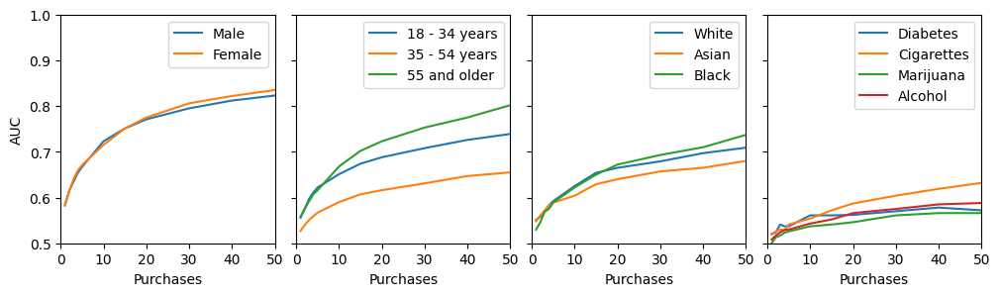

In [70]:
cols = len(socio_groups)
fig, axes = plt.subplots(1,cols, figsize=(3*cols,3), sharey=True, sharex=True)
plt.subplots_adjust(wspace=0.1)
for i, (socio, labels) in enumerate(socio_groups.items()):
    ax = axes[i]
    if i == 0:
        ax.set_ylabel('AUC')
        ax.set_xlim(0, 50)
        ax.set_ylim(0.5, 1)
    for label in labels:
        mean_aucs = abs_p_purchases_svm_results_df[label]
        ax.plot(mean_aucs, label=label)
    ax.set_xlabel('Purchases')
    ax.legend()

#### Subsample purchases: (%) Subsample only the test sample.

We use the sample training sample as above, and train on the full training sample.
We modify the data for users in the *test* sample

For p in [1%, 2%, ...10%, 20%, …]:
- Randomly sample p purchases from each user and create their feature vectors from these purchases
- Test model


In [366]:
"""
Make a dict
{p: {label: [auc results]} for p in [, ...100%]}
use already trained models
"""
ps = [2,4,6,8,10,15,20,30,40,50,60,70,80,90,100]
use_labels = X_y_data.keys()

def get_svm_results_varying_test_pct_p(X_y_data, use_labels, repeated_samples=10, verbose=True):
    print('getting SVM results with %s repeated samples for varying test p%%: %s for labels: %s' % (
            repeated_samples, ps, use_labels))
    p_svm_results = {p: {label: [] for label in use_labels} for p in ps}
    for l, label in enumerate(use_labels):
        print('\n%s\n%s/%s: SVM for %s' % (datetime.datetime.now(), l+1, len(use_labels), label))
        _X_train, X_test, _y_train, y_test = X_y_data[label]['train_test_split']
        clf = onehot_svm_models[label] # already trained
        test_rids = X_test.index.tolist()
        for p in ps:
            for i in range(repeated_samples):
                # Get fractional X_test: feature vectors from p% of each test user's purchases
                test_amzn_df = p50u_amzn_data[p50u_amzn_data[RESPONSE_ID].isin(test_rids)]
                p_test_df = test_amzn_df.groupby(RESPONSE_ID).sample(frac=p/100, replace=False, random_state=RANDOM+i)
                p_X_test = get_X_one_hot_encoding_for_categories(p_test_df, cats_u50).loc[test_rids]
                auc = get_auc_and_plot(clf, p_X_test, y_test, plot=False)
                p_svm_results[p][label] += [auc]
                if verbose and (i==0) and (p%20 in [0,2,10]): 
                    print('%s: p=%s; AUC=%0.3f' % (datetime.datetime.now(), p, auc))
                if p==100: 
                    if verbose: print('p==100')
                    break
    return p_svm_results

In [367]:
socio_recompute = {
    'Gender': False,#True,
    'Age': False,#True,
    'Race': False,#True,
    'Health / lifestyle': False, #True,
}

def get_fpath(socio):
    return './preprocessed/varying_test_pct_p_AUC_%s.csv' % socio[:4]

# get dictionary of dataframes. Can merge into one dataframe
p_svm_results_dfs = dict() # {socio: dataframe}

r = 10 # repeated samples

for i, (socio, recompute) in enumerate(socio_recompute.items()):
    fpath = get_fpath(socio)
    print('%s/%s: %s: %s' % (i, len(socio_recompute), socio, fpath))
    if recompute:
        labels = socio_groups[socio]
        print(labels)
        p_svm_results = get_svm_results_varying_test_pct_p(X_y_data, labels, repeated_samples=r)
        p_svm_results_df = pd.DataFrame({
            'p':ps,
        }).set_index('p')
        for label in labels:
            means = []
            CIs = []
            for p in ps:
                data = p_svm_results[p][label]
                means += [np.mean(data).round(3)]
                if len(data) > 1:
                    (CI_l, CI_u) = st.t.interval(0.95, len(data)-1, loc=np.mean(data), scale=st.sem(data))
                    CIs += [(CI_l.round(3), CI_u.round(3))]
                else:
                    CIs += [np.nan]
            p_svm_results_df[label] = means
            p_svm_results_df[get_CI_colname(label)] = CIs
        # Save the data
        print('saving table to %s...' % fpath)
        p_svm_results_df.to_csv(fpath)
        print('...saved')
    p_svm_results_dfs[socio] = pd.read_csv(fpath, index_col=0)

0/4: Gender: ./preprocessed/varying_test_pct_p_AUC_Gend.csv
1/4: Age: ./preprocessed/varying_test_pct_p_AUC_Age.csv
2/4: Race: ./preprocessed/varying_test_pct_p_AUC_Race.csv
3/4: Health / lifestyle: ./preprocessed/varying_test_pct_p_AUC_Heal.csv
['Diabetes', 'Cigarettes', 'Marijuana', 'Alcohol']
getting SVM results with 10 repeated samples for varying test p%: [2, 4, 6, 8, 10, 15, 20, 30, 40, 50, 60, 70, 80, 90, 100] for labels: ['Diabetes', 'Cigarettes', 'Marijuana', 'Alcohol']

2024-06-04 23:08:27.319511
1/4: SVM for Diabetes
2024-06-04 23:08:30.379198: p=2; AUC=0.470
2024-06-04 23:10:45.444256: p=10; AUC=0.526
2024-06-04 23:12:11.381078: p=20; AUC=0.541
2024-06-04 23:13:04.197685: p=30; AUC=0.569
2024-06-04 23:14:08.600062: p=40; AUC=0.571
2024-06-04 23:15:25.041524: p=50; AUC=0.585
2024-06-04 23:16:53.239618: p=60; AUC=0.588
2024-06-04 23:18:32.979781: p=70; AUC=0.608
2024-06-04 23:20:24.722569: p=80; AUC=0.620
2024-06-04 23:22:28.653810: p=90; AUC=0.624
2024-06-04 23:24:44.067687:

/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/scipy/stats/_distn_infrastructure.py:2351: RuntimeWarning: invalid value encountered in multiply
  lower_bound = _a * scale + loc
/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/scipy/stats/_distn_infrastructure.py:2352: RuntimeWarning: invalid value encountered in multiply
  upper_bound = _b * scale + loc
/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/scipy/stats/_distn_infrastructure.py:2351: RuntimeWarning: invalid value encountered in multiply
  lower_bound = _a * scale + loc
/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/scipy/stats/_distn_infrastructure.py:2352: RuntimeWarning: invalid value encountered in multiply
  upper_bound = _b * scale + loc


In [368]:
pct_p_svm_results_df = reduce(lambda  left,right: pd.merge(left,right, left_index=True, right_index=True), p_svm_results_dfs.values())
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(pct_p_svm_results_df)

,Male,Male 95 CI,Female,Female 95 CI,18 - 34 years,18 - 34 years 95 CI,35 - 54 years,35 - 54 years 95 CI,55 and older,55 and older 95 CI,White,White 95 CI,Asian,Asian 95 CI,Black,Black 95 CI,Diabetes,Diabetes 95 CI,Cigarettes,Cigarettes 95 CI,Marijuana,Marijuana 95 CI,Alcohol,Alcohol 95 CI
p,,,,,,,,,,,,,,,,,,,,,,,,
2,0.668,"(0.659, 0.677)",0.677,"(0.668, 0.687)",0.625,"(0.611, 0.639)",0.570,"(0.557, 0.584)",0.625,"(0.611, 0.639)",0.605,"(0.593, 0.618)",0.599,"(0.57, 0.628)",0.624,"(0.61, 0.638)",0.528,"(0.51, 0.545)",0.585,"(0.574, 0.596)",0.523,"(0.514, 0.533)",0.544,"(0.534, 0.554)"
4,0.712,"(0.703, 0.721)",0.727,"(0.719, 0.735)",0.660,"(0.651, 0.67)",0.610,"(0.596, 0.624)",0.672,"(0.658, 0.687)",0.638,"(0.627, 0.65)",0.625,"(0.604, 0.646)",0.661,"(0.645, 0.676)",0.537,"(0.514, 0.561)",0.616,"(0.606, 0.626)",0.534,"(0.518, 0.55)",0.561,"(0.551, 0.571)"
6,0.742,"(0.736, 0.748)",0.752,"(0.742, 0.762)",0.685,"(0.677, 0.693)",0.622,"(0.613, 0.632)",0.708,"(0.7, 0.716)",0.664,"(0.651, 0.677)",0.631,"(0.611, 0.651)",0.679,"(0.657, 0.701)",0.542,"(0.52, 0.564)",0.633,"(0.623, 0.643)",0.542,"(0.523, 0.562)",0.576,"(0.567, 0.586)"
8,0.761,"(0.756, 0.766)",0.775,"(0.768, 0.781)",0.701,"(0.694, 0.708)",0.637,"(0.629, 0.646)",0.730,"(0.72, 0.741)",0.669,"(0.656, 0.681)",0.640,"(0.618, 0.663)",0.698,"(0.68, 0.716)",0.543,"(0.523, 0.564)",0.645,"(0.634, 0.656)",0.551,"(0.536, 0.567)",0.581,"(0.574, 0.588)"
10,0.774,"(0.77, 0.778)",0.788,"(0.783, 0.793)",0.712,"(0.706, 0.718)",0.647,"(0.639, 0.656)",0.742,"(0.729, 0.755)",0.677,"(0.666, 0.688)",0.653,"(0.636, 0.67)",0.702,"(0.693, 0.712)",0.549,"(0.53, 0.568)",0.654,"(0.642, 0.666)",0.554,"(0.539, 0.57)",0.589,"(0.581, 0.598)"
15,0.797,"(0.792, 0.802)",0.811,"(0.806, 0.817)",0.733,"(0.727, 0.739)",0.663,"(0.654, 0.672)",0.771,"(0.757, 0.785)",0.698,"(0.689, 0.708)",0.667,"(0.651, 0.684)",0.730,"(0.714, 0.747)",0.558,"(0.547, 0.569)",0.669,"(0.662, 0.675)",0.574,"(0.557, 0.59)",0.600,"(0.589, 0.612)"
20,0.811,"(0.805, 0.817)",0.828,"(0.821, 0.835)",0.749,"(0.744, 0.755)",0.678,"(0.668, 0.687)",0.783,"(0.77, 0.796)",0.712,"(0.701, 0.724)",0.689,"(0.674, 0.703)",0.740,"(0.726, 0.754)",0.567,"(0.553, 0.581)",0.682,"(0.674, 0.691)",0.588,"(0.575, 0.601)",0.602,"(0.593, 0.611)"
30,0.829,"(0.825, 0.833)",0.850,"(0.845, 0.855)",0.774,"(0.767, 0.781)",0.690,"(0.685, 0.695)",0.804,"(0.791, 0.816)",0.734,"(0.729, 0.739)",0.709,"(0.697, 0.72)",0.758,"(0.747, 0.769)",0.573,"(0.559, 0.586)",0.701,"(0.694, 0.708)",0.596,"(0.584, 0.608)",0.615,"(0.605, 0.625)"
40,0.845,"(0.842, 0.849)",0.863,"(0.858, 0.867)",0.785,"(0.779, 0.791)",0.698,"(0.693, 0.702)",0.822,"(0.809, 0.834)",0.743,"(0.738, 0.748)",0.718,"(0.705, 0.731)",0.777,"(0.766, 0.787)",0.578,"(0.566, 0.591)",0.708,"(0.696, 0.719)",0.609,"(0.603, 0.616)",0.624,"(0.612, 0.636)"


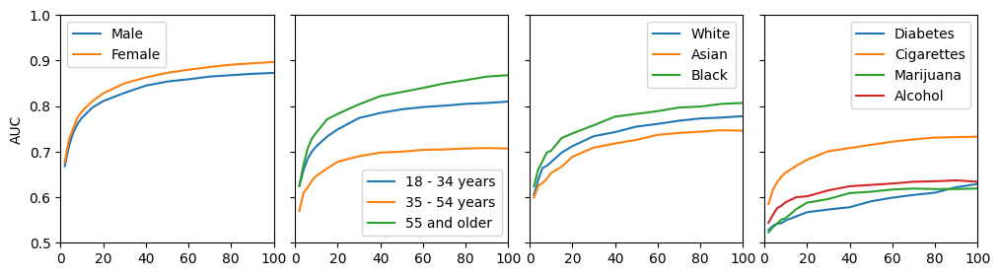

In [369]:
cols = len(socio_groups)
fig, axes = plt.subplots(1,cols, figsize=(3*cols,3), sharey=True, sharex=True)
plt.subplots_adjust(wspace=0.1)
for i, (socio, labels) in enumerate(socio_groups.items()):
    ax = axes[i]
    if i == 0:
        ax.set_ylabel('AUC')
        ax.set_xlim(0, 100)
        ax.set_ylim(0.5, 1)
    for label in labels:
        mean_aucs = pct_p_svm_results_df[label]
        ax.plot(mean_aucs, label=label)
    ax.legend()

---

### How do more users impact the models' predictive power?

Our sample is relatively small compared to the number of Amazon users making purchases.
We use the following approach to empirically test how model predictive power can increase with more users in the sample.

We use the existing train/test division and randomly sample increasing numbers of users from train data.
- For n=[10%, 20%, ...100%] of users:
- Train on the random subsample of the train data
- Test on the full test sample
- with repeated sampling (I=100) to create means and confidence intervals (except for 100%)


Want a table: AUC mean values and 95% CIs

```
n, Female, Female 95% CI, Male, Male 95% CI ... for each label
```
where we 
- use the means for plots
- provide the table with CIs in SI 


In [648]:
"""
Make a dict
{n: {label: [auc results]} for n in [10%, ...100%]}
"""
ns = list(range(10, 110, 10))

def get_svm_results_varying_train_n(X_y_data, use_labels, repeated_samples=10, verbose=True):
    print('getting SVM results for varying training n: %s with %s repeated samples for labels: %s' % (
            ns, repeated_samples, use_labels))
    n_svm_results = {n: {label: [] for label in use_labels} for n in ns} # results dict: map label to results
    for l, label in enumerate(use_labels):
        print('\n%s\n%s/%s: SVM for %s' % (datetime.datetime.now(), l+1, len(use_labels), label))
        X_train, X_test, y_train, y_test = X_y_data[label]['train_test_split']
        for n in ns:
            for i in range(repeated_samples):
                n_i_X_train = X_train.sample(frac=n/100, replace=False, random_state=RANDOM+i)
                n_i_train_rids = n_i_X_train.index.tolist()
                if (i==0): print('%s: train with %s%% --> n=%s' % (datetime.datetime.now(), n, len(n_i_train_rids)))
                n_i_y_train = y_train.loc[n_i_train_rids]    
                clf = svm.SVC(probability=True, class_weight='balanced')
                clf.fit(n_i_X_train, n_i_y_train)
                auc = get_auc_and_plot(clf, X_test, y_test, plot=False)
                n_svm_results[n][label] += [auc]
                if n==100: 
                    if verbose: print('n==100')
                    break
    return n_svm_results

In [929]:
RECOMPUTE_VARYING_N_TRAIN_RESULTS = False
computed_varying_n_auc_table_fpath = './preprocessed/varying_n_AUC.csv'

if RECOMPUTE_VARYING_N_TRAIN_RESULTS:
    use_labels = X_y_data.keys()

    n_svm_results = get_svm_results_varying_train_n(X_y_data, use_labels, repeated_samples=10)
    n_svm_results_df = pd.DataFrame({
        'n':ns,
    }).set_index('n')
    for label in use_labels:
        means = []
        CIs = []
        for n in ns:
            data = n_svm_results[n][label]
            means += [np.mean(data)]
            CI = np.nan if len(data) < 2 else st.t.interval(0.95, len(data)-1, loc=np.mean(data), scale=st.sem(data))
            CIs += [CI]
        n_svm_results_df[label] = means
        n_svm_results_df[get_CI_colname(label)] = CIs
    # Save the data
    print('saving table to %s...' % computed_varying_n_auc_table_fpath)
    n_svm_results_df.to_csv(computed_varying_n_auc_table_fpath)
    print('...saved')

n_svm_results_df = pd.read_csv(computed_varying_n_auc_table_fpath, index_col=0)
n_svm_results_df

,Male,Male 95 CI,Female,Female 95 CI,18 - 34 years,18 - 34 years 95 CI,35 - 54 years,35 - 54 years 95 CI,55 and older,55 and older 95 CI,...,"$100,000 or more","$100,000 or more 95 CI",Diabetes,Diabetes 95 CI,Cigarettes,Cigarettes 95 CI,Marijuana,Marijuana 95 CI,Alcohol,Alcohol 95 CI
n,,,,,,,,,,,,,,,,,,,,,
10,0.849548,"(0.8371188916770012, 0.8619762659806567)",0.853237,"(0.8424952427563818, 0.863979673631578)",0.702304,"(0.6907193574780435, 0.7138879497477693)",0.610811,"(0.6023767967643129, 0.6192460262041278)",0.750049,"(0.7367350389344446, 0.7633620566413745)",...,0.635312,"(0.5594400068016832, 0.7111832820872059)",0.541874,"(0.5063319496907205, 0.577415337191436)",0.582152,"(0.5316491721467164, 0.6326544808213203)",0.530296,"(0.4760161575614199, 0.5845760709029997)",0.547853,"(0.5026175041339174, 0.5930883204274862)"
20,0.866441,"(0.862245296766918, 0.870637023052902)",0.873882,"(0.8715223752607936, 0.8762423961996303)",0.752404,"(0.7432867564459886, 0.7615210370420848)",0.633694,"(0.6245925857967327, 0.64279509178612)",0.781474,"(0.7738399765561016, 0.7891075074020207)",...,0.678432,"(0.6690729641728045, 0.6877903247160845)",0.559135,"(0.5343214625635303, 0.5839483805630216)",0.632470,"(0.6175582295771365, 0.6473824096922698)",0.574354,"(0.5252850704941884, 0.6234224602709267)",0.574099,"(0.532878248443789, 0.6153193655912989)"
30,0.873542,"(0.8715017481466213, 0.8755815851867123)",0.879819,"(0.8774110765681408, 0.8822277194184812)",0.775915,"(0.767398614841838, 0.7844309607586514)",0.646320,"(0.6400569527107041, 0.6525834250551434)",0.794741,"(0.7857766021125424, 0.8037061176893262)",...,0.686844,"(0.6787205358488615, 0.694966930817805)",0.576678,"(0.5533384795825423, 0.600017988360427)",0.658315,"(0.6403336650973981, 0.6762964718889035)",0.605885,"(0.5871356003016338, 0.6246337282162903)",0.599384,"(0.592969142485511, 0.6057991382162433)"
40,0.877384,"(0.8749271280378789, 0.8798414530432023)",0.883411,"(0.8813574559217677, 0.8854636143123461)",0.788112,"(0.7808725764963893, 0.7953515250537793)",0.657163,"(0.6531219559968049, 0.6612047444979159)",0.801148,"(0.7957935578485222, 0.8065015564146774)",...,0.694626,"(0.688684098053154, 0.7005674575024016)",0.583370,"(0.5643066976988688, 0.60243405170652)",0.669239,"(0.6567828837517921, 0.6816942851979798)",0.622644,"(0.6093735272772919, 0.635914728474447)",0.604648,"(0.5974724434738247, 0.6118238372279295)"
50,0.881055,"(0.8791241163757185, 0.8829856809215787)",0.885505,"(0.8830025244890388, 0.8880080663693785)",0.794593,"(0.7895867897911646, 0.7995985824653027)",0.662724,"(0.6585009805758946, 0.6669468370527936)",0.806087,"(0.798627996139839, 0.8135455375762477)",...,0.695838,"(0.6905078955684435, 0.7011678377648899)",0.586156,"(0.5674882550278862, 0.6048229964505193)",0.677812,"(0.6680687231335075, 0.6875545645377251)",0.630172,"(0.6211847459722482, 0.6391600239581958)",0.604390,"(0.5978224171579029, 0.6109573723157814)"
60,0.881759,"(0.8800817912561041, 0.8834356636988505)",0.886214,"(0.884126987270627, 0.8883016637884589)",0.801009,"(0.7973551024345633, 0.8046619444360235)",0.668031,"(0.6636839492855637, 0.6723781419347283)",0.811487,"(0.8053442965519033, 0.8176293609962222)",...,0.700362,"(0.6948298155752154, 0.7058948066470067)",0.597703,"(0.5808796486845635, 0.6145272215146802)",0.691268,"(0.683779322641898, 0.6987572070384673)",0.633598,"(0.6262899689664974, 0.6409058911191101)",0.607731,"(0.6048471885955169, 0.6106155482465885)"
70,0.884611,"(0.8831906112448051, 0.8860306725389784)",0.887828,"(0.8863218847267432, 0.8893347484951076)",0.803765,"(0.8006353550614118, 0.8068945101918821)",0.670065,"(0.665952526480032, 0.6741781675723496)",0.819161,"(0.8152506613205793, 0.8230711331182364)",...,0.701670,"(0.6979228039650832, 0.7054179960349168)",0.601796,"(0.5897583249789313, 0.6138340380004945)",0.698513,"(0.6911425995439484, 0.7058825146113028)",0.635015,"(0.6272134332100475, 0.6428173319049871)",0.610747,"(0.6073014038668854, 0.6141924908699568)"
80,0.887095,"(0.886333

### Plot the results

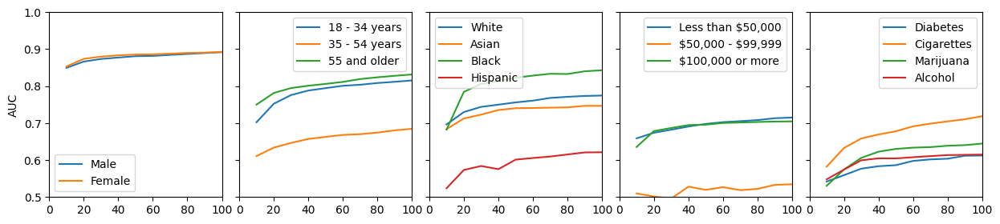

In [933]:
cols = len(socio_groups)
fig, axes = plt.subplots(1,cols, figsize=(3*cols,3), sharey=True, sharex=True)
plt.subplots_adjust(wspace=0.1)
for i, (socio, labels) in enumerate(socio_groups.items()):
    ax = axes[i]
    if i == 0:
        ax.set_ylabel('AUC')
        ax.set_xlim(0, 100)
        ax.set_ylim(0.5, 1)
    for label in labels:
        mean_aucs = n_svm_results_df[label]
        ax.plot(n_svm_results_df[label], label=label)
    ax.legend()

## How do specific categories contribute to risk?

Here we use all of the data, without dividing a train/test sample.

Get a table for each sociodemographic group showing most predictive categories.

Use logistic regression model.

- Train on all data (not train vs test).
- Get coefficients for categories (features)
- Compute odds ratios
- Extract the most informative categories (features)

Create a table for each socio-demographic group.

In [251]:
socio_groups

{'Gender': ['Male', 'Female'],
 'Age': ['18 - 34 years', '35 - 54 years', '55 and older'],
 'Race': ['White', 'Asian', 'Black'],
 'Health / lifestyle': ['Diabetes', 'Cigarettes', 'Marijuana', 'Alcohol']}

In [252]:
def get_OR_col(label=None):
    return '%s: OR' % label if label else 'OR'

def get_cat_col(label=None):
    return '%s: %s' % (label, CATEGORY) if label else CATEGORY

def get_category_features_OR(clf, label=None):
    return pd.DataFrame({
        get_cat_col(label): clf.feature_names_in_, 
        #'Log Odds': clf.coef_[0],
        get_OR_col(label): np.exp(clf.coef_[0]).round(3)
    })

def get_important_category_features(clf, label=None, pos_num=10, neg_num=10):
    """
    Returns table with pos_num top positive Categories and neg_num top negative Categories.
    """
    df = get_category_features_OR(clf, label)
    return pd.concat([
        df.sort_values(get_OR_col(label), ascending=False).head(pos_num)[[get_cat_col(label), get_OR_col(label)]],
        df.sort_values(get_OR_col(label), ascending=True).head(neg_num)[[get_cat_col(label), get_OR_col(label)]].sort_values(get_OR_col(label),ascending=False),
    ]).reset_index().drop('index', axis=1)

In [253]:
from functools import reduce

labels_all_cat_features_dict = dict()
labels_important_cat_features_dict = dict() # {label: table}
socio_important_cat_features_dict = dict() # {socio: table}

for i, (socio, labels) in enumerate(socio_groups.items()):
    print('%s: %s: %s' % (i, socio, labels))
    for l, label in enumerate(labels):
        print('%s: %s' % (l, label))
        y_l = labeled_y[label]
        print('%s: %s positive samples' % (label, y_l.sum()))
        # Get the rids that are shared across both X and y, in consistent order
        rids = list(set(y_l.index).intersection(set(X.index)))
        clf = LogisticRegression(class_weight='balanced', random_state=RANDOM).fit(X.loc[rids], y_l.loc[rids])
        labels_all_cat_features_dict[label] = get_category_features_OR(clf)
        labels_important_cat_features_dict[label] = get_important_category_features(clf)
    
# merge them to make the combined socio tables
for i, (socio, labels) in enumerate(socio_groups.items()):
    dfs = []
    for label in labels:
        df = labels_important_cat_features_dict[label]
        df = df.rename({get_cat_col(): get_cat_col(label), get_OR_col():get_OR_col(label)}, axis=1)
        dfs += [df]
    comb_socio_df = reduce(lambda left,right: pd.merge(left,right, left_index=True, right_index=True, how='outer'), dfs)
    socio_important_cat_features_dict[socio] = comb_socio_df

0: Gender: ['Male', 'Female']
0: Male
Male: 2311 positive samples
1: Female
Female: 2589 positive samples
1: Age: ['18 - 34 years', '35 - 54 years', '55 and older']
0: 18 - 34 years
18 - 34 years: 2581 positive samples
1: 35 - 54 years
35 - 54 years: 1917 positive samples


/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


2: 55 and older
55 and older: 529 positive samples
2: Race: ['White', 'Asian', 'Black']
0: White
White: 4133 positive samples
1: Asian
Asian: 483 positive samples
2: Black
Black: 448 positive samples
3: Health / lifestyle: ['Diabetes', 'Cigarettes', 'Marijuana', 'Alcohol']
0: Diabetes
Diabetes: 617 positive samples
1: Cigarettes
Cigarettes: 755 positive samples
2: Marijuana
Marijuana: 1061 positive samples


/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


3: Alcohol
Alcohol: 2211 positive samples


In [254]:
for socio, df in socio_important_cat_features_dict.items():
    display(df)

,Male: Category,Male: OR,Female: Category,Female: OR
0,FAUCET_WATER_AERATOR,6.060,CELL_PHONE_HOLSTER,5.327
1,MEN:NUTRITIONAL_SUPPLEMENT,5.999,WASHER,4.251
2,WEAPON_CASE,5.950,WOMEN:NUTRITIONAL_SUPPLEMENT,3.746
3,MEN:TOPICAL_HAIR_REGROWTH_TREATMENT,4.982,FASHIONOTHER,3.733
4,HYDRATION_PACK,4.528,COOKWARE,3.720
5,WOMEN:NAIL_POLISH,4.436,DRAWER_SLIDE,3.689
6,CONDOM,4.379,WOMEN:SHOE_INSERT,3.657
7,SOLID_FIRE_FUEL,4.082,HAIR_IRON,3.483
8,BOTTLE_RACK,3.657,VEHICLE_ACCENT_LIGHT,3.438
9,WATERING_CAN,3.550,DISPLAY_ENCLOSURE,3.348


,18 - 34 years: Category,18 - 34 years: OR,35 - 54 years: Category,35 - 54 years: OR,55 and older: Category,55 and older: OR
0,MEN:BASE_LAYER_APPAREL_SET,5.564,ADVENT_CALENDAR,4.675,BLOOD_OXYGEN_MONITOR,5.427
1,FISHING_ROD_REEL_COMBO,4.196,SNOW_PANT,4.097,CORRECTIVE_EYEGLASSES,4.843
2,WOMEN:HOME_BED_AND_BATH,4.097,CRIB,3.955,TOASTER,4.640
3,BRAKE_ROTOR,4.007,AUTO_BATTERY,3.735,WOMEN:APPAREL_GLOVES,4.275
4,WIRE_STRIPPER,3.800,PROJECTILE_BOW,3.552,CLOTHES_PIN,4.236
5,BRAKE_KIT,3.763,MEN:WATCH_BAND,3.445,VIDEO_DVD,4.120
6,CHISEL,3.739,SHOWER_CAP,3.187,MOP_BUCKET_SET,3.781
7,SOUS_VIDE_MACHINE,3.681,BRASS_AND_WOODWIND_INSTRUMENTS,3.180,BAKING_PAN,3.718
8,WOMEN:HAIR_REMOVAL_AGENT,3.635,MEN:PAJAMAS,3.054,INKJET_PRINTER_INK,3.486
9,HEADBOARD,3.395,MASSAGE_STICK,3.036,WOMEN:SPORTING_GOODS,3.383


,White: Category,White: OR,Asian: Category,Asian: OR,Black: Category,Black: OR
0,WOMEN:KEYCHAIN,9.032,WOMEN:BREAST_PETAL,7.006,HAIR_EXTENSION,10.114
1,PICKLE,7.128,PUNCHING_BAG,6.179,EXERCISE_STEP_PLATFORM,8.931
2,CARBURETOR,5.724,MUSICAL_INSTRUMENT_TOY,6.167,WOMEN:WAIST_CINCHER,7.304
3,TRAMPOLINE,5.022,ABDOMINAL_EXERCISER,5.275,WOMEN:WIG,5.381
4,SEXUAL_WELLNESS,4.833,BISS,5.096,HAIR_STYLING_AGENT,5.216
5,FACE_SHAPING_MAKEUP,4.715,SHOE_TREE,4.500,INSTALLATION_SERVICES,4.502
6,FIREPLACE,4.576,STETHOSCOPE,4.439,WOMEN:BODY_POSITIONER,4.464
7,WOMEN:HAIR_COMB,4.563,RICE_COOKERS,4.271,ROASTING_PAN,4.361
8,PERSONAL_PILL_DISPENSER,4.121,KNEE_PAD,4.139,WRITING_BOARD,3.986
9,HAMMOCK,4.114,BLOWTORCH,3.828,TOPICAL_HAIR_REGROWTH_TREATMENT,3.766


,Diabetes: Category,Diabetes: OR,Cigarettes: Category,Cigarettes: OR,Marijuana: Category,Marijuana: OR,Alcohol: Category,Alcohol: OR
0,SHOWER_CAP,7.926,ASHTRAY,18.126,ROLLING_PAPER,34.122,SNOW_PANT,5.193
1,SHARPS_DISPOSAL_CONTAINER,7.378,CIGARETTE_CASE,11.329,DRIED_PLANT,7.150,BAR_TOOL_SET,4.306
2,ANIMAL_MUZZLE,6.916,NAN,6.481,TOGGLE_SWITCH,6.171,WOMEN:CANDLE,3.755
3,GARDEN_TOOL_SET,6.474,ROLLING_PAPER,5.963,ASHTRAY,5.968,VEHICLE_WRAP,3.658
4,MAGAZINES,5.085,SHEET_PAPER,5.326,YO_YO,4.075,HIP_FLASK,3.402
5,UTILITY_MAGNET,4.735,MEN:BACKPACK,5.106,TOILET,3.928,COOKING_CONTAINER,3.402
6,DISPOSABLE_INCONTINENCE_SURFACE_PROTECTOR,4.700,MEN:SPORT_ACTIVITY_GLOVE,4.961,WOMEN:CHAIR,3.848,MEN:DRINKING_CUP,3.205
7,SUGAR_SUBSTITUTE,4.615,MOTHERBOARD,4.873,FASHIONNECKLACEBRACELETANKLET,3.681,O_RINGS,3.199
8,INDUSTRIAL_CASTERS,4.503,SOUND_CARD,4.596,VEHICLE_BUMPER,3.583,DISHWASHER,3.024
9,CLOTHES_PIN,4.502,VEHICLE_COVER,4.499,ALARM,3.552,COUNTERTOP_BURNER,3.003


### Visualization

### Heatmap visualization of important categories


Pick out some important categories.

Below are picked with criteria:

For each socio-demographic category, choose 5-6 product categories that are within the top 5 most positive or negative predictors for labels within that socio-demographic category.
Product categories are chosen to range across products related to food and kitchen appliances to personal health and toys.


In [170]:
socio_heatmap_cats = dict()
socio_heatmap_cats['Gender'] = [
    #Gender
    'WEAPON_CASE',
    'HAIR_IRON',#'OTC_MEDICATION',
    'BRA',
    'MENSTRUAL_CUP',
    'ART',
    'COLLECTIBLE_COINS',
    'CIRCUIT_BREAKER',
]
socio_heatmap_cats['Age'] = [
    'CRIB',
    'CORRECTIVE_EYEGLASSES',
    'VIDEO_DVD',
    'BLOOD_OXYGEN_MONITOR',
    'CONDOM',
    'TAMPON',
    #'PARTY_DECORATION_PACK',
    'ADVENT_CALENDAR'
]
socio_heatmap_cats['Race'] = [
    # Race
    'PICKLE',
    'SELF_TANNER',
    'HAIR_EXTENSION',
    'SWIM_CAP',
    'SHOE_TREE',
    'STETHOSCOPE',
    'MUSICAL_INSTRUMENT_TOY',
]
socio_heatmap_cats['Health / lifestyle'] =[
    # Health / lifestyle
    'SHARPS_DISPOSAL_CONTAINER',
    'ASHTRAY',
    'CIGARETTE_CASE',
    'ROLLING_PAPER',
    'DRIED_PLANT',
    'YO_YO',
    'HIP_FLASK',
]

In [171]:
# flatten a list of lists
xss = socio_heatmap_cats.values()
heatmap_cats = [x for xs in xss for x in xs]
# heatmap_cats

In [172]:
"""
Make separate heatmap dfs
"""
heatmap_dfs = dict()
for socio, ls in socio_groups.items():
    hmap_cats = socio_heatmap_cats[socio]
    heatmap_df = (pd.DataFrame(
        {l: labels_all_cat_features_dict[l].set_index(get_cat_col())['OR'].loc[hmap_cats] for l in ls}
    ).round(2))
    display(heatmap_df)
    heatmap_dfs[socio] = heatmap_df

,Male,Female
Category,,
WEAPON_CASE,6.03,0.22
HAIR_IRON,0.29,3.52
BRA,1.13,0.92
MENSTRUAL_CUP,0.54,2.53
ART,0.42,2.64
COLLECTIBLE_COINS,2.33,0.24
CIRCUIT_BREAKER,2.90,0.32


,18 - 34 years,35 - 54 years,55 and older
Category,,,
CRIB,0.22,4.00,1.63
CORRECTIVE_EYEGLASSES,0.48,0.87,4.81
VIDEO_DVD,0.94,0.85,4.06
BLOOD_OXYGEN_MONITOR,0.38,0.94,5.36
CONDOM,2.21,0.84,0.28
TAMPON,0.90,1.92,0.21
ADVENT_CALENDAR,0.21,4.79,0.71


,White,Asian,Black
Category,,,
PICKLE,7.12,0.88,0.31
SELF_TANNER,3.90,0.98,0.35
HAIR_EXTENSION,0.17,0.31,10.34
SWIM_CAP,1.27,1.75,2.36
SHOE_TREE,0.67,4.40,0.55
STETHOSCOPE,0.42,4.32,0.50
MUSICAL_INSTRUMENT_TOY,0.24,6.10,1.48


,Diabetes,Cigarettes,Marijuana,Alcohol
Category,,,,
SHARPS_DISPOSAL_CONTAINER,7.47,1.62,2.56,0.60
ASHTRAY,0.46,18.23,6.00,0.74
CIGARETTE_CASE,1.26,11.65,0.99,2.67
ROLLING_PAPER,1.01,5.87,36.34,0.73
DRIED_PLANT,2.72,0.53,7.40,1.29
YO_YO,1.72,1.27,4.14,1.25
HIP_FLASK,0.43,0.58,0.62,3.44


In [173]:
"""
Make a combined table where the column names are the demo/label
Rows are the product categories
Cells are the OR values for the demo/label
"""
ls = [l for labels in socio_groups.values() for l in labels]
heatmap_df = (pd.DataFrame(
    {l: labels_all_cat_features_dict[l].set_index(get_cat_col())['OR'].loc[heatmap_cats] for l in ls}
).round(2))
heatmap_df

,Male,Female,18 - 34 years,35 - 54 years,55 and older,White,Asian,Black,Diabetes,Cigarettes,Marijuana,Alcohol
Category,,,,,,,,,,,,
WEAPON_CASE,6.03,0.22,2.13,0.43,1.72,0.67,0.97,0.64,1.39,0.96,0.64,1.21
HAIR_IRON,0.29,3.52,1.23,1.02,0.91,0.88,1.95,1.08,1.23,0.60,0.89,1.14
BRA,1.13,0.92,0.76,1.00,1.15,0.48,1.54,0.97,0.96,0.80,0.52,0.93
MENSTRUAL_CUP,0.54,2.53,1.01,1.09,0.56,1.39,0.68,0.90,3.09,1.29,1.48,2.18
ART,0.42,2.64,0.52,1.88,0.63,2.34,1.02,0.57,1.81,1.39,1.46,0.47
COLLECTIBLE_COINS,2.33,0.24,0.86,0.94,1.23,2.43,0.69,0.65,2.42,1.05,0.68,0.60
CIRCUIT_BREAKER,2.90,0.32,0.50,1.80,1.00,0.69,0.79,2.44,1.23,0.55,0.70,0.54
CRIB,1.49,0.50,0.22,4.00,1.63,1.51,0.60,1.97,0.77,0.65,0.49,0.83
CORRECTIVE_EYEGLASSES,0.60,2.25,0.48,0.87,4.81,1.10,1.48,1.22,1.45,1.37,1.34,1.48


In [174]:
# Display this in color / plots
# Borrowed from https://matplotlib.org/stable/gallery/images_contours_and_fields/image_annotated_heatmap.html#sphx-glr-gallery-images-contours-and-fields-image-annotated-heatmap-py
import matplotlib

CMAP = 'Reds' # not enough differentiation between positive and negative
CMAP = 'copper'
CMAP = 'cividis'

def make_heatmap_im(plt_df, ax=None, dpi=None, cmap=CMAP, text=True):
    if ax is None:
        fig, ax = plt.subplots(1,1,figsize=(8,8))#, dpi=dpi)
    im = ax.imshow(plt_df, aspect='auto', cmap=cmap, norm='log')
    # Show all ticks and label them with the respective list entries.
    ax.set_xticks([i for i in range(len(plt_df.columns))], labels=plt_df.columns)
    _ = ax.set_yticks([i for i in range(len(plt_df))], labels=plt_df.index)
    # Let the horizontal axes labeling appear on top.
    ax.tick_params(top=True, bottom=False, labeltop=True, labelbottom=False)
    # Turn spines off and create white grid.
    ax.spines[:].set_visible(False)
    ax.set_xticks(np.arange(len(plt_df.columns)+1)-.5, minor=True)
    ax.set_yticks(np.arange(len(plt_df)+1)-.5, minor=True)
    ax.grid(which="minor", color="w", linestyle='-', linewidth=3)
    ax.tick_params(which="minor", bottom=False, left=False)
    # #cbar = ax.figure.colorbar(im, ax=ax) # problably don't need a color bar
    plt.setp(ax.get_xticklabels(), rotation=-30, ha="right",rotation_mode="anchor")
    textcolors=("black", "white")
    threshold = im.norm(plt_df.max().max())/2
    kw = dict(horizontalalignment="center", verticalalignment="center")
    valfmt = matplotlib.ticker.StrMethodFormatter("{x:.2f}")
    # Loop over the data, create a `Text` for each "pixel", colored depending on the data
    if not text: return ax
    texts = []
    for i in range(len(plt_df)):
        for j in range(len(plt_df.columns)):
            kw.update(color=textcolors[int(im.norm(plt_df.iloc[i, j]) < threshold)])
            text = im.axes.text(j, i, valfmt(plt_df.iloc[i, j], None), **kw)
            texts.append(text)
    return ax

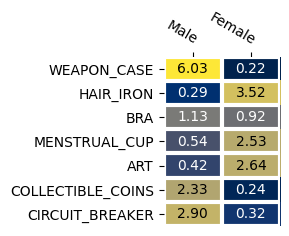

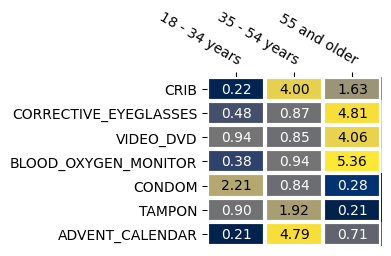

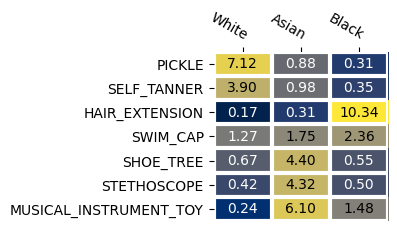

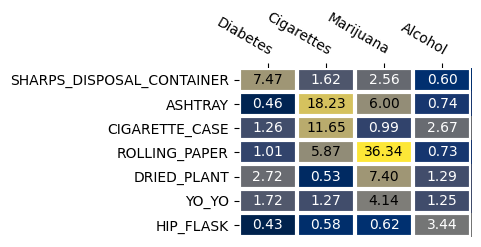

In [175]:
for socio, hmap_df in heatmap_dfs.items():
    cols = len(hmap_df.columns)
    fig, ax = plt.subplots(1,1,figsize=(0.75*cols, 2.2))#, dpi=200)
    ax = make_heatmap_im(heatmap_dfs[socio], ax=ax, dpi=None, cmap='cividis')

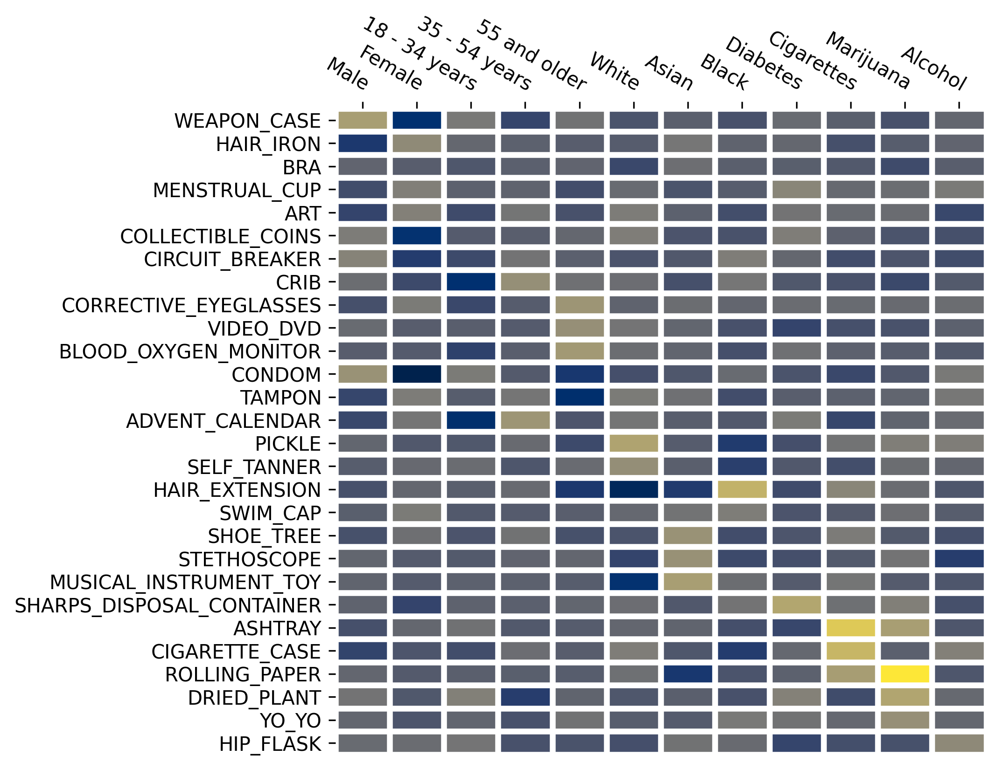

In [176]:
fig, ax = plt.subplots(1,1,figsize=(6,6), dpi=300)
ax = make_heatmap_im(heatmap_df, ax=ax, text=False)

### Helper for interpretation

In [177]:
def view_category_top_purchases(category, num=10):
    df = pp_df[pp_df[CATEGORY]==cat].groupby(
        [TITLE]
    )[PURCHASES].sum().sort_values(ascending=False).to_frame()
    display(df.head(num))
    return df

In [824]:
cat = 'PICKLE'#'RELAY'#'INSTALLATION_SERVICES'#'OTC_MEDICATION' #'EXERCISE_STEP_PLATFORM'#  # 
# cat = 'SHARPS_DISPOSAL_CONTAINER'
# cat = 'OTC_MEDICATION' ## This is a lot of pill splitters! knives!?
cat = 'WOMEN:NAIL_POLISH' # 'Gift sets for women'
cat = 'SPOON_REST'
cat = 'TOILET'
_ = view_category_top_purchases(cat)

,purchases
Title,
"Kohler (BLUE PART GP85160 FLAPPER WITH FLOAT), 2",8
PPOGOO Non-Breakable Pet Pooper Scooper for Dogs and Cats with Long Handle High Strength Material and Durable Spring for Easy Grass and Gravel Pick Up,8
"Reliance Products Hassock Portable Lightweight Self-Contained Toilet, Brown, 14.7 inch x 14.7 inch x 14.0 inch",4
"Camco Portable Toilet with Seat and Cover, 5 Gallons, Blue (41549)",3
"Camco Bucket Toilet Seat with Lid and Waste Bags, Fits 5 Gallon Buckets (41546)",3
"KOHLER K-4726-T-0 Triko Round-front Molded-Wood Toilet Seat with Polished Chrome Hinges, White",3
"Portable Toilet Camping Porta Potty - 5 Gallon Waste Tank - Durable, Leak Proof, Flushable Easy to use RV Toilet With Detachable Tanks for Effortless Cleaning & Carrying, for Travel, Boating and Trips",2
"Camco Portable Toilet for RVs, 5.3 Gallons, Gray (41541) , White",2
"TOTO CST744SL#01 Drake 2-Piece Ada Toilet with Elongated Bowl, Cotton White",2


In [179]:
# For later on can use:
labels_all_cat_features_dict['Male'].sort_values('OR').set_index(CATEGORY)

,OR
Category,
WOMEN:SHOE_INSERT,0.162
EXERCISE_BLOCK,0.195
WASHER,0.230
FLAME_WICK,0.233
SOAP_DISH,0.234
...,...
WOMEN:NAIL_POLISH,4.489
MEN:TOPICAL_HAIR_REGROWTH_TREATMENT,5.042
MEN:NUTRITIONAL_SUPPLEMENT,5.974


---

### More analysis for single purchasers vs non-single purchasers

Take random sample of same n who are not single purchasers.

#### Run the models for single purchaser users

Be careful with analysis results -- n is likely too small for meaningful analysis of many groups. e.g. see confusion matrix for race groups.


2024-05-15 18:09:00.561497
1/16: SVM for Male
Mean accuracy: 0.8278
ROC AUC=0.889

2024-05-15 18:09:02.452964
2/16: SVM for Female
Mean accuracy: 0.8833
ROC AUC=0.943

2024-05-15 18:09:04.322406
3/16: SVM for 18 - 34 years
Mean accuracy: 0.7222
ROC AUC=0.807

2024-05-15 18:09:06.263506
4/16: SVM for 35 - 54 years
Mean accuracy: 0.6111
ROC AUC=0.597

2024-05-15 18:09:08.293954
5/16: SVM for 55 and older
Mean accuracy: 0.8333
ROC AUC=0.858

2024-05-15 18:09:10.105825
6/16: SVM for White
Mean accuracy: 0.7889
ROC AUC=0.688

2024-05-15 18:09:12.039028
7/16: SVM for Black
Mean accuracy: 0.9222
ROC AUC=0.850

2024-05-15 18:09:13.731922
8/16: SVM for Asian
Mean accuracy: 0.9167
ROC AUC=0.720

2024-05-15 18:09:15.482118
9/16: SVM for Hispanic
Mean accuracy: 0.9167
ROC AUC=0.537

2024-05-15 18:09:17.305176
10/16: SVM for Less than $50,000
Mean accuracy: 0.6389
ROC AUC=0.669

2024-05-15 18:09:19.276148
11/16: SVM for \$50,000 - \$99,999
Mean accuracy: 0.6278
ROC AUC=0.543

2024-05-15 18:09:21.2

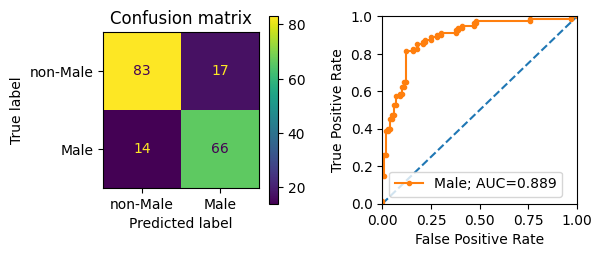

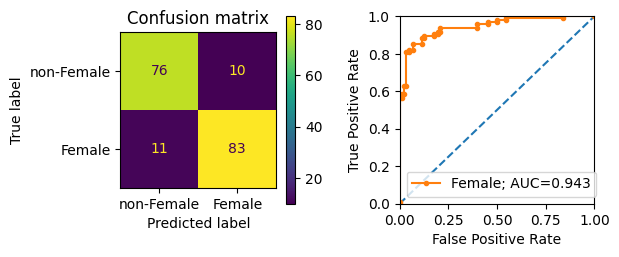

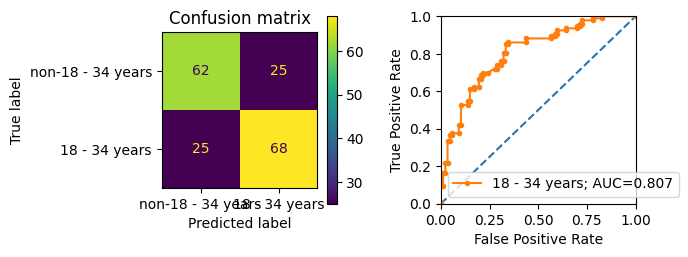

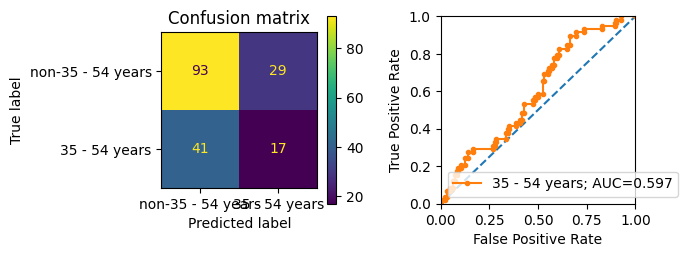

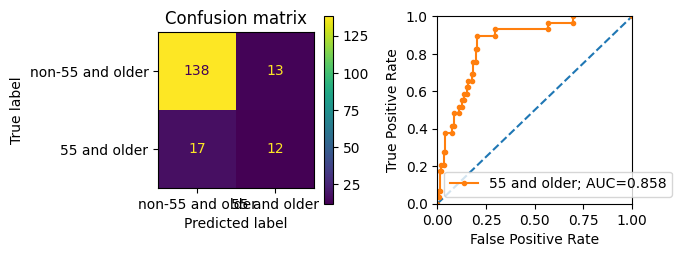

...

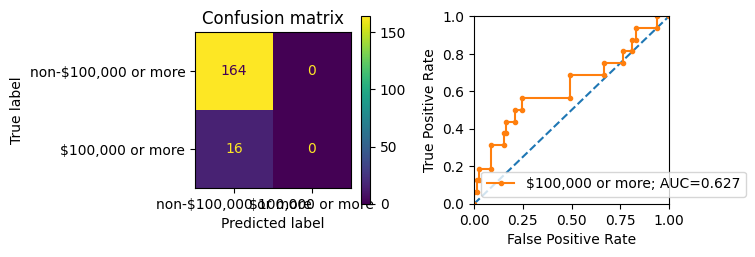

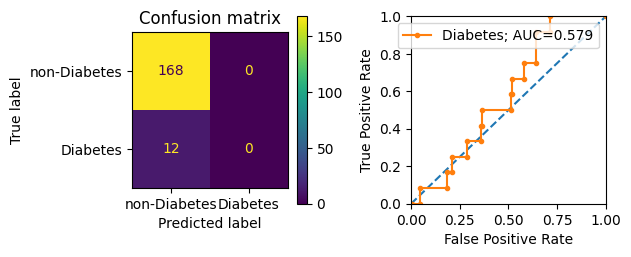

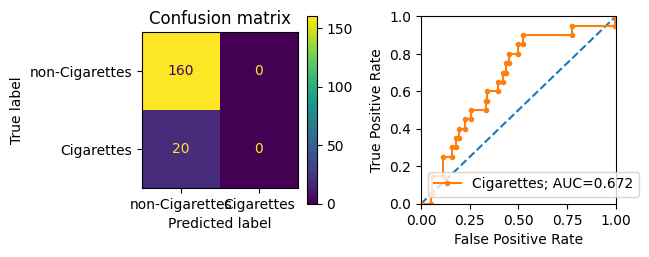

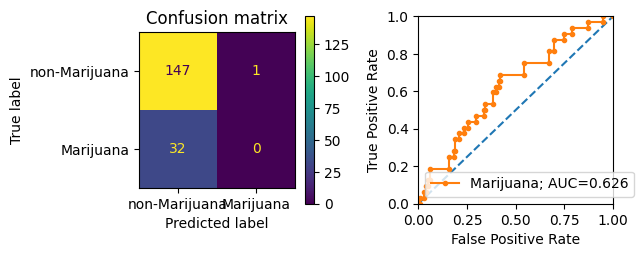

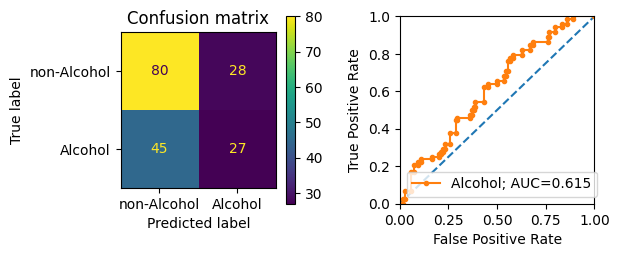

In [460]:
X_y_data_single_purchaser = setup_labeled_X_y_data(X_single_purchaser, labeled_y)
# results dict: map label to svm results
onehot_svm_results_single_p = dict()
use_labels = X_y_data.keys()
for i, label in enumerate(use_labels):
    print('\n%s\n%s/%s: SVM for %s' % (datetime.datetime.now(), i+1, len(use_labels), label))
    X_train, X_test, y_train, y_test = X_y_data_single_purchaser[label]['train_test_split']
    clf = svm.SVC(probability=True, class_weight='balanced')
    clf.fit(X_train, y_train)
    auc = get_auc_and_plot(clf, X_test, y_test)
    onehot_svm_results_single_p[label] = auc


2024-05-16 16:18:49.420699
1/16: SVM for Male
Mean accuracy: 0.7569
ROC AUC=0.804

2024-05-16 16:18:52.198799
2/16: SVM for Female
Mean accuracy: 0.7385
ROC AUC=0.803

2024-05-16 16:18:54.931955
3/16: SVM for 18 - 34 years
Mean accuracy: 0.6789
ROC AUC=0.735

2024-05-16 16:18:57.906348
4/16: SVM for 35 - 54 years
Mean accuracy: 0.6422
ROC AUC=0.695

2024-05-16 16:19:00.954216
5/16: SVM for 55 and older
Mean accuracy: 0.9037
ROC AUC=0.830

2024-05-16 16:19:03.550582
6/16: SVM for White
Mean accuracy: 0.8211
ROC AUC=0.785

2024-05-16 16:19:06.363623
7/16: SVM for Black
Mean accuracy: 0.9220
ROC AUC=0.741

2024-05-16 16:19:08.876352
8/16: SVM for Asian
Mean accuracy: 0.8991
ROC AUC=0.677

2024-05-16 16:19:11.312095
9/16: SVM for Hispanic
Mean accuracy: 0.8853
ROC AUC=0.472

2024-05-16 16:19:14.160617
10/16: SVM for Less than $50,000
Mean accuracy: 0.6606
ROC AUC=0.672

2024-05-16 16:19:17.190820
11/16: SVM for \$50,000 - \$99,999
Mean accuracy: 0.6009
ROC AUC=0.581

2024-05-16 16:19:20.2

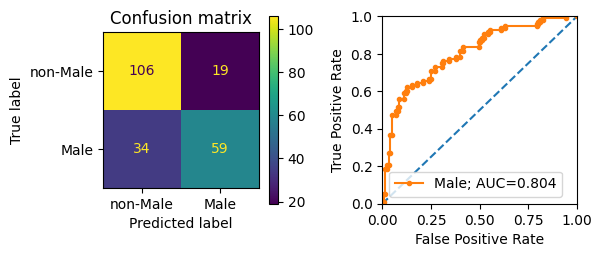

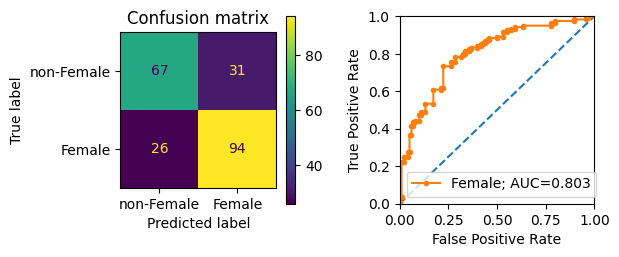

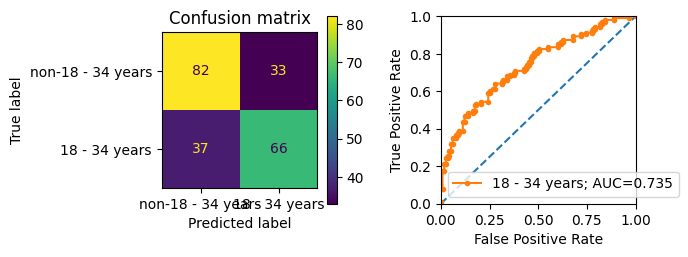

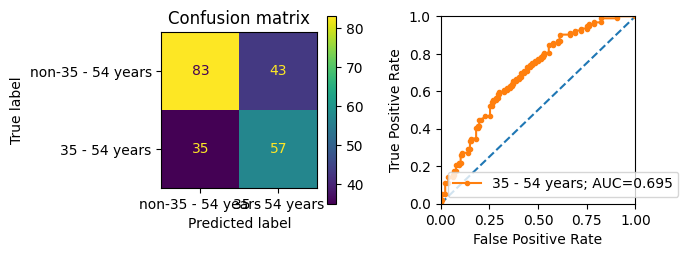

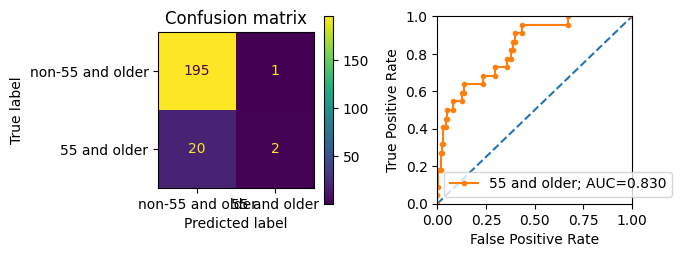

...

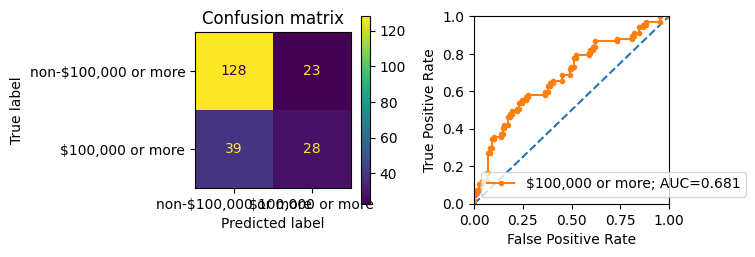

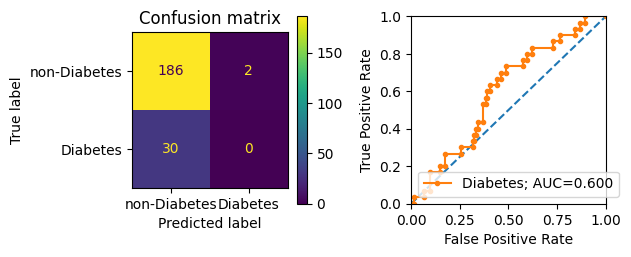

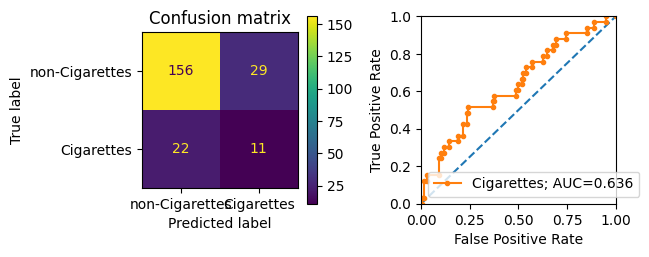

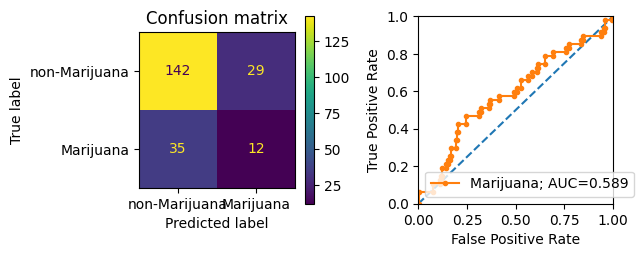

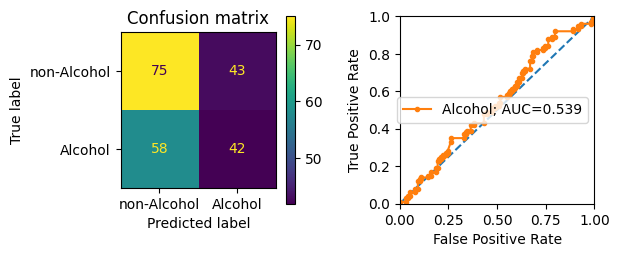

In [494]:
n = len(single_purchaser_rids)

X_y_data_nonsingle_purchaser = setup_labeled_X_y_data(
    X_nonsingle_purchaser.sample(n=n, replace=False, random_state=RANDOM), 
    labeled_y)
# results dict: map label to svm results
onehot_svm_results_nonsingle_p = dict()
use_labels = X_y_data.keys()
for i, label in enumerate(use_labels):
    print('\n%s\n%s/%s: SVM for %s' % (datetime.datetime.now(), i+1, len(use_labels), label))
    X_train, X_test, y_train, y_test = X_y_data_nonsingle_purchaser[label]['train_test_split']
    clf = svm.SVC(probability=True, class_weight='balanced')
    clf.fit(X_train, y_train)
    auc = get_auc_and_plot(clf, X_test, y_test)
    onehot_svm_results_nonsingle_p[label] = auc

In [496]:
# show a table with the AUROC scores
pd.DataFrame({
    'AUC | single purchasers (n=898)': onehot_svm_results_single_p.values(),
    'AUC | non-single purchasers (random n=898)': onehot_svm_results_nonsingle_p.values(),
}, index=list(onehot_svm_results_single_p.keys())).round(3)

,AUC | single purchasers (n=898),AUC | non-single purchasers (random n=898)
Male,0.889,0.804
Female,0.943,0.803
18 - 34 years,0.807,0.735
35 - 54 years,0.597,0.695
55 and older,0.858,0.830
White,0.688,0.785
Black,0.850,0.741
Asian,0.720,0.677
Hispanic,0.537,0.472
"Less than $50,000",0.669,0.672


Single purchaser approach creates very limited subsample. Also try limiting to SINGLE_LOGIN: do not share login.

In [441]:
SINGLE_LOGIN = 'Single login'

def is_single_login(row):
    return (row['Q-amazon-use-howmany']=='1 (just me!)')

survey_df[SINGLE_LOGIN] = survey_df.apply(is_single_login, axis=1)
single_login_rids = survey_df[survey_df[SINGLE_LOGIN]==True].index.tolist()
# get rids for users who are both in list that purchased >= 50 p, and single logins

In [469]:
X_single_login = X.loc[list(set.intersection(set(single_login_rids), set(p50_users)))]
n_single_login_users = len(X_single_login)
print('%s/%s of the users who purchased at least 50 products are single login users' % (
n_single_login_users, len(X)))
# X_single_login.head(3)

2843/4248 of the users who purchased at least 50 products are single login users


#### Run the models for single login users


2024-05-16 15:10:18.307975
1/16: SVM for Male
Mean accuracy: 0.8629
ROC AUC=0.930

2024-05-16 15:10:32.530302
2/16: SVM for Female
Mean accuracy: 0.8612
ROC AUC=0.928

2024-05-16 15:10:46.533709
3/16: SVM for 18 - 34 years
Mean accuracy: 0.7346
ROC AUC=0.827

2024-05-16 15:11:04.751296
4/16: SVM for 35 - 54 years
Mean accuracy: 0.6362
ROC AUC=0.680

2024-05-16 15:11:23.234766
5/16: SVM for 55 and older
Mean accuracy: 0.8910
ROC AUC=0.856

2024-05-16 15:11:36.691874
6/16: SVM for White
Mean accuracy: 0.7733
ROC AUC=0.721

2024-05-16 15:11:53.319401
7/16: SVM for Black
Mean accuracy: 0.9051
ROC AUC=0.832

2024-05-16 15:12:06.558919
8/16: SVM for Asian
Mean accuracy: 0.9033
ROC AUC=0.744

2024-05-16 15:12:20.429822
9/16: SVM for Hispanic
Mean accuracy: 0.8664
ROC AUC=0.582

2024-05-16 15:12:37.372053
10/16: SVM for Less than $50,000
Mean accuracy: 0.6432
ROC AUC=0.709

2024-05-16 15:12:57.533555
11/16: SVM for \$50,000 - \$99,999
Mean accuracy: 0.5431
ROC AUC=0.495

2024-05-16 15:13:17.9

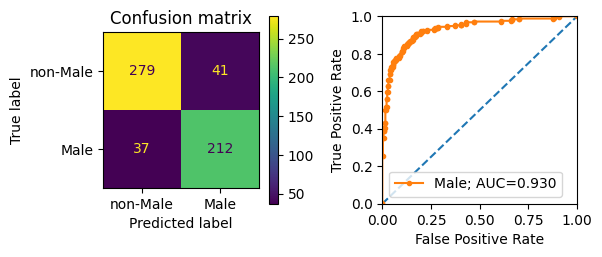

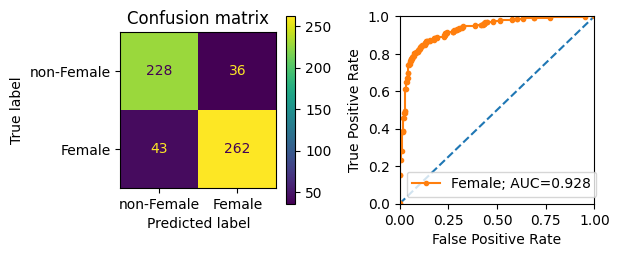

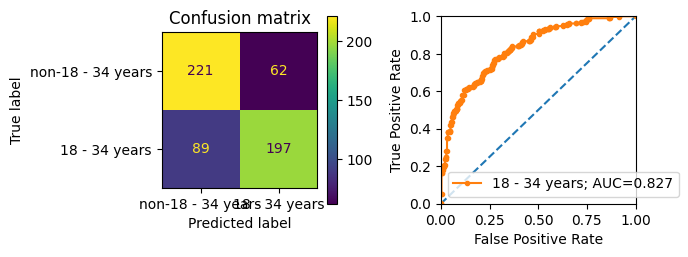

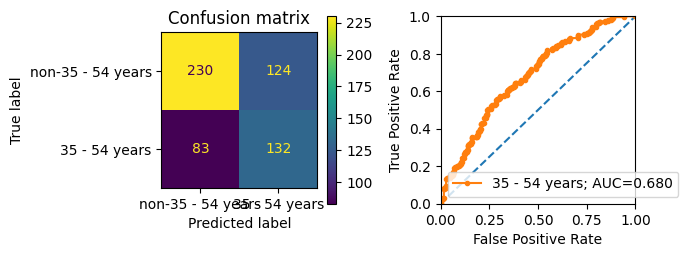

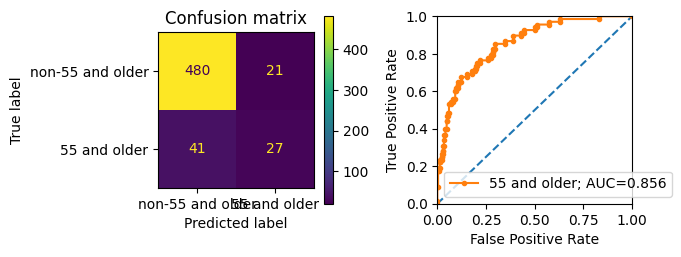

...

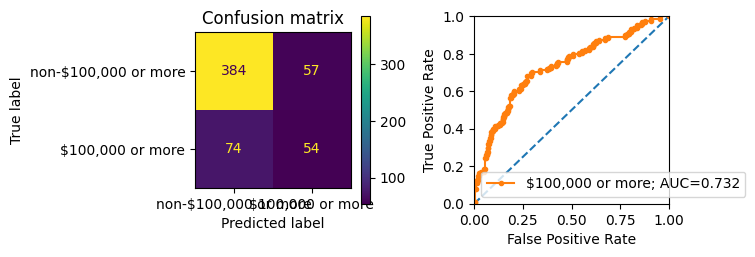

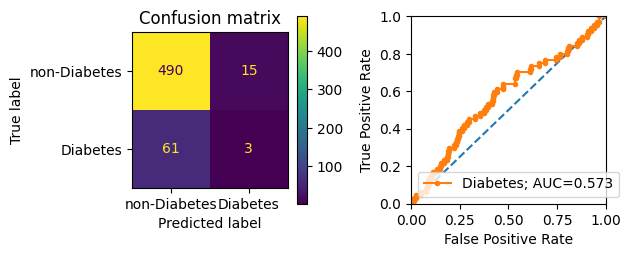

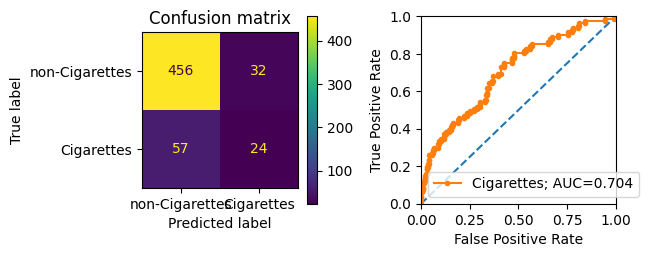

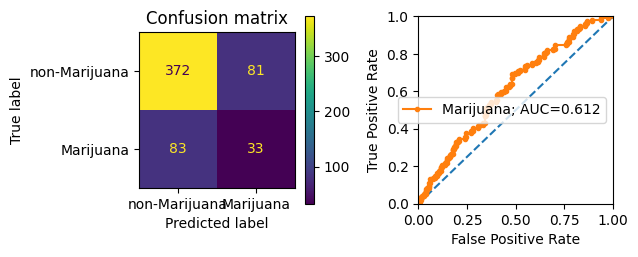

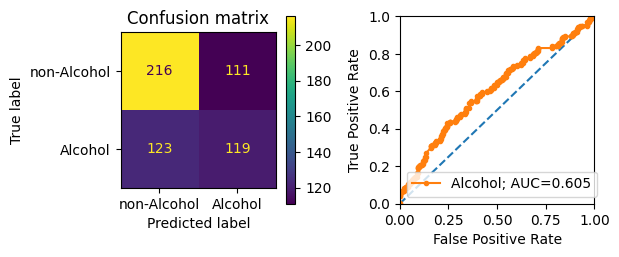

In [476]:
X_y_data_single_login = setup_labeled_X_y_data(X_single_login, labeled_y)
# results dict: map label to svm results
onehot_svm_results_single_l = dict()
use_labels = X_y_data.keys()
for i, label in enumerate(use_labels):
    print('\n%s\n%s/%s: SVM for %s' % (datetime.datetime.now(), i+1, len(use_labels), label))
    X_train, X_test, y_train, y_test = X_y_data_single_login[label]['train_test_split']
    clf = svm.SVC(probability=True, class_weight='balanced')
    clf.fit(X_train, y_train)
    auc = get_auc_and_plot(clf, X_test, y_test)
    onehot_svm_results_single_l[label] = auc

In [477]:
pd.DataFrame({
    'AUC | single login users': onehot_svm_results_single_l.values(),
}, index=list(onehot_svm_results_single_l.keys())).round(3)

,AUROC | single login users
Male,0.930
Female,0.928
18 - 34 years,0.827
35 - 54 years,0.680
55 and older,0.856
White,0.721
Black,0.832
Asian,0.744
Hispanic,0.582
"Less than $50,000",0.709


Result: For some of these labels, model does better, for some it does worse.

Better for:
- 55 and older
- Female

In [478]:
print('n=%s for single login users' % n_single_login_users)

n=2843 for single login users


#### Comparison

Since the sample size is smaller, we should expect overall lower model performance. As a comparison we take a random sample of n=2843 users and do the same modeling task.

Randomly sampled n=2843 users from X

2024-05-16 15:15:37.845136
1/16: SVM for Male
Mean accuracy: 0.7926
ROC AUC=0.869

2024-05-16 15:15:53.370619
2/16: SVM for Female
Mean accuracy: 0.8049
ROC AUC=0.891

2024-05-16 15:16:09.220322
3/16: SVM for 18 - 34 years
Mean accuracy: 0.7364
ROC AUC=0.813

2024-05-16 15:16:27.812559
4/16: SVM for 35 - 54 years
Mean accuracy: 0.6503
ROC AUC=0.691

2024-05-16 15:16:47.278924
5/16: SVM for 55 and older
Mean accuracy: 0.8946
ROC AUC=0.872

2024-05-16 15:17:00.886553
6/16: SVM for White
Mean accuracy: 0.7856
ROC AUC=0.760

2024-05-16 15:17:18.057362
7/16: SVM for Black
Mean accuracy: 0.8963
ROC AUC=0.746

2024-05-16 15:17:30.693282
8/16: SVM for Asian
Mean accuracy: 0.8752
ROC AUC=0.756

2024-05-16 15:17:45.025592
9/16: SVM for Hispanic
Mean accuracy: 0.8559
ROC AUC=0.637

2024-05-16 15:18:02.130825
10/16: SVM for Less than $50,000
Mean accuracy: 0.6432
ROC AUC=0.694

2024-05-16 15:18:22.067129
11/16: SVM for \$50,000 - \$99,999
Mean accuracy: 0.5483

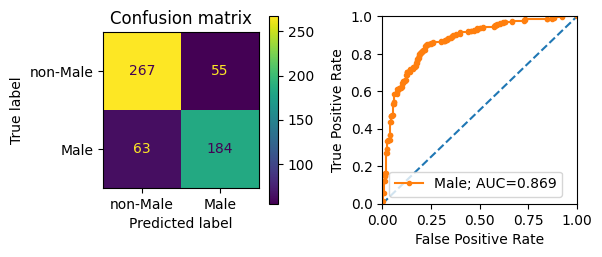

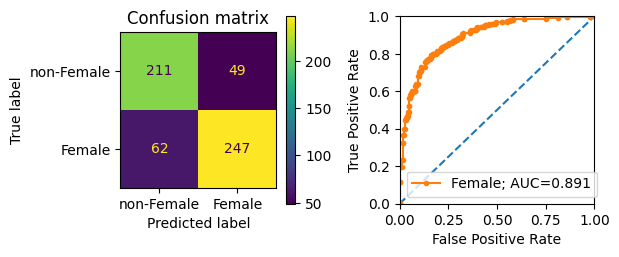

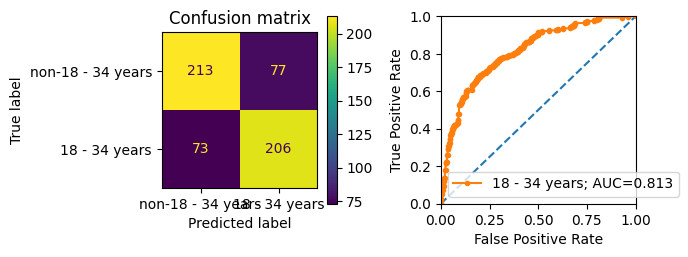

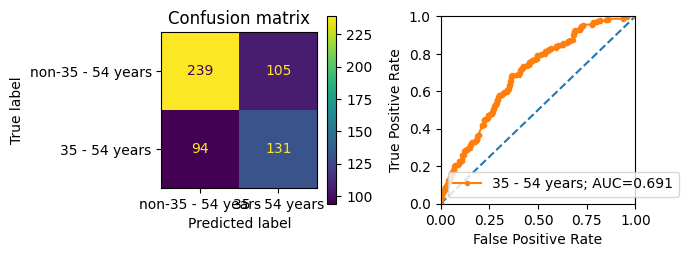

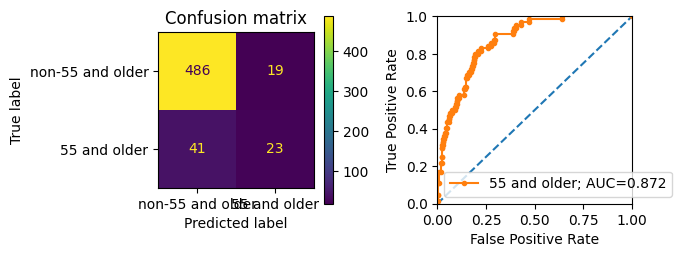

...

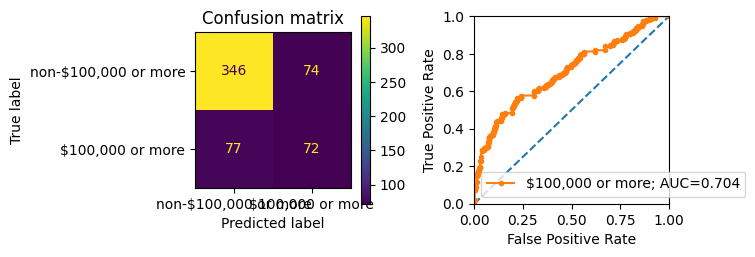

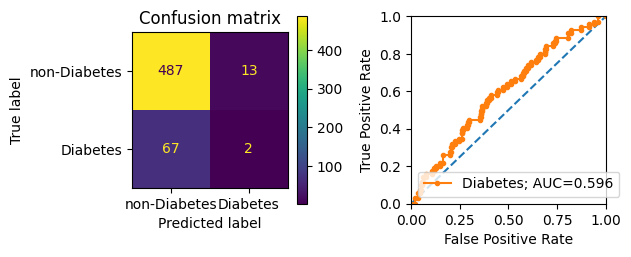

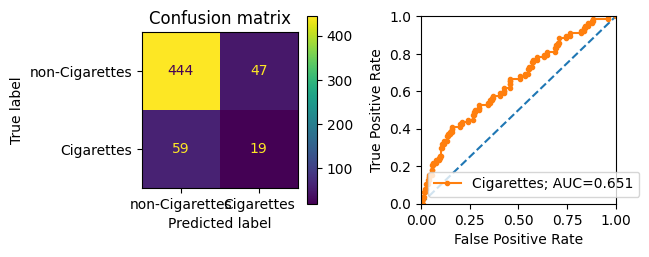

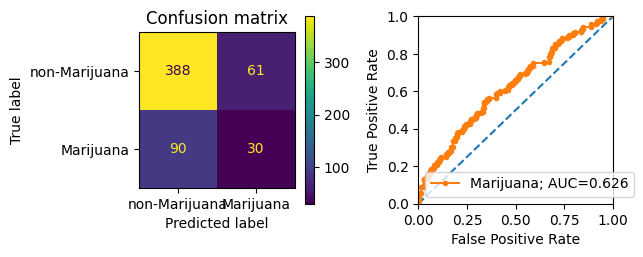

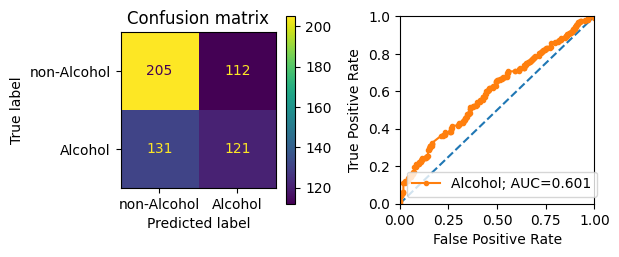

In [480]:
X_single_login_comparison = X.sample(n=n_single_login_users, replace=False, random_state=RANDOM)
print('Randomly sampled n=%s users from X' % len(X_single_login_comparison))
X_y_data_single_login_comparison = setup_labeled_X_y_data(X_single_login_comparison, labeled_y)
# results dict: map label to svm results
onehot_svm_results_single_l_comparison = dict()
use_labels = X_y_data.keys()
for i, label in enumerate(use_labels):
    print('\n%s\n%s/%s: SVM for %s' % (datetime.datetime.now(), i+1, len(use_labels), label))
    X_train, X_test, y_train, y_test = X_y_data_single_login_comparison[label]['train_test_split']
    clf = svm.SVC(probability=True, class_weight='balanced')
    clf.fit(X_train, y_train)
    auc = get_auc_and_plot(clf, X_test, y_test)
    onehot_svm_results_single_l_comparison[label] = auc

In [481]:
pd.DataFrame({
    'AUC | single login users (n=2843)': onehot_svm_results_single_l.values(),
    'AUC | random comparison sample (n=2843)': onehot_svm_results_single_l_comparison.values(),
}, index=list(onehot_svm_results_single_l.keys())).round(3)

,AUC | single login users (n=2843),AUC | random comparison sample (n=2843)
Male,0.930,0.869
Female,0.928,0.891
18 - 34 years,0.827,0.813
35 - 54 years,0.680,0.691
55 and older,0.856,0.872
White,0.721,0.760
Black,0.832,0.746
Asian,0.744,0.756
Hispanic,0.582,0.637
"Less than $50,000",0.709,0.694


## Risk Mitigation: Swapping purchases

Consider users purchasing for their neighbors... and swapping purchases


Mean accuracy: 0.8682
ROC AUC=0.745


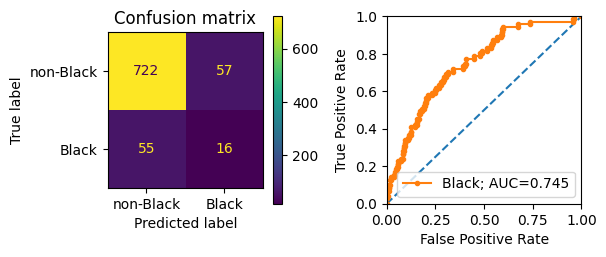

In [180]:
label = 'Black'

_X_train, X_test, _y_train, y_test = X_y_data[label]['train_test_split']
clf = onehot_svm_models[label] # already trained
test_rids = X_test.index.tolist()

# Get p X_test: feature vectors from p purchases for each test user
test_amzn_df = p50u_amzn_data[p50u_amzn_data[RESPONSE_ID].isin(test_rids)]
p_test_df = test_amzn_df.groupby(RESPONSE_ID).sample(n=50, replace=False, random_state=RANDOM)
p_X_test = get_X_one_hot_encoding_for_categories(p_test_df, cats_u50).loc[test_rids]
auc = get_auc_and_plot(clf, p_X_test, y_test, plot=True)

In [181]:
from sklearn.metrics import recall_score
from sklearn.metrics import confusion_matrix

def get_false_neg_true_pos(clf, y_test, X_test):
    """Returns (false negatives, true positives)"""
    y_pred = clf.predict(X_test)
    return tuple(confusion_matrix(y_test, y_pred)[1])

get_false_neg_true_pos(clf, y_test, p_X_test)

(55, 16)

In [182]:
label = 'White'

_X_train, X_test, _y_train, y_test = X_y_data[label]['train_test_split']
clf = onehot_svm_models[label] # already trained

# get the negative test users
neg_test_rids = y_test[y_test == 0].index
# get the positive test users
# cap the number of positive test users to max the number of negative test users
# otherwise there may not be enough items to swap with
max_pos_test_n = len(neg_test_rids)
pos_test_rids = y_test[y_test > 0].index#[:max_pos_test_n]
pos_y_test = y_test.loc[pos_test_rids]
print('n=%s positive test users; n=%s negative test users' % (
        len(pos_test_rids), len(neg_test_rids)))

# Get p X_test: feature vectors from p purchases for each test user
test_amzn_df = p50u_amzn_data[p50u_amzn_data[RESPONSE_ID].isin(pos_test_rids)]
pos50_test_df = test_amzn_df.groupby(RESPONSE_ID).sample(n=50, replace=False, random_state=RANDOM)
# insert intervention here
p_X_test = get_X_one_hot_encoding_for_categories(pos50_test_df, cats_u50).loc[pos_test_rids]
(fn, tp) = get_false_neg_true_pos(clf, pos_y_test, p_X_test)
print('Recall = %0.3f' % (tp/(tp+fn)))
(fn, tp)

n=711 positive test users; n=139 negative test users
Recall = 0.736


(188, 523)

Mean accuracy: 0.8024
ROC AUC=0.779
Recall = 0.861


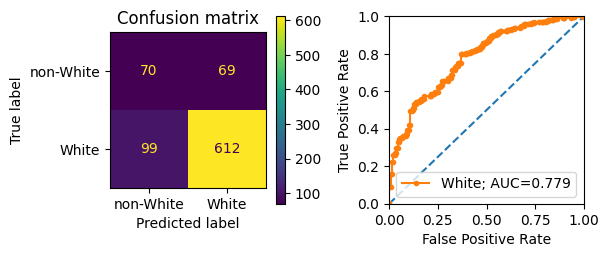

In [183]:
# Comparison without any changes -- using all the data
# prevalence is 0.837
auc = get_auc_and_plot(clf, X_test, y_test.loc[X_test.index], plot=True)
(fn, tp) = get_false_neg_true_pos(clf, y_test.loc[X_test.index], X_test)
print('Recall = %0.3f' % (tp/(tp+fn)))

In [184]:
# would it be a bad predictor on only 50 purchases in general then?
# Answer: Yes

test_amzn_df = p50u_amzn_data[p50u_amzn_data[RESPONSE_ID].isin(X_test.index)]
test50_df = test_amzn_df.groupby(RESPONSE_ID).sample(n=50, replace=False, random_state=RANDOM)
p50_X_test = get_X_one_hot_encoding_for_categories(test50_df, cats_u50)

Mean accuracy: 0.7176
ROC AUC=0.697
Recall = 0.752


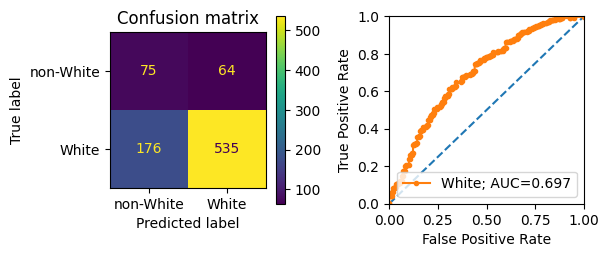

In [185]:
auc = get_auc_and_plot(clf, p50_X_test, y_test.loc[p50_X_test.index], plot=True)
(fn, tp) = get_false_neg_true_pos(clf, y_test.loc[p50_X_test.index], p50_X_test)
print('Recall = %0.3f' % (tp/(tp+fn)))

In [186]:
"""
swaps_results:
Make a dictionary mapping:
label: {
    prevalence: |train label=True|/|train sample|
    random_swap_results_df: <dataframe>
    targeted_swap_results_df: <dataframe>
}
"""

swap_ps5 = [0,5,10,15,20,25,30,35,40,45,50]
swap_ps12345 = [0,1,2,3,4,5,10,15,20,25,30,35,40,45,50]


def get_random_swap_results(label, swap_ps):
    """
    Returns random_swap_results_df for label.
    """
    print('%s: Getting random swap results with p in %s' % (label, swap_ps))
    return get_swap_results(label, swap_ps, swap_type='random')


def get_targeted_swap_results(label, swap_ps):
    """
    Returns targeted_swap_results_df for label.
    """
    print('%s: Getting targeted swap results with p in %s' % (label, swap_ps))
    return get_swap_results(label, swap_ps, swap_type='targeted')

    
def get_swap_results(label, swap_ps, swap_type='random'):
    FN = []
    TP = []
    prediction_probs = []
    _X_train, X_test, y_train, y_test = X_y_data[label]['train_test_split']
    clf = onehot_svm_models[label] # already trained
    # get the negative test users
    neg_test_rids = y_test[y_test == 0].index
    # get the positive test users
    # cap the number of positive test users to max the number of negative test users
    # otherwise there may not be enough items to swap with
    # TODO: take this out if we don't end up using White in analysis
    max_pos_test_n = 2*len(neg_test_rids)
    pos_test_rids = y_test[y_test > 0].index[:max_pos_test_n]
    pos_y_test = y_test.loc[pos_test_rids]
    print('n=%s positive test users; n=%s negative test users' % (
        len(pos_test_rids), len(neg_test_rids)))
    # get the pool of purchases made by users s.t. label=0
    neg_purchases = amzn_data[amzn_data[RESPONSE_ID].isin(neg_test_rids)]
    print('%s purchases made by negative test users' % len(neg_purchases))
    # Get p50 X_test: feature vectors from 50 purchases for each test user
    test_amzn_df = p50u_amzn_data[p50u_amzn_data[RESPONSE_ID].isin(pos_test_rids)]
    _pos50_test_df = test_amzn_df.groupby(RESPONSE_ID).sample(n=50, replace=False, random_state=RANDOM)
    for p in swap_ps: 
        print('%s: p=%s' % (datetime.datetime.now(), p))
        pos50_test_df = _pos50_test_df.copy()
        if p > 0:
            if swap_type == 'random':
                pos50_test_df = do_random_swaps(pos50_test_df, neg_purchases, p)
            elif swap_type == 'targeted':
                pos50_test_df = do_targeted_swaps(pos50_test_df, neg_purchases.copy(), p, label)
            else:
                raise Exception('Swap type <%s> not implemented.' % swap_type)
        p_X_test = get_X_one_hot_encoding_for_categories(pos50_test_df, cats_u50).loc[pos_test_rids]
        (fn, tp) = get_false_neg_true_pos(clf, pos_y_test, p_X_test)
        # get the prediction probability scores
        prediction_probs += [list(clf.predict_proba(p_X_test)[:, 1])]
        FN += [fn]
        TP += [tp]
    swap_results_df = pd.DataFrame({
        'swapped': swap_ps,
        'FN': FN,
        'TP': TP,
        'pred. probs': prediction_probs,
    }).set_index('swapped')
    swap_results_df['Recall'] = swap_results_df['TP'] / (swap_results_df['TP'] + swap_results_df['FN'])
    return swap_results_df


def do_targeted_swaps(pos_purchases_df, neg_purchases, p, label):
    cat_importance = labels_all_cat_features_dict[label].set_index(CATEGORY)['OR']
    pos_test_rids = pos_purchases_df[RESPONSE_ID].unique()
    # attach the category importance values (OR) to the products
    pos_purchases_df['OR'] = pos_purchases_df[CATEGORY].map(cat_importance)
    neg_purchases['OR'] = neg_purchases[CATEGORY].map(cat_importance)
    # sort the positive purchases to have most important first
    pos_purchases_df = pos_purchases_df.sort_values('OR', ascending=False)
    # sort the negative purchases to have least important first
    neg_purchases = neg_purchases.sort_values('OR', ascending=True)
    # set up numeric checks
    n_pos_purchases = len(pos_purchases_df)
    # get the p most important neg_purchases
    n_total_swaps = p*len(pos_test_rids)
    neg_p = neg_purchases.head(n_total_swaps).copy()
    # handle swap by reassigning the rids
    # order the rids so that the most important purchases are distributed across the rids
    neg_p[RESPONSE_ID] = list(pos_test_rids)*p
    # do the swaps in the dataframe
    # drop the p most important purchases for each pos test rid
    for rid in pos_test_rids:
        pos_purchases_df = pos_purchases_df.drop(pos_purchases_df[pos_purchases_df[RESPONSE_ID]==rid].index[:p])
    # add the swapped negative purchases
    pos_purchases_df = pd.concat([pos_purchases_df, neg_p])
    # assert numbers didn't change: this was a swap
    assert(n_pos_purchases == len(pos_purchases_df))
    return pos_purchases_df


def do_random_swaps(pos_purchases_df, neg_purchases, p):
    """
    Makes p swaps for each user in the pos_purchases_df.
    Where purchases to swap with are randomly selected from the pool of neg_purchases.
    Returns the modified pos_purchases_df
    """
    # set up numeric checks
    n_neg_purchases = len(neg_purchases)
    n_pos_purchases = len(pos_purchases_df)
    pos_test_rids = pos_purchases_df[RESPONSE_ID].unique()
    for i, rid in enumerate(pos_test_rids):
        # select the p random purchases from negative purchases
        p_sampled = neg_purchases.sample(n=p, replace=False, random_state=RANDOM)
        # drop these sampled purchases from the negative purchases so they cannot be sampled again
        neg_purchases = neg_purchases.drop(p_sampled.index)
        # replace p purchases for the rid with these sampled purchases
        # drop p purchases for the rid
        pos_purchases_df = pos_purchases_df.drop(pos_purchases_df[pos_purchases_df[RESPONSE_ID]==rid].index[:p])
        # update the sampled replacement purchases responseID to the rid
        p_sampled[RESPONSE_ID] = rid
        # add the p_sampled purchases
        pos_purchases_df = pd.concat([pos_purchases_df, p_sampled])
    # assert numbers didn't change: this was a swap
    assert((n_neg_purchases - (p*len(pos_test_rids))) == len(neg_purchases))
    assert(n_pos_purchases == len(pos_purchases_df))
    return pos_purchases_df

In [187]:
def get_train_data_prevalence(label, verbose=True):
    """Returns the portion of the label=True in the training sample."""
    _X_train, X_test, y_train, y_test = X_y_data[label]['train_test_split']
    label_prevalence = y_train.sum()/len(y_train)
    if verbose:
        print('%0.3f = %s/%s: %s label prevalence in training sample' % (
            (label_prevalence), y_train.sum(), len(y_train), label
        ))
    return label_prevalence

In [188]:
use_labels = ['Male', 'Female'] + age_groups + socio_groups['Race']
swaps_results = {l: dict() for l in use_labels}
# add prevalence
for l in use_labels:
    # get the prevalance as the portion of the label=True in the training sample
    swaps_results[l]['prevalence'] = get_train_data_prevalence(l)
    
for l in use_labels:
    swaps_results[l]['random_swap_results_df'] = get_random_swap_results(l, swap_ps5)

0.435 = 1477/3398: Male label prevalence in training sample
0.542 = 1841/3398: Female label prevalence in training sample
0.491 = 1667/3398: 18 - 34 years label prevalence in training sample
0.399 = 1355/3398: 35 - 54 years label prevalence in training sample
0.111 = 376/3398: 55 and older label prevalence in training sample
0.837 = 2844/3398: White label prevalence in training sample
0.089 = 301/3398: Asian label prevalence in training sample
0.083 = 283/3398: Black label prevalence in training sample
Male: Getting random swap results with p in [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50]
n=370 positive test users; n=480 negative test users
224413 purchases made by negative test users
2024-06-08 23:54:01.103263: p=0
2024-06-08 23:54:04.028065: p=5
2024-06-08 23:54:15.927599: p=10
2024-06-08 23:54:27.723554: p=15
2024-06-08 23:54:40.446948: p=20
2024-06-08 23:54:52.270147: p=25
2024-06-08 23:55:04.602754: p=30
2024-06-08 23:55:17.153730: p=35
2024-06-08 23:55:28.720097: p=40
2024-06-08 2

In [189]:
use_labels = ['Male', 'Female'] + age_groups + socio_groups['Race']
for l in use_labels:
    swaps_results[l]['targeted_swap_results_df'] = get_targeted_swap_results(l, swap_ps5)

Male: Getting targeted swap results with p in [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50]
n=370 positive test users; n=480 negative test users
224413 purchases made by negative test users
2024-06-09 00:05:00.640569: p=0
2024-06-09 00:05:03.563630: p=5
2024-06-09 00:05:07.098437: p=10
2024-06-09 00:05:10.599398: p=15
2024-06-09 00:05:14.270036: p=20
2024-06-09 00:05:17.732892: p=25
2024-06-09 00:05:21.176159: p=30
2024-06-09 00:05:24.573912: p=35
2024-06-09 00:05:27.965640: p=40
2024-06-09 00:05:31.318586: p=45
2024-06-09 00:05:34.649074: p=50
Female: Getting targeted swap results with p in [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50]
n=460 positive test users; n=390 negative test users
140017 purchases made by negative test users
2024-06-09 00:05:38.275652: p=0
2024-06-09 00:05:41.768655: p=5
2024-06-09 00:05:46.222066: p=10
2024-06-09 00:05:50.616129: p=15
2024-06-09 00:05:54.974203: p=20
2024-06-09 00:05:59.365374: p=25
2024-06-09 00:06:03.756122: p=30
2024-06-09 00:06:07.951935: p=35
2

In [192]:
def plot_user_prob_dots(swap_results_df, prevalence, label, x_max=50, ax=None):
    """
    Plots each user as a different dot, with consistent color
    """
    if ax is None:
        fig, ax = plt.subplots(1,1,figsize=(4,2))
    ax.set_title('%s probability score' % label)
    xy = swap_results_df.loc[:x_max]
    for i in range(len(xy.loc[0]['pred. probs'])):
        probs_i = [vals[i] for vals in xy['pred. probs'].values]
        ax.scatter(xy.index, probs_i, marker='.')
    ax.set_ylim(0, 1)
    ax.axhline(prevalence, label='Sample prevalence', linestyle=':', color='black')
    _ = ax.legend()
    return ax

Male
Female
18 - 34 years
35 - 54 years
55 and older
White
Asian
Black


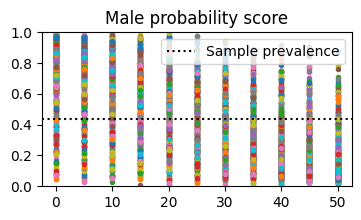

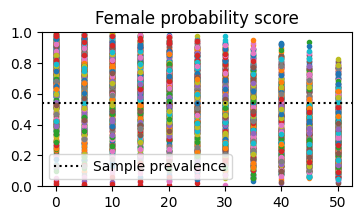

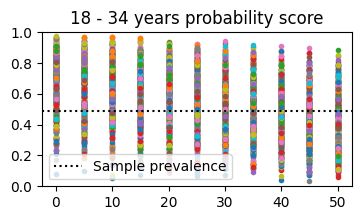

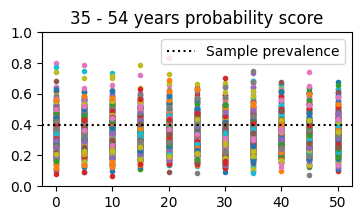

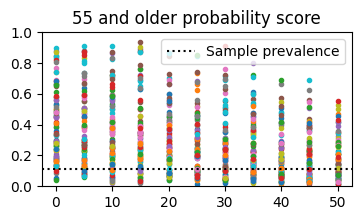

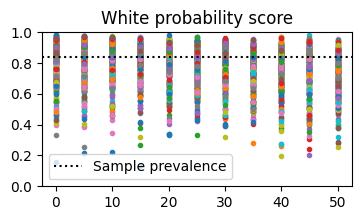

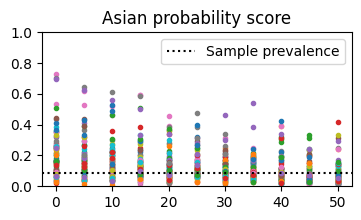

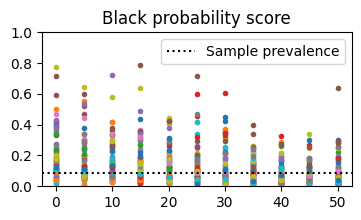

In [194]:
for l in use_labels:
    #print(l)
    #display(swaps_results[l]['random_swap_results_df'])
    swap_results_df = swaps_results[l]['random_swap_results_df']
    prevalence = swaps_results[l]['prevalence']
    ax = plot_user_prob_dots(swap_results_df, prevalence, l)

In [195]:
def plot_user_prob_boxplots(swap_results_df, prevalence, label, x_max=50, ax=None, xlabel=True):
    """
    Plots each user as a different dot, with consistent color
    """
    if ax is None:
        fig, ax = plt.subplots(1,1,figsize=(4.5,2.5))
    ax.set_title('%s' % label)
    xy = swap_results_df.loc[:x_max]
    ax.axhline(prevalence, label='Sample prevalence', linestyle=':')
    ax.set_ylim(0, 1)
    ax.legend()
    ax.boxplot(xy['pred. probs'].values, labels=xy.index)
    ax.set_ylabel('Prediction score')
    if xlabel: ax.set_xlabel('Swapped purchases (out of 50 total)')
    return ax

Male: prevalence = 0.435


,FN,TP,pred. probs,Recall
swapped,,,,
0,76,294,"[0.8031799326562478, 0.5389732446101192, 0.7618175715141868, 0.940060746665134, 0.8953106420359412, 0.7058964350612273, 0.9184266816340012, 0.608887156820683, 0.848548513873725, 0.9668863081170136, 0.7562243272316295, 0.644651964997072, 0.9422734341470799, 0.7463697455782027, 0.9586244984855866, 0.4286987837026258, 0.17458661315986948, 0.2857279091533657, 0.6682850660971881, 0.9370357399697223, 0.8821679796685405, 0.9691173027825193, 0.9297604725679884, 0.5404041056485247, 0.9425195739390096, 0.33206256934795314, 0.311790738247927, 0.7926196221184867, 0.8277075845149326, 0.8520910302105089, 0.8972298161648973, 0.8668416176369957, 0.7433025781561376, 0.7446446435623096, 0.5, 0.7084705350155459, 0.4942215715801342, 0.7290384711759644, 0.7238805148585418, 0.4801093180961089, 0.8344514450996869, 0.10886060937741444, 0.8086024799959121, 0.699609655314592, 0.8477641416649134, 0.9602788208452759, 0.9697112913530518, 0.2925173837537562, 0.9000996383022322, 0.6276167828715274, 0.8192587281325922, 0.9530997521150366, 0.6208051662442172, 0.8435545317135784, 0.9562508693474259, 0.6302180378311742, 0.7386079986977176, 0.6180903091907207, 0.9593615206663508, 0.8442969028452285, 0.7596767267959127, 0.30069764197845295, 0.3827489334208523, 0.7264466170736225, 0.3142371765365024, 0.7456390915546379, 0.2348130652249448, 0.4101932179454804, 0.9426386821806992, 0.843418122593587, 0.826324591255902, 0.923663314175244, 0.8784762521721704, 0.8300005885879153, 0.49156055814892535, 0.8348890392210819, 0.3929065383654781, 0.850151324467244, 0.9748119097546382, 0.5462876154948028, 0.5444439483494236, 0.441063931373957, 0.39361672793954594, 0.8494029804567313, 0.6857753280818931, 0.15835540757759825, 0.8571814928716507, 0.9845723502189125, 0.5126208071686147, 0.44990104916274737, 0.9363117170016891, 0.7408281558950746, 0.9418900956504802, 0.9450132623557, 0.6921828815872627, 0.08212141846282112, 0.7803430576691435, 0.7229606702801024, 0.27619428687733394, 0.9188185355214732, ...]",0.794595
5,245,125,"[0.30122942422725796, 0.13438709959344305, 0.25071722436634375, 0.6395400274649558, 0.31108144591159725, 0.22571235089376498, 0.6270902285433073, 0.192274511655146, 0.5864374284877276, 0.6570625251805507, 0.2172347993076827, 0.24994047024696697, 0.6834674932200777, 0.2637293067507705, 0.8067808553615344, 0.1435881895958514, 0.037441822020854436, 0.06333960856598707, 0.16197892712290526, 0.6569050803925611, 0.36277731274260544, 0.7442986530433575, 0.4173015419745475, 0.10219818547073717, 0.6593330522927903, 0.10111406442314107, 0.10593099825787591, 0.4519291359064124, 0.49391149471221596, 0.5393998480590168, 0.48931396402087146, 0.2913509469262197, 0.25916414980817337, 0.21730447895784663, 0.328674989582636, 0.5345701015995653, 0.20373897997966242, 0.2931719734918127, 0.3611077116788491, 0.1589947710285051, 0.43389894583580874, 0.026991508232059654, 0.3668552468303111, 0.20577184517604652, 0.6673734785409869, 0.8548435501393155, 0.8243802614658498, 0.09191690669786678, 0.5838278978140342, 0.06821151973599535, 0.25049034307247436, 0.7454973918666903, 0.30105065565197975, 0.3146335910033276, 0.7263321940939859, 0.21148114800939788, 0.291588684892774, 0.22539988321687524, 0.65792272017742, 0.4140222308713299, 0.12504501909090818, 0.07555278097919042, 0.11465109789197926, 0.4507162112622028, 0.057689157404644566, 0.48592739083992154, 0.04924700087830903, 0.18192169899382657, 0.6869404169121122, 0.5475754524200138, 0.2737212028741513, 0.7019638336373268, 0.43366935913496296, 0.3711413599091519, 0.15156680865839461, 0.4463780332726834, 0.13934407669593923, 0.46128208764812384, 0.7761739319459009, 0.13500949153398034, 0.15387629092191896, 0.1740983932942992, 0.12289596435079643, 0.49359760929382873, 0.12292941769210607, 0.05853731345545711, 0.5, 0.9476086623845081, 0.1627794291104065, 0.12016130866815608, 0.6323208741689579, 0.33378472714874946, 0.5922488793111851, 0.6736025012308712, 0.27217067000911616, 0.02009616780

Female: prevalence = 0.542


,FN,TP,pred. probs,Recall
swapped,,,,
0,104,356,"[0.8259091491324946, 0.9252252920069006, 0.3511228435232198, 0.4094687800972076, 0.28788380866863933, 0.5786011669820205, 0.721450344738658, 0.6795447131660675, 0.5663967926680101, 0.4057682535596567, 0.7307655389865605, 0.7919070595576039, 0.9674591817548976, 0.9155094331635077, 0.5151589512856464, 0.83919895310985, 0.7947596702471954, 0.6469667051684388, 0.30467643302797853, 0.5, 0.7279947958345669, 0.38554094185144344, 0.8998387835625533, 0.3378689861415901, 0.8459734902293176, 0.45546771722757734, 0.2781094240173296, 0.8174101788313264, 0.7483308820131745, 0.3827707704885182, 0.827050232253242, 0.797151268460905, 0.8679326449509803, 0.8810568039707307, 0.9023642469808429, 0.7432945179799187, 0.11047614354200135, 0.8616212238859312, 0.33501010517406876, 0.20244966694542005, 0.38268456622303093, 0.9360559749120604, 0.37674523713582586, 0.7029162670075723, 0.7631742438638619, 0.9222828952272796, 0.6569388121252897, 0.7613109082719728, 0.6213577138058445, 0.5603073339299524, 0.7311576710096814, 0.7717314045304509, 0.5917819764412907, 0.3030896585677987, 0.46657913441592186, 0.7520892669659354, 0.37022128736030074, 0.9176847476801371, 0.2604797166922921, 0.9897614010564425, 0.959128981120917, 0.6031247682570521, 0.21597217483335507, 0.9824346763448838, 0.7616703831463826, 0.6366780005812691, 0.8938898963431997, 0.8337784899670999, 0.4561940085743154, 0.5822268621677333, 0.8889292258635202, 0.8610965675101041, 0.3935354083409136, 0.843291755565159, 0.8722874273810498, 0.19464733484296842, 0.7008033791258297, 0.9857983710191831, 0.9863372614022199, 0.8500324420392102, 0.9176692867885318, 0.6176342343821738, 0.5166927355925467, 0.7854070384086326, 0.9059769764364699, 0.7983225498095461, 0.6583198555458665, 0.9186222609285815, 0.6338632328629918, 0.5806819776131297, 0.7091407777077355, 0.7612492599098051, 0.6968645861977478, 0.723110557509472, 0.6199824554145618, 0.8031670305465531, 0.47127174741341055, 0.8323778961485461, 0.6089949359997233, 0.5887391508987609, ...]",0.773913
5,413,47,"[0.24517263536281614, 0.3473098078170901, 0.035586794317088, 0.15194559860699575, 0.03821349347176702, 0.10597150050568242, 0.17141091485115456, 0.10740343617506572, 0.12946536271138362, 0.05883739196067584, 0.21456262907359663, 0.2541590409447569, 0.49050907494435136, 0.5986922265070053, 0.10699180939555081, 0.2815142514739038, 0.5100077185135979, 0.11843155796882082, 0.04548498385405926, 0.08654019551849915, 0.15898070654818072, 0.06734184720396402, 0.43818950192576744, 0.08007589474441884, 0.1776610920788632, 0.061668138901054326, 0.02588651649659537, 0.1665434597478686, 0.20862942550521865, 0.05204340752143644, 0.2258275850479173, 0.25835052024573013, 0.5, 0.34516808591181225, 0.35380736437377686, 0.1893316362445753, 0.014988524686498514, 0.21008145603949313, 0.08377211149555847, 0.03591476087625429, 0.06594378050027257, 0.7077894362908002, 0.042797937139398654, 0.22934146030363858, 0.12761638800410316, 0.41341584019346483, 0.2953173062949125, 0.14479143611173295, 0.17905459918808886, 0.13667755544053745, 0.08875048505030057, 0.4420968945903519, 0.07121987427159897, 0.03621582642822836, 0.07424020185337504, 0.3535376639498147, 0.05854176497884942, 0.6158396625166728, 0.0480857637107466, 0.8716185465134106, 0.46161140874581047, 0.0968523372727806, 0.030939777052725877, 0.7140823963062487, 0.24340741395143015, 0.23153462859455481, 0.3211448381571127, 0.17769331307028044, 0.06665427434663601, 0.1536691710611132, 0.47326600562108667, 0.3004448356894068, 0.039239971425933634, 0.20245363975211195, 0.21840043081164243, 0.014949761207866877, 0.07115019548484008, 0.8577047791046739, 0.5321478261387012, 0.23843614343251723, 0.3406760256303445, 0.08655971164037782, 0.09277010801253767, 0.4399118141974832, 0.6023192326092761, 0.06847849310378701, 0.10650355573298698, 0.4497802764414053, 0.08062017026816876, 0.26334507642009763, 0.34213096407983096, 0.12261796575451674, 0.1527605674881826, 0.12973255378658471,

18 - 34 years: prevalence = 0.491


,FN,TP,pred. probs,Recall
swapped,,,,
0,72,345,"[0.07686942093169429, 0.589949677528388, 0.693588944526699, 0.8029418518904418, 0.6841082682522466, 0.9470821201783771, 0.2748808936514342, 0.6100513270320448, 0.5643064740943563, 0.8870343605794158, 0.7017750068985504, 0.8735731634583275, 0.809911515171829, 0.7137179172086027, 0.27596191163681816, 0.8473358554651766, 0.45309841289494923, 0.6691180140014109, 0.8438462499907584, 0.6982935963824021, 0.7353852515052755, 0.45075420648864273, 0.89704649440317, 0.5166325351403638, 0.7256522153567772, 0.8835846813319745, 0.8472213922749897, 0.7374181090452893, 0.2309875837078639, 0.8253197753529007, 0.4766140550476305, 0.8475783612815955, 0.44670355951786367, 0.8136868637457607, 0.9077025558124888, 0.7640976680493741, 0.7766972477491213, 0.5805922260572848, 0.4875407047978375, 0.8042280305308237, 0.572004300494394, 0.5, 0.8121539136639206, 0.6572173490141182, 0.300607831796841, 0.720166557946896, 0.840363475134977, 0.4253664919999201, 0.9287032520762715, 0.8473191044517004, 0.5410913395912244, 0.6229493801370125, 0.892614483507163, 0.8861504641582356, 0.8404994789818749, 0.7040741933006066, 0.8047622423590507, 0.8171999456608228, 0.6000106561906542, 0.7408474825218959, 0.7355998995765053, 0.7356264698311636, 0.5453304986743135, 0.9060719629079084, 0.8994379782712522, 0.8245551892227849, 0.5251578957214644, 0.6099764356852522, 0.9107390698980253, 0.7413278412642235, 0.4718298804466578, 0.8589861478548871, 0.6389689948028445, 0.6385197741819401, 0.6776714605842429, 0.7650199138979116, 0.585063696420423, 0.7049641751226479, 0.518330800795439, 0.7507062834706134, 0.7133184018640537, 0.846733228125656, 0.7108142635946673, 0.4259583174771314, 0.7776013964695427, 0.7935855440042753, 0.8726464929610905, 0.8007319456272519, 0.736859928745199, 0.5653057189004584, 0.7252758945019796, 0.46045459536168204, 0.48067305069981786, 0.8390681368641308, 0.8944543070470157, 0.7962638447694699, 0.8448541394342673, 0.6405579999101707, 0.8602772862011894, 0.7841287686472103, ...]",0.827338
5,293,124,"[0.03561159472027925, 0.31668234830005926, 0.31199676532779613, 0.42293341268236323, 0.3309045724023225, 0.7906443856558539, 0.0913382524060781, 0.36933999605185736, 0.2444129459811691, 0.5611643701147696, 0.5, 0.5979010900110072, 0.5084630041001744, 0.5238367157496837, 0.1479993205274398, 0.4645929640848591, 0.15746700518155865, 0.25726995185828544, 0.4714924010895002, 0.21510244389866756, 0.5265851411175736, 0.22292611535011192, 0.647632124134505, 0.13653540344856863, 0.4888057072461007, 0.6933640736440965, 0.4630887424990907, 0.5450960980352467, 0.11353571414800466, 0.45425534559898223, 0.25772221560245134, 0.48308741181450865, 0.13337269206160107, 0.6586184245442204, 0.6503562744136065, 0.2781792453125926, 0.5299441939475985, 0.40811335442597557, 0.1415836157911109, 0.5496468067335398, 0.33122890213049616, 0.23378202345066862, 0.5762595987833743, 0.2762199166129041, 0.0921048602685681, 0.3746452250225346, 0.4068908009075008, 0.16171528554899606, 0.6937624093164382, 0.48389163570181776, 0.29039730184525336, 0.28512705339535294, 0.7041226959616905, 0.7173736516282838, 0.5711279108263855, 0.43559726065275006, 0.5792064283899216, 0.5385536153355343, 0.22832591589890447, 0.4345196367440606, 0.568202119814743, 0.3202598467497744, 0.23735257833522594, 0.6779996713912503, 0.7208302571706807, 0.5, 0.18166350414150897, 0.2384276746429618, 0.6674662716117202, 0.3102010263962851, 0.22086083923466335, 0.5885624082352275, 0.283072111092292, 0.2294581549336247, 0.2545875233876501, 0.36649651340450007, 0.29425064235987697, 0.38576684471971023, 0.3300363621016039, 0.4785460594403394, 0.29226500782864173, 0.457384784625724, 0.2073703394429538, 0.1482413478714367, 0.5, 0.48427759130104864, 0.46492234542786587, 0.35505279040230653, 0.40788739742119134, 0.22046449357380604, 0.44970672734904876, 0.08206509067950189, 0.19182203794356523, 0.4215370768283847, 0.6216536072439638, 0.5528239888429302, 0.6356628623631166, 0.30413054665415

35 - 54 years: prevalence = 0.399


,FN,TP,pred. probs,Recall
swapped,,,,
0,258,81,"[0.3710069598583864, 0.2281217991947233, 0.25680759303648437, 0.46959268993822734, 0.6470733985011453, 0.6854795009321326, 0.3459021472943672, 0.4281072952488406, 0.2966358943244543, 0.4450347046245601, 0.3554583701452388, 0.13492046494771906, 0.45782243336123896, 0.31133356114333316, 0.4642513366772834, 0.3049287151160881, 0.4567125287321322, 0.31543575521597716, 0.30928777129692464, 0.29987783734582657, 0.18340902786302823, 0.3852787048009189, 0.334619179678312, 0.2698259696751501, 0.41369431223250863, 0.23944249116727373, 0.797987243642425, 0.1523335219475129, 0.4577072768330918, 0.3670145242417226, 0.4158952224081486, 0.21521373936642257, 0.256609744166759, 0.35596299660194664, 0.4583177846608052, 0.523907771805301, 0.41647487165234803, 0.18733616278392437, 0.3183244025578551, 0.3939050747550981, 0.6207233211556077, 0.3601172625668143, 0.25823664031002036, 0.4469418858932144, 0.40970655441513804, 0.6167900851563517, 0.6458260580422065, 0.2893965896715949, 0.3705756034385156, 0.2632231244925084, 0.2341182348423288, 0.3323512970953805, 0.3996098681401773, 0.2682969356422464, 0.42696200540498186, 0.47345360822730503, 0.19502276119367234, 0.5187361280725075, 0.5907144611661899, 0.41629142422628723, 0.5588992164250856, 0.3381696535658205, 0.39366497804488343, 0.4135162531859366, 0.2891522372376692, 0.3948217811727252, 0.37947332441644915, 0.3494994782591136, 0.3574145170199893, 0.474114208589286, 0.2715293010394531, 0.3804403995469127, 0.24832569334732055, 0.5783627593818969, 0.5624806655308743, 0.44814278234922317, 0.246011419830262, 0.3083051617448212, 0.2547473620975126, 0.775483748544453, 0.5080739263810543, 0.34292807950070603, 0.5290492838267913, 0.19307939188979054, 0.3559708244947817, 0.4004468130333212, 0.3451283539058954, 0.4934482386091737, 0.48691130216097295, 0.2972177557528427, 0.3112214195888446, 0.2749554166460748, 0.4053291416219741, 0.28887197392728287, 0.26953220508833137, 0.32181980862998627, 0.30512893042498895, 0.34585749654731235, 0.2690910342476663, 0.4741688169214939, ...]",0.238938
5,333,6,"[0.23672731514563514, 0.13225785648560473, 0.13408054077523526, 0.26001654762283916, 0.43387826636378085, 0.5093597546928552, 0.2178609587054324, 0.2635944623716539, 0.1838858967902024, 0.274127256703486, 0.23787237977376882, 0.09140557097330779, 0.25620849572612714, 0.21761933658523322, 0.33157238842427167, 0.18359734761242594, 0.27173701833051817, 0.16476067433990324, 0.22830924834122207, 0.16416137417562646, 0.1023715606293948, 0.21670743846084906, 0.204972617244629, 0.16175841270567576, 0.2814062515248271, 0.1562059783031632, 0.613530206771269, 0.09650935051169295, 0.2738640494480909, 0.1669284417257546, 0.31106604262111104, 0.13226871818424246, 0.16763872180544367, 0.21712418918795268, 0.2852479120809082, 0.37971242072215106, 0.20143683101867862, 0.107012903273898, 0.17190049207852728, 0.2743750217864193, 0.2977536814103915, 0.21495780694885785, 0.14474635871659922, 0.2715905138062173, 0.21335191458529598, 0.4165064282838437, 0.45058497864400826, 0.21945647792840017, 0.19919517696640834, 0.17064107300524745, 0.10231648993011301, 0.2575119898317732, 0.33126646223954426, 0.11535009714638113, 0.3028302563440318, 0.301562484596701, 0.11829702717629247, 0.3526851567280433, 0.41637819273427834, 0.3183384399287487, 0.3375602117076749, 0.19868757154871408, 0.25122698083310885, 0.26490542123000904, 0.13441105998393107, 0.21738541652726226, 0.30433925440262954, 0.23904375093477906, 0.21928836223529544, 0.3036976216686564, 0.14217924489121528, 0.21733192022626383, 0.20254697124339646, 0.39844554290853, 0.316472920069313, 0.34508143535528873, 0.13420639280916516, 0.1905228334499191, 0.12476931480710556, 0.510186690665405, 0.31559204915194033, 0.2233470965218342, 0.29907066620560635, 0.15157865332346007, 0.24591540315142502, 0.24312690184382438, 0.1879997066669891, 0.2903583366823656, 0.3474962105415485, 0.19182725119952962, 0.16995009595468996, 0.16406189214960365, 0.20374161

55 and older: prevalence = 0.111


,FN,TP,pred. probs,Recall
swapped,,,,
0,47,47,"[0.4623806069960498, 0.7401711549932488, 0.26943244205769623, 0.13089070899817087, 0.876933447836669, 0.8452072914988267, 0.7667464027720015, 0.3856845987882889, 0.26092784027507887, 0.8308335872085822, 0.13596227694682653, 0.22606843335004811, 0.5303681812363842, 0.4486020952940904, 0.20980579413588715, 0.5781345692884626, 0.17829760370996697, 0.16545199473803143, 0.1822723391336708, 0.8981030526895304, 0.13783598361542848, 0.2765668210447027, 0.611774544861332, 0.4153821732553842, 0.0493116068197816, 0.19571877492790987, 0.1859621758824813, 0.1472283031655901, 0.5, 0.29346567163864473, 0.3017269777177361, 0.293033986681781, 0.664940647085494, 0.16909666325321082, 0.44741678953593045, 0.3340640992069224, 0.17190962667777626, 0.6657876181300572, 0.11621929589738107, 0.8427444476435073, 0.27845230430924095, 0.12882944762279305, 0.2621111455926117, 0.287324795879209, 0.2964638452478417, 0.40487549900384573, 0.6894633320420337, 0.08815539947492476, 0.8744831111558773, 0.18142604397625717, 0.5360074170214074, 0.1578372662144128, 0.45932597828870375, 0.818274083317298, 0.19232426257987478, 0.5606349277352312, 0.4512403826972089, 0.5810447223109445, 0.16385256402706674, 0.3360812050651267, 0.05233329231374659, 0.2392313873207514, 0.38807366133697807, 0.6843737328628615, 0.4478763382472274, 0.47745173145143394, 0.49458092704539713, 0.17568744316090698, 0.24472358001848896, 0.2393739087323789, 0.35963418597752306, 0.41294932076267066, 0.04126808313105165, 0.34796953752671855, 0.561380886278454, 0.3386457482002868, 0.48081434174456394, 0.8042606553494006, 0.23506783494996467, 0.7448886439383932, 0.6846633408841883, 0.5, 0.49135917645081945, 0.0970139794901369, 0.19424659797654342, 0.648195446073205, 0.483349040314101, 0.5118177978642039, 0.2833603294660243, 0.13486360950437432, 0.23984492431365606, 0.16714898803949632, 0.6544937640487271, 0.5845645395875467]",0.50000
5,82,12,"[0.2050352536176362, 0.14426860007355718, 0.09777883756599227, 0.029098940037692107, 0.5575259274435498, 0.4105431820225014, 0.3054406855027108, 0.13308434903354516, 0.0361397782989185, 0.3805868192836116, 0.03337411532764547, 0.08508236867003902, 0.1543593321192636, 0.1583720139445914, 0.07021427043247222, 0.15641781281396594, 0.04784194495361285, 0.02634837144618197, 0.05943435826613545, 0.5448476495632328, 0.049336237008709226, 0.06956272714512812, 0.4170437526690841, 0.12778352282719094, 0.00857146775897848, 0.08197949276907228, 0.024422286294036123, 0.037877366234082166, 0.21644078630873279, 0.17689909844415405, 0.04419005004139157, 0.08245723088550891, 0.2829921084117849, 0.03539234687534273, 0.09296059586441549, 0.1630648192585323, 0.059549480187279784, 0.40710134795296504, 0.013175112137636539, 0.3101648722496449, 0.09249994490969388, 0.060980716180927916, 0.0496312821504397, 0.1212845430283928, 0.1216953501354672, 0.06121572407767561, 0.45936277572410883, 0.039072918442406845, 0.46926911668059507, 0.04541396729047658, 0.16169368430688943, 0.04091961927547157, 0.09922225231298246, 0.5170651423342374, 0.08624937480822699, 0.17227230682920217, 0.07042449788996258, 0.3722331744477701, 0.02876619471501022, 0.11256063819130072, 0.021935850987807565, 0.0360640963559782, 0.06858942640463062, 0.13811370209303733, 0.06789482153110125, 0.2126137210151766, 0.1184214751730634, 0.02583344108586537, 0.09567735810673776, 0.03938631665453098, 0.08384837972523544, 0.2216093290491137, 0.019065366076463617, 0.08148874477960816, 0.14416007812796774, 0.06680087539437887, 0.14340465005704645, 0.4001395229206247, 0.04077266135443924, 0.3139169812723994, 0.26171161353875105, 0.1571486427201085, 0.354191260349443, 0.03639309046718493, 0.08029293175587725, 0.29133999091509105, 0.11495914003797053, 0.18637632744906998, 0.04528616512210677, 0.03157148254889719, 0.05595866385987518, 0.06846808007103136, 0.17063441509106508, 0.10474246083200725]",0.12766
10,94,0,"[0.028876748238840018, 0.0779410269795097, 0.034186103809689436, 0.0069238198

White: prevalence = 0.837


,FN,TP,pred. probs,Recall
swapped,,,,
0,76,202,"[0.7702431010293223, 0.5105276209431534, 0.7025008772540411, 0.8033198884715514, 0.9169695599196129, 0.7700396713290039, 0.9570758980445118, 0.8052116113784727, 0.5698729703282803, 0.6482088906712802, 0.9205343970830129, 0.6335862014752752, 0.7177987749551309, 0.9294988217604342, 0.6222263132210312, 0.9281391567445925, 0.8495067557584179, 0.7907853927240229, 0.904607143173949, 0.8692018710816186, 0.6814476848981468, 0.8481289376843484, 0.7718833277269362, 0.7571766700748014, 0.8294415373929227, 0.6016881833176699, 0.8804804358317788, 0.9341653755548854, 0.9350854258011901, 0.5192596886444343, 0.8860613111597319, 0.906783272721225, 0.4857190765920937, 0.8302358547370906, 0.8363650982202248, 0.895051127919033, 0.7314859139953466, 0.927054199292149, 0.8740680769177203, 0.803924237981015, 0.7559363815859718, 0.7998960620732152, 0.6814365383887372, 0.5444693593867631, 0.6190540696532886, 0.9719944632190032, 0.9106066421919647, 0.9682392329385606, 0.9395787761424536, 0.7335225660439947, 0.8149518431912381, 0.746967781334114, 0.8175828275500399, 0.6734498459423173, 0.9376664340420843, 0.7872428059204278, 0.7020192298064802, 0.8408237630954479, 0.9569484258098665, 0.8467201248400392, 0.9285209545910839, 0.8492634636252239, 0.7125947459323166, 0.7563144527576169, 0.6594957931865152, 0.7564994764499443, 0.7302730397279971, 0.6795728846361967, 0.9029358307217472, 0.9208455157825892, 0.8692571619910224, 0.7261108782308482, 0.725024783216647, 0.9154467206913276, 0.6126601668123991, 0.8265237974173649, 0.9582840208196561, 0.8612686693108406, 0.5819905794601693, 0.42212619457663797, 0.7272197359862625, 0.9325534608049362, 0.6983985010850207, 0.7632536786170042, 0.8632222544447391, 0.8554499996067373, 0.5, 0.9676123297885153, 0.9089886614814854, 0.4603702784848005, 0.8141874876865416, 0.9661510868251958, 0.8008768374298141, 0.6463083333947139, 0.9314991401833168, 0.8244007130573462, 0.9353121133095356, 0.4424283360220408, 0.5747123140252256, 0.792800229474021, ...]",0.726619
5,228,50,"[0.41637203493437225, 0.2738658883777357, 0.45257607316295906, 0.5369689479944372, 0.6628105846429502, 0.36034582909509183, 0.7606491259307084, 0.44329582800837986, 0.2717603041441484, 0.38338726722014455, 0.7404486929514372, 0.2278502017409251, 0.45063874929349623, 0.6360896262460963, 0.2856530059195637, 0.7196044186087762, 0.5831874898484276, 0.45217584711805403, 0.6276733560499009, 0.6761823161465768, 0.3365388087133528, 0.6925952233347102, 0.5484882299854895, 0.45473308469097035, 0.4782418265169861, 0.2532396090988089, 0.7434571952128345, 0.7991883695197648, 0.7232057715040172, 0.25746124291996436, 0.7013797365792572, 0.6230948002007842, 0.30734514443963806, 0.6077089707863441, 0.704522062759511, 0.7557910279933122, 0.3830222992784311, 0.7627354425772862, 0.5389763736797268, 0.541942406058637, 0.40670803274376327, 0.5070619612235916, 0.25172452798171535, 0.44388675792018384, 0.3343888022869145, 0.8722699045658681, 0.7318270952692526, 0.8689364383890953, 0.7055082510777771, 0.47567509478295256, 0.5701175676275885, 0.4205844980669683, 0.4382193394350029, 0.2995613359387545, 0.6967341968056645, 0.5180035023609407, 0.3562005557994685, 0.6021070437520528, 0.797173379116801, 0.5488704395522345, 0.801431867792251, 0.6677171795729671, 0.42288908977371, 0.6090462084079249, 0.3234554856950267, 0.4710855015207961, 0.3113577679858834, 0.3629374063094869, 0.6478494664376022, 0.6818945503141728, 0.6467257720690386, 0.4608454468193433, 0.39718983508826217, 0.6264254982652255, 0.2917138406786482, 0.534617207754866, 0.7906068924633248, 0.6563837487701981, 0.33753590064111577, 0.18095520815449537, 0.5386959872840292, 0.7974712965912075, 0.4496765726069661, 0.46958322928912954, 0.5955912631692444, 0.6657199575183923, 0.22071463168687397, 0.8092808383162653, 0.6687840943920891, 0.22671144763023515, 0.3332077766551629, 0.819506752677097, 0.512018429150213, 0.3843826783073695, 0.7984832922525753, 0.593619939514007, 0.761796686689150

Asian: prevalence = 0.089


,FN,TP,pred. probs,Recall
swapped,,,,
0,52,23,"[0.25322177865352263, 0.159207764685854, 0.25051642942363395, 0.06676785215681691, 0.1585366762227019, 0.15086628020278003, 0.03448525299942242, 0.1652430786617408, 0.11393938399620056, 0.20406587571028661, 0.10260275914006846, 0.2605667550889792, 0.1849025886485826, 0.1448569111280898, 0.11683399327781144, 0.2162906856777299, 0.5362592093620968, 0.31775558056215897, 0.21789276364391266, 0.061096973258803505, 0.0399145319670394, 0.23619553924260542, 0.16834973576804327, 0.25935204738774376, 0.26487832717849885, 0.1071699164094563, 0.08497827259146185, 0.16314664434110313, 0.15357072617265663, 0.3604098093326564, 0.17008011898466818, 0.0961641818695577, 0.13393998402287058, 0.024157186976828598, 0.327492483560562, 0.3530184083484247, 0.3524260917459568, 0.4379582690343412, 0.33239756198925624, 0.3838569885788555, 0.09368768843732461, 0.07897555005684188, 0.5110606764363894, 0.09474561546748743, 0.07005983219238482, 0.10471005637335386, 0.7322703180439956, 0.7022771585445355, 0.08798935947535563, 0.20555096284609448, 0.411759779194185, 0.20558264269081625, 0.06063284217001095, 0.24628635162674067, 0.6984980524034703, 0.27950595898080455, 0.2695186045836482, 0.03235401013480471, 0.24306417388637233, 0.26449532889465555, 0.36436048840578317, 0.046333936233966956, 0.15888265791870315, 0.16451308302896406, 0.2508885045936476, 0.44259509467876695, 0.09590078619905353, 0.2959938247962818, 0.07724558266868245, 0.061047894289828646, 0.16115439605393583, 0.027371067998893883, 0.1643975971424402, 0.1382689827834061, 0.06542818654745008]",0.306667
5,74,1,"[0.0376673934538071, 0.030723552370173258, 0.09049292983798968, 0.019661513053672555, 0.0631353825789894, 0.029558312516722078, 0.011227920423337059, 0.046013782384045056, 0.024719189768630998, 0.0586414811163594, 0.03617745542934907, 0.05808507230809655, 0.03156788213031877, 0.03473505320222231, 0.05211102406918988, 0.04916457272855, 0.2381210365082818, 0.0664010606243091, 0.04652500108206009, 0.01668029831952359, 0.010341624764736594, 0.0913179755403257, 0.028575592699430167, 0.11293916495151199, 0.05476317139426195, 0.021858849092103647, 0.02266587174462667, 0.0251971151126765, 0.04187570470772525, 0.09180811333802266, 0.04798141072785467, 0.026248520402438167, 0.031184175737826895, 0.007487017368795163, 0.07651190726705127, 0.11956334092112646, 0.18930486877799746, 0.09596341858220428, 0.08314765138445811, 0.09968596066674006, 0.029471342159845156, 0.016586138225381658, 0.15411242097336514, 0.023665450500889064, 0.018557791970918846, 0.023756024040700343, 0.19133400189861816, 0.25324432479512793, 0.02890651328908705, 0.057630330665151885, 0.059895600421449535, 0.04546187836412636, 0.01600514851292763, 0.059800284440053836, 0.3982620799119725, 0.09248235633119845, 0.060730805004363224, 0.009263978064370489, 0.035772963521907696, 0.05103097045131774, 0.08881263115521147, 0.01873918810225026, 0.04020414843618951, 0.040320891623692456, 0.049916872131926485, 0.15217514561423742, 0.01572393261551317, 0.09781250919224861, 0.020836468851692328, 0.012110070578253921, 0.05122934977732291, 0.010026463395299298, 0.04087779714212546, 0.04499303734198482, 0.016764878798773825]",0.013333
10,75,0,"[0.01096854193780266, 0.016574509597371032, 0.04608540486499872, 0.004805311919813405, 0.03956983108343685, 0.012040236568609721, 0.005706934380448559, 0.018370579063678796, 0.008926869470833597, 0.023705517078021647, 0.019734145177956276, 0.01482312903719622, 0.009806882079688852, 0.011002307597713937, 0.02578049996125775, 0.022225768429864498, 0.0639285543821194, 0.028239486805819763, 0.01935482861066913, 0.012111762932674101, 0.004242336804605026, 0.02606011179259258, 0.01108058770131362, 0.052150602164723746, 0.023625424439356453, 0.009107240825798169, 0.009703374150228957, 0.0086813833762341, 0.02337006908805537, 0.02028521437678175, 0.021020451236058946, 0.010443848248364074, 0.016575566534413666, 0.0027385958131969576, 0.04674609491694278, 0.030333774052

Black: prevalence = 0.083


,FN,TP,pred. probs,Recall
swapped,,,,
0,54,17,"[0.0911356567033045, 0.11007066930094991, 0.11353357213798211, 0.10912094462952694, 0.09374518292304533, 0.5942178586180947, 0.14281545826031408, 0.3397088476091253, 0.40173611506731566, 0.13595033557155276, 0.3754788045337447, 0.5, 0.09501549110993818, 0.23951252712934956, 0.05838837211288562, 0.42291650104838524, 0.03980714935129592, 0.35957122381941425, 0.06151521321246606, 0.15936027685141776, 0.1925188496477852, 0.043335479535871434, 0.23890444507356484, 0.145894780485912, 0.26343105476455986, 0.4204493725563441, 0.135765690123494, 0.05969038906623188, 0.01546180840204906, 0.16998425969665254, 0.05153247427697241, 0.2086006298408663, 0.04118265468335581, 0.10059571676719971, 0.43012572621588274, 0.18234764002815732, 0.27666463873500174, 0.04001542320572586, 0.7717105932889572, 0.21687470306868445, 0.11161759245070291, 0.1651808522121389, 0.1098127551164309, 0.2302633628104933, 0.0934592797055677, 0.09138415303697754, 0.019123134465057704, 0.27669466464300013, 0.1684714741574208, 0.023832698632201155, 0.17021389356871017, 0.04391443735132161, 0.2335253453383528, 0.13731666102137494, 0.07000254316671017, 0.3361711779384629, 0.12828378514999977, 0.38451813674990354, 0.20399027495480168, 0.11164067349819942, 0.39535946863760163, 0.09417675253627958, 0.3412192128146425, 0.12104970466917013, 0.39007164807368294, 0.7154789680235567, 0.4682221409776264, 0.16159751215065948, 0.17530009914045946, 0.11047297480418275, 0.12284974397843139]",0.239437
5,71,0,"[0.029376751541689207, 0.03336982470070577, 0.031340763801941694, 0.029554288689297558, 0.03782037248512771, 0.10449134278494716, 0.03750253754089369, 0.14484824450541586, 0.13342923366754852, 0.03133173915123232, 0.11600518373319466, 0.08393781758580908, 0.034827084958532685, 0.07126498084624126, 0.02357836609356233, 0.06974968608591137, 0.011135480927050691, 0.08613222435379615, 0.02327841360586475, 0.03940558328245692, 0.07057285824231962, 0.005937280090643059, 0.06724832694513849, 0.050262482579818274, 0.13854593801763898, 0.13075876478607232, 0.030558513371073452, 0.033555081784345596, 0.0047696411673289725, 0.03881194527929712, 0.016204501261574397, 0.04225963562341871, 0.00996628671054774, 0.027902705988845984, 0.07778854297729923, 0.05540050166682354, 0.09039225443596531, 0.014048093883819682, 0.1462355780483553, 0.06195274368041321, 0.020648793640072948, 0.03625069893508233, 0.04006999119293831, 0.042622308716017854, 0.015305694694528436, 0.034746914988823874, 0.004865859704233549, 0.03731246683099939, 0.03088633865748668, 0.0064849747971421805, 0.07101632110124927, 0.014455630744251852, 0.06648127683345179, 0.028756080021641768, 0.02386744733314401, 0.07507692650615194, 0.042644992458821813, 0.12024084937396753, 0.08185774574844226, 0.028688363337430325, 0.1395151542689233, 0.026153736565119306, 0.08769951024758246, 0.009463095241606623, 0.16149724758055908, 0.14643444043875534, 0.07660248806317456, 0.02636702357861335, 0.04610065695113557, 0.019941583505803377, 0.03374916812606902]",0.000000
10,71,0,"[0.011679576958764665, 0.015227989232451208, 0.013341329924023171, 0.01603675406410759, 0.02082254211036649, 0.03813343260183605, 0.010858777951096672, 0.09355524575413159, 0.05133311339835906, 0.00834558639844482, 0.0470948780006337, 0.023888293165152397, 0.022548018367075214, 0.03495910468596448, 0.010220287380662399, 0.02866302153292326, 0.007079760852701545, 0.028730146368138625, 0.012400892954206813, 0.020528491336432402, 0.05707420066167049, 0.004530698898448034, 0.02297331588213835, 0.028304291965152634, 0.049645372393879325, 0.058831241848139135, 0.011389214232387765, 0.006470799687357961, 0.0022854164650875216, 0.006964973784384191, 0.006739452949676459, 0.013079574736154934, 0.004961599165236651, 0.011450764032603386, 0.036905110605329014, 0.02528230738963886, 0.02963352070325918, 0.005752202767625802, 0.0613827117748459, 0.023720795899956584, 0.01112679768774207, 0.008088430069369327, 0.022895146171962116, 0.03063011

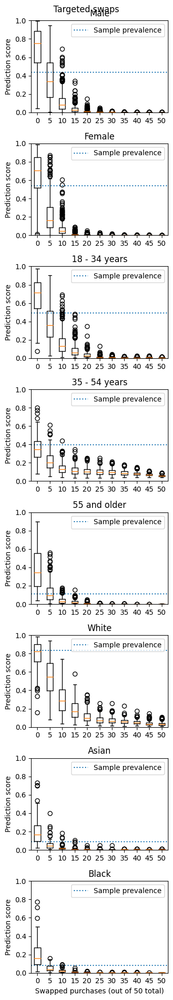

In [196]:
cols = 1#len(use_labels)
rows = len(use_labels)
fig, axes = plt.subplots(rows,cols,figsize=(3.5*cols,rows*2.5))
fig.suptitle('Targeted swaps')

for i, l in enumerate(use_labels):
    ax = axes[i]
    swap_results_df = swaps_results[l]['targeted_swap_results_df']
    prevalence = swaps_results[l]['prevalence']
    print('%s: prevalence = %0.3f' % (l, prevalence))
    display(swap_results_df)
    ax = plot_user_prob_boxplots(swap_results_df, prevalence, l, ax=ax, xlabel=(i==rows-1))
plt.tight_layout()

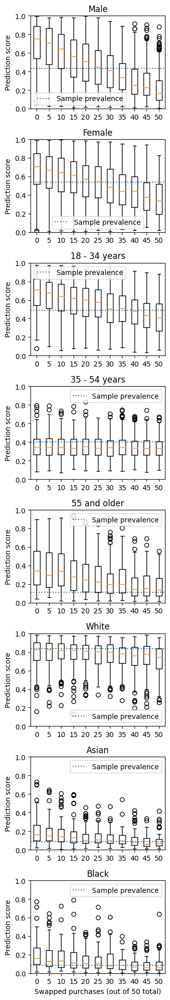

In [197]:
cols = 1#len(use_labels)
rows = len(use_labels)
fig, axes = plt.subplots(rows,cols,figsize=(3.5*cols,rows*2.5))

for i, l in enumerate(use_labels):
    ax = axes[i]
    swap_results_df = swaps_results[l]['random_swap_results_df']
    prevalence = swaps_results[l]['prevalence']
    ax = plot_user_prob_boxplots(swap_results_df, prevalence, l, ax=ax, xlabel=(i==rows-1))
plt.tight_layout()

In [198]:
def plot_recall(swap_results_df, label, prevalence=None, x_max=50, ax=None, xlabel=True):
    if ax is None:
        fig, ax = plt.subplots(1,1,figsize=(3.3,1.5))
    ax.plot(swap_results_df.loc[:x_max]['Recall'])
    ax.set_title(label)
    if prevalence: ax.axhline(prevalence, label='Sample prevalence', linestyle=':')
    ax.legend()
    ax.set_xlim(0, x_max)
    ax.set_ylim(0,1)
    #ax.set_ylim(max(0, swap_results_df['Recall'].min()-0.1), swap_results_df['Recall'].max() + 0.1)
    ax.set_ylabel('Recall')
    if xlabel: ax.set_xlabel('Swapped purchases (of 50 total)')
    return ax

In [199]:
# plot recall for random and targeted swaps together
l = 'Male'
x_max=50

def plot_recall2(swap_results_data, label, x_max=50, ax=None, xlabel=True, legend=True):
    random_swap_results_df = swap_results_data['random_swap_results_df']
    targeted_swap_results_df = swap_results_data['targeted_swap_results_df']
    prevalence = swap_results_data['prevalence']
    if ax is None:
        fig, ax = plt.subplots(1,1,figsize=(3.3,2))
    ax.set_title(label)
    ax.plot(random_swap_results_df.loc[:x_max]['Recall'], label='Random swaps')
    ax.plot(targeted_swap_results_df.loc[:x_max]['Recall'], label='Optimized swaps')
    ax.axhline(prevalence, label='Sample prevalence', linestyle=':', color='black')
    if legend: ax.legend()
    ax.set_xlim(0, x_max)
    ax.set_ylim(0,1)
    ax.set_ylabel('Recall')
    ax.set_xlabel('Swapped purchases (of 50 total)')
    return ax

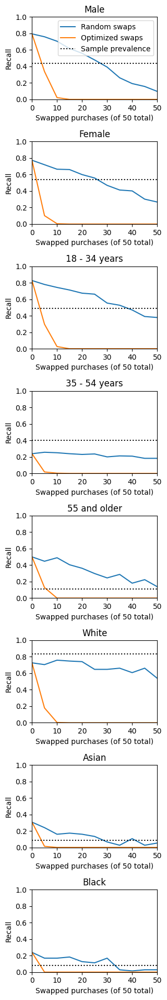

In [200]:
cols = 1#len(use_labels)
rows = len(use_labels)
fig, axes = plt.subplots(rows,cols,figsize=(3.3*cols,rows*2.4), sharey=True, dpi=100)
for i, l in enumerate(use_labels):
    ax = axes[i]
    swap_results_data = swaps_results[l]
    ax = plot_recall2(swap_results_data, l, ax=ax, xlabel=(i==rows-1), legend=(i==0))
plt.tight_layout()

Targeted swap results


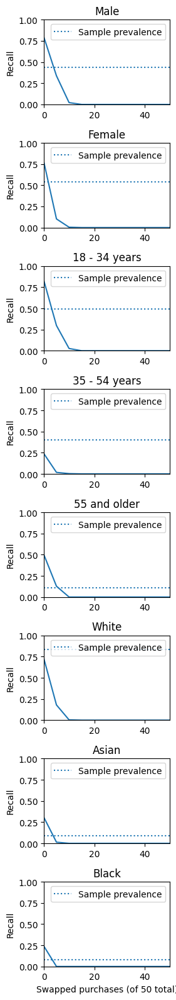

In [201]:
cols = 1#len(use_labels)
rows = len(use_labels)
fig, axes = plt.subplots(rows,cols,figsize=(3*cols,rows*2), sharey=True)
print('Targeted swap results')
for i, l in enumerate(use_labels):
    ax = axes[i]
    swap_results_df = swaps_results[l]['targeted_swap_results_df']
    prevalence = swaps_results[l]['prevalence']
#     ax = plot_recall(swap_results_df, l, ax=ax, xlabel=(i==rows-1))
    ax = plot_recall(swap_results_df, l, prevalence, ax=ax, xlabel=(i==rows-1))
plt.tight_layout()

## New child experiments

Our survey asked about life changes in household in 2021, which included:
- Had a child (159; 3.2%)
- Became pregnant (145; 2.9%)



In [202]:
# TODO: move to a better place
survey_df['Had a child'] = survey_df['Q-life-changes'].apply(lambda r: 'Had a child' in str(r))
survey_df['Became pregnant'] = survey_df['Q-life-changes'].apply(lambda r: 'Became pregnant' in str(r))

print('Of the total (unrestricted) survey participants:')
print('%s Became pregnant in 2021' % survey_df['Became pregnant'].sum())
print('%s Had a child in 2021' % survey_df['Had a child'].sum())

# was there anyone who said they had a child but not that they became pregnant?
# or the other way around?
print('%s had a child but did not become pregnant in 2021' %
    len(survey_df[(survey_df['Had a child']==True) & (survey_df['Became pregnant']==False)]))

print('%s became pregnant but did not have a child in 2021' %
    len(survey_df[(survey_df['Had a child']==False) & (survey_df['Became pregnant']==True)]))
survey_df.head(3)

Of the total (unrestricted) survey participants:
145 Became pregnant in 2021
159 Had a child in 2021
99 had a child but did not become pregnant in 2021
85 became pregnant but did not have a child in 2021


,Q-demos-age,Q-demos-hispanic,Q-demos-race,Q-demos-education,Q-demos-income,Q-demos-gender,Q-sexual-orientation,Q-demos-state,Q-amazon-use-howmany,Q-amazon-use-hh-size,...,Q-substance-use-cigarettes,Q-substance-use-marijuana,Q-substance-use-alcohol,Q-personal-diabetes,Q-personal-wheelchair,Q-life-changes,age-collapsed,income-collapsed,Had a child,Became pregnant
Survey ResponseID,,,,,,,,,,,,,,,,,,,,,
R_1ou69fj4DQGsVcp,35 - 44 years,No,Black or African American,High school diploma or GED,"$25,000 - $49,999",Female,heterosexual (straight),Iowa,2,2,...,Yes,No,Yes,No,No,Lost a job,35 - 54 years,"Less than $50,000",False,False
R_2UbJL30HRjK1sdD,45 - 54 years,No,White or Caucasian,High school diploma or GED,"$100,000 - $149,999",Male,heterosexual (straight),Ohio,2,4+,...,No,No,No,No,No,NaN,35 - 54 years,"$100,000 or more",False,False
R_UPXamGKtmf4RVIZ,25 - 34 years,No,White or Caucasian,High school diploma or GED,"$25,000 - $49,999",Male,heterosexual (straight),Arkansas,1 (just me!),2,...,No,No,No,Yes,No,NaN,18 - 34 years,"Less than $50,000",False,False


In [203]:
# Add additional 'label' of 'New child' to mean became pregnant OR 'Had a child'
survey_df['New child'] = ((survey_df['Had a child']) | (survey_df['Became pregnant']))
print('n=%s for New child' % survey_df['New child'].sum())

n=244 for New child


In [204]:
# set up the labels
new_child_labels = ['Became pregnant', 'Had a child', 'New child']
for l in new_child_labels:
    labeled_y[l] = survey_df[l].astype(int).rename(l)

In [205]:
print('For the participants restricted to at least 50 unique products purchased:')
for l in new_child_labels:
    print('%s: n=%s' % (l, labeled_y[l].loc[p50_users].sum()))

For the participants restricted to at least 50 unique products purchased:
Became pregnant: n=135
Had a child: n=144
New child: n=223


In [206]:
# Add train/test data for each of these labels
for label in new_child_labels:
    ys = labeled_y[label]
    Xl = X
    y = ys.loc[Xl.index] # use consistent order for ResponseIds
    X_y_data[label] = {
        'y': y,
        'train_test_split': train_test_split(Xl, y, test_size=0.2, stratify=y, random_state=RANDOM),
    }


SVM for Became pregnant
Mean accuracy: 0.9659
ROC AUC=0.839

SVM for Had a child
Mean accuracy: 0.9647
ROC AUC=0.840

SVM for New child
Mean accuracy: 0.9506
ROC AUC=0.853


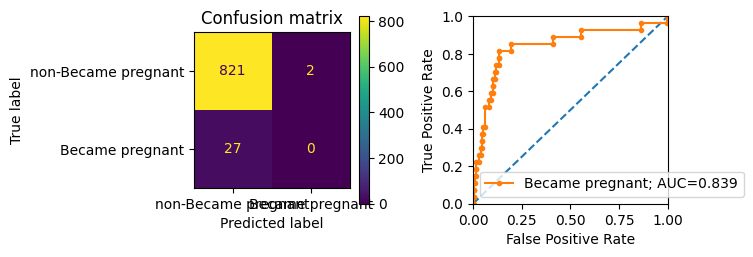

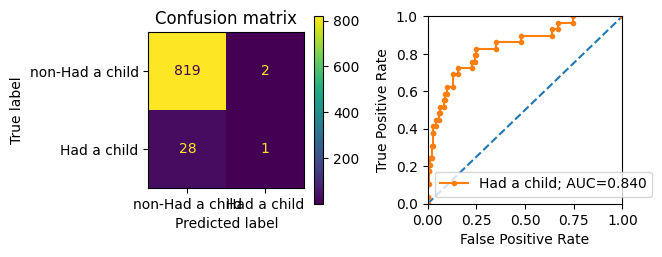

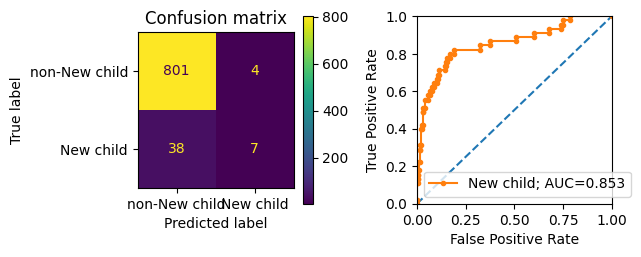

In [207]:
use_labels = new_child_labels
for i, label in enumerate(use_labels):
    print('\nSVM for %s' % (label))
    X_train, X_test, y_train, y_test = X_y_data[label]['train_test_split']
    clf = svm.SVC(probability=True, class_weight='balanced', random_state=RANDOM)
    clf.fit(X_train, y_train)
    onehot_svm_models[label] = clf
    auc = get_auc_and_plot(clf, X_test, y_test)

In [208]:
def get_OR_col(label=None):
    return '%s: OR' % label if label else 'OR'

def get_cat_col(label=None):
    return '%s: Categories' % label if label else 'Categories'

def get_category_features_OR(clf, label=None):
    return pd.DataFrame({
        get_cat_col(label): clf.feature_names_in_, 
        #'Log Odds': clf.coef_[0],
        get_OR_col(label): np.exp(clf.coef_[0]).round(3)
    })

def get_important_category_features(clf, label=None, pos_num=10, neg_num=10):
    """
    Returns table with pos_num top positive Categories and neg_num top negative Categories.
    """
    df = get_category_features_OR(clf, label)
    return pd.concat([
        df.sort_values(get_OR_col(label), ascending=False).head(pos_num)[[get_cat_col(label), get_OR_col(label)]],
        df.sort_values(get_OR_col(label), ascending=True).head(neg_num)[[get_cat_col(label), get_OR_col(label)]].sort_values(get_OR_col(label),ascending=False),
    ]).reset_index().drop('index', axis=1)

In [209]:
label = 'New child'
print(label)

y_l = labeled_y[label].loc[X.index]
print('%s: %s positive samples' % (label, y_l.sum()))
clf = LogisticRegression(class_weight='balanced').fit(X, y_l)

df = get_important_category_features(clf, label=label)#, pos_num=20, neg_num=20)
df.rename({get_cat_col(): get_cat_col(label), get_OR_col():get_OR_col(label)}, axis=1)

New child
New child: 223 positive samples


,New child: Categories,New child: OR
0,BABY_PRODUCT,8.939
1,BREAST_PUMP,5.449
2,WOMEN:BODY_POSITIONER,4.732
3,BABY_BOTTLE,4.134
4,LEOTARD,3.564
5,ARTIFICIAL_PLANT,3.548
6,SKIN_PROTECTANT,3.435
7,BOTTLE_NIPPLE,3.385
8,BICYCLE_CARGO_RACK,3.350
9,ELECTRONIC_SENSOR,3.016


If we took 'Baby' from title and prefixed the category...

Reason to do this: Some categories with baby products in them are too broad. e.g.
- LEOTARD
- GROCERY

Might need to watch out for things like (VEGETABLE) Baby carrots. But the model should learn that BABY VEGETABLE is not about having a baby.


Plan:
- get products with 'baby' in title
- change their categories: prefix with 'BABY:'
- test the models again

for chaging the category names:
- add 'Baby Category' column to products_table
    - = 'BABY:Category' if baby, else 'Category'
    - use this to get a mapping of product Code to 'Baby Category'
- make p50_amzn_data_baby df: transform Categories to Baby Category
- make cats_u50_baby
    - compute cats_users_baby
    - cats_u50_baby = cats_users_baby[cats_users_baby>= 50].index.tolist()


Consider backing up and inserting baby prefix before pulling the p50u cats and always using this....

Reminder: p50_users and p50u_amzn_data logic doesn't need to change because this was determined only by distinct products per user

In [1338]:
BABY_KWS = [
    'baby', 'babies', 'infant',
    'breastfeed', 'breast_pump', 'breast pump',
    'diaper',
    'prenatal',
    'pregnancy','maternity',
    'stroller',
    'pacifier',
]

BABY_CATEGORY = 'Baby Category'

def get_baby_cat(row):
    """
    Prefixes the category with 'BABY' if no keywords are in the category
    And a keyword is in the title.
    Checks category because we don't want to end up with BABY:BREAST_PUMP and BREAST_PUMP, etc
    We want this to be a merged category. Otherwise, we will drop information (where not enough purchases/products)
    """
    cat_lower = str(row[CATEGORY]).lower()
    if any([kw in cat_lower for kw in BABY_KWS]):
        return row[CATEGORY]
    title = str(row[TITLE]).lower()
    if any([kw in title for kw in BABY_KWS]):
        return 'BABY:%s'%row[CATEGORY]
    return row[CATEGORY]

products_table[BABY_CATEGORY] = products_table.apply(get_baby_cat, axis=1)

In [1339]:
products_table.head()

,purchasers,Category,Title,MEN,WOMEN,GENDERED CATEGORY,Baby Category
ASIN/ISBN (Product Code),,,,,,,
B00IX1I3G6,1157,GIFT_CARD,Amazon.com Gift Card Balance Reload,False,False,GIFT_CARD,GIFT_CARD
B086KKT3RX,875,ABIS_GIFT_CARD,Amazon Reload,False,False,ABIS_GIFT_CARD,ABIS_GIFT_CARD
B07PCMWTSG,543,GIFT_CARD,Amazon.com eGift Card,False,False,GIFT_CARD,GIFT_CARD
B004LLIKVU,467,GIFT_CARD,Amazon.com eGift Card,False,False,GIFT_CARD,GIFT_CARD
B07FZ8S74R,377,DIGITAL_DEVICE_3,"Echo Dot (3rd Gen, 2018 release) - Smart speaker with Alexa - Charcoal",False,False,DIGITAL_DEVICE_3,DIGITAL_DEVICE_3


### Code the baby registry welcome box

There is a special product for owners of a baby registry: 'Baby Registry Welcome Box'

https://www.amazon.com/gp/help/customer/display.html?nodeId=GBLXVKVYG5SBG8HF
> The Welcome Box is available to customers with active Amazon Prime accounts, who create a Baby Registry, add 10 unique items from their Baby Registry Checklist and have over $10 of purchases from their registry (by themselves or others).

We code it with a special category 'BABY_REGISTRY_BOX'

In [1340]:
products_table.at['B00N1NBOV2', BABY_CATEGORY] = 'BABY_REGISTRY_BOX'

In [1341]:
products_table.loc['B00N1NBOV2']

purchasers                                 198
Category                               GROCERY
Title                Baby Registry Welcome Box
MEN                                      False
WOMEN                                    False
GENDERED CATEGORY                      GROCERY
Baby Category                BABY_REGISTRY_BOX
Name: B00N1NBOV2, dtype: object

In [1342]:
sorted(products_table[BABY_CATEGORY].unique())

['3D_GLASSES',
 '3D_PRINTER',
 '3D_PRINTING_PEN',
 'ABDOMINAL_EXERCISER',
 'ABIS_APPAREL',
 'ABIS_BABY_PRODUCT',
 'ABIS_BEAUTY',
 'ABIS_BOOK',
 'ABIS_DOWNLOADABLE_SOFTWARE',
 'ABIS_DRUGSTORE',
 'ABIS_DVD',
 'ABIS_EBOOKS',
 'ABIS_ELECTRONICS',
 'ABIS_GIFT_CARD',
 'ABIS_HOME',
 'ABIS_HOME_IMPROVEMENT',
 'ABIS_KITCHEN',
 'ABIS_LAWN_AND_GARDEN',
 'ABIS_MUSIC',
 'ABIS_OFFICE_PRODUCT',
 'ABIS_PC',
 'ABIS_PET_PRODUCTS',
 'ABIS_SPORTS',
 'ABIS_TOY',
 'ABIS_VIDEO',
 'ABIS_VIDEO_GAMES',
 'ABIS_WIRELESS',
 'ABRASIVES',
 'ABRASIVE_BRUSH',
 'ABRASIVE_DISCS',
 'ABRASIVE_SHEETS',
 'ABRASIVE_WHEELS',
 'ACCELERATION_SENSOR',
 'ACCESSORY',
 'ACCESSORY_OR_PART_OR_SUPPLY',
 'ADHESIVES_AND_SEALANTS',
 'ADHESIVE_TAPES',
 'ADULT_COSTUME',
 'ADVENT_CALENDAR',
 'AGILITY_LADDER',
 'AGRICULTURAL_SUPPLIES',
 'AIMING_SCOPE_SIGHT',
 'AIR_COMPRESSOR',
 'AIR_CONDITIONER',
 'AIR_COOLER',
 'AIR_FRYER',
 'AIR_GUN',
 'AIR_GUN_PROJECTILE',
 'AIR_MATTRESS',
 'AIR_PUMP',
 'AIR_PURIFIER',
 'ALARM',
 'ALCOHOLIC_BEVERAGE',
 'A

In [1343]:
p50u_amzn_data_baby = p50u_amzn_data.copy()
p50u_amzn_data_baby[CATEGORY] = p50u_amzn_data_baby[PRODUCT_CODE].map(products_table[BABY_CATEGORY])

### Better when:

Cut data to 2021+2022 purchases only

Cut data to users with > 50 products purchased

In [1344]:
years = [2021, 2022]#, 2023]
amzn_data_baby2021 = p50u_amzn_data_baby[p50u_amzn_data_baby[YEAR].isin(years)]
print('When restricting Amazon purchases data to year(s) %s:' % years)
print_amazon_data_metrics(amzn_data_baby2021)
# amzn_data2021.head(3)

When restricting Amazon purchases data to year(s) [2021, 2022]:
898377 purchases
4239 response Ids


In [1345]:
products_per_user_baby2021 = amzn_data_baby2021.groupby([RESPONSE_ID])[PRODUCT_CODE].nunique()
products_per_user_baby2021.describe()

count    4239.000000
mean      179.432177
std       181.619873
min         1.000000
25%        63.000000
50%       125.000000
75%       231.000000
max      2688.000000
Name: ASIN/ISBN (Product Code), dtype: float64

In [1346]:
p50_users_baby2021 = products_per_user_baby2021[products_per_user_baby2021 >= 50].index.tolist()
print('N=%s : restricting data to users who purchased 50 distinct products in %s' % (len(p50_users_baby2021), years))

N=3497 : restricting data to users who purchased 50 distinct products in [2021, 2022]


In [1347]:
p50u_amzn_data_baby2021 = amzn_data_baby2021[amzn_data_baby2021[RESPONSE_ID].isin(p50_users_baby2021)]

In [1348]:
cats_users_baby2021 = p50u_amzn_data_baby2021.groupby(CATEGORY)[RESPONSE_ID].nunique().sort_values(ascending=False)
# display(cats_users_baby2021.head(20))
display(cats_users_baby2021.describe())

count    2377.000000
mean      163.466975
std       289.462332
min         1.000000
25%         8.000000
50%        56.000000
75%       179.000000
max      3244.000000
Name: Survey ResponseID, dtype: float64

In [1349]:
# use categories that have been purchased by at least 50 users in dataset
cats_u50_baby2021 = cats_users_baby2021[cats_users_baby2021 >= 50].index.tolist()
print('%s categories purchased by at least 50 users' % len(cats_u50_baby2021))

1243 categories purchased by at least 50 users


In [1350]:
print('For the participants restricted to at least 50 unique products purchased:')
for l in new_child_labels:
    print('%s: n=%s' % (l, labeled_y[l].loc[p50_users_baby2021].sum()))

For the participants restricted to at least 50 unique products purchased:
Became pregnant: n=116
Had a child: n=124
New child: n=194


In [1351]:
print(datetime.datetime.now())
X_baby2021 = get_X_one_hot_encoding_for_categories(
    p50u_amzn_data_baby2021, cats_u50_baby2021)
print(datetime.datetime.now())

2024-06-13 16:43:28.462294
2024-06-13 16:43:56.290399


In [1352]:
for label in new_child_labels:
    ys = labeled_y[label]
    Xl = X_baby2021
    y = ys.loc[Xl.index] # use consistent order for ResponseIds
    X_y_data[label] = {
        'y': y,
        'train_test_split': train_test_split(Xl, y, test_size=0.2, stratify=y, random_state=RANDOM),
    }


SVM for Became pregnant
Mean accuracy: 0.9657
ROC AUC=0.937

SVM for Had a child
Mean accuracy: 0.9671
ROC AUC=0.952

SVM for New child
Mean accuracy: 0.9529
ROC AUC=0.929


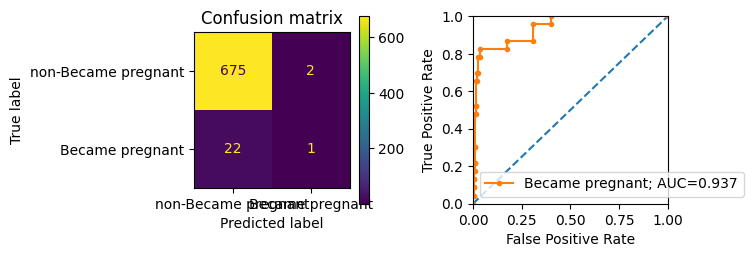

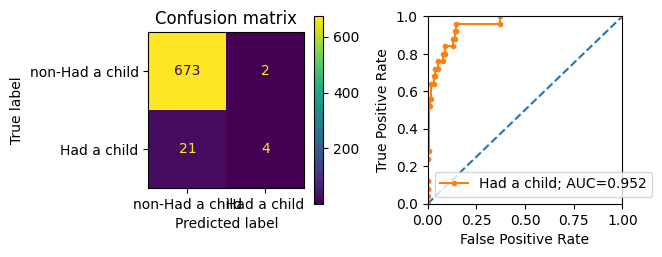

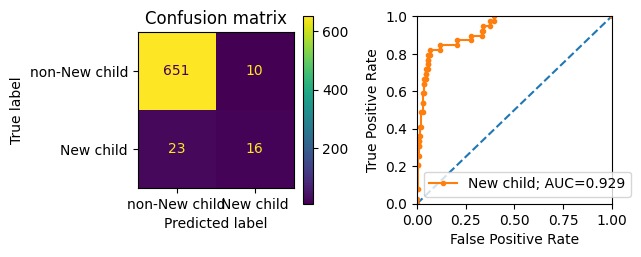

In [1353]:
use_labels = new_child_labels
for i, label in enumerate(use_labels):
    print('\nSVM for %s' % (label))
    X_train, X_test, y_train, y_test = X_y_data[label]['train_test_split']
    clf = svm.SVC(probability=True, class_weight='balanced', random_state=RANDOM)
    clf.fit(X_train, y_train)
    onehot_svm_models[label] = clf
    auc = get_auc_and_plot(clf, X_test, y_test)

In [1354]:
print('When restricting to categories purchased by at least 20 users')

When restricting to categories purchased by at least 20 users


In [1355]:
# use categories that have been purchased by at least 20 users in dataset
cats_u20_baby2021 = cats_users_baby2021[cats_users_baby2021 >= 20].index.tolist()
print('%s categories purchased by at least 20 users' % len(cats_u20_baby2021))

1566 categories purchased by at least 20 users


In [1356]:
print(datetime.datetime.now())
X_baby2021_catsu20 = get_X_one_hot_encoding_for_categories(
    p50u_amzn_data_baby2021, cats_u20_baby2021)
print(datetime.datetime.now())

2024-06-13 16:44:46.993379
2024-06-13 16:45:21.528574


In [1357]:
for label in new_child_labels:
    ys = labeled_y[label]
    Xl = X_baby2021_catsu20
    y = ys.loc[Xl.index] # use consistent order for ResponseIds
    X_y_data[label] = {
        'y': y,
        'train_test_split': train_test_split(Xl, y, test_size=0.2, stratify=y, random_state=RANDOM),
    }


SVM for Became pregnant
Mean accuracy: 0.9671
ROC AUC=0.938

SVM for Had a child
Mean accuracy: 0.9671
ROC AUC=0.954

SVM for New child
Mean accuracy: 0.9543
ROC AUC=0.933


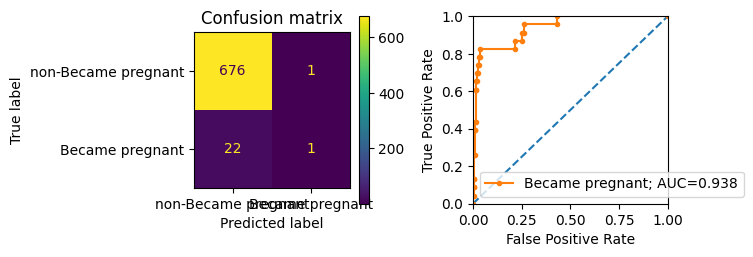

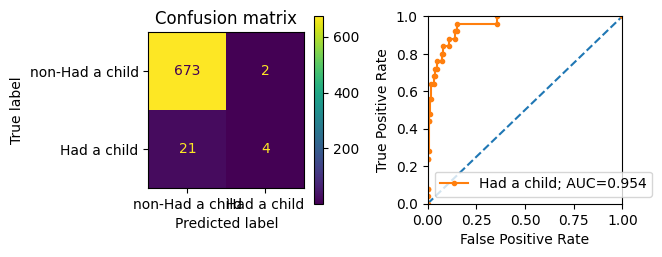

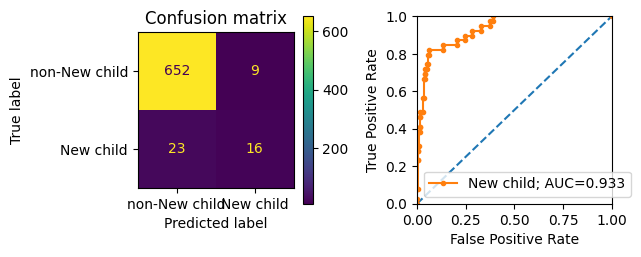

In [1358]:
use_labels = new_child_labels
for i, label in enumerate(use_labels):
    print('\nSVM for %s' % (label))
    X_train, X_test, y_train, y_test = X_y_data[label]['train_test_split']
    clf = svm.SVC(probability=True, class_weight='balanced', random_state=RANDOM)
    clf.fit(X_train, y_train)
    onehot_svm_models[label] = clf
    auc = get_auc_and_plot(clf, X_test, y_test)

### What if we excluded people who might have had a baby in a recent earlier year? i.e. Exclude any households of 4+

Answer: not helpful

In [538]:
hh_lt4_rids = survey_df[survey_df['Q-amazon-use-hh-size']!='4+'].index.tolist()
print('%s participants with household sizes less than 4' % len(hh_lt4_rids))

3772 participants with household sizes less than 4


In [539]:
years = [2021, 2022]#, 2023]
p50_users_baby2021 = products_per_user_baby2021[products_per_user_baby2021 >= 50].index.tolist()
p50_users_baby2021_hh_lt4 = list(set(p50_users_baby2021).intersection(set(hh_lt4_rids)))
print('N=%s : restricting data to users with household sizes < 4 and who purchased 50 distinct products in %s' % (
    len(p50_users_baby2021_hh_lt4), years))

N=2595 : restricting data to users with household sizes < 4 and who purchased 50 distinct products in [2021, 2022]


In [542]:
print('For the participants restricted to at least 50 unique products purchased:')
for l in new_child_labels:
    print('%s: n=%s' % (l, labeled_y[l].loc[p50_users_baby2021_hh_lt4].sum()))

For the participants restricted to at least 50 unique products purchased:
Became pregnant: n=68
Had a child: n=61
New child: n=101


In [540]:
p50ult4_amzn_data_baby2021 = amzn_data_baby2021[amzn_data_baby2021[RESPONSE_ID].isin(p50_users_baby2021_hh_lt4)]

In [541]:
cats_users_baby2021 = p50ult4_amzn_data_baby2021.groupby(CATEGORY)[RESPONSE_ID].nunique().sort_values(ascending=False)
# display(cats_users_baby2021.head(20))
display(cats_users_baby2021.describe())

count    2298.000000
mean      119.776762
std       211.205624
min         1.000000
25%         7.000000
50%        40.000000
75%       133.000000
max      2400.000000
Name: Survey ResponseID, dtype: float64

In [543]:
# use categories that have been purchased by at least 20 users in dataset
cats_u20_baby2021 = cats_users_baby2021[cats_users_baby2021 >= 20].index.tolist()
print('%s categories purchased by at least 20 users' % len(cats_u20_baby2021))

1439 categories purchased by at least 20 users


In [544]:
print(datetime.datetime.now())
X_baby2021 = get_X_one_hot_encoding_for_categories(
    p50ult4_amzn_data_baby2021, cats_u20_baby2021)
print(datetime.datetime.now())

2024-06-11 17:43:20.734949
2024-06-11 17:43:43.365254


In [545]:
for label in new_child_labels:
    ys = labeled_y[label]
    Xl = X_baby2021.loc[p50_users_baby2021_hh_lt4]
    y = ys.loc[Xl.index] # use consistent order for ResponseIds
    X_y_data[label] = {
        'y': y,
        'train_test_split': train_test_split(Xl, y, test_size=0.2, stratify=y, random_state=RANDOM),
    }


SVM for Became pregnant
Mean accuracy: 0.9730
ROC AUC=0.924

SVM for Had a child
Mean accuracy: 0.9788
ROC AUC=0.953

SVM for New child
Mean accuracy: 0.9615
ROC AUC=0.843


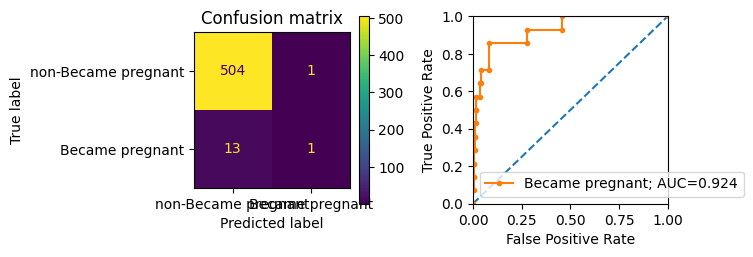

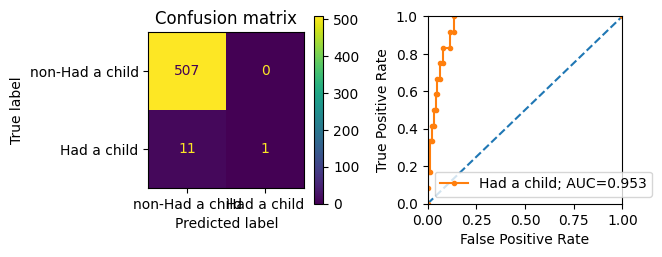

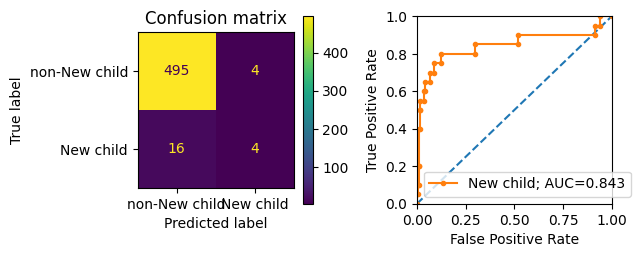

In [546]:
use_labels = new_child_labels
for i, label in enumerate(use_labels):
    print('\nSVM for %s' % (label))
    X_train, X_test, y_train, y_test = X_y_data[label]['train_test_split']
    clf = svm.SVC(probability=True, class_weight='balanced', random_state=RANDOM)
    clf.fit(X_train, y_train)
    onehot_svm_models[label] = clf
    auc = get_auc_and_plot(clf, X_test, y_test)

---

# Tests to get here

### Race and ethnicity set up

Add booleans indicating whether someone is Hispanic or a certain race.

Boolean added if they answered with the race at all -- not only.
i.e. someone is marked as "Black" even when they checked off "Black" and "Asian" and ...
There is no extra consideration of mixed race.

### Hispanic

In [12]:
# add boolean to make this data easier to work with
survey_df['Hispanic'] = survey_df['Q-demos-hispanic'].apply(lambda h: h=='Yes')
print('%0.3f = %s/%s respondents reported as Hispanic' % (
    survey_df['Hispanic'].sum()/len(survey_df),
    survey_df['Hispanic'].sum(), 
    len(survey_df)))

0.109 = 549/5027 respondents reported as Hispanic


### Race

In [13]:
# Add boolean indicating whether white is included in race answer
survey_df['White'] = survey_df['Q-demos-race'].apply(lambda race: 'White' in str(race))
# What fraction of the respondents are black?
print('%s White ResponseIds (dropped duplicates)' % survey_df['White'].sum())
print('%s = portion of White ResponseIds (dropped duplicates)'% (
    round(survey_df['White'].sum()/len(survey_df), 4)))

# Add boolean indicating whether black is included in race answer
survey_df['Black'] = survey_df['Q-demos-race'].apply(lambda race: 'Black' in str(race))
# What fraction of the respondents are black?
print('%s Black ResponseIds (dropped duplicates)' % survey_df['Black'].sum())
print('%s = portion of Black ResponseIds (dropped duplicates)'% (
    round(survey_df['Black'].sum()/len(survey_df), 4)))

# Add boolean indicating whether black is included in race answer
survey_df['Asian'] = survey_df['Q-demos-race'].apply(lambda race: 'Asian' in str(race))
# What fraction of the respondents are black?
print('%s Asian ResponseIds (dropped duplicates)' % survey_df['Asian'].sum())
print('%s = portion of Asian ResponseIds (dropped duplicates)'% (
    round(survey_df['Asian'].sum()/len(survey_df), 4)))


4133 White ResponseIds (dropped duplicates)
0.8222 = portion of White ResponseIds (dropped duplicates)
448 Black ResponseIds (dropped duplicates)
0.0891 = portion of Black ResponseIds (dropped duplicates)
483 Asian ResponseIds (dropped duplicates)
0.0961 = portion of Asian ResponseIds (dropped duplicates)


### Gender and Sexuality

Note - will handle models for these later after restricting dataset to single purchasers.

In [14]:
Q = 'Q-demos-gender'
display(survey_df[Q].value_counts())
survey_df['Female'] = survey_df[Q].apply(lambda g: g=='Female')
survey_df['Male'] = survey_df[Q].apply(lambda g: g=='Male')

Q-demos-gender
Female               2589
Male                 2311
Other                 116
Prefer not to say      11
Name: count, dtype: int64

In [15]:
Q = 'Q-sexual-orientation'
display(survey_df[Q].value_counts())
# Add boolean indicating whether LGBTQ+
survey_df['LGBTQ+'] = survey_df[Q].apply(lambda resp: 'LGBTQ+' in str(resp))
print('%s LGBTQ+ ResponseIds (dropped duplicates)' % survey_df['LGBTQ+'].sum())
print('%s = portion of LGBTQ+ ResponseIds (dropped duplicates)'% (
    round(survey_df['LGBTQ+'].sum()/len(survey_df), 4)))

Q-sexual-orientation
heterosexual (straight)    3858
LGBTQ+                     1111
prefer not to say            58
Name: count, dtype: int64

1111 LGBTQ+ ResponseIds (dropped duplicates)
0.221 = portion of LGBTQ+ ResponseIds (dropped duplicates)


### Personal 

In [16]:
Q = 'Q-personal-diabetes'
survey_df['Diabetes'] = survey_df[Q].apply(lambda resp: resp=='Yes')
print('%s diabetes ResponseIds' % survey_df['Diabetes'].sum())
print('%s = portion of Diabetes ResponseIds'% (
    round(survey_df['Diabetes'].sum()/len(survey_df), 4)))


617 diabetes ResponseIds
0.1227 = portion of Diabetes ResponseIds


## Models

### Race: Black

### Modeling with different types of feature vectors

#### a. one-hot-encode (categories)

In [157]:
print('X: One-hot-encoded; Y: Black')
X = get_X_one_hot_encoding_for_categories(pp50u_df, cats_u50)
y = get_y(survey_df, 'Black', X.index)
print(X.shape, y.shape)
display(X.head(3))
display(y.head(3))

X: One-hot-encoded; Y: Black
(4248, 1368) (4248,)


,NAN,ABIS_BOOK,ELECTRONIC_CABLE,CELLULAR_PHONE_CASE,SHIRT,HEALTH_PERSONAL_CARE,HEADPHONES,CHARGING_ADAPTER,NUTRITIONAL_SUPPLEMENT,PANTS,...,SNOW_GLOBE,ROLLER_CHAIN,MESS_KIT,DRIP_IRRIGATION_KIT,SHARPS_DISPOSAL_CONTAINER,BATHTUB,DISHWASHER,CIRCUIT_BREAKER,ROOM_DIVIDER,DIGITAL_DEVICE_12_ACCESSORY
Survey ResponseID,,,,,,,,,,,,,,,,,,,,,
R_zfqnsBzlOAKibzb,1,1,1,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
R_zfnsck2ZatnGtY5,1,1,1,1,1,1,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0
R_zdQYFhfeqyBd2dH,1,1,0,1,1,1,1,1,1,0,...,0,0,0,0,0,0,0,0,0,0


Survey ResponseID
R_zfqnsBzlOAKibzb    1
R_zfnsck2ZatnGtY5    0
R_zdQYFhfeqyBd2dH    0
Name: Black, dtype: int64

In [172]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=43)

print('data partitioned into  80-20 train-test split')
print('train size = %s; test size = %s' % (len(X_train), len(X_test)))
print('%s/%s Black in train data\n%s/%s Black in test data' % (y_train.sum(),len(y_train),y_test.sum(),len(y_test)))

data partitioned into  80-20 train-test split
train size = 3398; test size = 850
283/3398 Black in train data
71/850 Black in test data


Logistic regression
Mean accuracy: 0.8965
ROC AUC=0.824


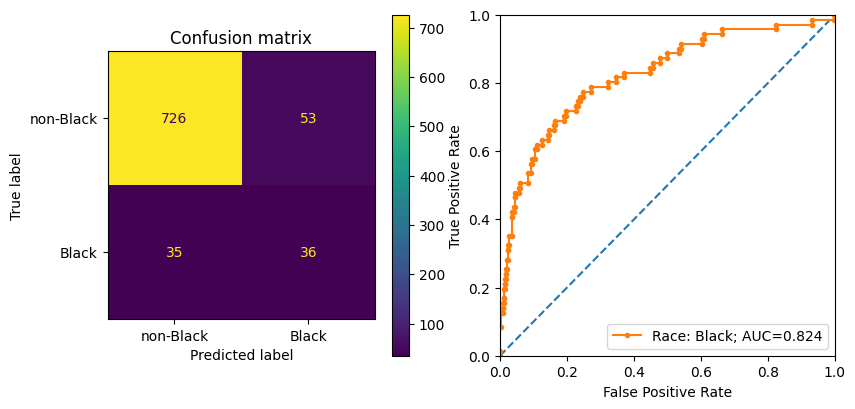

In [173]:
print('Logistic regression')
ycol = 'Black'
# train
clf = LogisticRegression(class_weight='balanced')
clf.fit(X_train, y_train)
# test
fig,(ax1, ax2) = plt.subplots(1,2,figsize=(8,4))
plt.tight_layout()
ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test, ax=ax1, display_labels=['non-%s'%ycol, ycol])
_ = ax1.set_title('Confusion matrix')
print('Mean accuracy: %0.4f' % clf.score(X_test, y_test))
auc = get_auc_plot_roc(clf, X_test, y_test.values, 'Race: Black', ax=ax2)

Show parameters

In [ ]:
log_clf_a

In [174]:
pd.DataFrame(
    zip(X_train.columns, np.transpose(log_clf_a.coef_[0])), 
    columns=['features', 'coef']
).sort_values('coef', ascending=False).head(10)


,features,coef
317,WIG,1.895624
1286,EXERCISE_STEP_PLATFORM,1.733730
712,HAIR_EXTENSION,1.674558
764,SHOWER_CAP,1.555808
86,HAIR_BRUSH,1.465139
915,SOFA,1.448156
474,SUGAR_SUBSTITUTE,1.340581
1169,ROASTING_PAN,1.329230
248,WRITING_BOARD,1.317988
1313,INSTALLATION_SERVICES,1.309363


In [163]:
import statsmodels.api as sm
logit_model=sm.Logit(y, X)
result=logit_model.fit()
print(result.summary())

/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/statsmodels/discrete/discrete_model.py:1819: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


         Current function value: inf
         Iterations: 35


/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/statsmodels/discrete/discrete_model.py:1872: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.log(self.cdf(q*np.dot(X,params))))


LinAlgError: Singular matrix

SVM
Mean accuracy: 0.9141
ROC AUC=0.843


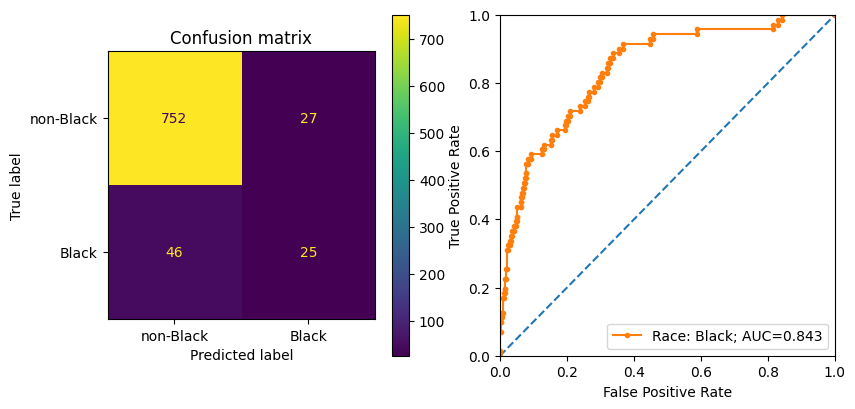

In [175]:
print('SVM')
ycol = 'Black'
clf = svm.SVC(probability=True, class_weight='balanced')
clf.fit(X_train, y_train)
# test
fig,(ax1, ax2) = plt.subplots(1,2,figsize=(8,4))
plt.tight_layout()
ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test, ax=ax1, display_labels=['non-Black','Black'])
_ = ax1.set_title('Confusion matrix')
print('Mean accuracy: %0.4f' % clf.score(X_test, y_test))
auc = get_auc_plot_roc(clf, X_test, y_test.values, 'Race: Black', ax=ax2)

MLP


/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Mean accuracy: 0.9224
ROC AUC=0.811


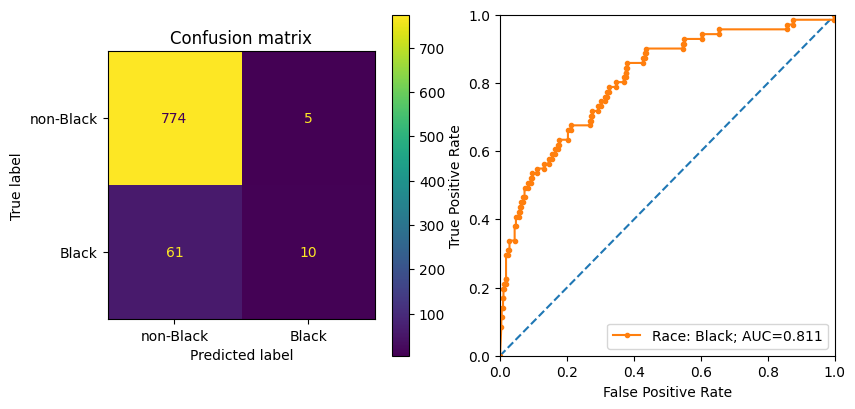

In [176]:
print('MLP')
clf = MLPClassifier(hidden_layer_sizes=(64, 8, 4), solver='sgd')
clf.fit(X_train, y_train)
fig,(ax1, ax2) = plt.subplots(1,2,figsize=(8,4))
plt.tight_layout()
ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test, ax=ax1, display_labels=['non-Black','Black'])
_ = ax1.set_title('Confusion matrix')
print('Mean accuracy: %0.4f' % clf.score(X_test, y_test))
auc = get_auc_plot_roc(clf, X_test, y_test.values, 'Race: Black', ax=ax2)

#### b1. Relative products by category


In [177]:
print('X: Relative products; Y: Black')
X = get_X_relative_products_for_categories(pp50u_df, cats_u50)
y = get_y(survey_df, 'Black', X.index)
print(X.shape, y.shape)
display(X.head(3))
display(y.head(3))

X: Relative products; Y: Black
(4248, 1368) (4248,)


,NAN,ABIS_BOOK,ELECTRONIC_CABLE,CELLULAR_PHONE_CASE,SHIRT,HEALTH_PERSONAL_CARE,HEADPHONES,CHARGING_ADAPTER,NUTRITIONAL_SUPPLEMENT,PANTS,...,SNOW_GLOBE,ROLLER_CHAIN,MESS_KIT,DRIP_IRRIGATION_KIT,SHARPS_DISPOSAL_CONTAINER,BATHTUB,DISHWASHER,CIRCUIT_BREAKER,ROOM_DIVIDER,DIGITAL_DEVICE_12_ACCESSORY
Survey ResponseID,,,,,,,,,,,,,,,,,,,,,
R_zfqnsBzlOAKibzb,0.048387,0.177419,0.064516,0.016129,0.016129,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
R_zfnsck2ZatnGtY5,0.053913,0.043478,0.006957,0.020870,0.033043,0.003478,0.001739,0.000000,0.001739,0.003478,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
R_zdQYFhfeqyBd2dH,0.034335,0.017167,0.000000,0.008584,0.012876,0.004292,0.008584,0.008584,0.004292,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Survey ResponseID
R_zfqnsBzlOAKibzb    1
R_zfnsck2ZatnGtY5    0
R_zdQYFhfeqyBd2dH    0
Name: Black, dtype: int64

In [178]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

print('data partitioned into  80-20 train-test split')
print('train size = %s; test size = %s' % (len(X_train), len(X_test)))

print('%s/%s Black in train data\n%s/%s Black in test data' % (y_train.sum(),len(y_train),y_test.sum(),len(y_test)))

data partitioned into  80-20 train-test split
train size = 3398; test size = 850
283/3398 Black in train data
71/850 Black in test data


Logistic regression
Mean accuracy: 0.6412
ROC AUC=0.656


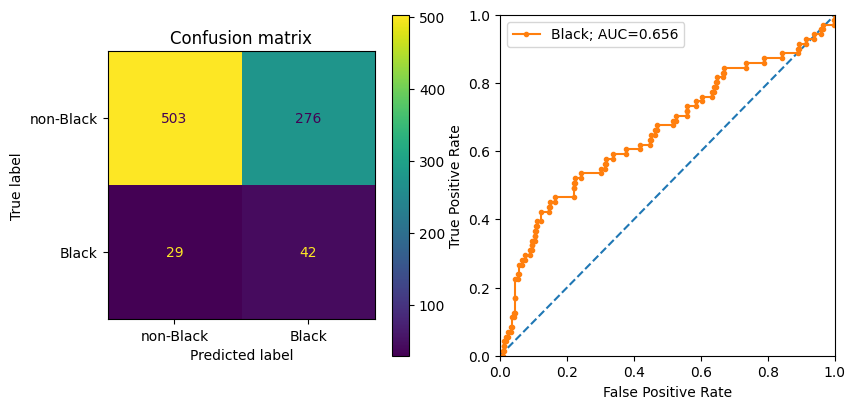

In [179]:
print('Logistic regression')
# train
clf = LogisticRegression(class_weight='balanced')
clf.fit(X_train, y_train)
# test
fig,(ax1, ax2) = plt.subplots(1,2,figsize=(8,4))
plt.tight_layout()
ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test, ax=ax1, display_labels=['non-Black','Black'])
_ = ax1.set_title('Confusion matrix')
print('Mean accuracy: %0.4f' % clf.score(X_test, y_test))
auc = get_auc_plot_roc(clf, X_test, y_test.values, 'Black', ax=ax2)

SVM
Mean accuracy: 0.8941
ROC AUC=0.793


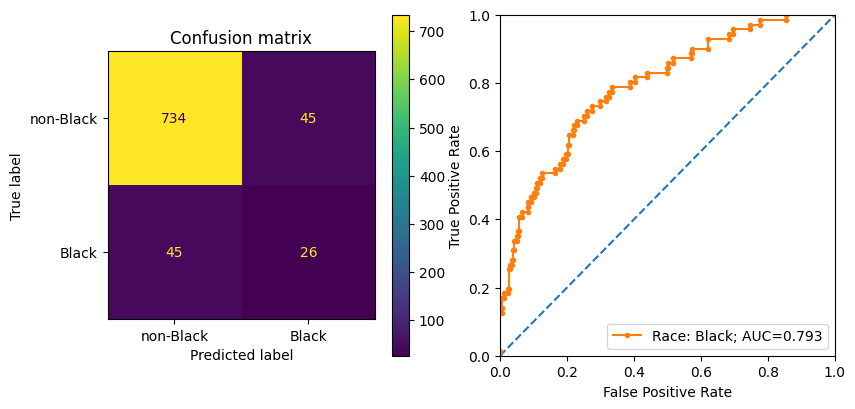

In [180]:
print('SVM')
Ycol = 'Black'
clf = svm.SVC(kernel='rbf', probability=True, class_weight='balanced') # using radial-like kernal
clf.fit(X_train, y_train)
# test
fig,(ax1, ax2) = plt.subplots(1,2,figsize=(8,4))
plt.tight_layout()
ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test, ax=ax1, display_labels=['non-%s'%Ycol, Ycol])
_ = ax1.set_title('Confusion matrix')
print('Mean accuracy: %0.4f' % clf.score(X_test, y_test))
auc = get_auc_plot_roc(clf, X_test, y_test.values, 'Race: Black', ax=ax2)

MLP
Mean accuracy: 0.9165
ROC AUC=0.532


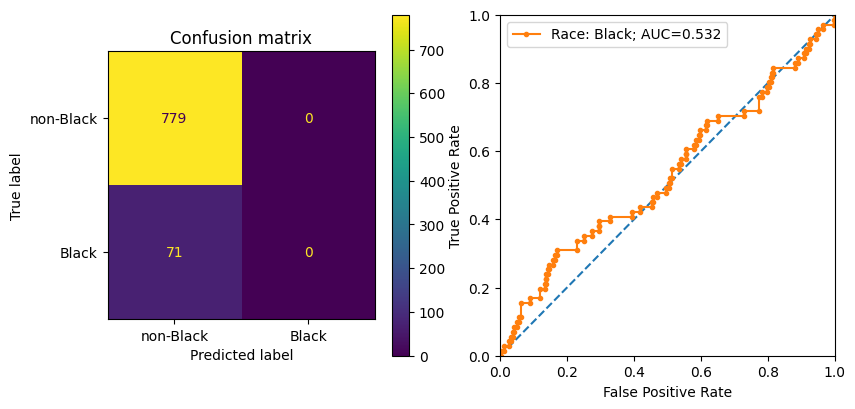

In [181]:
print('MLP')
clf = MLPClassifier(hidden_layer_sizes=(64, 8, 4), solver='sgd')
clf.fit(X_train, y_train)
fig,(ax1, ax2) = plt.subplots(1,2,figsize=(8,4))
plt.tight_layout()
ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test, ax=ax1, display_labels=['non-Black','Black'])
_ = ax1.set_title('Confusion matrix')
print('Mean accuracy: %0.4f' % clf.score(X_test, y_test))
auc = get_auc_plot_roc(clf, X_test, y_test.values, 'Race: Black', ax=ax2)

#### b2. Relative purchases by category

In [182]:
print('X: Relative purchases; Y: Black')
X = get_X_relative_purchases_for_categories(pp50u_df, cats_u50)
y = get_y(survey_df, 'Black', X.index)
print(X.shape, y.shape)
display(X.head(3))
display(y.head(3))

X: Relative purchases; Y: Black
(4248, 1368) (4248,)


,NAN,ABIS_BOOK,ELECTRONIC_CABLE,CELLULAR_PHONE_CASE,SHIRT,HEALTH_PERSONAL_CARE,HEADPHONES,CHARGING_ADAPTER,NUTRITIONAL_SUPPLEMENT,PANTS,...,SNOW_GLOBE,ROLLER_CHAIN,MESS_KIT,DRIP_IRRIGATION_KIT,SHARPS_DISPOSAL_CONTAINER,BATHTUB,DISHWASHER,CIRCUIT_BREAKER,ROOM_DIVIDER,DIGITAL_DEVICE_12_ACCESSORY
Survey ResponseID,,,,,,,,,,,,,,,,,,,,,
R_zfqnsBzlOAKibzb,0.057971,0.159420,0.057971,0.014493,0.014493,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
R_zfnsck2ZatnGtY5,0.051696,0.040388,0.006462,0.019386,0.030695,0.003231,0.001616,0.000000,0.003231,0.003231,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
R_zdQYFhfeqyBd2dH,0.031873,0.015936,0.000000,0.007968,0.011952,0.003984,0.007968,0.007968,0.003984,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Survey ResponseID
R_zfqnsBzlOAKibzb    1
R_zfnsck2ZatnGtY5    0
R_zdQYFhfeqyBd2dH    0
Name: Black, dtype: int64

In [183]:
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=43)

print('data partitioned into  80-20 train-test split')
print('train size = %s; test size = %s' % (len(X_train), len(X_test)))
print('%s/%s Black in train data\n%s/%s Black in test data' % (y_train.sum(),len(y_train),y_test.sum(),len(y_test)))

data partitioned into  80-20 train-test split
train size = 3398; test size = 850
283/3398 Black in train data
71/850 Black in test data


Logistic regression
Mean accuracy: 0.7259
ROC AUC=0.717


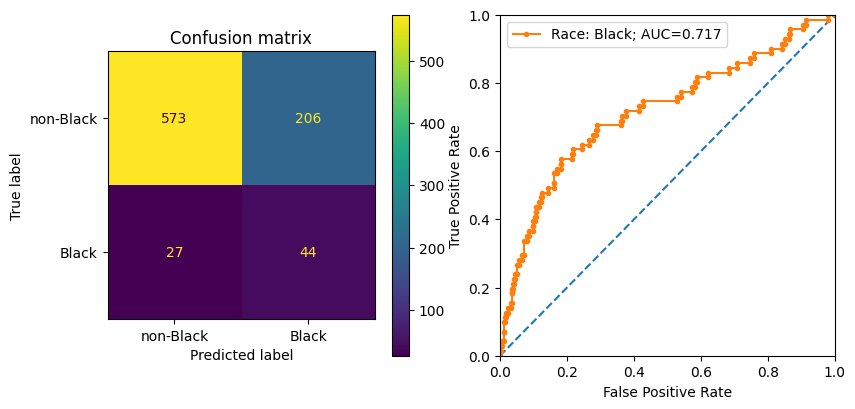

In [184]:
print('Logistic regression')
ycol = 'Black'
# train
clf = LogisticRegression(class_weight='balanced')
clf.fit(X_train, y_train)
# test
fig,(ax1, ax2) = plt.subplots(1,2,figsize=(8,4))
plt.tight_layout()
ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test, ax=ax1, display_labels=['non-%s'%ycol, ycol])
_ = ax1.set_title('Confusion matrix')
print('Mean accuracy: %0.4f' % clf.score(X_test, y_test))
auc = get_auc_plot_roc(clf, X_test, y_test.values, 'Race: Black', ax=ax2)

SVM
Mean accuracy: 0.9000
ROC AUC=0.787


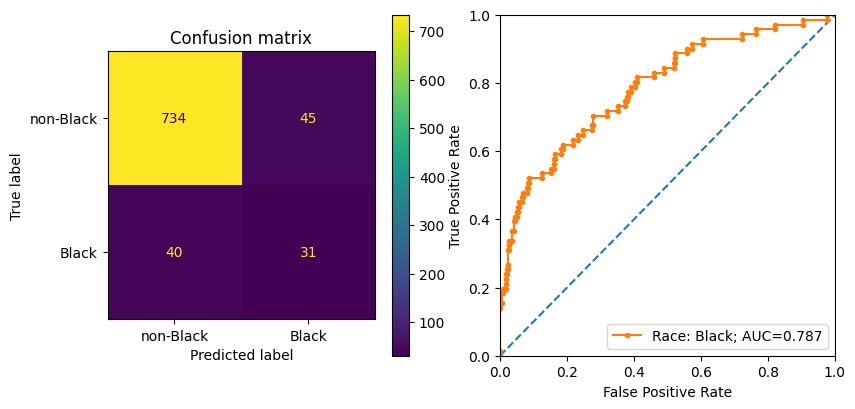

In [185]:
print('SVM')
ycol = 'Black'
clf = svm.SVC(probability=True, class_weight='balanced') # using radial-like kernal
# clf = svm.SVC(kernel='rbf',probability=True, class_weight='balanced') # using radial-like kernal
clf.fit(X_train, y_train)
# test
fig,(ax1, ax2) = plt.subplots(1,2,figsize=(8,4))
plt.tight_layout()
ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test, ax=ax1, display_labels=['non-%s'%ycol, ycol])
_ = ax1.set_title('Confusion matrix')
print('Mean accuracy: %0.4f' % clf.score(X_test, y_test))
auc = get_auc_plot_roc(clf, X_test, y_test.values, 'Race: Black', ax=ax2)

MLP
Mean accuracy: 0.9165
ROC AUC=0.500


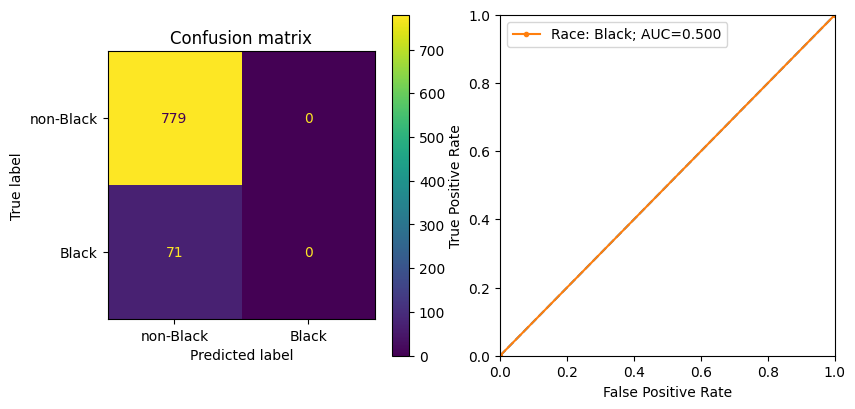

In [186]:
print('MLP')
clf = MLPClassifier(hidden_layer_sizes=(64, 8, 4), solver='sgd')
clf.fit(X_train, y_train)
fig,(ax1, ax2) = plt.subplots(1,2,figsize=(8,4))
plt.tight_layout()
ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test, ax=ax1, display_labels=['non-%s'%ycol, ycol])
_ = ax1.set_title('Confusion matrix')
print('Mean accuracy: %0.4f' % clf.score(X_test, y_test))
auc = get_auc_plot_roc(clf, X_test, y_test.values, 'Race: Black', ax=ax2)

### Repeat but where the threshold number of users purchasing categories is u=20

Limited to one-hot-encoding

In [282]:
u = 20
cats_u20 = cats_users[cats_users >= u].index.tolist()
print('%s categories purchased by at least %s users' % (len(cats_u20), u))

1534 categories purchased by at least 20 users


In [283]:
X = get_X_one_hot_encoding_for_categories(pp50u_df, cats_u20)
y = get_y(survey_df, 'Black', X.index)
print(X.shape, y.shape)
display(X.head(3))
display(y.head(3))

(4248, 1534) (4248,)


,NAN,ABIS_BOOK,ELECTRONIC_CABLE,CELLULAR_PHONE_CASE,SHIRT,HEALTH_PERSONAL_CARE,HEADPHONES,CHARGING_ADAPTER,NUTRITIONAL_SUPPLEMENT,PANTS,...,NON_DAIRY_CHEESE,TOPICALS,FASHIONEARRING,HOOKAH,GUN_GRIP,MOTORCYCLE_ACCESSORY,PLASTIC_TUBING,RECEIVER_OR_AMPLIFIER,FINENECKLACEBRACELETANKLET,COOKING_OVEN
Survey ResponseID,,,,,,,,,,,,,,,,,,,,,
R_zfqnsBzlOAKibzb,1,1,1,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
R_zfnsck2ZatnGtY5,1,1,1,1,1,1,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0
R_zdQYFhfeqyBd2dH,1,1,0,1,1,1,1,1,1,0,...,0,0,0,0,0,0,0,0,0,0


Survey ResponseID
R_zfqnsBzlOAKibzb    1
R_zfnsck2ZatnGtY5    0
R_zdQYFhfeqyBd2dH    0
Name: Black, dtype: int64

In [284]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=43)

print('data partitioned into  80-20 train-test split')
print('train size = %s; test size = %s' % (len(X_train), len(X_test)))
print('%s/%s Black in train data\n%s/%s Black in test data' % (y_train.sum(),len(y_train),y_test.sum(),len(y_test)))

data partitioned into  80-20 train-test split
train size = 3398; test size = 850
283/3398 Black in train data
71/850 Black in test data


Logistic regression
Mean accuracy: 0.8988
ROC AUC=0.821


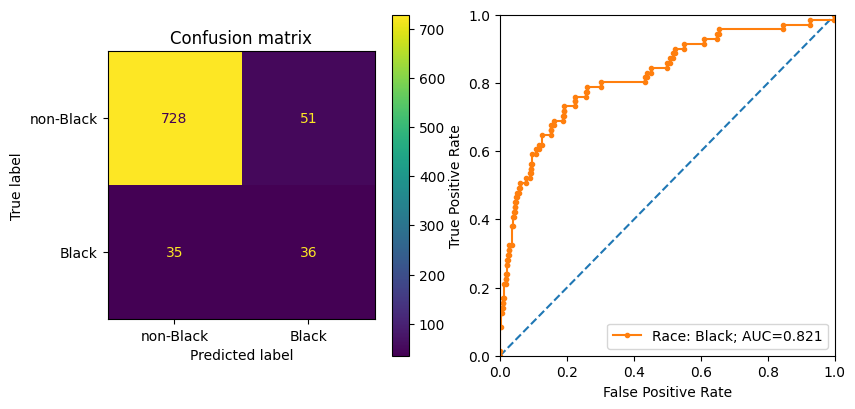

In [285]:
print('Logistic regression')
ycol = 'Black'
# train
clf = LogisticRegression(class_weight='balanced')
clf.fit(X_train, y_train)
# test
fig,(ax1, ax2) = plt.subplots(1,2,figsize=(8,4))
plt.tight_layout()
ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test, ax=ax1, display_labels=['non-%s'%ycol, ycol])
_ = ax1.set_title('Confusion matrix')
print('Mean accuracy: %0.4f' % clf.score(X_test, y_test))
auc = get_auc_plot_roc(clf, X_test, y_test.values, 'Race: Black', ax=ax2)

SVM
Mean accuracy: 0.9141
ROC AUC=0.843


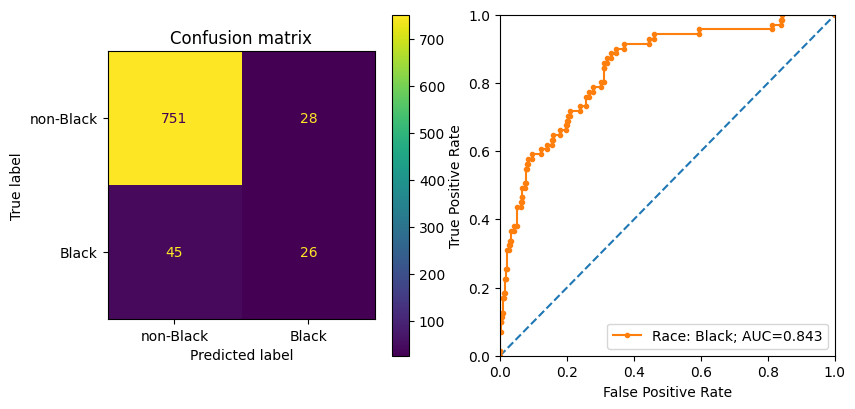

In [286]:
print('SVM')
ycol = 'Black'
clf = svm.SVC(probability=True, class_weight='balanced')
clf.fit(X_train, y_train)
# test
fig,(ax1, ax2) = plt.subplots(1,2,figsize=(8,4))
plt.tight_layout()
ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test, ax=ax1, display_labels=['non-Black','Black'])
_ = ax1.set_title('Confusion matrix')
print('Mean accuracy: %0.4f' % clf.score(X_test, y_test))
auc = get_auc_plot_roc(clf, X_test, y_test.values, 'Race: Black', ax=ax2)

### Find optimal way to choose threshold number of purchases per user

Assume one-hot-encoding

Assume limiting to categories purchased by at least u=20 users.

Test pipeline:

For each p in [10, 20, ...50]

- limit to users with at least p purchases
- test models

In [289]:
# maps {u -> (X_train, X_test, y_train, y_test) }
data_dict = dict()

# models are only trained and validated on TRAINING data
# dicts map {u -> [auc scores for cross-validation] } for each model
lr_results = dict()
svm_results = dict()
mlp_results = dict()

ps = list(range(10, 60, 10))
print(ps)

cats_u = cats_u20

verbose = True
for p in ps:
    print('\n%s' % (datetime.datetime.now()))
    # get categories restricted to those purchased by at least u users
    # get users who purchased at least p distinct products
    p_users = products_per_user[products_per_user >= p].index.tolist()
    ppdf = pp_df[pp_df[RESPONSE_ID].isin(p_users)]
    print('n=%s; p=%s : restricting data to users who purchased %s distinct products' % (len(p_users), p, p))
    X = get_X_one_hot_encoding_for_categories(ppdf, cats_u)
    y = get_y(survey_df, 'Black', X.index)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=0)
    data_dict[p] = (X_train, X_test, y_train, y_test)
    if verbose:        
        print('data partitioned into  80-20 train-test split')
        print('train size = %s' % (len(X_train)))
        print('%s/%s Black in train data\n%s/%s Black in test data\n' % (y_train.sum(),len(y_train),y_test.sum(),len(y_test)))
        # lr
        m = LogisticRegression(class_weight='balanced')
        _accuracy_scores, auc_scores = evaluate_model(m, X_train, y_train)
        lr_results[p] = auc_scores
        print('LR: AUC %.3f (%.3f)' % (np.mean(auc_scores), np.std(auc_scores)))
        # SVM
        m = svm.SVC(probability=True, class_weight='balanced')
        _accuracy_scores, auc_scores = evaluate_model(m, X_train, y_train)
        svm_results[p] = auc_scores
        print('SVM: AUC %.3f (%.3f)' % (np.mean(auc_scores), np.std(auc_scores)))
        # MLP
        m = MLPClassifier(hidden_layer_sizes=(64, 8, 4), solver='sgd')
        _accuracy_scores, auc_scores = evaluate_model(m, X_train, y_train)
        mlp_results[p] = auc_scores
        print('MLP: AUC %.3f (%.3f)' % (np.mean(auc_scores), np.std(auc_scores)))
         

[10, 20, 30, 40, 50]

2024-05-14 10:21:01.240165
n=4910; p=10 : restricting data to users who purchased 10 distinct products
data partitioned into  80-20 train-test split
train size = 3928
343/3928 Black in train data
86/982 Black in test data

LR: AUC 0.742 (0.040)
SVM: AUC 0.777 (0.043)


/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron

/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron

MLP: AUC 0.743 (0.086)

2024-05-14 10:39:22.052284
n=4738; p=20 : restricting data to users who purchased 20 distinct products
data partitioned into  80-20 train-test split
train size = 3790
330/3790 Black in train data
82/948 Black in test data

LR: AUC 0.754 (0.033)
SVM: AUC 0.787 (0.024)


/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron

/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron

MLP: AUC 0.750 (0.088)

2024-05-14 10:56:30.026395
n=4560; p=30 : restricting data to users who purchased 30 distinct products
data partitioned into  80-20 train-test split
train size = 3648
312/3648 Black in train data
78/912 Black in test data

LR: AUC 0.770 (0.040)
SVM: AUC 0.805 (0.034)


/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron

/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron

MLP: AUC 0.773 (0.066)

2024-05-14 11:12:52.363236
n=4411; p=40 : restricting data to users who purchased 40 distinct products
data partitioned into  80-20 train-test split
train size = 3528
299/3528 Black in train data
75/883 Black in test data

LR: AUC 0.766 (0.035)
SVM: AUC 0.794 (0.038)


/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron

/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron

MLP: AUC 0.763 (0.090)

2024-05-14 11:28:10.123811
n=4248; p=50 : restricting data to users who purchased 50 distinct products
data partitioned into  80-20 train-test split
train size = 3398
283/3398 Black in train data
71/850 Black in test data

LR: AUC 0.764 (0.033)
SVM: AUC 0.808 (0.035)


/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron

/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron

MLP: AUC 0.757 (0.107)


LR best: u=30; AUC=0.770


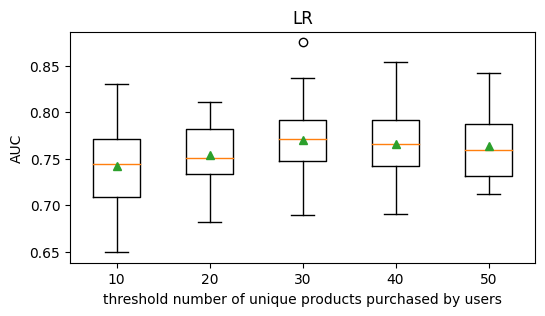

SVM best: u=50; AUC=0.808


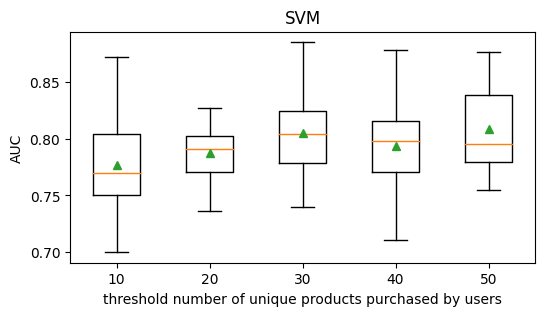

MLP best: u=30; AUC=0.773


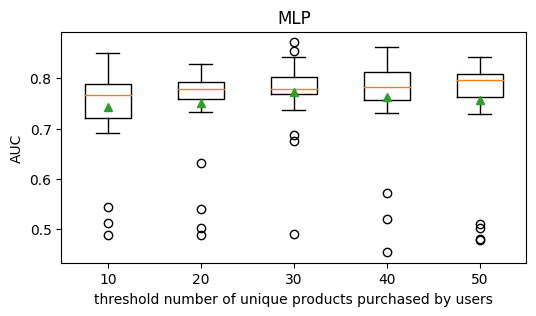

In [291]:
for m_name, m_results in [('LR', lr_results), ('SVM', svm_results), ('MLP', mlp_results)]:
    best_u, best_auc = -1, -1
    for u, aucs in m_results.items():
        if np.mean(aucs) > best_auc:
            best_u = u
            best_auc = np.mean(aucs)
    print('%s best: u=%s; AUC=%0.3f' % (m_name, best_u, best_auc))
    fig, ax = plt.subplots(1,1, figsize=(6,3))
    ax.set_title('%s' % (m_name))
    _ = ax.boxplot(m_results.values(), labels=m_results.keys(), showmeans=True)
    ax.set_ylabel('AUC')
    ax.set_xlabel('threshold number of unique products purchased by users')
    plt.show()

### Find optimal way to limit categories

Assume one-hot-encoding best

Test with a pipeline:

For each u in [20, 40, ...200]
- Limit to list of categories purchased by at least u users
- Test log regression, SVM


In [ ]:
# maps {u -> (X_train, X_test, y_train, y_test) }
data_dict = dict()

# models are only trained and validated on TRAINING data
# dicts map {u -> [auc scores for cross-validation] } for each model
lr_results = dict()
svm_results = dict()
mlp_results = dict()

us = list(range(20, 220, 20))
print(us)

ppdf = pp50u_df

verbose = True
for p in ps:
    print('\n%s' % (datetime.datetime.now()))
    # get categories restricted to those purchased by at least u users
    cats_u = cats_users[cats_users >= u].index.tolist()
    print('u=%s; %s total categories' % (u, len(cats_u)))
    X = get_X_one_hot_encoding_for_categories(ppdf, cats_u)
    y = get_y(survey_df, 'Black', X.index)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=0)
    data_dict[p] = (X_train, X_test, y_train, y_test)        
    print('data partitioned into  80-20 train-test split')
    print('train size = %s' % (len(X_train)))
    print('%s/%s Black in train data\n%s/%s Black in test data\n' % (y_train.sum(),len(y_train),y_test.sum(),len(y_test)))
    # lr
    m = LogisticRegression(class_weight='balanced')
    _accuracy_scores, auc_scores = evaluate_model(m, X_train, y_train)
    lr_results[u] = auc_scores
    print('LR: AUC %.3f (%.3f)' % (np.mean(auc_scores), np.std(auc_scores)))
    # SVM
    m = svm.SVC(probability=True, class_weight='balanced')
    _accuracy_scores, auc_scores = evaluate_model(m, X_train, y_train)
    svm_results[u] = auc_scores
    print('SVM: AUC %.3f (%.3f)' % (np.mean(auc_scores), np.std(auc_scores)))
    # MLP
    m = MLPClassifier(hidden_layer_sizes=(64, 8, 4), solver='sgd')
    _accuracy_scores, auc_scores = evaluate_model(m, X_train, y_train)
    mlp_results[u] = auc_scores
    print('MLP: AUC %.3f (%.3f)' % (np.mean(auc_scores), np.std(auc_scores)))
         

LR best: u=20; AUC=0.764


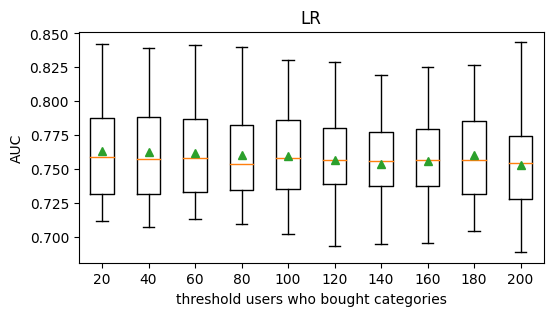

SVM best: u=20; AUC=0.808


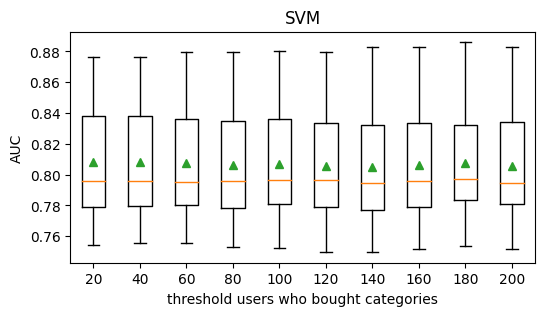

MLP best: u=180; AUC=0.791


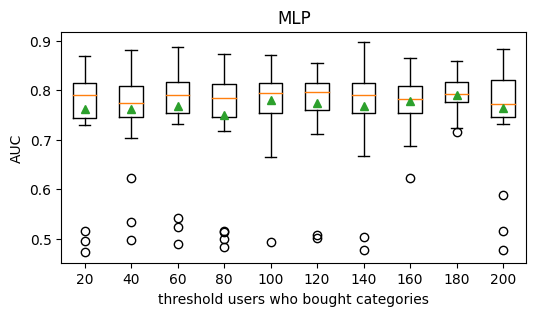

In [280]:
for m_name, m_results in [('LR', lr_results), ('SVM', svm_results), ('MLP', mlp_results)]:
    best_u, best_auc = -1, -1
    for u, aucs in m_results.items():
        if np.mean(aucs) > best_auc:
            best_u = u
            best_auc = np.mean(aucs)
    print('%s best: u=%s; AUC=%0.3f' % (m_name, best_u, best_auc))
    fig, ax = plt.subplots(1,1, figsize=(6,3))
    ax.set_title('%s' % (m_name))
    _ = ax.boxplot(m_results.values(), labels=m_results.keys(), showmeans=True)
    ax.set_ylabel('AUC')
    ax.set_xlabel('threshold users who bought categories')
    plt.show()

### SVD modeling pipeline

Use larger set of categories (and products) in a pipeline that first uses singular value decomposition (SVD) and then regressions/ML.

In [237]:
# evaluate a given model using cross-validation
def evaluate_model(model, X, y):
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    accuracy_scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
    auc_scores = cross_val_score(model, X, y, scoring='roc_auc', cv=cv, n_jobs=-1, error_score='raise')
    return accuracy_scores, auc_scores

def get_model(SVM=True):
    if SVM: return svm.SVC(probability=True, class_weight='balanced')
    return LogisticRegression(class_weight='balanced')

def test_svd_ml_pipeline(X, y, ylabel, n_start=20, n_end=100, n_skip=20, SVM=True, ax=None, verbose=False):
    """
    Tests a pipeline using SVD with n components then model (SVM or logistic regression)
    Uses k-fold cross validation and evaluates mean AUC
    Tests with component n ranging from n_start to n_end
    Plots AUC results
    Returns best n and corresponding AUC score
    """
    model_type = 'SVM' if SVM else 'logistic regression'
    print('%s: %s' % (ylabel, model_type))
    if ax is None:
        fig, ax = plt.subplots(1,1, figsize=(6,3))
    # get the models to evaluate
    models = dict()
    for n in range(n_start, n_end + n_skip, n_skip):
        m = get_model(SVM)
        models[str(n)] = Pipeline(steps=[
            ('svd', TruncatedSVD(n_components=n)), 
            ('m', m)
        ])
    # track best n, best AUC
    best_n, best_AUC = 0, 0
    # evaluate the models and store results
    accuracy_scores_results, auc_scores_results, names = list(), list(), list()
    for name, model in models.items():
        accuracy_scores, auc_scores = evaluate_model(model, X, y)
        accuracy_scores_results.append(accuracy_scores)
        auc_scores_results.append(auc_scores)
        names.append(name)
        if np.mean(auc_scores) > best_AUC:
            if verbose:
                print('new best: n=%s' % name)
                print('>%s accuracy %.3f (%.3f)' % (name, np.mean(accuracy_scores), np.std(accuracy_scores)))
                print('>%s AUC %.3f (%.3f)' % (name, np.mean(auc_scores), np.std(auc_scores)))
            best_n = name
            best_AUC = np.mean(auc_scores)
    # plot model performance for comparison
    ax.set_title('[%s] SVD --> %s' % (ylabel, model_type))
    _ = ax.boxplot(auc_scores_results, labels=names, showmeans=True)
    ax.set_ylabel('AUC')
    ax.set_xlabel('components')
    plt.show()
    return best_n, best_AUC

In [240]:
print('Using all categories in SVD pipeline')
print('X: One-hot-encoded; Y: Black')
X = get_X_one_hot_encoding_for_categories(pp50u_df, cats_all)
y = get_y(survey_df, 'Black', X.index)
print(X.shape, y.shape)
display(X.head(3))
display(y.head(3))

X: One-hot-encoded; Y: Black
(4248, 1857) (4248,)


,ABIS_BOOK,NAN,SHIRT,ELECTRONIC_CABLE,PET_FOOD,NUTRITIONAL_SUPPLEMENT,PANTS,CELLULAR_PHONE_CASE,HEALTH_PERSONAL_CARE,SHOES,...,WATCHES,FUEL_INJECTOR,FOOD_MILL_GRINDER,BABY_FOOD,CHAFING_DISHES,POWER_TRANSFORMER,LCD_GRAPHIC_DISPLAY,POOL_HEATER,SATELLITE_OR_DSS,GOLF_CART
Survey ResponseID,,,,,,,,,,,,,,,,,,,,,
R_zfqnsBzlOAKibzb,1,1,1,1,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
R_zfnsck2ZatnGtY5,1,1,1,1,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
R_zdQYFhfeqyBd2dH,1,1,1,0,0,1,0,1,1,1,...,0,0,0,0,0,0,0,0,0,0


Survey ResponseID
R_zfqnsBzlOAKibzb    1
R_zfnsck2ZatnGtY5    0
R_zdQYFhfeqyBd2dH    0
Name: Black, dtype: int64

In [241]:
print('using k-fold instead of train-test split')
print('%s/%s %s in data' % (y.sum(),len(y), ycol))

using k-fold instead of train-test split
354/4248 Black in data


Black: SVM
new best: n=20
>20 accuracy 0.690 (0.024)
>20 AUC 0.745 (0.037)
new best: n=40
>40 accuracy 0.758 (0.023)
>40 AUC 0.775 (0.039)
new best: n=60
>60 accuracy 0.779 (0.021)
>60 AUC 0.786 (0.037)
new best: n=80
>80 accuracy 0.793 (0.023)
>80 AUC 0.793 (0.037)
new best: n=100
>100 accuracy 0.807 (0.023)
>100 AUC 0.797 (0.038)


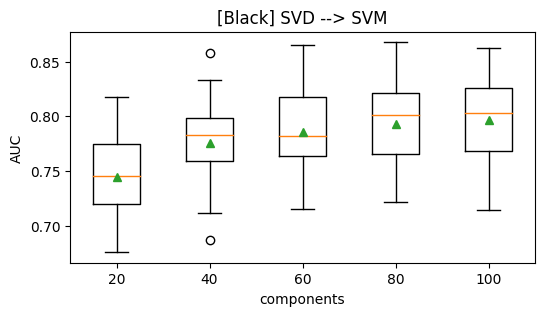

Black
Best: n=100; AUC=0.797


In [242]:
ylabel = 'Black'
best_n, best_AUC = test_svd_ml_pipeline(X, y, ylabel, verbose=True)
print(yCol)
print('Best: n=%s; AUC=%0.3f' % (best_n, best_AUC))

When restricting to categories purchased by at least 20 users

In [253]:
cats_u20 = cats_users[cats_users >= 20].index
cats_users[cats_users >= 20].describe()

count    1534.000000
mean      425.602347
std       510.792153
min        20.000000
25%       104.000000
50%       234.000000
75%       558.000000
max      4203.000000
Name: Survey ResponseID, dtype: float64

In [255]:
print('Using all categories purchasd by >=20 users in SVD pipeline')
print('X: One-hot-encoded; Y: Black')
X = get_X_one_hot_encoding_for_categories(pp50u_df, cats_u20)
y = get_y(survey_df, 'Black', X.index)
print(X.shape, y.shape)
display(X.head(3))
display(y.head(3))

Using all categories purchasd by >=20 users in SVD pipeline
X: One-hot-encoded; Y: Black
(4248, 1534) (4248,)


,NAN,ABIS_BOOK,ELECTRONIC_CABLE,CELLULAR_PHONE_CASE,SHIRT,HEALTH_PERSONAL_CARE,HEADPHONES,CHARGING_ADAPTER,NUTRITIONAL_SUPPLEMENT,PANTS,...,NON_DAIRY_CHEESE,TOPICALS,FASHIONEARRING,HOOKAH,GUN_GRIP,MOTORCYCLE_ACCESSORY,PLASTIC_TUBING,RECEIVER_OR_AMPLIFIER,FINENECKLACEBRACELETANKLET,COOKING_OVEN
Survey ResponseID,,,,,,,,,,,,,,,,,,,,,
R_zfqnsBzlOAKibzb,1,1,1,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
R_zfnsck2ZatnGtY5,1,1,1,1,1,1,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0
R_zdQYFhfeqyBd2dH,1,1,0,1,1,1,1,1,1,0,...,0,0,0,0,0,0,0,0,0,0


Survey ResponseID
R_zfqnsBzlOAKibzb    1
R_zfnsck2ZatnGtY5    0
R_zdQYFhfeqyBd2dH    0
Name: Black, dtype: int64

using k-fold instead of train-test split
354/4248 Black in data
Black: SVM
new best: n=20
>20 accuracy 0.689 (0.024)
>20 AUC 0.747 (0.035)
new best: n=40
>40 accuracy 0.759 (0.025)
>40 AUC 0.776 (0.040)
new best: n=60
>60 accuracy 0.781 (0.020)
>60 AUC 0.787 (0.038)
new best: n=80
>80 accuracy 0.797 (0.018)
>80 AUC 0.794 (0.043)
new best: n=100
>100 accuracy 0.805 (0.022)
>100 AUC 0.798 (0.039)


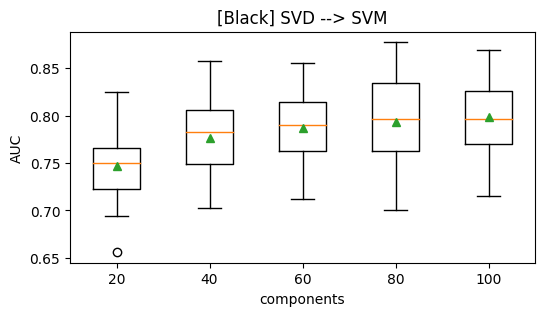

Black
Best: n=100; AUC=0.798


In [256]:
print('using k-fold instead of train-test split')
print('%s/%s %s in data' % (y.sum(),len(y), ycol))
ylabel = 'Black'
best_n, best_AUC = test_svd_ml_pipeline(X, y, ylabel, verbose=True)
print(ylabel)
print('Best: n=%s; AUC=%0.3f' % (best_n, best_AUC))

### Feature vectors with products


Almost all products are only purchased by a few people in our dataset.

Want to restrict features to only use products purchased by a sufficient number of distinct users.

What is the right number? Explore.

In [187]:
print('%s unique product codes in dataset' % pp_df[PRODUCT_CODE].nunique())
print('%s unique product codes when restricting to users with least 50 distinct products purchased' % 
      pp50u_df[PRODUCT_CODE].nunique())

939083 unique product codes in dataset
929322 unique product codes when restricting to users with least 50 distinct products purchased


In [188]:
print('Number of unique purchasers for each product')
products_table[PURCHASERS].describe()

Number of unique purchasers for each product


count    939082.000000
mean          1.651991
std           3.465085
min           1.000000
25%           1.000000
50%           1.000000
75%           1.000000
max        1157.000000
Name: purchasers, dtype: float64

In [189]:
print('Top products by number of distinct purchasers')
products_table.head(10)

Top products by number of distinct purchasers


,purchasers,Category,Title
ASIN/ISBN (Product Code),,,
B00IX1I3G6,1157,GIFT_CARD,Amazon.com Gift Card Balance Reload
B086KKT3RX,875,ABIS_GIFT_CARD,Amazon Reload
B07PCMWTSG,543,GIFT_CARD,Amazon.com eGift Card
B004LLIKVU,467,GIFT_CARD,Amazon.com eGift Card
B07FZ8S74R,377,DIGITAL_DEVICE_3,"Echo Dot (3rd Gen, 2018 release) - Smart speak..."
B00LH3DMUO,366,BATTERY,Amazon Basics 36 Pack AAA High-Performance Alk...
B079QHML21,350,DIGITAL_DEVICE_4,Fire TV Stick 4K streaming device with Alexa V...
B00MNV8E0C,305,BATTERY,Amazon Basics 48 Pack AA High-Performance Alka...
B01MZEEFNX,290,DIGITAL_DEVICE_3_ACCESSORY,"Amazon Smart Plug, works with Alexa – A Certif..."


In [190]:
products_users = pp50u_df.groupby(PRODUCT_CODE)[RESPONSE_ID].nunique().sort_values(ascending=False)
products_users.describe()

count    929322.000000
mean          1.647963
std           3.392901
min           1.000000
25%           1.000000
50%           1.000000
75%           1.000000
max        1088.000000
Name: Survey ResponseID, dtype: float64

Explore: suppose we limited to products purchased by at least n unique purchasers

how does that impact the total number of products and purchases for the given n?

Make a table:
```n, products, purchases```

Plot it

In [191]:
# get total number of products
def get_num_products(df, n_purchasers):
    product_purchasers = df.groupby(
        [PRODUCT_CODE]
    )[RESPONSE_ID].nunique()
    return (product_purchasers > n_purchasers).sum()

def get_num_purchases(df, n_purchasers):
    product_purchasers = df.groupby(
        [PRODUCT_CODE]
    )[RESPONSE_ID].nunique()
    products = product_purchasers[product_purchasers > n_purchasers].index.tolist()
    return df[df[PRODUCT_CODE].isin(products)][PURCHASES].sum()


ns = list(range(10, 210, 10))
n_products_df = pd.DataFrame({
    'n': ns,
    'products': [get_num_products(pp50u_df, n) for n in ns],
    'purchases': [get_num_purchases(pp50u_df, n) for n in ns],
}).set_index('n')

In [192]:
n_products_df.head()

,products,purchases
n,,
10,10630,337827
20,3295,196026
30,1451,131519
40,786,98582
50,482,78862


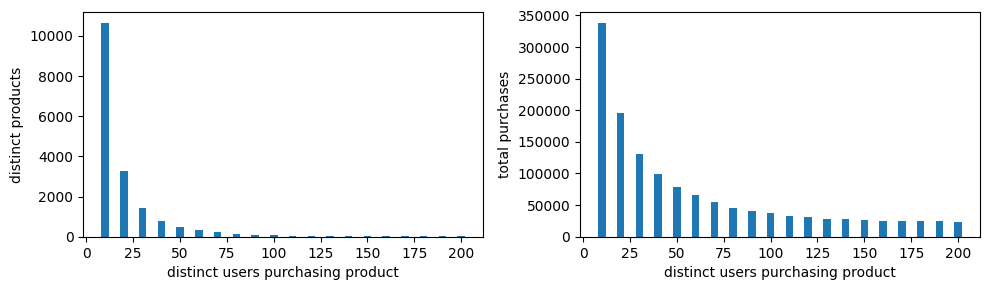

In [215]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10, 3))
_ = ax1.bar(ns, n_products_df['products'], 4, align='center')
_ = ax2.bar(ns, n_products_df['purchases'], 4, align='center')
ax1.set_xlabel('distinct users purchasing product')
ax2.set_xlabel('distinct users purchasing product')
ax1.set_ylabel('distinct products')
ax2.set_ylabel('total purchases')
plt.tight_layout()

In [216]:
n2s = [2**i for i in range(7)]
n2_products_df = pd.DataFrame({
    'n': n2s,
    'products': [get_num_products(pp50u_df, n) for n in n2s],
    'purchases': [get_num_purchases(pp50u_df, n) for n in n2s],
}).set_index('n')

In [217]:
n2_products_df.head()

,products,purchases
n,,
1,192425,1028931
2,92785,799388
4,39920,585455
8,14981,392331
16,4935,236411


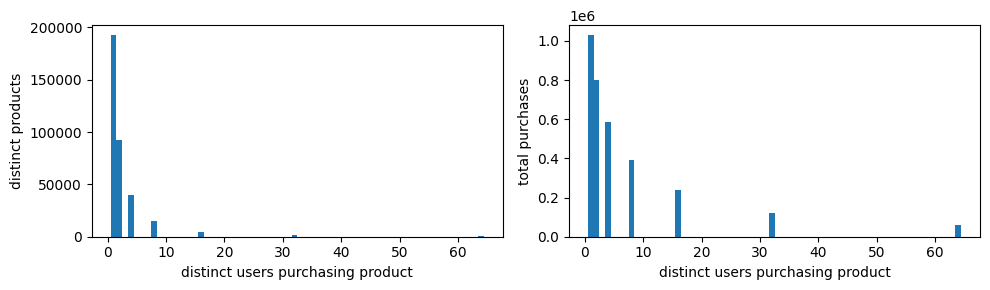

In [218]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10, 3))
_ = ax1.bar(n2s, n2_products_df['products'], 1, align='center')
_ = ax2.bar(n2s, n2_products_df['purchases'], 1, align='center')
ax1.set_xlabel('distinct users purchasing product')
ax2.set_xlabel('distinct users purchasing product')
ax1.set_ylabel('distinct products')
ax2.set_ylabel('total purchases')
plt.tight_layout()

## Make feature vectors with products

Initially start with products purchased by 30 distinct purchasers 

Test 40 distinct purchasers

In [219]:
prod_n = 40
print('Restricting analysis to products purchased by n=%s distinct purchasers' % prod_n)
display(products_users[products_users >= prod_n].describe())
products_u40 = products_users[products_users >= prod_n].index

Restricting analysis to products purchased by n=40 distinct purchasers


count     828.000000
mean       67.880435
std        59.564940
min        40.000000
25%        45.000000
50%        54.000000
75%        73.000000
max      1088.000000
Name: Survey ResponseID, dtype: float64

Multiple ways we define feature vectors:

a. One-hot-encode (was the item ever purchased)

b. By relative purchases: Each element x_i is a fraction representing how many times item ever purchased by user, divided by total number of purchases (restricted to products list)


In [220]:
def get_product_one_hot_encoding(ppdf, product):
    """
    Returns vector representing all response IDs in preprocessed df. 
    1/0 indicates whether ResponseId ever purchased product.
    """
    return ((ppdf[ppdf[PRODUCT_CODE]==product]
             .groupby(RESPONSE_ID)[PURCHASES].count() > 0)
            .reindex(ppdf[RESPONSE_ID].unique()).fillna(0).astype(int))

def get_X_one_hot_encoding_for_products(ppdf, prods):
    X_dict = {prod: get_product_one_hot_encoding(ppdf, prod) for prod in prods}
    X_dict[RESPONSE_ID] = ppdf[RESPONSE_ID].unique()
    return pd.DataFrame(X_dict).set_index(RESPONSE_ID)

def get_product_relative_purchases(ppdf, product):
    """
    Returns relative purchases for product for each ResponseId in preprocessed df.
    """
    return ((ppdf[ppdf[PRODUCT_CODE]==product].groupby([RESPONSE_ID])[PURCHASES].sum()\
            /ppdf.groupby([RESPONSE_ID])[PURCHASES].sum()).fillna(0)
            .reindex(ppdf[RESPONSE_ID].unique())).to_list()

def get_X_relative_purchases_for_products(ppdf, prods):
    pdf = ppdf[ppdf[PRODUCT_CODE].isin(prods)]
    X_dict = {p: get_product_relative_purchases(pdf, p) for p in prods}
    X_dict[RESPONSE_ID] = pdf[RESPONSE_ID].unique()
    return pd.DataFrame(X_dict).set_index(RESPONSE_ID)


### Modeling

#### a. one-hot-encode (products)

In [118]:
print('X: One-hot-encoded; Y: Black')
X = get_X_one_hot_encoding_for_products(pp50u_df, products_u40)
y = get_y(survey_df, 'Black', X.index)
print(X.shape, y.shape)
display(X.head(3))
display(y.head(3))

X: One-hot-encoded; Y: Black
(4248, 828) (4248,)


,B00IX1I3G6,B086KKT3RX,B07PCMWTSG,B004LLIKVU,B07FZ8S74R,B00LH3DMUO,B079QHML21,B00MNV8E0C,B01MZEEFNX,B0791TX5P5,...,B00SCO8AA8,0735219095,B0932QJ2JZ,B01M0H7YC2,B07CVL2D2S,B07P76HM3B,1250181909,1668001225,B003VAHYQY,B013IJPTFK
Survey ResponseID,,,,,,,,,,,,,,,,,,,,,
R_zfqnsBzlOAKibzb,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
R_zfnsck2ZatnGtY5,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
R_zdQYFhfeqyBd2dH,0,0,0,0,0,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


Survey ResponseID
R_zfqnsBzlOAKibzb    1
R_zfnsck2ZatnGtY5    0
R_zdQYFhfeqyBd2dH    0
Name: Black, dtype: int64

In [119]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=43)

print('data partitioned into  80-20 train-test split')
print('train size = %s; test size = %s' % (len(X_train), len(X_test)))
print('%s/%s Black in train data\n%s/%s Black in test data' % (y_train.sum(),len(y_train),y_test.sum(),len(y_test)))

data partitioned into  80-20 train-test split
train size = 3398; test size = 850
278/3398 Black in train data
76/850 Black in test data


Logistic regression
Mean accuracy: 0.7847
ROC AUC=0.561


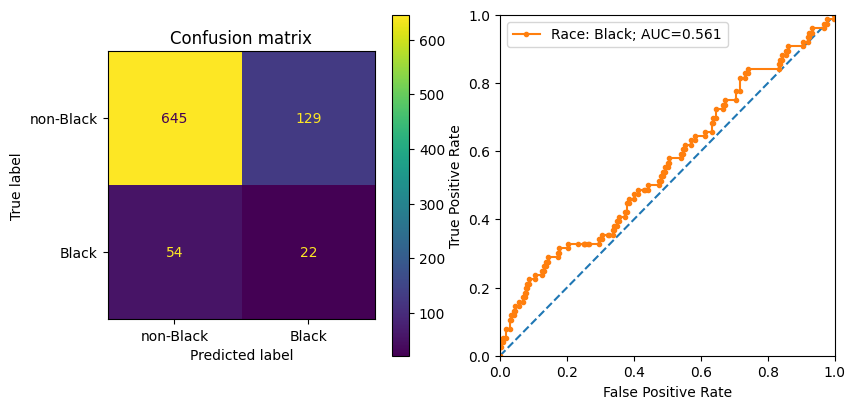

In [120]:
print('Logistic regression')
ycol = 'Black'
# train
clf = LogisticRegression(class_weight='balanced')
clf.fit(X_train, y_train)
# test
fig,(ax1, ax2) = plt.subplots(1,2,figsize=(8,4))
plt.tight_layout()
ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test, ax=ax1, display_labels=['non-%s'%ycol, ycol])
_ = ax1.set_title('Confusion matrix')
print('Mean accuracy: %0.4f' % clf.score(X_test, y_test))
auc = get_auc_plot_roc(clf, X_test, y_test.values, 'Race: Black', ax=ax2)

SVM
Mean accuracy: 0.8741
ROC AUC=0.579


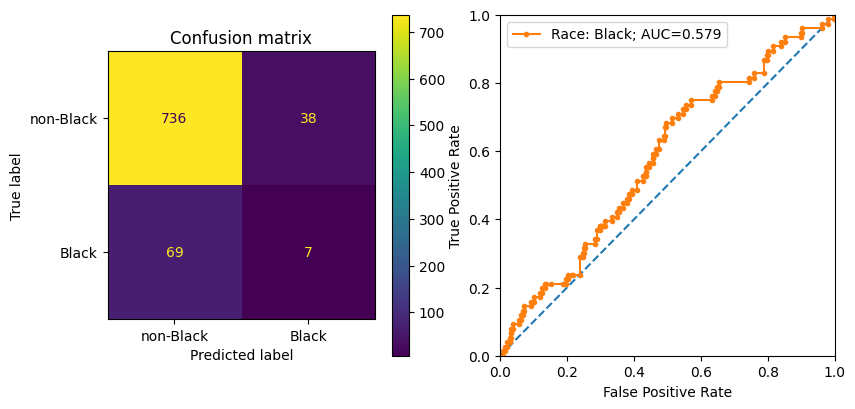

In [121]:
print('SVM')
ycol = 'Black'
clf = svm.SVC(kernel='rbf',probability=True, class_weight='balanced') # using radial-like kernal
clf.fit(X_train, y_train)
# test
fig,(ax1, ax2) = plt.subplots(1,2,figsize=(8,4))
plt.tight_layout()
ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test, ax=ax1, display_labels=['non-%s'%ycol, ycol])
_ = ax1.set_title('Confusion matrix')
print('Mean accuracy: %0.4f' % clf.score(X_test, y_test))
auc = get_auc_plot_roc(clf, X_test, y_test.values, 'Race: Black', ax=ax2)

MLP
Mean accuracy: 0.9106
ROC AUC=0.502


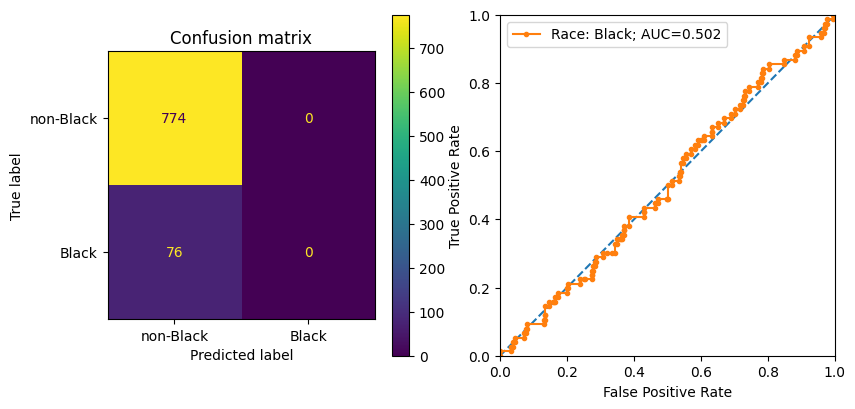

In [122]:
print('MLP')
clf = MLPClassifier(hidden_layer_sizes=(64, 8, 4), solver='sgd')
clf.fit(X_train, y_train)
fig,(ax1, ax2) = plt.subplots(1,2,figsize=(8,4))
plt.tight_layout()
ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test, ax=ax1, display_labels=['non-%s'%ycol, ycol])
_ = ax1.set_title('Confusion matrix')
print('Mean accuracy: %0.4f' % clf.score(X_test, y_test))
auc = get_auc_plot_roc(clf, X_test, y_test.values, 'Race: Black', ax=ax2)

#### b. Relative purchases (by products)

In [123]:
print('X: One-hot-encoded; Y: Black')
X = get_X_relative_purchases_for_products(pp50u_df, products_u40)
y = get_y(survey_df, 'Black', X.index)
print(X.shape, y.shape)
display(X.head(3))
display(y.head(3))

X: One-hot-encoded; Y: Black
(4156, 828) (4156,)


,B00IX1I3G6,B086KKT3RX,B07PCMWTSG,B004LLIKVU,B07FZ8S74R,B00LH3DMUO,B079QHML21,B00MNV8E0C,B01MZEEFNX,B0791TX5P5,...,B00SCO8AA8,0735219095,B0932QJ2JZ,B01M0H7YC2,B07CVL2D2S,B07P76HM3B,1250181909,1668001225,B003VAHYQY,B013IJPTFK
Survey ResponseID,,,,,,,,,,,,,,,,,,,,,
R_zfqnsBzlOAKibzb,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
R_zfnsck2ZatnGtY5,0.133333,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.033333,0.0,0.0
R_zdQYFhfeqyBd2dH,0.000000,0.0,0.0,0.0,0.0,0.117647,0.0,0.058824,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0


Survey ResponseID
R_zfqnsBzlOAKibzb    1
R_zfnsck2ZatnGtY5    0
R_zdQYFhfeqyBd2dH    0
Name: Black, dtype: int64

In [124]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=43)

print('data partitioned into  80-20 train-test split')
print('train size = %s; test size = %s' % (len(X_train), len(X_test)))
print('%s/%s Black in train data\n%s/%s Black in test data' % (y_train.sum(),len(y_train),y_test.sum(),len(y_test)))

data partitioned into  80-20 train-test split
train size = 3324; test size = 832
274/3324 Black in train data
71/832 Black in test data


Logistic regression
Mean accuracy: 0.7548
ROC AUC=0.661


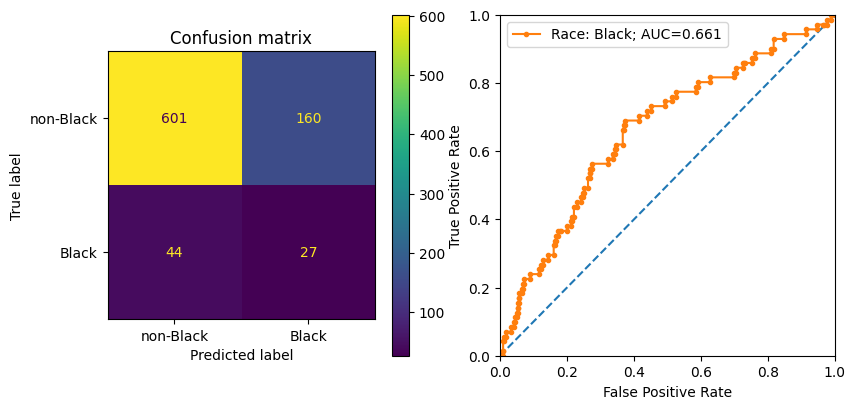

In [125]:
print('Logistic regression')
ycol = 'Black'
# train
clf = LogisticRegression(class_weight='balanced')
clf.fit(X_train, y_train)
# test
fig,(ax1, ax2) = plt.subplots(1,2,figsize=(8,4))
plt.tight_layout()
ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test, ax=ax1, display_labels=['non-%s'%ycol, ycol])
_ = ax1.set_title('Confusion matrix')
print('Mean accuracy: %0.4f' % clf.score(X_test, y_test))
auc = get_auc_plot_roc(clf, X_test, y_test.values, 'Race: Black', ax=ax2)

SVM
Mean accuracy: 0.8714
ROC AUC=0.671


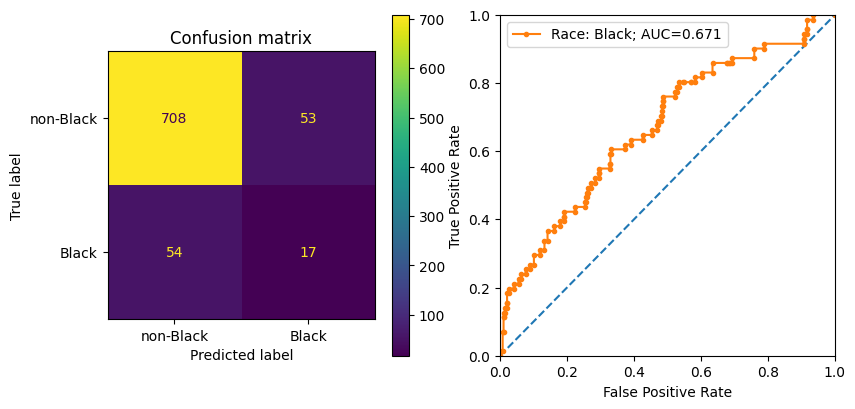

In [126]:
print('SVM')
ycol = 'Black'
clf = svm.SVC(kernel='rbf',probability=True, class_weight='balanced') # using radial-like kernal
clf.fit(X_train, y_train)
# test
fig,(ax1, ax2) = plt.subplots(1,2,figsize=(8,4))
plt.tight_layout()
ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test, ax=ax1, display_labels=['non-%s'%ycol, ycol])
_ = ax1.set_title('Confusion matrix')
print('Mean accuracy: %0.4f' % clf.score(X_test, y_test))
auc = get_auc_plot_roc(clf, X_test, y_test.values, 'Race: Black', ax=ax2)

MLP
Mean accuracy: 0.9147
ROC AUC=0.458


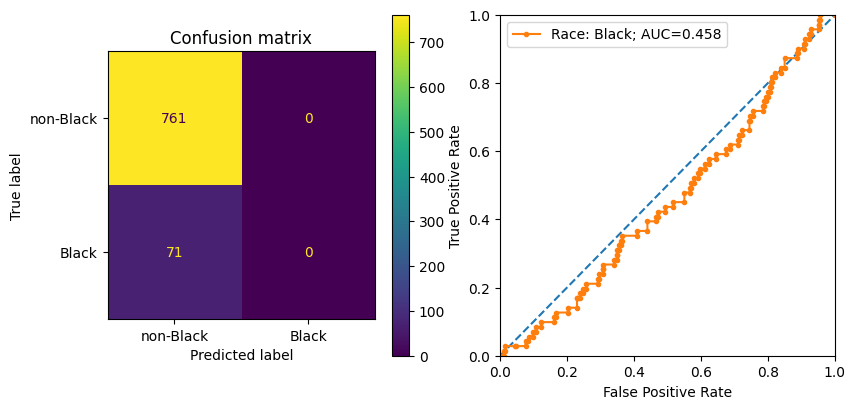

In [127]:
print('MLP')
clf = MLPClassifier(hidden_layer_sizes=(64, 8, 4), solver='sgd')
clf.fit(X_train, y_train)
fig,(ax1, ax2) = plt.subplots(1,2,figsize=(8,4))
plt.tight_layout()
ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test, ax=ax1, display_labels=['non-%s'%ycol, ycol])
_ = ax1.set_title('Confusion matrix')
print('Mean accuracy: %0.4f' % clf.score(X_test, y_test))
auc = get_auc_plot_roc(clf, X_test, y_test.values, 'Race: Black', ax=ax2)

### Using SVD with larger set of products

In [221]:
prod_n = 16
print('Restricting analysis to products purchased by n=%s distinct purchasers' % prod_n)
display(products_users[products_users >= prod_n].describe())
products_u16 = products_users[products_users >= prod_n].index

Restricting analysis to products purchased by n=16 distinct purchasers


count    5513.000000
mean       29.460366
std        28.717196
min        16.000000
25%        18.000000
50%        23.000000
75%        31.000000
max      1088.000000
Name: Survey ResponseID, dtype: float64

##### A. SVD and one-hot-encoding (products)

In [223]:
print('X: One-hot-encoded; Y: Black')
X = get_X_one_hot_encoding_for_products(pp50u_df, products_u16)
y = get_y(survey_df, 'Black', X.index)
print(X.shape, y.shape)
display(X.head(3))
display(y.head(3))

X: One-hot-encoded; Y: Black
(4248, 5513) (4248,)


,B00IX1I3G6,B086KKT3RX,B07PCMWTSG,B004LLIKVU,B07FZ8S74R,B00LH3DMUO,B079QHML21,B00MNV8E0C,B01MZEEFNX,B0791TX5P5,...,1452111731,B00ZB7W4QU,B0058P6PZ6,B07BTS2KWK,B074ZHCLMD,B004H6MUDI,B004220C6E,B009MGKQ0W,B003EM6AQE,B07G3G3F53
Survey ResponseID,,,,,,,,,,,,,,,,,,,,,
R_zfqnsBzlOAKibzb,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
R_zfnsck2ZatnGtY5,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
R_zdQYFhfeqyBd2dH,0,0,0,0,0,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


Survey ResponseID
R_zfqnsBzlOAKibzb    1
R_zfnsck2ZatnGtY5    0
R_zdQYFhfeqyBd2dH    0
Name: Black, dtype: int64

In [224]:
print('using k-fold instead of train-test split')
print('%s/%s %s in data' % (y.sum(),len(y), ycol))

using k-fold instead of train-test split
354/4248 Black in data


Black: SVM
models for n components [20, 40, 60, 80, 100]
n 20
n 40
n 60
n 80
n 100
20
new best: n=20
>20 accuracy 0.599 (0.026)
>20 AUC 0.636 (0.045)
40
new best: n=40
>40 accuracy 0.631 (0.026)
>40 AUC 0.650 (0.051)
60
new best: n=60
>60 accuracy 0.639 (0.021)
>60 AUC 0.651 (0.053)
80
new best: n=80
>80 accuracy 0.658 (0.023)
>80 AUC 0.655 (0.048)
100
new best: n=100
>100 accuracy 0.662 (0.029)
>100 AUC 0.656 (0.055)


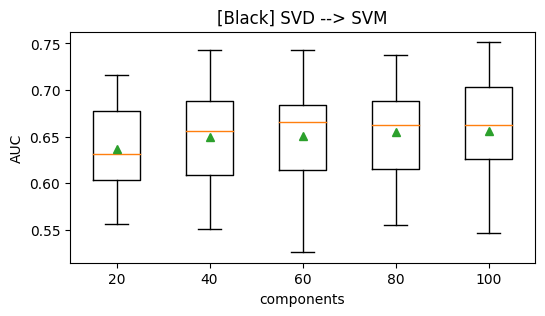

Black
Best: n=100; AUC=0.656


In [236]:
yCol = 'Black'
best_n, best_AUC = test_svd_ml_pipeline(X, y, yCol, verbose=True)
print(yCol)
print('Best: n=%s; AUC=%0.3f' % (best_n, best_AUC))